In [4]:
import os
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =========================================================
# 0. 공통 설정
# =========================================================
DATA_ROOT = r"C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01"
CSV_PATH  = os.path.join(DATA_ROOT, "depth_0p0.csv")

# 대시보드에서처럼 1 / 7 / 30일 RMSE 계산
HORIZON_DAYS = [1, 7, 30]
MAX_H = max(HORIZON_DAYS)

# --- ARIMA 하이퍼파라미터 후보들 ---
# 필요하면 여러 개 넣어서 비교할 수 있음
ARIMA_CONFIGS = [
    {"order": (1, 1, 1)},  # 예: ARIMA(1,1,1)
    # {"order": (2, 1, 2)},  # 더 테스트해보고 싶으면 추가
]

# --- t0 / input 세팅 ---
# input : history 길이(일). 대시보드 표에서 'input' 열에 해당
INPUT_LIST = [30]          # 30일 history
# t0는 자동 랜덤 샘플링으로 만들 거라 여기서는 따로 안 적어도 됨


# =========================================================
# 1. depth_0p0.csv → daily SST tensor (nY, nX, nD)
# =========================================================
def build_daily_tensor(csv_path):
    df = pd.read_csv(csv_path)

    # depth 제거
    if "depth" in df.columns:
        df = df.drop(columns=["depth"])

    # time / lat / lon / temp 컬럼 찾기
    cols = df.columns
    time_col = [c for c in cols if "time" in c.lower()][0]
    lat_col  = [c for c in cols if "lat"  in c.lower()][0]
    lon_col  = [c for c in cols if "lon"  in c.lower()][0]
    temp_candidates = [c for c in cols if c not in [time_col, lat_col, lon_col]]
    temp_col = temp_candidates[0]

    print("사용 컬럼:", time_col, lat_col, lon_col, temp_col)

    _data = pd.DataFrame({
        "time": df[time_col],
        "lat":  df[lat_col].astype(float).round(2),
        "lon":  df[lon_col].astype(float).round(2),
        "temp": df[temp_col],
    })

    _data["time"] = pd.to_datetime(_data["time"])
    _data = _data.sort_values("time").reset_index(drop=True)

    # 3시간 → 날짜로 내림
    _data["date"] = _data["time"].dt.floor("D")

    # 날짜 / 위도 / 경도별 일평균
    daily = (_data.groupby(["date", "lat", "lon"], as_index=False)["temp"]
             .mean()
             .sort_values("date")
             .reset_index(drop=True))

    D = pd.DatetimeIndex(daily["date"].unique()).sort_values()
    Y = np.sort(daily["lat"].unique())
    X = np.sort(daily["lon"].unique())

    nD = len(D)
    nY_full = len(Y)
    nX_full = len(X)
    print(f"daily 길이 nD={nD}, nY={nY_full}, nX={nX_full}")

    # 위도 downsample (2칸마다 하나)
    Y_ds = Y[::2]
    nY = len(Y_ds)
    X_ds = X.copy()
    nX = len(X_ds)
    print(f"downsample 후 grid: nY={nY}, nX={nX}")

    d_map = {d: i for i, d in enumerate(D)}
    y_map = {y: i for i, y in enumerate(Y_ds)}
    x_map = {x: i for i, x in enumerate(X_ds)}

    tnsr_daily = np.full((nY, nX, nD), np.nan, dtype=float)
    for _, row in daily.iterrows():
        lat = float(row["lat"])
        lon = float(row["lon"])
        if lat in y_map and lon in x_map:
            iy = y_map[lat]
            ix = x_map[lon]
            idd = d_map[row["date"]]
            tnsr_daily[iy, ix, idd] = float(row["temp"])

    print("tnsr_daily shape:", tnsr_daily.shape)
    return tnsr_daily, D, Y_ds, X_ds


# =========================================================
# 2. t0를 자동으로 랜덤 샘플링
# =========================================================
def sample_t0_indices(nD, input_len, max_h, n_samples=100, seed=0):
    """
    nD       : 전체 날짜 개수
    input_len: history 길이 (일)
    max_h    : 가장 긴 리드타임 (일)
    n_samples: 뽑을 t0 개수
    """
    rng = np.random.default_rng(seed)

    t0_min = input_len              # history 만큼 확보
    t0_max = nD - max_h - 1         # t0+max_h <= nD-1

    if t0_max <= t0_min:
        raise ValueError("데이터 길이보다 input 또는 horizon 이 너무 깁니다.")

    cand = np.arange(t0_min, t0_max + 1)
    if n_samples >= len(cand):
        return np.sort(cand)

    t0_list = rng.choice(cand, size=n_samples, replace=False)
    return np.sort(t0_list)


# =========================================================
# 3. 하나의 (ARIMA, t0, input)에 대해 rmse1/7/30 계산
# =========================================================
def eval_arima_one_config(
    tnsr_daily,
    dates,
    order,
    t0,
    input_len,
    horizons=HORIZON_DAYS,
):
    """
    tnsr_daily: (nY, nX, nD)
    dates     : DatetimeIndex (길이 nD)
    order     : ARIMA (p,d,q)
    t0        : 예측 시작 index (이 날 직전까지 history)
    input_len : history 길이
    """
    nY, nX, nD = tnsr_daily.shape
    max_h = max(horizons)

    start = t0 - input_len
    end   = t0 - 1  # inclusive

    if start < 0 or t0 + max_h >= nD:
        raise ValueError(f"t0={t0}, input={input_len} 설정이 범위를 벗어남.")

    # SSE / count 누적
    sse = {h: 0.0 for h in horizons}
    cnt = {h: 0   for h in horizons}

    for iy in range(nY):
        for ix in range(nX):
            series = tnsr_daily[iy, ix, :]

            hist = series[start:end+1]
            valid_hist = ~np.isnan(hist)
            if valid_hist.sum() < max(10, input_len // 2):
                continue

            s = pd.Series(hist).replace([np.inf, -np.inf], np.nan)
            s = s.interpolate(limit_direction="both")

            try:
                model = SARIMAX(
                    s.values,
                    order=order,
                    seasonal_order=(0, 0, 0, 0),  # 계절성 없음
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                )
                res = model.fit(disp=False)
                fc = res.get_forecast(steps=max_h)
                yhat = np.asarray(fc.predicted_mean)
            except Exception:
                last = s.values[-1]
                yhat = np.full(max_h, last, dtype=float)

            true_all = series[t0+1 : t0+max_h+1]

            for h in horizons:
                true_block = true_all[:h]
                pred_block = yhat[:h]
                mask = ~np.isnan(true_block)
                if not mask.any():
                    continue

                diff = true_block[mask] - pred_block[mask]
                sse[h] += np.sum(diff**2)
                cnt[h] += mask.sum()

    rmse = {}
    for h in horizons:
        if cnt[h] > 0:
            rmse[h] = np.sqrt(sse[h] / cnt[h])
        else:
            rmse[h] = np.nan
    return rmse


# =========================================================
# 4. 전체 실험 루프 → dashboard DataFrame
# =========================================================
tnsr_daily, D, Y_ds, X_ds = build_daily_tensor(CSV_PATH)
nD = len(D)

results = []

for cfg in ARIMA_CONFIGS:
    order = cfg["order"]
    for inp in INPUT_LIST:
        # 이 input 길이에 대해 t0 자동 샘플링
        t0_list = sample_t0_indices(
            nD, inp, MAX_H,
            n_samples=100,  # t0 개수 (시간 줄이고 싶으면 10 같은 걸로 줄이기)
            seed=42
        )
        print(f"\n=== ARIMA{order}, input={inp}d, t0 samples={len(t0_list)} ===")

        for t0 in t0_list:
            rmse = eval_arima_one_config(
                tnsr_daily,
                D,
                order=order,
                t0=int(t0),
                input_len=inp,
                horizons=HORIZON_DAYS,
            )
            row = {
                "Model": "ARIMA",
                "Hyperparameter": f"ARIMA{order}",
                "t0": int(t0),
                "input": inp,
                "rmse1": rmse[1],
                "rmse7": rmse[7],
                "rmse30": rmse[30],
            }
            results.append(row)
            print(row)

df_dashboard = pd.DataFrame(results)
print("\n=== ARIMA dashboard ===")
print(df_dashboard.head())

# CSV 저장
out_csv = os.path.join(DATA_ROOT, "dashboard_arima.csv")
df_dashboard.to_csv(out_csv, index=False)
print("저장:", out_csv)

# 마크다운 테이블로 보고 싶으면:
print("\nMarkdown table:\n")
print(df_dashboard.to_markdown(index=False, floatfmt=".3f"))


사용 컬럼: time lat lon water_temp
daily 길이 nD=1125, nY=25, nX=10
downsample 후 grid: nY=13, nX=10
tnsr_daily shape: (13, 10, 1125)

=== ARIMA(1, 1, 1), input=30d, t0 samples=100 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 74, 'input': 30, 'rmse1': np.float64(0.7277961757453939), 'rmse7': np.float64(0.8449643806842595), 'rmse30': np.float64(1.4308188781835507)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 93, 'input': 30, 'rmse1': np.float64(1.1506121522077517), 'rmse7': np.float64(1.1908963641263208), 'rmse30': np.float64(1.3893832962307784)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 98, 'input': 30, 'rmse1': np.float64(0.804830233626858), 'rmse7': np.float64(1.2072342888617973), 'rmse30': np.float64(1.1604485281109274)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 108, 'input': 30, 'rmse1': np.float64(0.9355271146524394), 'rmse7': np.float64(1.504946812322264), 'rmse30': np.float64(2.4074851275957028)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 113, 'input': 30, 'rmse1': np.float64(0.93604693168905), 'rmse7': np.float64(1.0260942318428978), 'rmse30': np.float64(2.0276673834281933)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 116, 'input': 30, 'rmse1': np.float64(0.7748452574007838), 'rmse7': np.float64(0.8855886995762409), 'rmse30': np.float64(1.7240219973

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 121, 'input': 30, 'rmse1': np.float64(0.7868304523664533), 'rmse7': np.float64(1.0559302577123448), 'rmse30': np.float64(1.7925755560921697)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 132, 'input': 30, 'rmse1': np.float64(0.8255378240215776), 'rmse7': np.float64(1.4495369473035298), 'rmse30': np.float64(2.2120089525605304)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 155, 'input': 30, 'rmse1': np.float64(0.6922043002564552), 'rmse7': np.float64(0.7201896303224967), 'rmse30': np.float64(2.678057954002041)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 164, 'input': 30, 'rmse1': np.float64(0.4098852834924897), 'rmse7': np.float64(1.5919654425987575), 'rmse30': np.float64(2.8750684354095317)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 178, 'input': 30, 'rmse1': np.float64(0.6147735625065862), 'rmse7': np.float64(1.9876114917441183), 'rmse30': np.float64(2.0760296647391305)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 187, 'input': 30, 'rmse1': np.float64(2.2026119117424154), 'rmse7': np.float64(1.8871055655057554), 'rmse30': np.float64(2.85031

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 226, 'input': 30, 'rmse1': np.float64(0.7180608363018678), 'rmse7': np.float64(0.9263147620166609), 'rmse30': np.float64(1.220476122800481)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 227, 'input': 30, 'rmse1': np.float64(0.5170153052265247), 'rmse7': np.float64(0.9297729585753748), 'rmse30': np.float64(1.2041816478207206)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 256, 'input': 30, 'rmse1': np.float64(0.6119416259263175), 'rmse7': np.float64(1.111089256866277), 'rmse30': np.float64(1.4859518007464954)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 266, 'input': 30, 'rmse1': np.float64(0.8739372474960596), 'rmse7': np.float64(1.065924044992579), 'rmse30': np.float64(1.5197465934753076)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 284, 'input': 30, 'rmse1': np.float64(0.7385887025054423), 'rmse7': np.float64(1.3254990306964913), 'rmse30': np.float64(2.9090175128328695)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 307, 'input': 30, 'rmse1': np.float64(0.6671749092098667), 'rmse7': np.float64(0.8449529871678846), 'rmse30': np.float64(2.4226502498233247)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 335, 'input': 30, 'rmse1': np.float64(0.6862667791479816), 'rmse7': np.float64(1.2512090417545072), 'rmse30': np.float64(2.500019724378656)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 358, 'input': 30, 'rmse1': np.float64(0.4129449327649422), 'rmse7': np.float64(0.616540238793511), 'rmse30': np.float64(1.2692114061469455)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 365, 'input': 30, 'rmse1': np.float64(0.6542386729098398), 'rmse7': np.float64(0.8757690512348447), 'rmse30': np.float64(1.7032898440173687)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 374, 'input': 30, 'rmse1': np.float64(0.5789916448176237), 'rmse7': np.float64(0.8339131801174652), 'rmse30': np.float64(1.9775914332092288)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 387, 'input': 30, 'rmse1': np.float64(0.7361192774939566), 'rmse7': np.float64(0.9932414146174519), 'rmse30': np.float64(1.8266463563160933)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 395, 'input': 30, 'rmse1': np.float64(0.5035884556575179), 'rmse7': np.float64(0.9734591674836737), 'rmse30': np.float64(1.5458055158524424)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 400, 'input': 30, 'rmse1': np.float64(0.58046577205764), 'rmse7': np.float64(0.91350502043928), 'rmse30': np.float64(1.0680490428332077)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 406, 'input': 30, 'rmse1': np.float64(0.41221272979668416), 'rmse7': np.float64(0.5749201300243256), 'rmse30': np.float64(0.9568125240784212)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 412, 'input': 30, 'rmse1': np.float64(0.48599033768733113), 'rmse7': np.float64(0.6379181937109805), 'rmse30': np.float64(1.1084025265508173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 429, 'input': 30, 'rmse1': np.float64(1.1693283901882707), 'rmse7': np.float64(1.1701665187994232), 'rmse30': np.float64(1.8295697523764176)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 440, 'input': 30, 'rmse1': np.float64(0.6748795493849891), 'rmse7': np.float64(1.1570821531992401), 'rmse30': np.float64(2.2644449646099116)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 450, 'input': 30, 'rmse1': np.float64(0.5231621367409168), 'rmse7': np.float64(1.1483378818009653), 'rmse30': np.float64(1.6223513036124857)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 453, 'input': 30, 'rmse1': np.float64(0.6768751732662016), 'rmse7': np.float64(1.2451437783581998), 'rmse30': np.float64(1.9350787008272547)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 455, 'input': 30, 'rmse1': np.float64(1.2505999806206634), 'rmse7': np.float64(0.9796386119320051), 'rmse30': np.float64(1.753585375284168)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 471, 'input': 30, 'rmse1': np.float64(0.6214968322937965), 'rmse7': np.float64(1.177481257037512), 'rmse30': np.float64(1.6599079695127283)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 473, 'input': 30, 'rmse1': np.float64(1.5179161631586433), 'rmse7': np.float64(0.9649995535748451), 'rmse30': np.float64(1.5092498672218417)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 478, 'input': 30, 'rmse1': np.float64(0.8528140987153476), 'rmse7': np.float64(1.364339152673865), 'rmse30': np.float64(1.9924375826679241)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 481, 'input': 30, 'rmse1': np.float64(1.0693633864000804), 'rmse7': np.float64(1.0667451266605499), 'rmse30': np.float64(1.9368825979003677)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 487, 'input': 30, 'rmse1': np.float64(0.7909068871649555), 'rmse7': np.float64(0.8917927204541143), 'rmse30': np.float64(2.7584372707670584)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 489, 'input': 30, 'rmse1': np.float64(0.6179580885489796), 'rmse7': np.float64(0.7477194691433027), 'rmse30': np.float64(2.6016217037350313)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 505, 'input': 30, 'rmse1': np.float64(0.8807201730617347), 'rmse7': np.float64(1.6194022249113587), 'rmse30': np.float64(3.429794568421986)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 510, 'input': 30, 'rmse1': np.float64(0.7948517093352786), 'rmse7': np.float64(1.748941577069642), 'rmse30': np.float64(2.620050275242812)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 515, 'input': 30, 'rmse1': np.float64(0.995174291382489), 'rmse7': np.float64(1.3257231699190832), 'rmse30': np.float64(4.599551055185852)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 523, 'input': 30, 'rmse1': np.float64(0.7433932781488117), 'rmse7': np.float64(0.9067120311012673), 'rmse30': np.float64(1.9395894763646824)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 525, 'input': 30, 'rmse1': np.float64(0.8119192219297227), 'rmse7': np.float64(1.2326654185006654), 'rmse30': np.float64(2.125165660730346)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 533, 'input': 30, 'rmse1': np.float64(0.4383753851109003), 'rmse7': np.float64(1.255527861441356), 'rmse30': np.float64(2.972779626128077)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 537, 'input': 30, 'rmse1': np.float64(0.7630521397268142), 'rmse7': np.float64(3.350153612147355), 'rmse30': np.float64(3.0799098804584326)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 543, 'input': 30, 'rmse1': np.float64(1.3877240906222679), 'rmse7': np.float64(2.6540320765786163), 'rmse30': np.float64(6.584931870987714)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 572, 'input': 30, 'rmse1': np.float64(3.9861549842448367), 'rmse7': np.float64(1.9787039031567153), 'rmse30': np.float64(2.130724103522475)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 584, 'input': 30, 'rmse1': np.float64(0.986569306513216), 'rmse7': np.float64(1.0648374026309206), 'rmse30': np.float64(3.125436619345387)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 588, 'input': 30, 'rmse1': np.float64(0.74688756463266), 'rmse7': np.float64(1.9215992206750772), 'rmse30': np.float64(3.76998500201

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 668, 'input': 30, 'rmse1': np.float64(0.9953833033507715), 'rmse7': np.float64(0.9899339482124658), 'rmse30': np.float64(1.8354550624780628)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 691, 'input': 30, 'rmse1': np.float64(0.6940067333025163), 'rmse7': np.float64(0.7941629601886618), 'rmse30': np.float64(1.3256558403698215)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 707, 'input': 30, 'rmse1': np.float64(0.6969605865110473), 'rmse7': np.float64(1.0069440109135244), 'rmse30': np.float64(1.1462128770218485)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 708, 'input': 30, 'rmse1': np.float64(0.46195487322992107), 'rmse7': np.float64(0.8872852222380768), 'rmse30': np.float64(1.055409951914439)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 717, 'input': 30, 'rmse1': np.float64(0.44891885613516086), 'rmse7': np.float64(0.578169204772801), 'rmse30': np.float64(1.3152763062238204)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 729, 'input': 30, 'rmse1': np.float64(0.6492296094651597), 'rmse7': np.float64(0.7320586418036081), 'rmse30': np.float64(1.2292499866405702)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 730, 'input': 30, 'rmse1': np.float64(0.5907286440570724), 'rmse7': np.float64(0.738630682725656), 'rmse30': np.float64(1.1729977083721426)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 733, 'input': 30, 'rmse1': np.float64(0.5007514234935188), 'rmse7': np.float64(0.7899281447842625), 'rmse30': np.float64(1.2616524312609372)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 736, 'input': 30, 'rmse1': np.float64(0.6952112244329443), 'rmse7': np.float64(0.5210363521495559), 'rmse30': np.float64(1.1442339630422211)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 743, 'input': 30, 'rmse1': np.float64(0.3536805157898479), 'rmse7': np.float64(0.5511062964262471), 'rmse30': np.float64(1.4236203228378532)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 749, 'input': 30, 'rmse1': np.float64(0.37640167807842767), 'rmse7': np.float64(0.7369721552714845), 'rmse30': np.float64(1.1474045612333255)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 755, 'input': 30, 'rmse1': np.float64(0.7532472486426817), 'rmse7': np.float64(0.8570840955436161), 'rmse30': np.float64(1.1224475805541851)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 765, 'input': 30, 'rmse1': np.float64(0.3680325245342093), 'rmse7': np.float64(0.5489020123983802), 'rmse30': np.float64(0.9674402929950994)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 775, 'input': 30, 'rmse1': np.float64(0.63483274014559), 'rmse7': np.float64(0.9182292150835587), 'rmse30': np.float64(1.3338460473683647)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 778, 'input': 30, 'rmse1': np.float64(0.6301175396865947), 'rmse7': np.float64(0.8200755728784767), 'rmse30': np.float64(1.0411191109979978)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 791, 'input': 30, 'rmse1': np.float64(0.4568080710509098), 'rmse7': np.float64(0.6461765881939702), 'rmse30': np.float64(1.0531764406512394)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 793, 'input': 30, 'rmse1': np.float64(0.7158774520726583), 'rmse7': np.float64(0.6866002255542457), 'rmse30': np.float64(1.1603627929779792)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 794, 'input': 30, 'rmse1': np.float64(0.4631261020432484), 'rmse7': np.float64(0.6369378208097528), 'rmse30': np.float64(1.1813262328206309)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 801, 'input': 30, 'rmse1': np.float64(0.5817201783454063), 'rmse7': np.float64(1.1718262047635193), 'rmse30': np.float64(1.238507398969704)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 802, 'input': 30, 'rmse1': np.float64(0.6216572538864228), 'rmse7': np.float64(1.237056892404082), 'rmse30': np.float64(1.265186769425028)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 803, 'input': 30, 'rmse1': np.float64(0.4204426882569229), 'rmse7': np.float64(1.423016185087673), 'rmse30': np.float64(1.3609790155382777)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 820, 'input': 30, 'rmse1': np.float64(0.41822549056358566), 'rmse7': np.float64(0.7856495326605952), 'rmse30': np.float64(1.7050759129942474)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 839, 'input': 30, 'rmse1': np.float64(1.529944021453962), 'rmse7': np.float64(1.469088935066254), 'rmse30': np.float64(2.675591911544539)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 847, 'input': 30, 'rmse1': np.float64(0.5153020296307018), 'rmse7': np.float64(1.4056719745629045), 'rmse30': np.float64(2.5062623833945623)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 854, 'input': 30, 'rmse1': np.float64(0.9248816072702821), 'rmse7': np.float64(1.0931600668764652), 'rmse30': np.float64(1.7048251397052172)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 856, 'input': 30, 'rmse1': np.float64(0.3710282642500476), 'rmse7': np.float64(1.9306484984097845), 'rmse30': np.float64(2.3245311282363956)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 860, 'input': 30, 'rmse1': np.float64(1.3469318553531915), 'rmse7': np.float64(1.0067321431161051), 'rmse30': np.float64(1.2976211297113365)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 863, 'input': 30, 'rmse1': np.float64(0.6171759004830454), 'rmse7': np.float64(1.0386829078986815), 'rmse30': np.float64(1.2245821102920174)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 880, 'input': 30, 'rmse1': np.float64(0.5690235951961963), 'rmse7': np.float64(0.9888608273922764), 'rmse30': np.float64(2.9417969660205614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 890, 'input': 30, 'rmse1': np.float64(0.870702017244343), 'rmse7': np.float64(1.7903183588678258), 'rmse30': np.float64(3.522339749223665)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 903, 'input': 30, 'rmse1': np.float64(1.2853615486842433), 'rmse7': np.float64(1.644884095434978), 'rmse30': np.float64(2.590602396140315)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 908, 'input': 30, 'rmse1': np.float64(0.7299812286194068), 'rmse7': np.float64(1.4347652210184014), 'rmse30': np.float64(1.6388937391921412)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 917, 'input': 30, 'rmse1': np.float64(0.5427807637205694), 'rmse7': np.float64(1.2910711676170619), 'rmse30': np.float64(2.7450324385670566)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 920, 'input': 30, 'rmse1': np.float64(0.5849451613733104), 'rmse7': np.float64(1.6574564205709676), 'rmse30': np.float64(2.8284100880436323)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 934, 'input': 30, 'rmse1': np.float64(1.899063945877927), 'rmse7': np.float64(1.8624493431423366), 'rmse30': np.float64(2.719785820437696)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 946, 'input': 30, 'rmse1': np.float64(4.242824373165803), 'rmse7': np.float64(2.273968079759413), 'rmse30': np.float64(1.80507710

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 976, 'input': 30, 'rmse1': np.float64(0.8042224301131871), 'rmse7': np.float64(2.015703309360434), 'rmse30': np.float64(2.134709980872722)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 981, 'input': 30, 'rmse1': np.float64(0.8632179936228248), 'rmse7': np.float64(0.8671626786822495), 'rmse30': np.float64(1.8973105026001014)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 983, 'input': 30, 'rmse1': np.float64(0.5320948707865985), 'rmse7': np.float64(0.8985902229085552), 'rmse30': np.float64(1.854204414094455)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 1011, 'input': 30, 'rmse1': np.float64(0.6012795746333868), 'rmse7': np.float64(0.8629618054572809), 'rmse30': np.float64(1.7337063666468417)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 1013, 'input': 30, 'rmse1': np.float64(0.9664185221630498), 'rmse7': np.float64(1.1194130272971354), 'rmse30': np.float64(2.0876484171816583)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 1025, 'input': 30, 'rmse1': np.float64(0.8037390944379362), 'rmse7': np.float64(1.1298810025039814), 'rmse30': np.float64(2.348762880831617)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 1027, 'input': 30, 'rmse1': np.float64(0.6126121301646883), 'rmse7': np.float64(0.9979756797673986), 'rmse30': np.float64(2.243299847154641)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 1)', 't0': 1066, 'input': 30, 'rmse1': np.float64(0.6728970557501368), 'rmse7': np.float64(0.7600706632257369), 'rmse30': np.float64(1.4932245660171357)}

=== ARIMA dashboard ===
   Model  Hyperparameter   t0  input     rmse1     rmse7    rmse30
0  ARIMA  ARIMA(1, 1, 1)   74     30  0.727796  0.844964  1.430819
1  ARIMA  ARIMA(1, 1, 1)   93     30  1.150612  1.190896  1.389383
2  ARIMA  ARIMA(1, 1, 1)   98     30  0.804830  1.207234  1.160449
3  ARIMA  ARIMA(1, 1, 1)  108     30  0.935527  1.504947  2.407485
4  ARIMA  ARIMA(1, 1, 1)  113     30  0.936047  1.026094  2.027667
저장: C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01\dashboard_arima.csv

Markdown table:

| Model   | Hyperparameter   |   t0 |   input |   rmse1 |   rmse7 |   rmse30 |
|:--------|:-----------------|-----:|--------:|--------:|--------:|---------:|
| ARIMA   | ARIMA(1, 1, 1)   |   74 |      30 |   0.728 |   0.845 |    1.431 |
| 

# 아리마 p,d,q 변경하면서 진행

In [5]:
import os
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =========================================================
# 0. 공통 설정
# =========================================================
DATA_ROOT = r"C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01"
CSV_PATH  = os.path.join(DATA_ROOT, "depth_0p0.csv")

# 1 / 7 / 30일 RMSE
HORIZON_DAYS = [1, 7, 30]
MAX_H = max(HORIZON_DAYS)

# --- ARIMA 하이퍼파라미터 검색 범위 ---
P_RANGE = [0, 1, 2, 3]   # p 후보
D_RANGE = [0, 1]         # d 후보
Q_RANGE = [0, 1, 2, 3]   # q 후보
N_ARIMA_SAMPLES = 10     # 랜덤으로 뽑을 (p,d,q) 개수

# --- input / t0 설정 ---
INPUT_LIST = [30]        # history 길이(일)
N_T0_SAMPLES = 200        # t0를 몇 개 뽑을지


# =========================================================
# 1. depth_0p0.csv → daily SST tensor
# =========================================================
def build_daily_tensor(csv_path):
    df = pd.read_csv(csv_path)

    # depth 제거
    if "depth" in df.columns:
        df = df.drop(columns=["depth"])

    # time / lat / lon / temp 컬럼 찾기
    cols = df.columns
    time_col = [c for c in cols if "time" in c.lower()][0]
    lat_col  = [c for c in cols if "lat"  in c.lower()][0]
    lon_col  = [c for c in cols if "lon"  in c.lower()][0]
    temp_candidates = [c for c in cols if c not in [time_col, lat_col, lon_col]]
    temp_col = temp_candidates[0]

    print("사용 컬럼:", time_col, lat_col, lon_col, temp_col)

    _data = pd.DataFrame({
        "time": df[time_col],
        "lat":  df[lat_col].astype(float).round(2),
        "lon":  df[lon_col].astype(float).round(2),
        "temp": df[temp_col],
    })

    _data["time"] = pd.to_datetime(_data["time"])
    _data = _data.sort_values("time").reset_index(drop=True)

    # 3시간 → 날짜로 내림
    _data["date"] = _data["time"].dt.floor("D")

    # 날짜 / 위도 / 경도별 일평균
    daily = (_data.groupby(["date", "lat", "lon"], as_index=False)["temp"]
             .mean()
             .sort_values("date")
             .reset_index(drop=True))

    D = pd.DatetimeIndex(daily["date"].unique()).sort_values()
    Y = np.sort(daily["lat"].unique())
    X = np.sort(daily["lon"].unique())

    nD = len(D)
    nY_full = len(Y)
    nX_full = len(X)
    print(f"daily 길이 nD={nD}, nY={nY_full}, nX={nX_full}")

    # 위도 downsample (2칸마다 하나)
    Y_ds = Y[::2]
    nY = len(Y_ds)
    X_ds = X.copy()
    nX = len(X_ds)
    print(f"downsample 후 grid: nY={nY}, nX={nX}")

    d_map = {d: i for i, d in enumerate(D)}
    y_map = {y: i for i, y in enumerate(Y_ds)}
    x_map = {x: i for i, x in enumerate(X_ds)}

    tnsr_daily = np.full((nY, nX, nD), np.nan, dtype=float)
    for _, row in daily.iterrows():
        lat = float(row["lat"])
        lon = float(row["lon"])
        if lat in y_map and lon in x_map:
            iy = y_map[lat]
            ix = x_map[lon]
            idd = d_map[row["date"]]
            tnsr_daily[iy, ix, idd] = float(row["temp"])

    print("tnsr_daily shape:", tnsr_daily.shape)
    return tnsr_daily, D, Y_ds, X_ds


# =========================================================
# 2. ARIMA (p,d,q) 랜덤 샘플링
# =========================================================
def sample_arima_configs(n_samples, seed=0):
    rng = np.random.default_rng(seed)
    configs = set()

    while len(configs) < n_samples:
        p = int(rng.choice(P_RANGE))
        d = int(rng.choice(D_RANGE))
        q = int(rng.choice(Q_RANGE))
        # 전부 0인 경우는 너무 trivial하니 제외 (원하면 허용해도 됨)
        if (p, d, q) == (0, 0, 0):
            continue
        configs.add((p, d, q))

    return [{"order": cfg} for cfg in sorted(configs)]


# =========================================================
# 3. t0 랜덤 샘플링
# =========================================================
def sample_t0_indices(nD, input_len, max_h, n_samples=20, seed=0):
    rng = np.random.default_rng(seed)

    t0_min = input_len               # history 길이만큼 확보
    t0_max = nD - max_h - 1          # t0+max_h <= nD-1

    if t0_max <= t0_min:
        raise ValueError("데이터 길이보다 input 또는 horizon 이 너무 깁니다.")

    cand = np.arange(t0_min, t0_max + 1)
    if n_samples >= len(cand):
        return np.sort(cand)

    t0_list = rng.choice(cand, size=n_samples, replace=False)
    return np.sort(t0_list)


# =========================================================
# 4. 하나의 (ARIMA, t0, input)에 대한 rmse1/7/30 계산
# =========================================================
def eval_arima_one_config(
    tnsr_daily,
    dates,
    order,
    t0,
    input_len,
    horizons=HORIZON_DAYS,
):
    nY, nX, nD = tnsr_daily.shape
    max_h = max(horizons)

    start = t0 - input_len
    end   = t0 - 1  # inclusive

    if start < 0 or t0 + max_h >= nD:
        raise ValueError(f"t0={t0}, input={input_len} 설정이 범위를 벗어남.")

    sse = {h: 0.0 for h in horizons}
    cnt = {h: 0   for h in horizons}

    for iy in range(nY):
        for ix in range(nX):
            series = tnsr_daily[iy, ix, :]

            hist = series[start:end+1]
            valid_hist = ~np.isnan(hist)
            if valid_hist.sum() < max(10, input_len // 2):
                continue

            s = pd.Series(hist).replace([np.inf, -np.inf], np.nan)
            s = s.interpolate(limit_direction="both")

            try:
                model = SARIMAX(
                    s.values,
                    order=order,
                    seasonal_order=(0, 0, 0, 0),  # 계절성 없음
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                )
                res = model.fit(disp=False)
                fc = res.get_forecast(steps=max_h)
                yhat = np.asarray(fc.predicted_mean)
            except Exception:
                last = s.values[-1]
                yhat = np.full(max_h, last, dtype=float)

            true_all = series[t0+1 : t0+max_h+1]

            for h in horizons:
                true_block = true_all[:h]
                pred_block = yhat[:h]
                mask = ~np.isnan(true_block)
                if not mask.any():
                    continue
                diff = true_block[mask] - pred_block[mask]
                sse[h] += np.sum(diff**2)
                cnt[h] += mask.sum()

    rmse = {}
    for h in horizons:
        rmse[h] = np.sqrt(sse[h] / cnt[h]) if cnt[h] > 0 else np.nan
    return rmse


# =========================================================
# 5. 전체 실험 루프 → dashboard DataFrame
# =========================================================
tnsr_daily, D, Y_ds, X_ds = build_daily_tensor(CSV_PATH)
nD = len(D)

# (p,d,q) 를 랜덤하게 여러 개 생성
ARIMA_CONFIGS = sample_arima_configs(N_ARIMA_SAMPLES, seed=2025)
print("샘플링된 ARIMA configs:", ARIMA_CONFIGS)

results = []

for cfg_idx, cfg in enumerate(ARIMA_CONFIGS):
    order = cfg["order"]
    for inp in INPUT_LIST:
        # 이 input 길이에 대해 t0 자동 샘플링
        t0_list = sample_t0_indices(
            nD, inp, MAX_H,
            n_samples=N_T0_SAMPLES,
            seed=1000 + cfg_idx  # config마다 seed 다르게
        )
        print(f"\n=== ARIMA{order}, input={inp}d, t0 samples={len(t0_list)} ===")

        for t0 in t0_list:
            rmse = eval_arima_one_config(
                tnsr_daily,
                D,
                order=order,
                t0=int(t0),
                input_len=inp,
                horizons=HORIZON_DAYS,
            )
            row = {
                "Model": "ARIMA",
                "Hyperparameter": f"ARIMA{order}",
                "t0": int(t0),
                "input": inp,
                "rmse1": rmse[1],
                "rmse7": rmse[7],
                "rmse30": rmse[30],
            }
            results.append(row)
            print(row)

df_dashboard = pd.DataFrame(results)
print("\n=== ARIMA random-search dashboard ===")
print(df_dashboard.head())

out_csv = os.path.join(DATA_ROOT, "dashboard_arima_random.csv")
df_dashboard.to_csv(out_csv, index=False)
print("저장:", out_csv)

print("\nMarkdown table:\n")
print(df_dashboard.to_markdown(index=False, floatfmt=".3f"))


사용 컬럼: time lat lon water_temp
daily 길이 nD=1125, nY=25, nX=10
downsample 후 grid: nY=13, nX=10
tnsr_daily shape: (13, 10, 1125)
샘플링된 ARIMA configs: [{'order': (0, 0, 3)}, {'order': (0, 1, 1)}, {'order': (1, 0, 0)}, {'order': (1, 0, 1)}, {'order': (1, 1, 3)}, {'order': (2, 0, 0)}, {'order': (2, 1, 3)}, {'order': (3, 0, 0)}, {'order': (3, 0, 1)}, {'order': (3, 1, 2)}]

=== ARIMA(0, 0, 3), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 30, 'input': 30, 'rmse1': np.float64(2.980262703736968), 'rmse7': np.float64(11.1712567611438), 'rmse30': np.float64(11.786571762089869)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 32, 'input': 30, 'rmse1': np.float64(2.8001174372992863), 'rmse7': np.float64(10.551829727001689), 'rmse30': np.float64(11.707714592040395)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 38, 'input': 30, 'rmse1': np.float64(2.401198541612256), 'rmse7': np.float64(10.103906737439539), 'rmse30': np.float64(11.845234472626386)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 46, 'input': 30, 'rmse1': np.float64(3.106190595244991), 'rmse7': np.float64(10.585982798837799), 'rmse30': np.float64(12.086779456950673)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 62, 'input': 30, 'rmse1': np.float64(2.8976931147444844), 'rmse7': np.float64(10.92727148733014), 'rmse30': np.float64(12.158986836337865)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 69, 'input': 30, 'rmse1': np.float64(2.7040211502188676), 'rmse7': np.float64(10.871695802221327), 'rmse30': np.float64(12.512577730108626)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 70, 'input': 30, 'rmse1': np.float64(2.622880603433235), 'rmse7': np.float64(10.948354679990782), 'rmse30': np.float64(12.564183001062814)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 81, 'input': 30, 'rmse1': np.float64(2.0504634557790067), 'rmse7': np.float64(10.881909559654716), 'rmse30': np.float64(13.062867228719096)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 85, 'input': 30, 'rmse1': np.float64(2.793109070626937), 'rmse7': np.float64(11.152373472216503), 'rmse30': np.float64(13.344339029752721)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 97, 'input': 30, 'rmse1': np.float64(3.2265588587542777), 'rmse7': np.float64(11.89015525937261), 'rmse30': np.float64(13.942710489934845)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 107, 'input': 30, 'rmse1': np.float64(3.571084145063702), 'rmse7': np.float64(12.574474942498691), 'rmse30': np.float64(14.749482576105224)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 108, 'input': 30, 'rmse1': np.float64(3.2460265593938673), 'rmse7': np.float64(12.473546042447532), 'rmse30': np.float64(14.790075829469446)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 129, 'input': 30, 'rmse1': np.float64(2.2803023978474943), 'rmse7': np.float64(13.443728692971296), 'rmse30': np.float64(16.616100143724292)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 131, 'input': 30, 'rmse1': np.float64(4.265201893246865), 'rmse7': np.float64(14.096535392231859), 'rmse30': np.float64(16.835572452055047)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 136, 'input': 30, 'rmse1': np.float64(4.960878875766748), 'rmse7': np.float64(15.468240010352382), 'rmse30': np.float64(17.33664261783018)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 138, 'input': 30, 'rmse1': np.float64(5.744676551154789), 'rmse7': np.float64(15.249524145464969), 'rmse30': np.float64(17.501019535554057)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 148, 'input': 30, 'rmse1': np.float64(5.5933116108707255), 'rmse7': np.float64(15.845780032095778), 'rmse30': np.float64(18.85013222303859)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 156, 'input': 30, 'rmse1': np.float64(4.152401372971796), 'rmse7': np.float64(16.015824383215172), 'rmse30': np.float64(19.65160446698105)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 165, 'input': 30, 'rmse1': np.float64(5.742102007158968), 'rmse7': np.float64(17.781168831186925), 'rmse30': np.float64(20.315685657390436)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 168, 'input': 30, 'rmse1': np.float64(5.439220196012643), 'rmse7': np.float64(18.157607271680767), 'rmse30': np.float64(20.3706782817293)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 169, 'input': 30, 'rmse1': np.float64(4.631118214322487), 'rmse7': np.float64(18.39708205973344), 'rmse30': np.float64(20.463729280742783)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 180, 'input': 30, 'rmse1': np.float64(5.455165715122433), 'rmse7': np.float64(18.292014633167078), 'rmse30': np.float64(21.37280013272866)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 182, 'input': 30, 'rmse1': np.float64(4.177105543360811), 'rmse7': np.float64(18.425748934810226), 'rmse30': np.float64(21.70672225091723)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 190, 'input': 30, 'rmse1': np.float64(2.1435400681304184), 'rmse7': np.float64(17.987706360102475), 'rmse30': np.float64(23.425011795776356)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 194, 'input': 30, 'rmse1': np.float64(5.7620128357278775), 'rmse7': np.float64(19.504618486496852), 'rmse30': np.float64(24.091816563333218)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 197, 'input': 30, 'rmse1': np.float64(6.364083176591225), 'rmse7': np.float64(19.826150017987338), 'rmse30': np.float64(24.376483523355116)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 199, 'input': 30, 'rmse1': np.float64(5.635861379584573), 'rmse7': np.float64(20.32308738699664), 'rmse30': np.float64(24.57400697320128)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 200, 'input': 30, 'rmse1': np.float64(6.893117968617838), 'rmse7': np.float64(21.098896624790985), 'rmse30': np.float64(24.74133517237043)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 206, 'input': 30, 'rmse1': np.float64(7.806365592197342), 'rmse7': np.float64(21.551437512361407), 'rmse30': np.float64(24.98366453359646)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 207, 'input': 30, 'rmse1': np.float64(4.323729316170718), 'rmse7': np.float64(20.80716306744137), 'rmse30': np.float64(24.828811446423504)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 210, 'input': 30, 'rmse1': np.float64(5.448300691453261), 'rmse7': np.float64(22.54107117491482), 'rmse30': np.float64(24.970598909951068)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 211, 'input': 30, 'rmse1': np.float64(3.1381250264386056), 'rmse7': np.float64(22.89940730853416), 'rmse30': np.float64(24.9279889112014)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 213, 'input': 30, 'rmse1': np.float64(5.61835642796704), 'rmse7': np.float64(23.70467886257923), 'rmse30': np.float64(24.803670561410286)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 218, 'input': 30, 'rmse1': np.float64(6.156934192628838), 'rmse7': np.float64(22.398441988430452), 'rmse30': np.float64(24.342733218141998)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 223, 'input': 30, 'rmse1': np.float64(5.51628330734996), 'rmse7': np.float64(21.786129684628765), 'rmse30': np.float64(24.230684169854246)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 229, 'input': 30, 'rmse1': np.float64(4.868960002504071), 'rmse7': np.float64(21.9052381001469), 'rmse30': np.float64(23.835154785252833)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 233, 'input': 30, 'rmse1': np.float64(6.536637033681495), 'rmse7': np.float64(21.894015694816982), 'rmse30': np.float64(23.563054590325194)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 235, 'input': 30, 'rmse1': np.float64(6.806871260438498), 'rmse7': np.float64(21.96458080235097), 'rmse30': np.float64(23.54609769314212)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 238, 'input': 30, 'rmse1': np.float64(8.173049955652699), 'rmse7': np.float64(21.3758304308302), 'rmse30': np.float64(23.41720321777891)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 240, 'input': 30, 'rmse1': np.float64(7.316087053380002), 'rmse7': np.float64(21.54611723562904), 'rmse30': np.float64(23.353729169426142)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 250, 'input': 30, 'rmse1': np.float64(6.323489469564408), 'rmse7': np.float64(20.656710381635357), 'rmse30': np.float64(22.363801912996887)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 260, 'input': 30, 'rmse1': np.float64(5.607577935785431), 'rmse7': np.float64(20.67579657808999), 'rmse30': np.float64(22.082135391921693)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 261, 'input': 30, 'rmse1': np.float64(4.073891763133012), 'rmse7': np.float64(20.326035675431438), 'rmse30': np.float64(21.93287638972008)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 277, 'input': 30, 'rmse1': np.float64(4.548036284048795), 'rmse7': np.float64(19.957459161243325), 'rmse30': np.float64(20.704038694405718)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 281, 'input': 30, 'rmse1': np.float64(5.6462459824823785), 'rmse7': np.float64(19.5261305886435), 'rmse30': np.float64(20.18324549125631)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 283, 'input': 30, 'rmse1': np.float64(4.798957890400802), 'rmse7': np.float64(19.09771811245772), 'rmse30': np.float64(19.894670283238213)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 287, 'input': 30, 'rmse1': np.float64(3.5930565214872794), 'rmse7': np.float64(18.30170870076258), 'rmse30': np.float64(19.359043042077655)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 289, 'input': 30, 'rmse1': np.float64(3.510537348303183), 'rmse7': np.float64(17.893922225264635), 'rmse30': np.float64(19.07489444747199)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 296, 'input': 30, 'rmse1': np.float64(3.9930272756737017), 'rmse7': np.float64(17.540386625929514), 'rmse30': np.float64(18.218927295528594)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 304, 'input': 30, 'rmse1': np.float64(5.148243716713738), 'rmse7': np.float64(16.88704288383276), 'rmse30': np.float64(17.237791285331824)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 305, 'input': 30, 'rmse1': np.float64(4.194001020058862), 'rmse7': np.float64(16.788243507887376), 'rmse30': np.float64(17.112135668903598)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 313, 'input': 30, 'rmse1': np.float64(4.5498962149572675), 'rmse7': np.float64(15.773284553739767), 'rmse30': np.float64(15.950530509645276)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 322, 'input': 30, 'rmse1': np.float64(4.010508668246283), 'rmse7': np.float64(14.645081148101518), 'rmse30': np.float64(14.564830527975882)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 324, 'input': 30, 'rmse1': np.float64(3.958231358670655), 'rmse7': np.float64(14.338635987239263), 'rmse30': np.float64(14.253767198927966)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 325, 'input': 30, 'rmse1': np.float64(3.55239848075143), 'rmse7': np.float64(14.271530078775664), 'rmse30': np.float64(14.142899984461183)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 341, 'input': 30, 'rmse1': np.float64(3.2306820127504903), 'rmse7': np.float64(11.59329056999521), 'rmse30': np.float64(12.85184802455049)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 348, 'input': 30, 'rmse1': np.float64(2.959412310917551), 'rmse7': np.float64(11.382671179703303), 'rmse30': np.float64(12.710190702220462)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 351, 'input': 30, 'rmse1': np.float64(2.8573038384800924), 'rmse7': np.float64(11.600461855106165), 'rmse30': np.float64(12.63346673638286)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 354, 'input': 30, 'rmse1': np.float64(3.9071174751465123), 'rmse7': np.float64(11.73446985115352), 'rmse30': np.float64(12.541684667723006)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 360, 'input': 30, 'rmse1': np.float64(2.7045825495613305), 'rmse7': np.float64(11.40943503770843), 'rmse30': np.float64(12.085559504521354)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 365, 'input': 30, 'rmse1': np.float64(2.3476215981175876), 'rmse7': np.float64(11.425530182724163), 'rmse30': np.float64(11.680146133778662)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 367, 'input': 30, 'rmse1': np.float64(2.5278015283491433), 'rmse7': np.float64(11.164098285443941), 'rmse30': np.float64(11.497019579325467)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 370, 'input': 30, 'rmse1': np.float64(3.278300631683665), 'rmse7': np.float64(11.049229418442117), 'rmse30': np.float64(11.256884053516856)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 380, 'input': 30, 'rmse1': np.float64(2.3398032490205503), 'rmse7': np.float64(10.243605337670795), 'rmse30': np.float64(10.24378792740083)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 383, 'input': 30, 'rmse1': np.float64(2.5120739301850197), 'rmse7': np.float64(9.6177008833936), 'rmse30': np.float64(9.920420741862273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 385, 'input': 30, 'rmse1': np.float64(2.2727575103896025), 'rmse7': np.float64(9.516600187504476), 'rmse30': np.float64(9.7875997092691)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 390, 'input': 30, 'rmse1': np.float64(2.207683833783056), 'rmse7': np.float64(9.361875882398499), 'rmse30': np.float64(9.521268741627138)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 396, 'input': 30, 'rmse1': np.float64(2.2774842811340137), 'rmse7': np.float64(8.651024589154718), 'rmse30': np.float64(9.353071769498927)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 397, 'input': 30, 'rmse1': np.float64(2.2841664331606655), 'rmse7': np.float64(8.586255628463762), 'rmse30': np.float64(9.343722489679694)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 415, 'input': 30, 'rmse1': np.float64(2.6724992222811843), 'rmse7': np.float64(8.590992857676348), 'rmse30': np.float64(9.777752854469224)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 422, 'input': 30, 'rmse1': np.float64(2.2204045874790364), 'rmse7': np.float64(8.680165249368661), 'rmse30': np.float64(10.251240584594495)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 424, 'input': 30, 'rmse1': np.float64(2.8982168070607703), 'rmse7': np.float64(8.657863499715594), 'rmse30': np.float64(10.430079383590718)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 438, 'input': 30, 'rmse1': np.float64(2.607985551779879), 'rmse7': np.float64(8.973190364325003), 'rmse30': np.float64(11.636753394192139)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 440, 'input': 30, 'rmse1': np.float64(2.3498482499578204), 'rmse7': np.float64(9.179466799235131), 'rmse30': np.float64(11.786742126630088)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 449, 'input': 30, 'rmse1': np.float64(2.913704122758559), 'rmse7': np.float64(10.96249540880262), 'rmse30': np.float64(12.729012519167885)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 458, 'input': 30, 'rmse1': np.float64(2.466426871587878), 'rmse7': np.float64(10.538267219634593), 'rmse30': np.float64(13.357942561737717)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 459, 'input': 30, 'rmse1': np.float64(1.42017692907115), 'rmse7': np.float64(10.548883518814067), 'rmse30': np.float64(13.424272362764542)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 461, 'input': 30, 'rmse1': np.float64(2.918319623679341), 'rmse7': np.float64(11.055076827567394), 'rmse30': np.float64(13.63377483410348)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 465, 'input': 30, 'rmse1': np.float64(2.4825220397314514), 'rmse7': np.float64(11.457113473713383), 'rmse30': np.float64(13.903494994476166)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 468, 'input': 30, 'rmse1': np.float64(2.64733847885481), 'rmse7': np.float64(12.547590896751744), 'rmse30': np.float64(14.215382938851794)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 469, 'input': 30, 'rmse1': np.float64(3.2853493370961444), 'rmse7': np.float64(12.6031022870375), 'rmse30': np.float64(14.296612370622038)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 471, 'input': 30, 'rmse1': np.float64(3.168698708634634), 'rmse7': np.float64(12.330513700206584), 'rmse30': np.float64(14.398294954382099)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 477, 'input': 30, 'rmse1': np.float64(3.3575980964038803), 'rmse7': np.float64(12.92379569796968), 'rmse30': np.float64(14.793844637265313)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 481, 'input': 30, 'rmse1': np.float64(4.537392388976472), 'rmse7': np.float64(12.932025541832692), 'rmse30': np.float64(15.184962011007762)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 482, 'input': 30, 'rmse1': np.float64(1.3611481217156496), 'rmse7': np.float64(12.093072244544885), 'rmse30': np.float64(15.122432386225242)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 483, 'input': 30, 'rmse1': np.float64(4.2059902513268606), 'rmse7': np.float64(12.970140668376912), 'rmse30': np.float64(15.402999495213427)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 492, 'input': 30, 'rmse1': np.float64(3.896587181510572), 'rmse7': np.float64(13.514013770081625), 'rmse30': np.float64(16.772690594272877)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 494, 'input': 30, 'rmse1': np.float64(2.916683905954525), 'rmse7': np.float64(13.754512298692946), 'rmse30': np.float64(17.0027326796913)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 496, 'input': 30, 'rmse1': np.float64(2.940040000936325), 'rmse7': np.float64(13.433818270730404), 'rmse30': np.float64(17.155732795090888)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 498, 'input': 30, 'rmse1': np.float64(2.7652762091407395), 'rmse7': np.float64(13.669095703197739), 'rmse30': np.float64(17.441817667806653)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 499, 'input': 30, 'rmse1': np.float64(5.216838863723364), 'rmse7': np.float64(14.21351732983187), 'rmse30': np.float64(17.63854670992206)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 505, 'input': 30, 'rmse1': np.float64(3.9506094441539714), 'rmse7': np.float64(15.02911313160566), 'rmse30': np.float64(18.413775052870626)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 507, 'input': 30, 'rmse1': np.float64(4.043966244201096), 'rmse7': np.float64(15.677616535942178), 'rmse30': np.float64(18.755500424790128)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 517, 'input': 30, 'rmse1': np.float64(5.375106640338007), 'rmse7': np.float64(16.689414266129432), 'rmse30': np.float64(19.02300507335874)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 522, 'input': 30, 'rmse1': np.float64(3.3471319399089126), 'rmse7': np.float64(16.245158110371808), 'rmse30': np.float64(19.174726128586162)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 536, 'input': 30, 'rmse1': np.float64(4.702729236402963), 'rmse7': np.float64(17.16115430704325), 'rmse30': np.float64(21.50174594658942)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 538, 'input': 30, 'rmse1': np.float64(6.342417731230297), 'rmse7': np.float64(16.20352269611371), 'rmse30': np.float64(21.89841522862671)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 542, 'input': 30, 'rmse1': np.float64(2.9438002202582187), 'rmse7': np.float64(16.48595311538413), 'rmse30': np.float64(23.038619451247907)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 544, 'input': 30, 'rmse1': np.float64(2.989017189088092), 'rmse7': np.float64(17.080744955176925), 'rmse30': np.float64(23.451028931496012)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 554, 'input': 30, 'rmse1': np.float64(5.0420841508539915), 'rmse7': np.float64(21.679087015667676), 'rmse30': np.float64(25.93165701665355)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 559, 'input': 30, 'rmse1': np.float64(8.056485675254727), 'rmse7': np.float64(22.838273646117983), 'rmse30': np.float64(26.544790299462395)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 563, 'input': 30, 'rmse1': np.float64(4.997599644912756), 'rmse7': np.float64(22.782918797781615), 'rmse30': np.float64(26.488581722314528)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 572, 'input': 30, 'rmse1': np.float64(2.343284506632298), 'rmse7': np.float64(23.956147361400102), 'rmse30': np.float64(26.24707419160764)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 574, 'input': 30, 'rmse1': np.float64(7.922347422883468), 'rmse7': np.float64(24.852386260955644), 'rmse30': np.float64(26.195364298248236)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 583, 'input': 30, 'rmse1': np.float64(4.770422351467672), 'rmse7': np.float64(24.043003213796958), 'rmse30': np.float64(24.879625513419608)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 593, 'input': 30, 'rmse1': np.float64(3.126994168088162), 'rmse7': np.float64(21.495995925067355), 'rmse30': np.float64(23.20929089961137)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 596, 'input': 30, 'rmse1': np.float64(6.076536885760684), 'rmse7': np.float64(21.68111317401296), 'rmse30': np.float64(23.12402432425273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 612, 'input': 30, 'rmse1': np.float64(5.939982954260821), 'rmse7': np.float64(19.791720222158286), 'rmse30': np.float64(22.02341141489696)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 614, 'input': 30, 'rmse1': np.float64(5.8525471575006796), 'rmse7': np.float64(19.886326015254483), 'rmse30': np.float64(21.944628056342175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 616, 'input': 30, 'rmse1': np.float64(5.832973432764767), 'rmse7': np.float64(20.007120013950832), 'rmse30': np.float64(21.798535701526433)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 618, 'input': 30, 'rmse1': np.float64(5.288459136769642), 'rmse7': np.float64(20.35568324655693), 'rmse30': np.float64(21.62736824494234)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 619, 'input': 30, 'rmse1': np.float64(4.128016380862094), 'rmse7': np.float64(20.02082727861215), 'rmse30': np.float64(21.430146132872434)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 629, 'input': 30, 'rmse1': np.float64(3.862796209659293), 'rmse7': np.float64(19.439199270193225), 'rmse30': np.float64(20.240794597117404)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 643, 'input': 30, 'rmse1': np.float64(4.1642476751448365), 'rmse7': np.float64(17.341572004872788), 'rmse30': np.float64(18.577403127808974)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 659, 'input': 30, 'rmse1': np.float64(4.507297584634905), 'rmse7': np.float64(16.38172940895371), 'rmse30': np.float64(17.128060199655305)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 661, 'input': 30, 'rmse1': np.float64(3.997937790791797), 'rmse7': np.float64(16.02866702621568), 'rmse30': np.float64(16.91876305423848)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 666, 'input': 30, 'rmse1': np.float64(4.185462789139585), 'rmse7': np.float64(15.664085816539586), 'rmse30': np.float64(16.528696678541948)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 675, 'input': 30, 'rmse1': np.float64(3.5500956745953127), 'rmse7': np.float64(15.257007047171097), 'rmse30': np.float64(16.029479135743408)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 676, 'input': 30, 'rmse1': np.float64(4.0236612999251875), 'rmse7': np.float64(15.218513019077824), 'rmse30': np.float64(15.968739476253992)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 679, 'input': 30, 'rmse1': np.float64(5.012021302378757), 'rmse7': np.float64(15.03063117464045), 'rmse30': np.float64(15.775506291578184)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 680, 'input': 30, 'rmse1': np.float64(3.0661735108456023), 'rmse7': np.float64(14.401393118187755), 'rmse30': np.float64(15.592312373613767)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 693, 'input': 30, 'rmse1': np.float64(3.5138185509180127), 'rmse7': np.float64(13.913707051083115), 'rmse30': np.float64(15.307871575676693)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 696, 'input': 30, 'rmse1': np.float64(3.6627957926885566), 'rmse7': np.float64(14.477973456541926), 'rmse30': np.float64(15.244318243462478)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 709, 'input': 30, 'rmse1': np.float64(3.3034482542430053), 'rmse7': np.float64(13.604494101006841), 'rmse30': np.float64(14.542599654962064)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 710, 'input': 30, 'rmse1': np.float64(3.6453917220647556), 'rmse7': np.float64(13.689774655569101), 'rmse30': np.float64(14.512765459287754)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 719, 'input': 30, 'rmse1': np.float64(3.7085960945920196), 'rmse7': np.float64(13.243860976680068), 'rmse30': np.float64(13.988405835827953)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 720, 'input': 30, 'rmse1': np.float64(3.094783064238416), 'rmse7': np.float64(12.885562246796747), 'rmse30': np.float64(13.891481446697519)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 724, 'input': 30, 'rmse1': np.float64(2.7825157567122165), 'rmse7': np.float64(12.639104705104526), 'rmse30': np.float64(13.680446744456816)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 726, 'input': 30, 'rmse1': np.float64(2.582413564174608), 'rmse7': np.float64(12.540332741412527), 'rmse30': np.float64(13.54739376654331)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 729, 'input': 30, 'rmse1': np.float64(3.2056727462361105), 'rmse7': np.float64(12.502673027000329), 'rmse30': np.float64(13.386448947436527)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 735, 'input': 30, 'rmse1': np.float64(2.8878985838122864), 'rmse7': np.float64(12.248322554161353), 'rmse30': np.float64(13.067750828691084)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 736, 'input': 30, 'rmse1': np.float64(2.719029791163589), 'rmse7': np.float64(12.294223040438403), 'rmse30': np.float64(13.02011634944864)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 740, 'input': 30, 'rmse1': np.float64(3.325957323694478), 'rmse7': np.float64(12.313994731095413), 'rmse30': np.float64(12.826028619026443)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 741, 'input': 30, 'rmse1': np.float64(3.6310878507247746), 'rmse7': np.float64(12.301159206781655), 'rmse30': np.float64(12.772449450412024)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 742, 'input': 30, 'rmse1': np.float64(3.2122467397985446), 'rmse7': np.float64(12.271920516804984), 'rmse30': np.float64(12.715591218924414)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 744, 'input': 30, 'rmse1': np.float64(3.047327066185592), 'rmse7': np.float64(12.007219801751337), 'rmse30': np.float64(12.587375950430932)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 747, 'input': 30, 'rmse1': np.float64(2.5336241453725994), 'rmse7': np.float64(11.685004277885078), 'rmse30': np.float64(12.422177371733357)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 749, 'input': 30, 'rmse1': np.float64(2.613133965900889), 'rmse7': np.float64(11.364611217573218), 'rmse30': np.float64(12.34289052917813)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 763, 'input': 30, 'rmse1': np.float64(3.398443663200679), 'rmse7': np.float64(11.163941892243377), 'rmse30': np.float64(12.515127436749193)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 766, 'input': 30, 'rmse1': np.float64(2.518215937694239), 'rmse7': np.float64(10.828253173768168), 'rmse30': np.float64(12.530577864620527)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 771, 'input': 30, 'rmse1': np.float64(2.8333681847109267), 'rmse7': np.float64(10.985393699523458), 'rmse30': np.float64(12.64084126326365)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 776, 'input': 30, 'rmse1': np.float64(3.0477091179576896), 'rmse7': np.float64(11.435102168443876), 'rmse30': np.float64(12.736125410855077)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 785, 'input': 30, 'rmse1': np.float64(3.5018541755768995), 'rmse7': np.float64(11.706863559287338), 'rmse30': np.float64(12.933911026635382)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 790, 'input': 30, 'rmse1': np.float64(2.573288393582582), 'rmse7': np.float64(11.41955039083804), 'rmse30': np.float64(12.876497869674866)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 794, 'input': 30, 'rmse1': np.float64(3.200188258561644), 'rmse7': np.float64(11.454116100897451), 'rmse30': np.float64(12.905076868679204)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 797, 'input': 30, 'rmse1': np.float64(3.5986764977016477), 'rmse7': np.float64(11.320155307924622), 'rmse30': np.float64(12.978576491551927)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 799, 'input': 30, 'rmse1': np.float64(2.7622196450950685), 'rmse7': np.float64(11.31655516403326), 'rmse30': np.float64(12.947503723135945)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 802, 'input': 30, 'rmse1': np.float64(2.245530100782132), 'rmse7': np.float64(11.792059132386816), 'rmse30': np.float64(13.003173524922996)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 807, 'input': 30, 'rmse1': np.float64(3.211206247273828), 'rmse7': np.float64(11.873612487349536), 'rmse30': np.float64(13.094054639604712)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 814, 'input': 30, 'rmse1': np.float64(2.812714911637904), 'rmse7': np.float64(11.407393624462754), 'rmse30': np.float64(13.452329647688916)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 825, 'input': 30, 'rmse1': np.float64(2.5554657955514353), 'rmse7': np.float64(11.574658845993573), 'rmse30': np.float64(14.329482095725824)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 836, 'input': 30, 'rmse1': np.float64(3.177049124456155), 'rmse7': np.float64(13.416176480300381), 'rmse30': np.float64(15.727341900851318)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 842, 'input': 30, 'rmse1': np.float64(3.760980581906845), 'rmse7': np.float64(13.216776038943637), 'rmse30': np.float64(16.160467956788075)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 843, 'input': 30, 'rmse1': np.float64(2.5413588516923036), 'rmse7': np.float64(13.106429345202933), 'rmse30': np.float64(16.221589483362273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 848, 'input': 30, 'rmse1': np.float64(3.888207818623389), 'rmse7': np.float64(13.970894182278672), 'rmse30': np.float64(16.50322019410968)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 849, 'input': 30, 'rmse1': np.float64(3.3845406744264386), 'rmse7': np.float64(13.70854121592159), 'rmse30': np.float64(16.52628086237789)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 852, 'input': 30, 'rmse1': np.float64(2.584543633387784), 'rmse7': np.float64(13.902211839206291), 'rmse30': np.float64(16.645540802770874)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 853, 'input': 30, 'rmse1': np.float64(4.401191117532622), 'rmse7': np.float64(14.696829173158523), 'rmse30': np.float64(16.84430248795213)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 867, 'input': 30, 'rmse1': np.float64(1.866026526287337), 'rmse7': np.float64(15.230585506051515), 'rmse30': np.float64(17.617101192953054)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 876, 'input': 30, 'rmse1': np.float64(7.340303046119315), 'rmse7': np.float64(16.13419595598634), 'rmse30': np.float64(18.992173406668492)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 886, 'input': 30, 'rmse1': np.float64(5.0638073266508625), 'rmse7': np.float64(16.789297431767483), 'rmse30': np.float64(20.428948311290686)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 898, 'input': 30, 'rmse1': np.float64(6.9007063153548795), 'rmse7': np.float64(18.463441804345173), 'rmse30': np.float64(21.526068859475828)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 899, 'input': 30, 'rmse1': np.float64(2.8592484417366943), 'rmse7': np.float64(17.68893412571919), 'rmse30': np.float64(21.394251151011165)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 908, 'input': 30, 'rmse1': np.float64(4.982010594068673), 'rmse7': np.float64(20.004900973196563), 'rmse30': np.float64(21.871470751182656)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 914, 'input': 30, 'rmse1': np.float64(4.539788239054606), 'rmse7': np.float64(18.732686633672408), 'rmse30': np.float64(22.252763626366868)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 930, 'input': 30, 'rmse1': np.float64(8.27789184107637), 'rmse7': np.float64(20.422625016726542), 'rmse30': np.float64(24.314174419851952)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 935, 'input': 30, 'rmse1': np.float64(4.343545828676434), 'rmse7': np.float64(19.84030401000429), 'rmse30': np.float64(24.68504591236759)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 940, 'input': 30, 'rmse1': np.float64(6.083106176185348), 'rmse7': np.float64(22.54599122787583), 'rmse30': np.float64(25.18727679999949)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 941, 'input': 30, 'rmse1': np.float64(6.152310399262953), 'rmse7': np.float64(21.940822873136707), 'rmse30': np.float64(25.097146162353432)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 942, 'input': 30, 'rmse1': np.float64(7.878109055244503), 'rmse7': np.float64(22.096298957657865), 'rmse30': np.float64(25.13030991267247)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 953, 'input': 30, 'rmse1': np.float64(5.521662544679294), 'rmse7': np.float64(22.217695043103706), 'rmse30': np.float64(24.51887962624969)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 955, 'input': 30, 'rmse1': np.float64(5.735624233227614), 'rmse7': np.float64(22.698455514908908), 'rmse30': np.float64(24.543458698488966)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 981, 'input': 30, 'rmse1': np.float64(6.7182591376152665), 'rmse7': np.float64(22.05285933810238), 'rmse30': np.float64(22.771940287695593)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 988, 'input': 30, 'rmse1': np.float64(5.753929677902754), 'rmse7': np.float64(19.955923186421625), 'rmse30': np.float64(22.001929438916903)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 989, 'input': 30, 'rmse1': np.float64(5.088418953498558), 'rmse7': np.float64(20.024101308036236), 'rmse30': np.float64(21.97932767621404)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 992, 'input': 30, 'rmse1': np.float64(2.6907069815045683), 'rmse7': np.float64(19.585335289946205), 'rmse30': np.float64(21.740990618842925)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 993, 'input': 30, 'rmse1': np.float64(3.947026423169461), 'rmse7': np.float64(20.056357025528563), 'rmse30': np.float64(21.764154923763574)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 994, 'input': 30, 'rmse1': np.float64(3.6571206851589584), 'rmse7': np.float64(19.832530059470947), 'rmse30': np.float64(21.644476988096894)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 999, 'input': 30, 'rmse1': np.float64(6.886414064948393), 'rmse7': np.float64(20.08259124973578), 'rmse30': np.float64(21.473825630174787)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1003, 'input': 30, 'rmse1': np.float64(3.7713925305656413), 'rmse7': np.float64(19.338438988981014), 'rmse30': np.float64(21.068544041394606)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1006, 'input': 30, 'rmse1': np.float64(5.230258908505481), 'rmse7': np.float64(19.662995881663043), 'rmse30': np.float64(20.924844384782606)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1007, 'input': 30, 'rmse1': np.float64(6.032767254293571), 'rmse7': np.float64(19.595938695277017), 'rmse30': np.float64(20.84540302849635)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1012, 'input': 30, 'rmse1': np.float64(6.235127711025252), 'rmse7': np.float64(19.50799894024388), 'rmse30': np.float64(20.5157221812982)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1022, 'input': 30, 'rmse1': np.float64(4.875236703847952), 'rmse7': np.float64(18.586985836080164), 'rmse30': np.float64(19.45675401874355)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1023, 'input': 30, 'rmse1': np.float64(5.7222415714059345), 'rmse7': np.float64(18.57851701432749), 'rmse30': np.float64(19.364894864083354)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1024, 'input': 30, 'rmse1': np.float64(4.475681453628869), 'rmse7': np.float64(18.114432362067507), 'rmse30': np.float64(19.16737997257828)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1039, 'input': 30, 'rmse1': np.float64(4.626800634356521), 'rmse7': np.float64(17.039692986825905), 'rmse30': np.float64(17.751720713912352)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1043, 'input': 30, 'rmse1': np.float64(4.14755401708833), 'rmse7': np.float64(16.27770725087991), 'rmse30': np.float64(17.357066344486135)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1046, 'input': 30, 'rmse1': np.float64(4.811089000273546), 'rmse7': np.float64(16.150106108716276), 'rmse30': np.float64(17.17734361584072)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1050, 'input': 30, 'rmse1': np.float64(3.924049590645235), 'rmse7': np.float64(15.568214965945723), 'rmse30': np.float64(16.905201777218053)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1053, 'input': 30, 'rmse1': np.float64(3.9361213074651076), 'rmse7': np.float64(15.764216390792493), 'rmse30': np.float64(16.737583272898426)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1054, 'input': 30, 'rmse1': np.float64(4.2905471619539615), 'rmse7': np.float64(15.81501199282137), 'rmse30': np.float64(16.674077347059367)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1055, 'input': 30, 'rmse1': np.float64(4.1655654896360605), 'rmse7': np.float64(15.662052325734189), 'rmse30': np.float64(16.56951211120749)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1065, 'input': 30, 'rmse1': np.float64(3.9395917756218903), 'rmse7': np.float64(14.84577320361238), 'rmse30': np.float64(15.840689879251022)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1067, 'input': 30, 'rmse1': np.float64(3.5773643801688833), 'rmse7': np.float64(14.792802535142846), 'rmse30': np.float64(15.698825577068613)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1079, 'input': 30, 'rmse1': np.float64(3.595278822244212), 'rmse7': np.float64(13.86147730056915), 'rmse30': np.float64(14.731692122858556)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1080, 'input': 30, 'rmse1': np.float64(3.294144513037535), 'rmse7': np.float64(13.851713150345956), 'rmse30': np.float64(14.654477128092596)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1088, 'input': 30, 'rmse1': np.float64(3.287671373291496), 'rmse7': np.float64(13.54050927411505), 'rmse30': np.float64(14.048463090979782)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1090, 'input': 30, 'rmse1': np.float64(3.9520864488571616), 'rmse7': np.float64(13.315567883287653), 'rmse30': np.float64(13.895211296233047)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 0, 3)', 't0': 1091, 'input': 30, 'rmse1': np.float64(2.8640855605313313), 'rmse7': np.float64(13.049656280431682), 'rmse30': np.float64(13.776871152814063)}

=== ARIMA(0, 1, 1), input=30d, t0 samples=200 ===
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 43, 'input': 30, 'rmse1': np.float64(0.32557967561947476), 'rmse7': np.float64(0.6797157338022723), 'rmse30': np.float64(1.0836893338590385)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 45, 'input': 30, 'rmse1': np.float64(0.5793153617991836), 'rmse7': np.float64(0.6228113392016354), 'rmse30': np.float64(1.011987961293799)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 52, 'input': 30, 'rmse1': np.float64(0.3491547498611542), 'rmse7': np.float64(0.47978917472893384), 'rmse30': np.float64(0.7934753530613473)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 53, 'input': 30, 'rmse1': np.float64(0.3284721526695711), 'rmse7': np.float64(0.6421212208556769), 'rmse30': np.float64(0.8968606769553376)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 54, 'input': 30, 'rmse1': np.float64(0.40243317839728227), 'rmse7': np.float64(0.6523037661873194), 'rmse30': np.float64(0.8967812862098883)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 58, 'input': 30, 'rmse1': np.float64(0.5170793246348211), 'rmse7': np.float64(0.8928911278748687), 'rmse30': np.float64(0.9573616687682004)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 61, 'input': 30, 'rmse1': np.float64(0.5524159736582908), 'rmse7': np.float64(0.8416630389899982), 'rmse30': np.float64(0.9273804346246058)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 72, 'input': 30, 'rmse1': np.float64(0.5512062070215131), 'rmse7': np.float64(0.8470587820402258), 'rmse30': np.float64(1.2786918478304048)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 86, 'input': 30, 'rmse1': np.float64(0.591463440990756), 'rmse7': np.float64(0.9304202284408154), 'rmse30': np.float64(1.392668010505308)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 95, 'input': 30, 'rmse1': np.float64(0.47709617181597896), 'rmse7': np.float64(0.8038617849684083), 'rmse30': np.float64(1.1147328634478613)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 96, 'input': 30, 'rmse1': np.float64(1.220600271092679), 'rmse7': np.float64(1.303356391814092), 'rmse30': np.float64(1.4533309929918432)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 103, 'input': 30, 'rmse1': np.float64(0.75939570622434), 'rmse7': np.float64(0.9436291510297854), 'rmse30': np.float64(1.5291235384472108)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 105, 'input': 30, 'rmse1': np.float64(0.7089285559605004), 'rmse7': np.float64(1.0225393967214593), 'rmse30': np.float64(1.7881254276066976)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 108, 'input': 30, 'rmse1': np.float64(0.9459066449877188), 'rmse7': np.float64(1.5226498584015218), 'rmse30': np.float64(2.4226319328432315)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 111, 'input': 30, 'rmse1': np.float64(0.5877197777270006), 'rmse7': np.float64(0.8949046531089418), 'rmse30': np.float64(1.9473254935264972)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 114, 'input': 30, 'rmse1': np.float64(0.8471335379532184), 'rmse7': np.float64(1.0176906918196118), 'rmse30': np.float64(2.0762338662361857)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 116, 'input': 30, 'rmse1': np.float64(0.8194158728487587), 'rmse7': np.float64(0.934331201407695), 'rmse30': np.float64(1.7156053413459298)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 122, 'input': 30, 'rmse1': np.float64(0.8627785935113558), 'rmse7': np.float64(1.0042817816729903), 'rmse30': np.float64(1.8505641804028727)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 125, 'input': 30, 'rmse1': np.float64(0.8670654455457031), 'rmse7': np.float64(0.8297201831799056), 'rmse30': np.float64(1.8751087156206112)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 127, 'input': 30, 'rmse1': np.float64(0.7953160687134575), 'rmse7': np.float64(0.8165321354039743), 'rmse30': np.float64(2.2982799700002143)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 129, 'input': 30, 'rmse1': np.float64(0.6939041457194606), 'rmse7': np.float64(0.955379628360016), 'rmse30': np.float64(1.8313837668970414)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 131, 'input': 30, 'rmse1': np.float64(0.9807221708710538), 'rmse7': np.float64(1.351816883022754), 'rmse30': np.float64(2.360647470213478)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 133, 'input': 30, 'rmse1': np.float64(0.9880118514471701), 'rmse7': np.float64(1.2635406373663405), 'rmse30': np.float64(1.8091367482476424)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 135, 'input': 30, 'rmse1': np.float64(2.0135387824027533), 'rmse7': np.float64(2.213612498574234), 'rmse30': np.float64(2.7297377242249232)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 136, 'input': 30, 'rmse1': np.float64(1.299426615983953), 'rmse7': np.float64(1.642430979649631), 'rmse30': np.float64(2.0949603712

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 146, 'input': 30, 'rmse1': np.float64(1.346379766671055), 'rmse7': np.float64(1.471227260647198), 'rmse30': np.float64(3.0301320644934244)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 147, 'input': 30, 'rmse1': np.float64(1.1296590810450506), 'rmse7': np.float64(0.9973026922550315), 'rmse30': np.float64(2.6560443089302366)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 153, 'input': 30, 'rmse1': np.float64(1.0026157470368258), 'rmse7': np.float64(1.0629679967530765), 'rmse30': np.float64(3.0574505348798717)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 159, 'input': 30, 'rmse1': np.float64(0.3348378432575169), 'rmse7': np.float64(0.940520319226788), 'rmse30': np.float64(2.8544925078507277)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 164, 'input': 30, 'rmse1': np.float64(0.3758921468595887), 'rmse7': np.float64(1.3517894644220898), 'rmse30': np.float64(2.6269812496658727)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 173, 'input': 30, 'rmse1': np.float64(1.3949532871942643), 'rmse7': np.float64(1.9172794998332967), 'rmse30': np.float64(1.92943

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 185, 'input': 30, 'rmse1': np.float64(1.9665176197454104), 'rmse7': np.float64(1.5165379121905016), 'rmse30': np.float64(3.4678674496968935)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 187, 'input': 30, 'rmse1': np.float64(2.149599540802588), 'rmse7': np.float64(1.8480040700513976), 'rmse30': np.float64(2.888675606730293)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 189, 'input': 30, 'rmse1': np.float64(0.7651756492457583), 'rmse7': np.float64(2.2689184558094304), 'rmse30': np.float64(5.245671622420621)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 193, 'input': 30, 'rmse1': np.float64(1.1785112219662466), 'rmse7': np.float64(1.5000270252819774), 'rmse30': np.float64(3.799191426592597)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 206, 'input': 30, 'rmse1': np.float64(1.8765762586012609), 'rmse7': np.float64(1.687623544517205), 'rmse30': np.float64(2.8575216790567093)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 212, 'input': 30, 'rmse1': np.float64(0.6546068064449281), 'rmse7': np.float64(2.441227648416329), 'rmse30': np.float64(1.6326931378459077)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 219, 'input': 30, 'rmse1': np.float64(0.45644718434198905), 'rmse7': np.float64(2.3630601659457677), 'rmse30': np.float64(2.9674038

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 239, 'input': 30, 'rmse1': np.float64(1.1832715595832997), 'rmse7': np.float64(1.8105453584692448), 'rmse30': np.float64(2.1095120664942293)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 249, 'input': 30, 'rmse1': np.float64(0.4099718330692158), 'rmse7': np.float64(1.357803905986637), 'rmse30': np.float64(2.47339758694549)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 251, 'input': 30, 'rmse1': np.float64(0.30723574191406783), 'rmse7': np.float64(2.0160953819249414), 'rmse30': np.float64(2.6930863823632656)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 255, 'input': 30, 'rmse1': np.float64(0.5901777255980968), 'rmse7': np.float64(1.1039037794513773), 'rmse30': np.float64(1.5010102196982584)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 256, 'input': 30, 'rmse1': np.float64(0.5716215798645286), 'rmse7': np.float64(1.0603249126796486), 'rmse30': np.float64(1.4336822871772832)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 266, 'input': 30, 'rmse1': np.float64(0.8554707630204659), 'rmse7': np.float64(1.0636346670848185), 'rmse30': np.float64(1.5071596584177356)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 271, 'input': 30, 'rmse1': np.float64(0.6329493111771081), 'rmse7': np.float64(1.1497170010923219), 'rmse30': np.float64(1.6214564333146184)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 283, 'input': 30, 'rmse1': np.float64(0.9502988310653218), 'rmse7': np.float64(1.6979833200126189), 'rmse30': np.float64(3.3804

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 290, 'input': 30, 'rmse1': np.float64(0.7656357113814489), 'rmse7': np.float64(1.1408485472840824), 'rmse30': np.float64(2.465345336903978)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 298, 'input': 30, 'rmse1': np.float64(0.5534432220837496), 'rmse7': np.float64(0.7838831167591448), 'rmse30': np.float64(2.5509512884375285)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 310, 'input': 30, 'rmse1': np.float64(0.3642824489411729), 'rmse7': np.float64(0.7706157694418923), 'rmse30': np.float64(2.6854327648222744)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 328, 'input': 30, 'rmse1': np.float64(0.8178552132442158), 'rmse7': np.float64(1.0412899833707976), 'rmse30': np.float64(2.6883781604099273)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 332, 'input': 30, 'rmse1': np.float64(1.052192186373665), 'rmse7': np.float64(1.3167017601035544), 'rmse30': np.float64(2.9021399057514334)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 344, 'input': 30, 'rmse1': np.float64(0.736392543423911), 'rmse7': np.float64(0.9631617475660563), 'rmse30': np.float64(1.0187368842850724)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 354, 'input': 30, 'rmse1': np.float64(0.7753063813987241), 'rmse7': np.float64(0.8300659134352729), 'rmse30': np.float64(1.0364699317163228)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 364, 'input': 30, 'rmse1': np.float64(0.7408862110783694), 'rmse7': np.float64(0.9092191100400928), 'rmse30': np.float64(1.651044567309829)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 365, 'input': 30, 'rmse1': np.float64(0.6406947625089677), 'rmse7': np.float64(0.8914813139319067), 'rmse30': np.float64(1.7233784857586438)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 366, 'input': 30, 'rmse1': np.float64(0.5954276338678254), 'rmse7': np.float64(0.957628992635478), 'rmse30': np.float64(1.5957506532582952)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 368, 'input': 30, 'rmse1': np.float64(0.6826951137405395), 'rmse7': np.float64(0.8674204418989155), 'rmse30': np.float64(1.7662608009788099)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 372, 'input': 30, 'rmse1': np.float64(0.6322447848925141), 'rmse7': np.float64(0.9912240781106484), 'rmse30': np.float64(2.181219063862467)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 378, 'input': 30, 'rmse1': np.float64(0.5420034516918741), 'rmse7': np.float64(0.8600395482106816), 'rmse30': np.float64(2.0540572401639765)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 380, 'input': 30, 'rmse1': np.float64(0.7845132979132858), 'rmse7': np.float64(1.0430857104006184), 'rmse30': np.float64(2.181030254259441)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 383, 'input': 30, 'rmse1': np.float64(0.9858826760639752), 'rmse7': np.float64(1.0674132577381352), 'rmse30': np.float64(1.919778315060571)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 386, 'input': 30, 'rmse1': np.float64(1.2744041403447455), 'rmse7': np.float64(1.4915166507209103), 'rmse30': np.float64(2.454479612747667)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 388, 'input': 30, 'rmse1': np.float64(0.5160688263353795), 'rmse7': np.float64(0.7376992745019032), 'rmse30': np.float64(1.538823091466481)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 389, 'input': 30, 'rmse1': np.float64(0.7888239254624481), 'rmse7': np.float64(0.8211136354134936), 'rmse30': np.float64(1.3996747461129957)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 391, 'input': 30, 'rmse1': np.float64(0.7559144550999688), 'rmse7': np.float64(0.8649497256931108), 'rmse30': np.float64(1.7820837880694387)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 392, 'input': 30, 'rmse1': np.float64(0.5474909576267729), 'rmse7': np.float64(0.7284500457767921), 'rmse30': np.float64(1.4471846034133682)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 402, 'input': 30, 'rmse1': np.float64(0.5266109864750893), 'rmse7': np.float64(0.7362230901964866), 'rmse30': np.float64(0.9135381318249675)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 404, 'input': 30, 'rmse1': np.float64(0.5678246608192193), 'rmse7': np.float64(0.7748755164634683), 'rmse30': np.float64(0.9150336718130359)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 407, 'input': 30, 'rmse1': np.float64(0.45889066999776773), 'rmse7': np.float64(0.5656889711880413), 'rmse30': np.float64(0.9900014111391743)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 413, 'input': 30, 'rmse1': np.float64(0.5314555357468266), 'rmse7': np.float64(0.7579815706470074), 'rmse30': np.float64(1.2657689185249839)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 414, 'input': 30, 'rmse1': np.float64(0.568277727448261), 'rmse7': np.float64(0.8899696355020017), 'rmse30': np.float64(1.3699728825254314)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 419, 'input': 30, 'rmse1': np.float64(0.5916306516761973), 'rmse7': np.float64(1.1231883316947047), 'rmse30': np.float64(1.4468668974302004)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 420, 'input': 30, 'rmse1': np.float64(0.6704365450889541), 'rmse7': np.float64(1.0251375344177989), 'rmse30': np.float64(1.394646553441569)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 423, 'input': 30, 'rmse1': np.float64(1.1772740212859834), 'rmse7': np.float64(1.2082311404304755), 'rmse30': np.float64(1.5505552881468905)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 426, 'input': 30, 'rmse1': np.float64(0.6783401934696206), 'rmse7': np.float64(1.0068386074116604), 'rmse30': np.float64(1.7917851103912001)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 431, 'input': 30, 'rmse1': np.float64(0.9687221820671787), 'rmse7': np.float64(1.4181313840653005), 'rmse30': np.float64(2.3494995361648803)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 432, 'input': 30, 'rmse1': np.float64(1.1265432066632723), 'rmse7': np.float64(1.6600456221124973), 'rmse30': np.float64(2.6633455748436474)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 433, 'input': 30, 'rmse1': np.float64(0.8812818111418457), 'rmse7': np.float64(1.2472853832690436), 'rmse30': np.float64(2.272583056627596)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 443, 'input': 30, 'rmse1': np.float64(1.073924801574792), 'rmse7': np.float64(2.2255491818620587), 'rmse30': np.float64(3.1785024350063438)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 445, 'input': 30, 'rmse1': np.float64(1.2263952367936763), 'rmse7': np.float64(1.7416669943554293), 'rmse30': np.float64(2.765451991345412)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 451, 'input': 30, 'rmse1': np.float64(0.48856551158272515), 'rmse7': np.float64(1.1814912221240348), 'rmse30': np.float64(1.7628108739112591)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 455, 'input': 30, 'rmse1': np.float64(1.2345318567211354), 'rmse7': np.float64(0.9914768787644668), 'rmse30': np.float64(1.735918

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 469, 'input': 30, 'rmse1': np.float64(0.46939746316973885), 'rmse7': np.float64(1.3754239937021906), 'rmse30': np.float64(1.7576200703989464)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 470, 'input': 30, 'rmse1': np.float64(1.040866710244899), 'rmse7': np.float64(1.5731969285640464), 'rmse30': np.float64(2.064349171756151)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 471, 'input': 30, 'rmse1': np.float64(0.6188769295735166), 'rmse7': np.float64(1.1688892758435632), 'rmse30': np.float64(1.6561236040458551)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 482, 'input': 30, 'rmse1': np.float64(0.551528469029377), 'rmse7': np.float64(0.5487300137667488), 'rmse30': np.float64(1.4509508499384742)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 493, 'input': 30, 'rmse1': np.float64(0.6280683469818771), 'rmse7': np.float64(1.3954587649114116), 'rmse30': np.float64(3.26485827029917)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 518, 'input': 30, 'rmse1': np.float64(0.9432197902139796), 'rmse7': np.float64(1.4702816692675031), 'rmse30': np.float64(1.5293437513019856)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 519, 'input': 30, 'rmse1': np.float64(0.9386494527873607), 'rmse7': np.float64(1.3726544908601794), 'rmse30': np.float64(1.648900599958538)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 522, 'input': 30, 'rmse1': np.float64(0.822721776631644), 'rmse7': np.float64(0.8928941600363346), 'rmse30': np.float64(1.7770523731439716)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 545, 'input': 30, 'rmse1': np.float64(1.8969739439890454), 'rmse7': np.float64(2.8896463278566866), 'rmse30': np.float64(6.97708917

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 549, 'input': 30, 'rmse1': np.float64(0.9858177413260186), 'rmse7': np.float64(1.4197526382339378), 'rmse30': np.float64(5.45815287772867)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 551, 'input': 30, 'rmse1': np.float64(0.555566338162492), 'rmse7': np.float64(2.0610860507732247), 'rmse30': np.float64(5.858581635626564)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 555, 'input': 30, 'rmse1': np.float64(0.8293032517755937), 'rmse7': np.float64(3.8817872618319074), 'rmse30': np.float64(5.457814786678973)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 560, 'input': 30, 'rmse1': np.float64(0.7798945162250989), 'rmse7': np.float64(1.4107569357314649), 'rmse30': np.float64(2.0639435467604788)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 561, 'input': 30, 'rmse1': np.float64(0.7136039676929163), 'rmse7': np.float64(1.6432741262386992), 'rmse30': np.float64(1.700591600

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 574, 'input': 30, 'rmse1': np.float64(3.1271149009818204), 'rmse7': np.float64(4.434373910814452), 'rmse30': np.float64(3.529992742556567)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 582, 'input': 30, 'rmse1': np.float64(0.6064562390251695), 'rmse7': np.float64(0.7863520101143484), 'rmse30': np.float64(2.515272114809077)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 583, 'input': 30, 'rmse1': np.float64(0.6367852399546525), 'rmse7': np.float64(1.0561331793849287), 'rmse30': np.float64(2.560963872835917)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 585, 'input': 30, 'rmse1': np.float64(0.4129883440318042), 'rmse7': np.float64(1.203688088210433), 'rmse30': np.float64(2.8132503604023236)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 594, 'input': 30, 'rmse1': np.float64(0.7189529140354048), 'rmse7': np.float64(1.0222723724435163), 'rmse30': np.float64(2.283635508

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 608, 'input': 30, 'rmse1': np.float64(0.9253990539767663), 'rmse7': np.float64(1.5338865417005068), 'rmse30': np.float64(1.8194312113471423)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 609, 'input': 30, 'rmse1': np.float64(1.242541627668599), 'rmse7': np.float64(1.9217054715720272), 'rmse30': np.float64(2.034753157415354)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 613, 'input': 30, 'rmse1': np.float64(1.745882163164172), 'rmse7': np.float64(2.1293674188088243), 'rmse30': np.float64(2.3197606519990908)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 615, 'input': 30, 'rmse1': np.float64(1.150131526854246), 'rmse7': np.float64(0.9642123117592729), 'rmse30': np.float64(1.671720527366579)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 618, 'input': 30, 'rmse1': np.float64(0.9522369142136282), 'rmse7': np.float64(1.0369074374690235), 'rmse30': np.float64(1.3966235159681577)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 628, 'input': 30, 'rmse1': np.float64(0.4994286036533781), 'rmse7': np.float64(0.8200762422733371), 'rmse30': np.float64(2.419180044724908)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 629, 'input': 30, 'rmse1': np.float64(0.7261768124930771), 'rmse7': np.float64(0.9927439685343384), 'rmse30': np.float64(2.73770160267588)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 633, 'input': 30, 'rmse1': np.float64(0.7681217623457253), 'rmse7': np.float64(0.9586108388565252), 'rmse30': np.float64(2.3442408638937695)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 634, 'input': 30, 'rmse1': np.float64(0.7603461319823741), 'rmse7': np.float64(1.0942561995361275), 'rmse30': np.float64(2.6459565227134956)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 642, 'input': 30, 'rmse1': np.float64(1.09567499344759), 'rmse7': np.float64(1.6143233884331687), 'rmse30': np.float64(2.666578860432699)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 645, 'input': 30, 'rmse1': np.float64(0.6207907546265393), 'rmse7': np.float64(1.1844904933370937), 'rmse30': np.float64(2.2817128919624787)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 661, 'input': 30, 'rmse1': np.float64(0.7879991623303088), 'rmse7': np.float64(1.4041418758581115), 'rmse30': np.float64(2.474524911919257)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 665, 'input': 30, 'rmse1': np.float64(0.8022189361905182), 'rmse7': np.float64(1.1898237295147587), 'rmse30': np.float64(2.158929106298658)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 674, 'input': 30, 'rmse1': np.float64(0.8135219685936691), 'rmse7': np.float64(1.0054731716849854), 'rmse30': np.float64(1.6993626957767134)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 679, 'input': 30, 'rmse1': np.float64(0.51142622158028), 'rmse7': np.float64(1.155513154595729), 'rmse30': np.float64(1.7645458237441598)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 689, 'input': 30, 'rmse1': np.float64(0.6488095069060038), 'rmse7': np.float64(0.7870400234859409), 'rmse30': np.float64(1.1702473066607542)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 691, 'input': 30, 'rmse1': np.float64(0.6778642019340573), 'rmse7': np.float64(0.7758501949106191), 'rmse30': np.float64(1.253823690671947)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 692, 'input': 30, 'rmse1': np.float64(0.48124074527686184), 'rmse7': np.float64(0.8190197669282745), 'rmse30': np.float64(1.1275330619613473)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 696, 'input': 30, 'rmse1': np.float64(0.7103453820320335), 'rmse7': np.float64(0.7722934687825711), 'rmse30': np.float64(1.3164202070929178)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 699, 'input': 30, 'rmse1': np.float64(0.681543252644639), 'rmse7': np.float64(0.9287759063552335), 'rmse30': np.float64(1.0962824731110143)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 708, 'input': 30, 'rmse1': np.float64(0.44940030545192416), 'rmse7': np.float64(0.8719170948240507), 'rmse30': np.float64(1.015638922546519)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 711, 'input': 30, 'rmse1': np.float64(0.8831647686866987), 'rmse7': np.float64(1.0415618702603127), 'rmse30': np.float64(1.217246648742508)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 714, 'input': 30, 'rmse1': np.float64(0.5144151787948225), 'rmse7': np.float64(0.6579798579215663), 'rmse30': np.float64(1.4970057572970838)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 728, 'input': 30, 'rmse1': np.float64(0.692252388765519), 'rmse7': np.float64(0.6734105837653337), 'rmse30': np.float64(0.9659122263464085)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 732, 'input': 30, 'rmse1': np.float64(0.4655246965071273), 'rmse7': np.float64(0.836608509783747), 'rmse30': np.float64(1.3050689

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 738, 'input': 30, 'rmse1': np.float64(0.48051246301712625), 'rmse7': np.float64(0.7545958730962492), 'rmse30': np.float64(0.9595204167217593)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 741, 'input': 30, 'rmse1': np.float64(0.4814590452764684), 'rmse7': np.float64(0.5293332831705717), 'rmse30': np.float64(1.3380435100644394)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 744, 'input': 30, 'rmse1': np.float64(0.30510202404387576), 'rmse7': np.float64(0.5461924221193468), 'rmse30': np.float64(1.3448029067464242)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 749, 'input': 30, 'rmse1': np.float64(0.3782758230867675), 'rmse7': np.float64(0.7203871840285873), 'rmse30': np.float64(1.1433256703692656)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 753, 'input': 30, 'rmse1': np.float64(0.4942558539357097), 'rmse7': np.float64(1.0307240703756573), 'rmse30': np.float64(1.2590093997551248)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 754, 'input': 30, 'rmse1': np.float64(0.6930099061918061), 'rmse7': np.float64(1.0064502595101947), 'rmse30': np.float64(1.278325979613716)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 763, 'input': 30, 'rmse1': np.float64(0.3531141723842637), 'rmse7': np.float64(0.5462497828741341), 'rmse30': np.float64(0.9023671708982716)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 764, 'input': 30, 'rmse1': np.float64(0.5430492233619825), 'rmse7': np.float64(0.727590966105377), 'rmse30': np.float64(0.9807717461490246)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 778, 'input': 30, 'rmse1': np.float64(0.6340078914492396), 'rmse7': np.float64(0.8059198989201596), 'rmse30': np.float64(1.0249575172986005)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 779, 'input': 30, 'rmse1': np.float64(0.6691300511385435), 'rmse7': np.float64(0.9825158113298741), 'rmse30': np.float64(1.1148015772750162)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 785, 'input': 30, 'rmse1': np.float64(0.9146150318322893), 'rmse7': np.float64(1.0995843142455621), 'rmse30': np.float64(1.3707553611802714)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 798, 'input': 30, 'rmse1': np.float64(0.5761581920749995), 'rmse7': np.float64(0.8978118929998153), 'rmse30': np.float64(1.1693736370856918)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 800, 'input': 30, 'rmse1': np.float64(0.6316056643736992), 'rmse7': np.float64(1.063032416228805), 'rmse30': np.float64(1.1479078457039886)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 804, 'input': 30, 'rmse1': np.float64(1.053896197941321), 'rmse7': np.float64(1.6483759005123184), 'rmse30': np.float64(1.4997152531996563)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 812, 'input': 30, 'rmse1': np.float64(0.41324388042866234), 'rmse7': np.float64(0.5388551048110163), 'rmse30': np.float64(1.017403044607743)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 814, 'input': 30, 'rmse1': np.float64(0.469367041533315), 'rmse7': np.float64(0.6274517951423911), 'rmse30': np.float64(1.1757619587551515)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 826, 'input': 30, 'rmse1': np.float64(0.5068937964595178), 'rmse7': np.float64(0.48800528394641973), 'rmse30': np.float64(1.752142428989352)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 838, 'input': 30, 'rmse1': np.float64(0.8431935849566147), 'rmse7': np.float64(1.5119464137581662), 'rmse30': np.float64(2.6642008326758817)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 843, 'input': 30, 'rmse1': np.float64(1.1117430167872013), 'rmse7': np.float64(1.0631509930498322), 'rmse30': np.float64(1.5182484227429722)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 845, 'input': 30, 'rmse1': np.float64(0.4935359699501427), 'rmse7': np.float64(0.9800580738709487), 'rmse30': np.float64(2.286143590828951)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 852, 'input': 30, 'rmse1': np.float64(0.4409431193947075), 'rmse7': np.float64(0.9773517340512965), 'rmse30': np.float64(1.5884220073798618)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 853, 'input': 30, 'rmse1': np.float64(0.5975136041706708), 'rmse7': np.float64(1.1042653648471026), 'rmse30': np.float64(1.7250939493481259)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 864, 'input': 30, 'rmse1': np.float64(1.3401188225900835), 'rmse7': np.float64(1.751243536579682), 'rmse30': np.float64(1.5088809196634574)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 866, 'input': 30, 'rmse1': np.float64(0.8236459277576184), 'rmse7': np.float64(0.9675121927469783), 'rmse30': np.float64(1.407408821693977)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 872, 'input': 30, 'rmse1': np.float64(0.8001064219023243), 'rmse7': np.float64(1.3896572028950913), 'rmse30': np.float64(1.877225065101382)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 875, 'input': 30, 'rmse1': np.float64(2.291516416762475), 'rmse7': np.float64(1.3077440082075324), 'rmse30': np.float64(2.1123032291372925)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 879, 'input': 30, 'rmse1': np.float64(0.5544523304624577), 'rmse7': np.float64(1.0370397894994539), 'rmse30': np.float64(2.833552998541605)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 889, 'input': 30, 'rmse1': np.float64(0.6581976152790223), 'rmse7': np.float64(0.9715408316516406), 'rmse30': np.float64(2.87637104

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 893, 'input': 30, 'rmse1': np.float64(0.36139228951302343), 'rmse7': np.float64(1.698540422844058), 'rmse30': np.float64(2.5519134551331044)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 897, 'input': 30, 'rmse1': np.float64(1.336239508143407), 'rmse7': np.float64(1.1893913636219773), 'rmse30': np.float64(2.1640852289876316)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 899, 'input': 30, 'rmse1': np.float64(0.7535525846945959), 'rmse7': np.float64(1.080061938527871), 'rmse30': np.float64(1.28524309577776)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 904, 'input': 30, 'rmse1': np.float64(0.7862663959638343), 'rmse7': np.float64(1.0855920481926409), 'rmse30': np.float64(1.9134195043136262)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 907, 'input': 30, 'rmse1': np.float64(1.4135793018333485), 'rmse7': np.float64(1.980903408830269), 'rmse30': np.float64(2.073879406183465)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 924, 'input': 30, 'rmse1': np.float64(1.134374219566623), 'rmse7': np.float64(1.8414882306877618), 'rmse30': np.float64(2.637455764746771)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 925, 'input': 30, 'rmse1': np.float64(0.4408657343119825), 'rmse7': np.float64(2.23284882943561), 'rmse30': np.float64(2.331621166625429)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 930, 'input': 30, 'rmse1': np.float64(1.616312273947557), 'rmse7': np.float64(2.868788226550484), 'rmse30': np.float64(4.451783614952504)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 934, 'input': 30, 'rmse1': np.float64(1.8355583790120356), 'rmse7': np.float64(1.763283161219315), 'rmse30': np.float64(2.756829834902456)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 937, 'input': 30, 'rmse1': np.float64(1.721804289477229), 'rmse7': np.float64(2.74047799640686), 'rmse30': np.float64(3.4939036630308045)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 939, 'input': 30, 'rmse1': np.float64(1.2959994947823164), 'rmse7': np.float64(3.8203684891907685), 'rmse30': np.float64(4.024811910892177)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 947, 'input': 30, 'rmse1': np.float64(1.7184274557966466), 'rmse7': np.float64(2.135461571284676), 'rmse30': np.float64(1.9277330808203907)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 948, 'input': 30, 'rmse1': np.float64(4.44985187358472), 'rmse7': np.float64(4.943211371011362), 'rmse30': np.float64(4.49286508791138)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 956, 'input': 30, 'rmse1': np.float64(0.7200709449804722), 'rmse7': np.float64(0.8871259900065763), 'rmse30': np.float64(1.4596934054782469)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 969, 'input': 30, 'rmse1': np.float64(1.2598273929160493), 'rmse7': np.float64(0.969636384431267), 'rmse30': np.float64(2.204354165863

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1022, 'input': 30, 'rmse1': np.float64(0.7114529441167905), 'rmse7': np.float64(1.0017995035448561), 'rmse30': np.float64(2.381678419670683)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1031, 'input': 30, 'rmse1': np.float64(0.6487336590394697), 'rmse7': np.float64(0.837927866237374), 'rmse30': np.float64(1.9964923552146354)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1037, 'input': 30, 'rmse1': np.float64(0.5411286407116978), 'rmse7': np.float64(0.853010811086874), 'rmse30': np.float64(2.1419561169840344)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1038, 'input': 30, 'rmse1': np.float64(0.47594181126373575), 'rmse7': np.float64(0.9020513117724143), 'rmse30': np.float64(2.178886952404656)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1044, 'input': 30, 'rmse1': np.float64(0.602866786391812), 'rmse7': np.float64(1.0527726644967603), 'rmse30': np.float64(1.9255624404679028)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1045, 'input': 30, 'rmse1': np.float64(1.1312993201452142), 'rmse7': np.float64(1.5300687493988818), 'rmse30': np.float64(2.303395543739733)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1046, 'input': 30, 'rmse1': np.float64(0.679694504949357), 'rmse7': np.float64(1.1011159339697245), 'rmse30': np.float64(1.8872941714944107)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1048, 'input': 30, 'rmse1': np.float64(0.6531688508337246), 'rmse7': np.float64(1.1332894235808018), 'rmse30': np.float64(1.6767530322749484)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1052, 'input': 30, 'rmse1': np.float64(0.6920086416685756), 'rmse7': np.float64(0.9843691561157899), 'rmse30': np.float64(1.3931914095636067)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1058, 'input': 30, 'rmse1': np.float64(0.4860655971935966), 'rmse7': np.float64(0.7087396873645819), 'rmse30': np.float64(1.4856484715258174)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1060, 'input': 30, 'rmse1': np.float64(0.3894257639130864), 'rmse7': np.float64(0.8332118712074073), 'rmse30': np.float64(1.7095871590288498)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1069, 'input': 30, 'rmse1': np.float64(0.4348251812338609), 'rmse7': np.float64(0.6491895018957223), 'rmse30': np.float64(1.3602547193915706)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1075, 'input': 30, 'rmse1': np.float64(0.5787078413484814), 'rmse7': np.float64(0.6884444976166576), 'rmse30': np.float64(1.5858228482127619)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(0, 1, 1)', 't0': 1079, 'input': 30, 'rmse1': np.float64(0.5913767400585771), 'rmse7': np.float64(1.0349929743351471), 'rmse30': np.float64(1.9258490304446119)}

=== ARIMA(1, 0, 0), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 31, 'input': 30, 'rmse1': np.float64(0.5153922249039313), 'rmse7': np.float64(0.8977598605900499), 'rmse30': np.float64(0.9432464478439909)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 32, 'input': 30, 'rmse1': np.float64(0.34762227854661887), 'rmse7': np.float64(0.7098084504604085), 'rmse30': np.float64(0.9218865498357005)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 47, 'input': 30, 'rmse1': np.float64(0.4822051797798701), 'rmse7': np.float64(0.6626300507353993), 'rmse30': np.float64(1.448439319766073)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 49, 'input': 30, 'rmse1': np.float64(0.292803390302807), 'rmse7': np.float64(0.4287195075237141), 'rmse30': np.float64(1.540069951565665)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 51, 'input': 30, 'rmse1': np.float64(0.29243377798231024), 'rmse7': np.float64(0.4683309940274739), 'rmse30': np.float64(1.3824761123236387)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 58, 'input': 30, 'rmse1': np.float64(0.6028486673559789), 'rmse7': np.float64(1.159905482295477), 'rmse30': np.float64(1.7900193403793614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 59, 'input': 30, 'rmse1': np.float64(0.3158446167050496), 'rmse7': np.float64(1.023064349946916), 'rmse30': np.float64(1.671393876548133)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 61, 'input': 30, 'rmse1': np.float64(0.5716805388382097), 'rmse7': np.float64(0.9493885516216998), 'rmse30': np.float64(1.333814237916071)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 70, 'input': 30, 'rmse1': np.float64(0.375689512452388), 'rmse7': np.float64(0.6287945109094357), 'rmse30': np.float64(1.1661323221885418)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 76, 'input': 30, 'rmse1': np.float64(0.38993799195688095), 'rmse7': np.float64(1.0799384473261269), 'rmse30': np.float64(1.2595570169590788)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 78, 'input': 30, 'rmse1': np.float64(0.7860782807628641), 'rmse7': np.float64(1.202615338529204), 'rmse30': np.float64(1.4045116390786436)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 81, 'input': 30, 'rmse1': np.float64(0.512096980312019), 'rmse7': np.float64(1.1916233930259674), 'rmse30': np.float64(2.017966886928557)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 86, 'input': 30, 'rmse1': np.float64(0.6996381249632484), 'rmse7': np.float64(0.9769663701447392), 'rmse30': np.float64(1.5416989039186721)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 98, 'input': 30, 'rmse1': np.float64(0.6979023986851727), 'rmse7': np.float64(1.2609507062620513), 'rmse30': np.float64(1.666007741709041)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 100, 'input': 30, 'rmse1': np.float64(0.5848529916935552), 'rmse7': np.float64(0.9595862134143147), 'rmse30': np.float64(1.117887479611343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 102, 'input': 30, 'rmse1': np.float64(0.4993959443452937), 'rmse7': np.float64(0.7615299522199073), 'rmse30': np.float64(1.23834671015459)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 104, 'input': 30, 'rmse1': np.float64(0.42140287149863254), 'rmse7': np.float64(0.9112532657144018), 'rmse30': np.float64(1.392845010792639)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 106, 'input': 30, 'rmse1': np.float64(0.8719164081484347), 'rmse7': np.float64(0.9505685070564716), 'rmse30': np.float64(1.5465220648253424)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 120, 'input': 30, 'rmse1': np.float64(1.0087365229557073), 'rmse7': np.float64(0.9517452753830732), 'rmse30': np.float64(1.8914468751098266)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 128, 'input': 30, 'rmse1': np.float64(0.7225662144204201), 'rmse7': np.float64(0.9790466994899448), 'rmse30': np.float64(2.1741105282204454)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 135, 'input': 30, 'rmse1': np.float64(2.0075964145833765), 'rmse7': np.float64(2.126638399422372), 'rmse30': np.float64(2.3624362848976688)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 137, 'input': 30, 'rmse1': np.float64(0.8505054360366594), 'rmse7': np.float64(0.8252924937866112), 'rmse30': np.float64(2.2069125561214173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 144, 'input': 30, 'rmse1': np.float64(2.2173999022173434), 'rmse7': np.float64(1.364549658303521), 'rmse30': np.float64(2.0836413698967933)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 153, 'input': 30, 'rmse1': np.float64(1.1412124033419246), 'rmse7': np.float64(1.1193963921507621), 'rmse30': np.float64(2.30460628066908)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 155, 'input': 30, 'rmse1': np.float64(0.48272004466755225), 'rmse7': np.float64(0.8348343988079362), 'rmse30': np.float64(1.3626421124964299)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 160, 'input': 30, 'rmse1': np.float64(0.8925704428783858), 'rmse7': np.float64(1.186873525039621), 'rmse30': np.float64(2.2758063909771447)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 164, 'input': 30, 'rmse1': np.float64(0.3013791292146101), 'rmse7': np.float64(0.7026518752630107), 'rmse30': np.float64(1.716439754526799)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 168, 'input': 30, 'rmse1': np.float64(1.274045756872119), 'rmse7': np.float64(1.305974812912232), 'rmse30': np.float64(1.8033544957737004)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 169, 'input': 30, 'rmse1': np.float64(0.49770196857210497), 'rmse7': np.float64(1.06149187030324), 'rmse30': np.float64(1.9117172952362804)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 170, 'input': 30, 'rmse1': np.float64(1.205770616855927), 'rmse7': np.float64(0.8614887764593671), 'rmse30': np.float64(2.3853343886199503)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 179, 'input': 30, 'rmse1': np.float64(1.6029058428582534), 'rmse7': np.float64(3.020900409624203), 'rmse30': np.float64(4.434921990014379)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 185, 'input': 30, 'rmse1': np.float64(1.9338489532538632), 'rmse7': np.float64(1.5450863040383365), 'rmse30': np.float64(3.10410992446317)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 187, 'input': 30, 'rmse1': np.float64(2.4374538702205806), 'rmse7': np.float64(2.2953988527954343), 'rmse30': np.float64(2.24655362641802)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 194, 'input': 30, 'rmse1': np.float64(1.4566473664676451), 'rmse7': np.float64(1.411373513802674), 'rmse30': np.float64(3.034968846487556)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 205, 'input': 30, 'rmse1': np.float64(1.030661535553175), 'rmse7': np.float64(1.2633468365772054), 'rmse30': np.float64(2.4303174327533004)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 207, 'input': 30, 'rmse1': np.float64(1.3412485588723284), 'rmse7': np.float64(1.3692143197849338), 'rmse30': np.float64(2.479752508327474)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 215, 'input': 30, 'rmse1': np.float64(1.4457006540740696), 'rmse7': np.float64(1.6914485068606273), 'rmse30': np.float64(3.609783565106416)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 225, 'input': 30, 'rmse1': np.float64(0.4847766182268909), 'rmse7': np.float64(1.0068485261227702), 'rmse30': np.float64(3.052464761187936)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 228, 'input': 30, 'rmse1': np.float64(0.49000863358084024), 'rmse7': np.float64(1.1639554867524982), 'rmse30': np.float64(2.215030076711537)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 230, 'input': 30, 'rmse1': np.float64(0.48400817136030694), 'rmse7': np.float64(1.228453777076791), 'rmse30': np.float64(2.664461975572778)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 247, 'input': 30, 'rmse1': np.float64(1.2696394117802399), 'rmse7': np.float64(1.5879184361408039), 'rmse30': np.float64(1.8658674713624976)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 254, 'input': 30, 'rmse1': np.float64(0.8559899190063024), 'rmse7': np.float64(1.2660289345656817), 'rmse30': np.float64(1.4275562369051102)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 258, 'input': 30, 'rmse1': np.float64(0.9718677843987981), 'rmse7': np.float64(1.1349465934277199), 'rmse30': np.float64(1.5041280373138122)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 259, 'input': 30, 'rmse1': np.float64(0.7750283495154676), 'rmse7': np.float64(1.3041888646756967), 'rmse30': np.float64(1.7489573226216344)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 265, 'input': 30, 'rmse1': np.float64(0.6338837980762133), 'rmse7': np.float64(1.0853512903696916), 'rmse30': np.float64(1.9213506424191715)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 276, 'input': 30, 'rmse1': np.float64(0.5994479260719339), 'rmse7': np.float64(1.7099384064646574), 'rmse30': np.float64(1.6996307395548322)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 280, 'input': 30, 'rmse1': np.float64(1.5801018339321637), 'rmse7': np.float64(1.3028056090176887), 'rmse30': np.float64(1.163682353510374)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 283, 'input': 30, 'rmse1': np.float64(0.9144061184210635), 'rmse7': np.float64(1.6097231760743431), 'rmse30': np.float64(3.1796222751575054)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 284, 'input': 30, 'rmse1': np.float64(0.7672459096353371), 'rmse7': np.float64(1.3480580215734523), 'rmse30': np.float64(2.8210499596077327)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 285, 'input': 30, 'rmse1': np.float64(0.7459559745510591), 'rmse7': np.float64(1.2636407203993436), 'rmse30': np.float64(2.733617600274874)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 287, 'input': 30, 'rmse1': np.float64(0.9400594712008224), 'rmse7': np.float64(1.37311361138778), 'rmse30': np.float64(2.5876337465503436)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 291, 'input': 30, 'rmse1': np.float64(0.7306976131937013), 'rmse7': np.float64(1.0708808768862506), 'rmse30': np.float64(1.825456857642184)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 296, 'input': 30, 'rmse1': np.float64(0.4879123499054718), 'rmse7': np.float64(0.6474114452721421), 'rmse30': np.float64(1.1124178349656009)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 313, 'input': 30, 'rmse1': np.float64(0.4784401371814829), 'rmse7': np.float64(0.7314497312216254), 'rmse30': np.float64(0.9187614245020216)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 319, 'input': 30, 'rmse1': np.float64(1.0410492554860007), 'rmse7': np.float64(0.8648267122074939), 'rmse30': np.float64(1.5933179363181513)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 324, 'input': 30, 'rmse1': np.float64(0.6305060609510204), 'rmse7': np.float64(0.7055034722295305), 'rmse30': np.float64(1.4689077203088097)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 333, 'input': 30, 'rmse1': np.float64(0.9127668458713917), 'rmse7': np.float64(0.8928960029008026), 'rmse30': np.float64(1.2930950012354994)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 339, 'input': 30, 'rmse1': np.float64(0.6510907866458668), 'rmse7': np.float64(1.0833510230685923), 'rmse30': np.float64(1.2126009654543661)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 340, 'input': 30, 'rmse1': np.float64(0.7424775899309867), 'rmse7': np.float64(1.1869432181642436), 'rmse30': np.float64(1.2233305222268023)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 343, 'input': 30, 'rmse1': np.float64(1.0823567490638082), 'rmse7': np.float64(1.0260141503793467), 'rmse30': np.float64(1.5733200456939715)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 344, 'input': 30, 'rmse1': np.float64(0.6772632430974114), 'rmse7': np.float64(0.7157251003115719), 'rmse30': np.float64(1.9726310526885527)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 347, 'input': 30, 'rmse1': np.float64(0.9862471403284411), 'rmse7': np.float64(0.8599882706767729), 'rmse30': np.float64(2.17040025452578)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 348, 'input': 30, 'rmse1': np.float64(0.7316958319774374), 'rmse7': np.float64(0.8566613740656469), 'rmse30': np.float64(2.269728428465273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 349, 'input': 30, 'rmse1': np.float64(0.4935654487374158), 'rmse7': np.float64(1.0212458388542778), 'rmse30': np.float64(2.3778743239232343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 350, 'input': 30, 'rmse1': np.float64(0.43281370942842445), 'rmse7': np.float64(1.0936975910579594), 'rmse30': np.float64(2.212276883636274)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 352, 'input': 30, 'rmse1': np.float64(0.4582373728206837), 'rmse7': np.float64(1.2099417740649163), 'rmse30': np.float64(2.306940295137214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 355, 'input': 30, 'rmse1': np.float64(0.9610391783840837), 'rmse7': np.float64(1.072015255827193), 'rmse30': np.float64(2.0338231176229367)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 356, 'input': 30, 'rmse1': np.float64(0.48065012738410895), 'rmse7': np.float64(0.7735185288321866), 'rmse30': np.float64(1.5964179269653187)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 358, 'input': 30, 'rmse1': np.float64(0.38522113278852554), 'rmse7': np.float64(0.7197267572734871), 'rmse30': np.float64(1.2506419724148263)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 360, 'input': 30, 'rmse1': np.float64(0.4401525400498918), 'rmse7': np.float64(0.9179764888649032), 'rmse30': np.float64(1.3841208569768504)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 370, 'input': 30, 'rmse1': np.float64(0.6339765326947815), 'rmse7': np.float64(0.96345969249937), 'rmse30': np.float64(1.646785835098316)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 371, 'input': 30, 'rmse1': np.float64(0.6000746055489902), 'rmse7': np.float64(0.9910335340698713), 'rmse30': np.float64(1.791516690854252)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 386, 'input': 30, 'rmse1': np.float64(1.2138593398466848), 'rmse7': np.float64(1.33983154841728), 'rmse30': np.float64(1.8797537322018445)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 400, 'input': 30, 'rmse1': np.float64(0.5574304610747233), 'rmse7': np.float64(0.71341809577635), 'rmse30': np.float64(1.5010292117715656)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 404, 'input': 30, 'rmse1': np.float64(0.5550414897585679), 'rmse7': np.float64(0.6447955223287292), 'rmse30': np.float64(1.61910579139323)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 407, 'input': 30, 'rmse1': np.float64(0.46086808927796774), 'rmse7': np.float64(0.5649758125482477), 'rmse30': np.float64(2.18451929674878)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 418, 'input': 30, 'rmse1': np.float64(0.5689623705393289), 'rmse7': np.float64(1.1408853207821197), 'rmse30': np.float64(1.9674219668982265)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 419, 'input': 30, 'rmse1': np.float64(0.6013653554577078), 'rmse7': np.float64(1.2473657139205347), 'rmse30': np.float64(2.1503571233644245)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 423, 'input': 30, 'rmse1': np.float64(0.9342806721170605), 'rmse7': np.float64(1.0446821573518685), 'rmse30': np.float64(1.9716264272094992)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 424, 'input': 30, 'rmse1': np.float64(0.8009829695274454), 'rmse7': np.float64(1.047497796199581), 'rmse30': np.float64(2.1529831561743054)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 437, 'input': 30, 'rmse1': np.float64(0.8308504128676282), 'rmse7': np.float64(1.487117315405817), 'rmse30': np.float64(1.3077925930034162)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 439, 'input': 30, 'rmse1': np.float64(0.8336047425761467), 'rmse7': np.float64(1.120987903470129), 'rmse30': np.float64(1.8020547366562951)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 440, 'input': 30, 'rmse1': np.float64(0.6698692672060154), 'rmse7': np.float64(1.1485429669380378), 'rmse30': np.float64(1.9809976904033173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 441, 'input': 30, 'rmse1': np.float64(1.2381729933615284), 'rmse7': np.float64(1.5538820663789181), 'rmse30': np.float64(2.27956789150624)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 442, 'input': 30, 'rmse1': np.float64(1.3920209586329404), 'rmse7': np.float64(1.7793625044909054), 'rmse30': np.float64(2.6121814005271866)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 443, 'input': 30, 'rmse1': np.float64(0.9917068109167299), 'rmse7': np.float64(2.2192551383112975), 'rmse30': np.float64(3.26778004689832)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 446, 'input': 30, 'rmse1': np.float64(0.9023727568570701), 'rmse7': np.float64(1.0617683205253392), 'rmse30': np.float64(1.8589032943193176)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 449, 'input': 30, 'rmse1': np.float64(0.7987149490691448), 'rmse7': np.float64(1.0639358209280594), 'rmse30': np.float64(1.5665575519404606)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 467, 'input': 30, 'rmse1': np.float64(0.4170182389468747), 'rmse7': np.float64(1.1917429456366024), 'rmse30': np.float64(1.1434221046691186)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 468, 'input': 30, 'rmse1': np.float64(0.4944415555103498), 'rmse7': np.float64(1.0310404854500173), 'rmse30': np.float64(1.192527773949238)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 471, 'input': 30, 'rmse1': np.float64(0.6919483858093788), 'rmse7': np.float64(1.1769070813417652), 'rmse30': np.float64(1.4411095135162422)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 473, 'input': 30, 'rmse1': np.float64(1.1838818528196875), 'rmse7': np.float64(1.1779968297450194), 'rmse30': np.float64(2.2819735205153835)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 475, 'input': 30, 'rmse1': np.float64(1.702281991784368), 'rmse7': np.float64(1.999032032210765), 'rmse30': np.float64(3.497976771324689)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 477, 'input': 30, 'rmse1': np.float64(0.5556882176818561), 'rmse7': np.float64(0.8469511123307397), 'rmse30': np.float64(1.1396793661740723)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 481, 'input': 30, 'rmse1': np.float64(0.9751995686008667), 'rmse7': np.float64(0.9542246144042612), 'rmse30': np.float64(1.2278842074359477)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 484, 'input': 30, 'rmse1': np.float64(0.45175825592710855), 'rmse7': np.float64(0.9056957616108395), 'rmse30': np.float64(1.4015016996178702)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 493, 'input': 30, 'rmse1': np.float64(0.5406700339759533), 'rmse7': np.float64(1.1568904920367147), 'rmse30': np.float64(2.154024927859378)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 516, 'input': 30, 'rmse1': np.float64(1.078870049885661), 'rmse7': np.float64(1.2842765018006723), 'rmse30': np.float64(3.5477375651332195)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 518, 'input': 30, 'rmse1': np.float64(1.0894147302467665), 'rmse7': np.float64(2.3980322112664267), 'rmse30': np.float64(5.328933598904083)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 520, 'input': 30, 'rmse1': np.float64(0.935944479084425), 'rmse7': np.float64(1.7425683672601011), 'rmse30': np.float64(3.679039348198233)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 527, 'input': 30, 'rmse1': np.float64(0.5445159351715952), 'rmse7': np.float64(0.8554429789128144), 'rmse30': np.float64(1.7250289561395704)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 528, 'input': 30, 'rmse1': np.float64(0.49556315190351213), 'rmse7': np.float64(0.6819529026070297), 'rmse30': np.float64(2.1728891623814377)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 529, 'input': 30, 'rmse1': np.float64(0.5767349635512121), 'rmse7': np.float64(0.8833293936852811), 'rmse30': np.float64(2.1651092188626038)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 550, 'input': 30, 'rmse1': np.float64(1.2087842350939837), 'rmse7': np.float64(1.4258949400721042), 'rmse30': np.float64(4.782044178438063)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 553, 'input': 30, 'rmse1': np.float64(1.2088201390539641), 'rmse7': np.float64(3.4607457286988983), 'rmse30': np.float64(5.4585481803035485)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 554, 'input': 30, 'rmse1': np.float64(1.0614808968335825), 'rmse7': np.float64(3.4519673791616374), 'rmse30': np.float64(4.67348257620189)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 558, 'input': 30, 'rmse1': np.float64(2.2927833247091045), 'rmse7': np.float64(2.63680431036033), 'rmse30': np.float64(2.373026565433277)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 563, 'input': 30, 'rmse1': np.float64(1.217714257817037), 'rmse7': np.float64(2.213073556115385), 'rmse30': np.float64(5.105043532692238)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 575, 'input': 30, 'rmse1': np.float64(2.092135942009337), 'rmse7': np.float64(1.888875467037871), 'rmse30': np.float64(4.811785484794365)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 584, 'input': 30, 'rmse1': np.float64(0.9886542837665006), 'rmse7': np.float64(1.4248631428671488), 'rmse30': np.float64(6.689514064684166)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 587, 'input': 30, 'rmse1': np.float64(1.1134682119740897), 'rmse7': np.float64(1.8141943285462814), 'rmse30': np.float64(5.151704280201669)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 595, 'input': 30, 'rmse1': np.float64(0.9363217109396483), 'rmse7': np.float64(1.2263229178502868), 'rmse30': np.float64(3.1472630631811516)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 597, 'input': 30, 'rmse1': np.float64(1.2021967260924085), 'rmse7': np.float64(1.1221731516762328), 'rmse30': np.float64(2.0948685590564597)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 605, 'input': 30, 'rmse1': np.float64(0.7054430591127363), 'rmse7': np.float64(0.9724105862939936), 'rmse30': np.float64(1.2704749331089782)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 635, 'input': 30, 'rmse1': np.float64(0.7491054738517933), 'rmse7': np.float64(1.1231117818335055), 'rmse30': np.float64(2.037348004674625)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 636, 'input': 30, 'rmse1': np.float64(0.9239486634655478), 'rmse7': np.float64(1.1794114938252507), 'rmse30': np.float64(1.9166455180199653)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 637, 'input': 30, 'rmse1': np.float64(0.7905579106077626), 'rmse7': np.float64(1.1051958973744425), 'rmse30': np.float64(1.8562585716125828)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 642, 'input': 30, 'rmse1': np.float64(0.9597934137758044), 'rmse7': np.float64(1.2466299460027874), 'rmse30': np.float64(1.5307430901642207)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 646, 'input': 30, 'rmse1': np.float64(1.0674291392725206), 'rmse7': np.float64(1.1231481691461425), 'rmse30': np.float64(1.6950987214432458)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 647, 'input': 30, 'rmse1': np.float64(1.0227234886641396), 'rmse7': np.float64(0.8557218063563742), 'rmse30': np.float64(1.1026297868399189)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 655, 'input': 30, 'rmse1': np.float64(0.3576835198556019), 'rmse7': np.float64(0.7023989386435375), 'rmse30': np.float64(0.8905514742394316)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 672, 'input': 30, 'rmse1': np.float64(0.4490031751731234), 'rmse7': np.float64(0.8877490845820902), 'rmse30': np.float64(1.1405461502752332)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 674, 'input': 30, 'rmse1': np.float64(0.7907645616678403), 'rmse7': np.float64(0.9055581858685235), 'rmse30': np.float64(1.0552841918494946)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 676, 'input': 30, 'rmse1': np.float64(0.7065038999816808), 'rmse7': np.float64(0.7514758381848523), 'rmse30': np.float64(1.1471113097084855)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 681, 'input': 30, 'rmse1': np.float64(0.5873226175612107), 'rmse7': np.float64(1.0379693066053302), 'rmse30': np.float64(1.069028353297927)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 684, 'input': 30, 'rmse1': np.float64(0.6575628668886138), 'rmse7': np.float64(1.094239623704489), 'rmse30': np.float64(1.5646237052451768)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 690, 'input': 30, 'rmse1': np.float64(0.5291508044111477), 'rmse7': np.float64(0.8614164594550976), 'rmse30': np.float64(1.9299354539138773)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 692, 'input': 30, 'rmse1': np.float64(0.5036507475921502), 'rmse7': np.float64(1.0191626335721224), 'rmse30': np.float64(2.026265071757153)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 693, 'input': 30, 'rmse1': np.float64(0.7266411591592389), 'rmse7': np.float64(1.1549703841818348), 'rmse30': np.float64(2.027912019334904)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 699, 'input': 30, 'rmse1': np.float64(0.6668518065514416), 'rmse7': np.float64(0.8213900267083554), 'rmse30': np.float64(1.0664846444593614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 700, 'input': 30, 'rmse1': np.float64(1.1590598121213345), 'rmse7': np.float64(0.9259619794571928), 'rmse30': np.float64(1.2463158966109706)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 704, 'input': 30, 'rmse1': np.float64(1.1771158575168597), 'rmse7': np.float64(1.134895677520134), 'rmse30': np.float64(1.1218054241220483)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 710, 'input': 30, 'rmse1': np.float64(0.8280748750309317), 'rmse7': np.float64(1.3464686883078627), 'rmse30': np.float64(1.4995811712885747)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 711, 'input': 30, 'rmse1': np.float64(0.943990401684503), 'rmse7': np.float64(1.2244664699841665), 'rmse30': np.float64(1.2966535925446059)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 713, 'input': 30, 'rmse1': np.float64(0.7937151343936543), 'rmse7': np.float64(0.9549737595680655), 'rmse30': np.float64(1.431795632311657)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 716, 'input': 30, 'rmse1': np.float64(0.45807867006275416), 'rmse7': np.float64(0.6446465413222404), 'rmse30': np.float64(1.3763824427117486)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 717, 'input': 30, 'rmse1': np.float64(0.41187270151818034), 'rmse7': np.float64(0.6608510646397985), 'rmse30': np.float64(1.239377081209335)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 718, 'input': 30, 'rmse1': np.float64(0.4234619734312698), 'rmse7': np.float64(0.633363806713205), 'rmse30': np.float64(1.3148246052310184)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 723, 'input': 30, 'rmse1': np.float64(0.6806936179664297), 'rmse7': np.float64(1.2804397667793121), 'rmse30': np.float64(1.7009998648139788)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 728, 'input': 30, 'rmse1': np.float64(0.7281754972620185), 'rmse7': np.float64(0.780695862034902), 'rmse30': np.float64(0.9614457115866488)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 733, 'input': 30, 'rmse1': np.float64(0.47622031667130155), 'rmse7': np.float64(0.6640866561359035), 'rmse30': np.float64(0.7167205868206922)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 736, 'input': 30, 'rmse1': np.float64(0.6860072864897981), 'rmse7': np.float64(0.5045253244614196), 'rmse30': np.float64(0.7211250845642346)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 738, 'input': 30, 'rmse1': np.float64(0.4733249801342473), 'rmse7': np.float64(0.8415108579967618), 'rmse30': np.float64(0.7899763598194992)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 744, 'input': 30, 'rmse1': np.float64(0.30912287168708713), 'rmse7': np.float64(0.4443214689373021), 'rmse30': np.float64(0.6706236787632266)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 755, 'input': 30, 'rmse1': np.float64(0.7147426251498563), 'rmse7': np.float64(0.7177543629132943), 'rmse30': np.float64(1.0299526660750484)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 762, 'input': 30, 'rmse1': np.float64(0.42494243302653306), 'rmse7': np.float64(0.5314380862083442), 'rmse30': np.float64(1.4850836740341369)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 766, 'input': 30, 'rmse1': np.float64(0.27447409842378667), 'rmse7': np.float64(0.533643727746307), 'rmse30': np.float64(1.3804186953576627)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 772, 'input': 30, 'rmse1': np.float64(0.5154793118373118), 'rmse7': np.float64(0.863941885112675), 'rmse30': np.float64(2.113356649413407)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 776, 'input': 30, 'rmse1': np.float64(0.680284569600139), 'rmse7': np.float64(0.9514275146894343), 'rmse30': np.float64(1.701363184961541)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 779, 'input': 30, 'rmse1': np.float64(0.5095205715221645), 'rmse7': np.float64(0.9009584837917343), 'rmse30': np.float64(1.4808162169005492)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 787, 'input': 30, 'rmse1': np.float64(0.41401262738795896), 'rmse7': np.float64(0.7794588884230955), 'rmse30': np.float64(2.025274179924894)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 798, 'input': 30, 'rmse1': np.float64(0.601386648605141), 'rmse7': np.float64(1.0217155952230954), 'rmse30': np.float64(1.7519166805473763)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 808, 'input': 30, 'rmse1': np.float64(0.712250108621489), 'rmse7': np.float64(1.1440257879351874), 'rmse30': np.float64(1.634422237265375)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 809, 'input': 30, 'rmse1': np.float64(0.633367401876578), 'rmse7': np.float64(1.0119511522478437), 'rmse30': np.float64(1.5463949658248948)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 811, 'input': 30, 'rmse1': np.float64(0.5604109426138825), 'rmse7': np.float64(0.7030227679265728), 'rmse30': np.float64(1.2448367339430486)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 816, 'input': 30, 'rmse1': np.float64(0.5127368787640441), 'rmse7': np.float64(0.7783078243096297), 'rmse30': np.float64(1.4573051669005388)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 818, 'input': 30, 'rmse1': np.float64(0.7492522363250211), 'rmse7': np.float64(0.6641294554540254), 'rmse30': np.float64(1.2492885452470113)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 820, 'input': 30, 'rmse1': np.float64(0.4126094545901336), 'rmse7': np.float64(0.8840316819634889), 'rmse30': np.float64(2.237683273843079)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 828, 'input': 30, 'rmse1': np.float64(0.4616646925899486), 'rmse7': np.float64(0.6759864291098479), 'rmse30': np.float64(1.9739034753857803)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 835, 'input': 30, 'rmse1': np.float64(0.565317485129555), 'rmse7': np.float64(1.4321764445615077), 'rmse30': np.float64(2.442020563644894)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 853, 'input': 30, 'rmse1': np.float64(0.6351725430350148), 'rmse7': np.float64(1.1144156358449324), 'rmse30': np.float64(2.5902394960177806)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 855, 'input': 30, 'rmse1': np.float64(0.8342518709222977), 'rmse7': np.float64(1.1122953781233194), 'rmse30': np.float64(1.6658167226252962)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 861, 'input': 30, 'rmse1': np.float64(0.6993588185493909), 'rmse7': np.float64(1.145629403513017), 'rmse30': np.float64(2.00519877811462)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 864, 'input': 30, 'rmse1': np.float64(1.2967619881839207), 'rmse7': np.float64(2.2366508982832323), 'rmse30': np.float64(4.19951661692051)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 881, 'input': 30, 'rmse1': np.float64(0.9601682979672543), 'rmse7': np.float64(1.1637202385891616), 'rmse30': np.float64(3.0067205697246573)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 891, 'input': 30, 'rmse1': np.float64(1.071531488064688), 'rmse7': np.float64(1.846450262899667), 'rmse30': np.float64(2.908806593119116)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 897, 'input': 30, 'rmse1': np.float64(1.274573844718986), 'rmse7': np.float64(1.1198847291085485), 'rmse30': np.float64(1.6560868474055728)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 907, 'input': 30, 'rmse1': np.float64(1.272816501597035), 'rmse7': np.float64(1.5061738927456754), 'rmse30': np.float64(2.771872598181693)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 908, 'input': 30, 'rmse1': np.float64(0.7969077047589608), 'rmse7': np.float64(1.1960601319275936), 'rmse30': np.float64(2.7481360861212822)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 909, 'input': 30, 'rmse1': np.float64(0.6021541919227389), 'rmse7': np.float64(1.0911701006095622), 'rmse30': np.float64(3.1772891560964895)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 913, 'input': 30, 'rmse1': np.float64(0.44860734040582545), 'rmse7': np.float64(2.226229896358465), 'rmse30': np.float64(4.1949356704344325)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 919, 'input': 30, 'rmse1': np.float64(0.5055120972249179), 'rmse7': np.float64(1.2435012780265893), 'rmse30': np.float64(1.8161864907265322)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 933, 'input': 30, 'rmse1': np.float64(2.2468233202528283), 'rmse7': np.float64(3.067903464349183), 'rmse30': np.float64(2.9345511577056653)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 935, 'input': 30, 'rmse1': np.float64(0.882980438410369), 'rmse7': np.float64(1.6830956339688745), 'rmse30': np.float64(3.2044592235412623)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 946, 'input': 30, 'rmse1': np.float64(4.60035815472111), 'rmse7': np.float64(2.835018098865327), 'rmse30': np.float64(5.512237487841619)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 965, 'input': 30, 'rmse1': np.float64(0.6531467658518576), 'rmse7': np.float64(1.4516800905118927), 'rmse30': np.float64(4.484396441118301)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 976, 'input': 30, 'rmse1': np.float64(0.7920895685917233), 'rmse7': np.float64(1.9140167652027873), 'rmse30': np.float64(1.9539537800570876)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 981, 'input': 30, 'rmse1': np.float64(1.3215267803794999), 'rmse7': np.float64(1.3894944601589931), 'rmse30': np.float64(2.3876318870829683)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 982, 'input': 30, 'rmse1': np.float64(1.5710406773657883), 'rmse7': np.float64(0.9990718932434685), 'rmse30': np.float64(2.003214113637906)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 999, 'input': 30, 'rmse1': np.float64(0.8326518167565476), 'rmse7': np.float64(1.2162341389500428), 'rmse30': np.float64(0.9065028406664946)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1000, 'input': 30, 'rmse1': np.float64(0.2647019959550655), 'rmse7': np.float64(1.5881890352284411), 'rmse30': np.float64(1.4060460735837939)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1001, 'input': 30, 'rmse1': np.float64(0.6677047169787873), 'rmse7': np.float64(1.7713117339176037), 'rmse30': np.float64(1.5336094205330213)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1002, 'input': 30, 'rmse1': np.float64(0.9016182744618464), 'rmse7': np.float64(1.7072785841429816), 'rmse30': np.float64(1.2664181950508988)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1010, 'input': 30, 'rmse1': np.float64(0.5620673751938314), 'rmse7': np.float64(0.6790303425781472), 'rmse30': np.float64(1.004442104512974)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1021, 'input': 30, 'rmse1': np.float64(0.6276475693969832), 'rmse7': np.float64(0.6798683011554881), 'rmse30': np.float64(0.8594427416731532)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1022, 'input': 30, 'rmse1': np.float64(0.6325756552411663), 'rmse7': np.float64(0.7699520172352945), 'rmse30': np.float64(1.3298751926419077)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1027, 'input': 30, 'rmse1': np.float64(0.5775019630231822), 'rmse7': np.float64(0.8562346562690203), 'rmse30': np.float64(1.3480097940628182)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1030, 'input': 30, 'rmse1': np.float64(0.6271017698458045), 'rmse7': np.float64(0.8049223577540618), 'rmse30': np.float64(0.9545279739702028)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1031, 'input': 30, 'rmse1': np.float64(0.6388055257916824), 'rmse7': np.float64(0.7950687982931578), 'rmse30': np.float64(0.8746804080911934)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1039, 'input': 30, 'rmse1': np.float64(0.3442378720225109), 'rmse7': np.float64(0.8345215014239925), 'rmse30': np.float64(1.3164055516691489)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1045, 'input': 30, 'rmse1': np.float64(0.8967948640075523), 'rmse7': np.float64(1.0711721044553029), 'rmse30': np.float64(1.0910505515491755)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1051, 'input': 30, 'rmse1': np.float64(0.8745686057805542), 'rmse7': np.float64(1.22104693654755), 'rmse30': np.float64(1.5642081540355548)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1059, 'input': 30, 'rmse1': np.float64(0.32541653349051813), 'rmse7': np.float64(0.6350156172880191), 'rmse30': np.float64(0.7457046758462721)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1060, 'input': 30, 'rmse1': np.float64(0.3724806331848497), 'rmse7': np.float64(0.631359131500271), 'rmse30': np.float64(0.7514751353301572)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1064, 'input': 30, 'rmse1': np.float64(0.9841202484209588), 'rmse7': np.float64(1.0262694568253485), 'rmse30': np.float64(0.9737494983587383)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1070, 'input': 30, 'rmse1': np.float64(0.5157197212328575), 'rmse7': np.float64(0.8409059416435437), 'rmse30': np.float64(1.2765531942052741)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1071, 'input': 30, 'rmse1': np.float64(0.5558286314813725), 'rmse7': np.float64(0.7483598883556515), 'rmse30': np.float64(1.1170255873569368)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1076, 'input': 30, 'rmse1': np.float64(1.0357706287016455), 'rmse7': np.float64(0.8058566830283818), 'rmse30': np.float64(0.904379178796214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1081, 'input': 30, 'rmse1': np.float64(0.5792661564998421), 'rmse7': np.float64(0.6937513814252643), 'rmse30': np.float64(0.8801200985704135)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 0)', 't0': 1094, 'input': 30, 'rmse1': np.float64(0.6815878547752275), 'rmse7': np.float64(0.8749567821512811), 'rmse30': np.float64(1.0301551517027607)}

=== ARIMA(1, 0, 1), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 30, 'input': 30, 'rmse1': np.float64(0.7936528779150531), 'rmse7': np.float64(1.148002240450537), 'rmse30': np.float64(1.2729421717518907)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 37, 'input': 30, 'rmse1': np.float64(0.3984536925857329), 'rmse7': np.float64(0.5943752399732326), 'rmse30': np.float64(1.695898499223111)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 57, 'input': 30, 'rmse1': np.float64(0.5174092338799254), 'rmse7': np.float64(1.0977857101137216), 'rmse30': np.float64(1.706436279723783)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 58, 'input': 30, 'rmse1': np.float64(0.5552127272691987), 'rmse7': np.float64(1.1846260752867073), 'rmse30': np.float64(1.9854988044597899)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 60, 'input': 30, 'rmse1': np.float64(0.3079370506045777), 'rmse7': np.float64(0.8951560764060648), 'rmse30': np.float64(1.3137997541932656)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 66, 'input': 30, 'rmse1': np.float64(0.34068563262273294), 'rmse7': np.float64(0.6099488773657747), 'rmse30': np.float64(1.0789473008657164)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 74, 'input': 30, 'rmse1': np.float64(0.7218012155469973), 'rmse7': np.float64(0.9310635432999984), 'rmse30': np.float64(1.6816825741135464)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 75, 'input': 30, 'rmse1': np.float64(0.3903175450668053), 'rmse7': np.float64(1.1152227689018868), 'rmse30': np.float64(1.3400747620257218)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 77, 'input': 30, 'rmse1': np.float64(0.6639016032228845), 'rmse7': np.float64(1.2792828778133052), 'rmse30': np.float64(1.270861856927202)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 84, 'input': 30, 'rmse1': np.float64(1.2173315265159375), 'rmse7': np.float64(1.3866224367674955), 'rmse30': np.float64(2.547145895349905)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 92, 'input': 30, 'rmse1': np.float64(1.2440759028224488), 'rmse7': np.float64(1.7703706933575685), 'rmse30': np.float64(2.2609774539935614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 96, 'input': 30, 'rmse1': np.float64(1.2263926969224777), 'rmse7': np.float64(1.453899235471894), 'rmse30': np.float64(1.7825202576417207)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 99, 'input': 30, 'rmse1': np.float64(0.610722336246428), 'rmse7': np.float64(0.8808529052503423), 'rmse30': np.float64(1.2924143232743661)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 107, 'input': 30, 'rmse1': np.float64(0.5947646501669281), 'rmse7': np.float64(1.4742957279159845), 'rmse30': np.float64(2.494892579516577)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 113, 'input': 30, 'rmse1': np.float64(0.9880832960431725), 'rmse7': np.float64(1.0657903438668213), 'rmse30': np.float64(1.5719590947107738)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 123, 'input': 30, 'rmse1': np.float64(0.9056206676342875), 'rmse7': np.float64(0.9122587053475555), 'rmse30': np.float64(1.4499893395846193)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 128, 'input': 30, 'rmse1': np.float64(0.7230090386572731), 'rmse7': np.float64(0.9830097653992602), 'rmse30': np.float64(2.120889072489537)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 132, 'input': 30, 'rmse1': np.float64(0.9537308485290646), 'rmse7': np.float64(1.2887325833209893), 'rmse30': np.float64(1.8272115200421297)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 134, 'input': 30, 'rmse1': np.float64(1.2025110748411152), 'rmse7': np.float64(1.987245135517662), 'rmse30': np.float64(2.344511119374509)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 154, 'input': 30, 'rmse1': np.float64(1.154181428290758), 'rmse7': np.float64(0.9405668651993705), 'rmse30': np.float64(2.046048317057078)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 155, 'input': 30, 'rmse1': np.float64(0.6591148690427979), 'rmse7': np.float64(0.7929587668186077), 'rmse30': np.float64(1.5104125657160226)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 166, 'input': 30, 'rmse1': np.float64(0.665372170506186), 'rmse7': np.float64(1.4027762988232306), 'rmse30': np.float64(1.8977514714929549)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 167, 'input': 30, 'rmse1': np.float64(1.1829408476742849), 'rmse7': np.float64(1.5409541539320029), 'rmse30': np.float64(1.8097944613816404)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 168, 'input': 30, 'rmse1': np.float64(1.5447624912896332), 'rmse7': np.float64(1.588831816505414), 'rmse30': np.float64(1.7934175180484386)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 172, 'input': 30, 'rmse1': np.float64(1.413970609725757), 'rmse7': np.float64(1.921520892626595), 'rmse30': np.float64(1.824027089057252)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 176, 'input': 30, 'rmse1': np.float64(0.8616283786800985), 'rmse7': np.float64(1.9324041027980032), 'rmse30': np.float64(2.96692557688682)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 177, 'input': 30, 'rmse1': np.float64(0.8421898577170343), 'rmse7': np.float64(2.494505065497607), 'rmse30': np.float64(3.605225098630779)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 183, 'input': 30, 'rmse1': np.float64(0.963889108159489), 'rmse7': np.float64(1.8297237970294673), 'rmse30': np.float64(2.7458436276510394)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 184, 'input': 30, 'rmse1': np.float64(3.4941626277867117), 'rmse7': np.float64(2.6303087164651053), 'rmse30': np.float64(4.7861734451480356)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 185, 'input': 30, 'rmse1': np.float64(1.9588296176810847), 'rmse7': np.float64(1.5513200504493074), 'rmse30': np.float64(3.11938963738133)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 186, 'input': 30, 'rmse1': np.float64(1.5804475725734812), 'rmse7': np.float64(2.7887267366186865), 'rmse30': np.float64(2.7052627602536177)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 188, 'input': 30, 'rmse1': np.float64(0.8480407243660346), 'rmse7': np.float64(1.5694499290864339), 'rmse30': np.float64(2.9736009312754543)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 190, 'input': 30, 'rmse1': np.float64(2.8106692524268952), 'rmse7': np.float64(1.923434931262687), 'rmse30': np.float64(2.9513123303806967)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 192, 'input': 30, 'rmse1': np.float64(2.799107479902325), 'rmse7': np.float64(3.004070871838377), 'rmse30': np.float64(6.0184283922459985)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 200, 'input': 30, 'rmse1': np.float64(1.2797974064286148), 'rmse7': np.float64(1.2201871766250665), 'rmse30': np.float64(1.834019654320225)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 203, 'input': 30, 'rmse1': np.float64(1.6663996828941567), 'rmse7': np.float64(2.0672171444107943), 'rmse30': np.float64(3.5356414639930422)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 204, 'input': 30, 'rmse1': np.float64(1.2389732405831944), 'rmse7': np.float64(2.082509310038018), 'rmse30': np.float64(3.3841377886065724)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 205, 'input': 30, 'rmse1': np.float64(1.1651532083201541), 'rmse7': np.float64(1.5163281299119877), 'rmse30': np.float64(2.795024027157514)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 210, 'input': 30, 'rmse1': np.float64(0.9330184935579098), 'rmse7': np.float64(1.6873818571944306), 'rmse30': np.float64(2.6122791485531343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 213, 'input': 30, 'rmse1': np.float64(1.0581436151683978), 'rmse7': np.float64(2.186254761207526), 'rmse30': np.float64(3.5908794195219147)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 216, 'input': 30, 'rmse1': np.float64(1.7098242580983454), 'rmse7': np.float64(1.863140641146904), 'rmse30': np.float64(6.167158280462854)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 222, 'input': 30, 'rmse1': np.float64(1.3332847553725453), 'rmse7': np.float64(1.9091532920991687), 'rmse30': np.float64(4.3152600241432175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 237, 'input': 30, 'rmse1': np.float64(1.4693254304513976), 'rmse7': np.float64(2.2990692631997596), 'rmse30': np.float64(3.1801734443521714)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 244, 'input': 30, 'rmse1': np.float64(0.691867067999387), 'rmse7': np.float64(2.0657176937023536), 'rmse30': np.float64(2.0701741245221355)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 248, 'input': 30, 'rmse1': np.float64(0.6532582822294893), 'rmse7': np.float64(1.1016517472955285), 'rmse30': np.float64(1.550884412863109)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 253, 'input': 30, 'rmse1': np.float64(1.877409915945492), 'rmse7': np.float64(2.342192159625863), 'rmse30': np.float64(2.817980762280469)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 255, 'input': 30, 'rmse1': np.float64(0.5950694880893386), 'rmse7': np.float64(1.0721827628263971), 'rmse30': np.float64(1.5632076102580732)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 275, 'input': 30, 'rmse1': np.float64(0.8315416450662478), 'rmse7': np.float64(1.9290394027433253), 'rmse30': np.float64(2.274930979234502)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 276, 'input': 30, 'rmse1': np.float64(0.6128668608654411), 'rmse7': np.float64(1.7031006608104573), 'rmse30': np.float64(1.6961454018255466)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 277, 'input': 30, 'rmse1': np.float64(0.6873172395245896), 'rmse7': np.float64(1.9178108848268265), 'rmse30': np.float64(1.9077751380647197)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 284, 'input': 30, 'rmse1': np.float64(0.7586946576275633), 'rmse7': np.float64(1.2987853499851114), 'rmse30': np.float64(2.7364679503741165)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 287, 'input': 30, 'rmse1': np.float64(0.9501518421451951), 'rmse7': np.float64(1.4018998585612983), 'rmse30': np.float64(2.7178393943805625)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 305, 'input': 30, 'rmse1': np.float64(0.8741245579819292), 'rmse7': np.float64(1.1546097041804297), 'rmse30': np.float64(2.1767252744588865)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 310, 'input': 30, 'rmse1': np.float64(0.3646736685298306), 'rmse7': np.float64(0.6974294051255453), 'rmse30': np.float64(0.8996485269246772)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 319, 'input': 30, 'rmse1': np.float64(1.012140277129628), 'rmse7': np.float64(0.8648462339536196), 'rmse30': np.float64(1.6403611167955365)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 321, 'input': 30, 'rmse1': np.float64(0.712098392182851), 'rmse7': np.float64(0.8799057044231715), 'rmse30': np.float64(1.2536149289291991)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 322, 'input': 30, 'rmse1': np.float64(0.7144168682464912), 'rmse7': np.float64(0.754134443739264), 'rmse30': np.float64(1.2427924590343902)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 324, 'input': 30, 'rmse1': np.float64(0.6825589561578633), 'rmse7': np.float64(0.7884173422398384), 'rmse30': np.float64(1.5102514834157756)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 329, 'input': 30, 'rmse1': np.float64(0.7633829740443491), 'rmse7': np.float64(0.9074198608004894), 'rmse30': np.float64(1.2787766687273123)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 331, 'input': 30, 'rmse1': np.float64(0.8137391481434216), 'rmse7': np.float64(0.9522096162802147), 'rmse30': np.float64(1.4355465447749218)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 334, 'input': 30, 'rmse1': np.float64(0.8088447738229103), 'rmse7': np.float64(0.8116795936767475), 'rmse30': np.float64(1.186897166365175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 341, 'input': 30, 'rmse1': np.float64(0.7148097868479081), 'rmse7': np.float64(1.0878589102956202), 'rmse30': np.float64(1.336427617864712)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 343, 'input': 30, 'rmse1': np.float64(1.1372196707117765), 'rmse7': np.float64(1.0527943331020786), 'rmse30': np.float64(1.711583881288483)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 349, 'input': 30, 'rmse1': np.float64(0.4593619531116439), 'rmse7': np.float64(0.9841257827588664), 'rmse30': np.float64(2.218615721751357)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 350, 'input': 30, 'rmse1': np.float64(0.44895150658357735), 'rmse7': np.float64(1.0995777478569726), 'rmse30': np.float64(2.2617211133736834)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 358, 'input': 30, 'rmse1': np.float64(0.3895974361201644), 'rmse7': np.float64(0.7683850680248562), 'rmse30': np.float64(1.3702842654327665)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 361, 'input': 30, 'rmse1': np.float64(0.4825900665528306), 'rmse7': np.float64(0.892845316351073), 'rmse30': np.float64(1.1849696967600392)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 369, 'input': 30, 'rmse1': np.float64(0.645078786272224), 'rmse7': np.float64(0.9876984300237414), 'rmse30': np.float64(1.6690088139255501)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 374, 'input': 30, 'rmse1': np.float64(0.5838281024557482), 'rmse7': np.float64(0.8072661314826131), 'rmse30': np.float64(1.7332260196901625)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 375, 'input': 30, 'rmse1': np.float64(0.5353941547978008), 'rmse7': np.float64(0.7013853053097795), 'rmse30': np.float64(1.3679687589831002)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 376, 'input': 30, 'rmse1': np.float64(0.4854997900904767), 'rmse7': np.float64(0.7144006348479272), 'rmse30': np.float64(1.5918881995046805)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 378, 'input': 30, 'rmse1': np.float64(0.5415414071205525), 'rmse7': np.float64(0.8472738212530273), 'rmse30': np.float64(1.8720197791422253)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 386, 'input': 30, 'rmse1': np.float64(1.2502387760869542), 'rmse7': np.float64(1.3858754685699493), 'rmse30': np.float64(1.9525163507827399)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 391, 'input': 30, 'rmse1': np.float64(0.736310272414406), 'rmse7': np.float64(0.8374891140579588), 'rmse30': np.float64(1.1983420038081327)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 392, 'input': 30, 'rmse1': np.float64(0.5516747143537182), 'rmse7': np.float64(0.7562822995936616), 'rmse30': np.float64(1.0195874591206309)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 399, 'input': 30, 'rmse1': np.float64(0.7521476054960321), 'rmse7': np.float64(0.8794621079414812), 'rmse30': np.float64(1.4446352870743024)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 420, 'input': 30, 'rmse1': np.float64(0.6837053005159738), 'rmse7': np.float64(1.158020286621888), 'rmse30': np.float64(2.237130335390102)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 427, 'input': 30, 'rmse1': np.float64(0.7309557402687932), 'rmse7': np.float64(1.1537222083697454), 'rmse30': np.float64(2.012294255295413)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 428, 'input': 30, 'rmse1': np.float64(1.0838757388720395), 'rmse7': np.float64(1.0691616187141242), 'rmse30': np.float64(2.6579023149998373)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 433, 'input': 30, 'rmse1': np.float64(0.9147141917048303), 'rmse7': np.float64(1.3543632309056624), 'rmse30': np.float64(2.5849100976141717)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 439, 'input': 30, 'rmse1': np.float64(0.8234736812879289), 'rmse7': np.float64(1.085742961817411), 'rmse30': np.float64(1.7500846622210757)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 450, 'input': 30, 'rmse1': np.float64(0.5818009217055838), 'rmse7': np.float64(0.9960132441798042), 'rmse30': np.float64(1.269122686377831)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 458, 'input': 30, 'rmse1': np.float64(0.941227045054208), 'rmse7': np.float64(1.4889978703619675), 'rmse30': np.float64(1.6447165433888131)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 460, 'input': 30, 'rmse1': np.float64(0.7223776575974228), 'rmse7': np.float64(0.9417329592872336), 'rmse30': np.float64(1.5588195087375503)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 461, 'input': 30, 'rmse1': np.float64(0.841675720042194), 'rmse7': np.float64(1.3787580474671592), 'rmse30': np.float64(2.353305415678198)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 463, 'input': 30, 'rmse1': np.float64(0.5451707831795543), 'rmse7': np.float64(0.8321436290077551), 'rmse30': np.float64(1.6294322899918339)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 466, 'input': 30, 'rmse1': np.float64(0.6355392778650709), 'rmse7': np.float64(1.125585528089114), 'rmse30': np.float64(1.4992419586325738)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 469, 'input': 30, 'rmse1': np.float64(0.4626968368848567), 'rmse7': np.float64(1.148871827478772), 'rmse30': np.float64(1.0647977407637694)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 490, 'input': 30, 'rmse1': np.float64(0.6536419883256073), 'rmse7': np.float64(0.7352109774364565), 'rmse30': np.float64(1.210772015519584)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 495, 'input': 30, 'rmse1': np.float64(0.617316599269678), 'rmse7': np.float64(1.0869241975893673), 'rmse30': np.float64(2.349393200076269)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 503, 'input': 30, 'rmse1': np.float64(0.43685709867926836), 'rmse7': np.float64(1.2361585818158969), 'rmse30': np.float64(3.1220868535343866)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 505, 'input': 30, 'rmse1': np.float64(0.8304380454712258), 'rmse7': np.float64(1.372368720402925), 'rmse30': np.float64(2.4374011541449057)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 506, 'input': 30, 'rmse1': np.float64(0.49888164378110805), 'rmse7': np.float64(1.108391453082713), 'rmse30': np.float64(1.8287805040646261)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 511, 'input': 30, 'rmse1': np.float64(0.7326066913950008), 'rmse7': np.float64(1.4635274326856198), 'rmse30': np.float64(1.3903236159984884)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 518, 'input': 30, 'rmse1': np.float64(1.0923684764483166), 'rmse7': np.float64(2.4043164183211045), 'rmse30': np.float64(5.3491015350600435)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 520, 'input': 30, 'rmse1': np.float64(0.9354357213359674), 'rmse7': np.float64(1.797467663516942), 'rmse30': np.float64(4.003506013520093)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 531, 'input': 30, 'rmse1': np.float64(1.107439041356487), 'rmse7': np.float64(1.540045343631642), 'rmse30': np.float64(2.1268037696218425)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 536, 'input': 30, 'rmse1': np.float64(0.5581128597853741), 'rmse7': np.float64(3.009140571577709), 'rmse30': np.float64(3.2056186067091197)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 545, 'input': 30, 'rmse1': np.float64(1.9298755390832991), 'rmse7': np.float64(3.153890016963885), 'rmse30': np.float64(8.078565194964575)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 554, 'input': 30, 'rmse1': np.float64(1.0307847253845268), 'rmse7': np.float64(3.3544776123043585), 'rmse30': np.float64(4.5284910958920666)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 556, 'input': 30, 'rmse1': np.float64(1.6988853564084527), 'rmse7': np.float64(3.930632448622515), 'rmse30': np.float64(4.485344277127196)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 557, 'input': 30, 'rmse1': np.float64(1.8979639755879787), 'rmse7': np.float64(3.601550602308544), 'rmse30': np.float64(3.766145667506087)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 563, 'input': 30, 'rmse1': np.float64(1.2384107437988885), 'rmse7': np.float64(2.1855726270162052), 'rmse30': np.float64(4.725347632982661)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 568, 'input': 30, 'rmse1': np.float64(1.5327188814468984), 'rmse7': np.float64(1.9230816375331372), 'rmse30': np.float64(2.8943918810684135)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 570, 'input': 30, 'rmse1': np.float64(1.123560032726131), 'rmse7': np.float64(2.6289204615394333), 'rmse30': np.float64(7.700797736313959)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 580, 'input': 30, 'rmse1': np.float64(0.6450947395089395), 'rmse7': np.float64(1.5880335876012242), 'rmse30': np.float64(6.939478406007604)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 581, 'input': 30, 'rmse1': np.float64(1.4730185289063429), 'rmse7': np.float64(2.2404183324229927), 'rmse30': np.float64(8.557486857611309)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 586, 'input': 30, 'rmse1': np.float64(0.5098571862112843), 'rmse7': np.float64(1.7957635048597205), 'rmse30': np.float64(5.297627904441388)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 593, 'input': 30, 'rmse1': np.float64(0.8136887264309006), 'rmse7': np.float64(1.0298852138393366), 'rmse30': np.float64(1.89803055507423)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 606, 'input': 30, 'rmse1': np.float64(0.8575888513440476), 'rmse7': np.float64(1.1114784749872746), 'rmse30': np.float64(2.1184934886218807)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 613, 'input': 30, 'rmse1': np.float64(1.6724123916946423), 'rmse7': np.float64(1.8355766097986903), 'rmse30': np.float64(1.9853490215158913)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 617, 'input': 30, 'rmse1': np.float64(0.6391795007205178), 'rmse7': np.float64(1.7133000142357058), 'rmse30': np.float64(3.1201116697427946)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 620, 'input': 30, 'rmse1': np.float64(0.8163026679008014), 'rmse7': np.float64(1.9832192789361471), 'rmse30': np.float64(2.5897406061057637)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 621, 'input': 30, 'rmse1': np.float64(1.0389764206003935), 'rmse7': np.float64(1.7507960025852192), 'rmse30': np.float64(2.020071079292645)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 632, 'input': 30, 'rmse1': np.float64(0.7564095710836792), 'rmse7': np.float64(0.867839627987721), 'rmse30': np.float64(1.2553470533827973)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 643, 'input': 30, 'rmse1': np.float64(0.7186282946230078), 'rmse7': np.float64(1.1770815447111025), 'rmse30': np.float64(1.6393443419190898)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 655, 'input': 30, 'rmse1': np.float64(0.38353723931107125), 'rmse7': np.float64(0.7212723248321854), 'rmse30': np.float64(0.9097206082847175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 660, 'input': 30, 'rmse1': np.float64(0.9064175958171541), 'rmse7': np.float64(0.7571940709331973), 'rmse30': np.float64(0.9126120791196256)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 662, 'input': 30, 'rmse1': np.float64(1.2246401986553215), 'rmse7': np.float64(1.2803327316073974), 'rmse30': np.float64(1.2410536153083698)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 664, 'input': 30, 'rmse1': np.float64(0.6530066584017147), 'rmse7': np.float64(1.0332612392139058), 'rmse30': np.float64(1.381886275707677)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 670, 'input': 30, 'rmse1': np.float64(0.6606805680229997), 'rmse7': np.float64(1.138688936191932), 'rmse30': np.float64(1.727487544724621)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 671, 'input': 30, 'rmse1': np.float64(0.6115467915930295), 'rmse7': np.float64(0.9575219087635201), 'rmse30': np.float64(1.3914600735095408)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 676, 'input': 30, 'rmse1': np.float64(0.6626500192093798), 'rmse7': np.float64(0.8224226235783761), 'rmse30': np.float64(1.2246177311542097)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 684, 'input': 30, 'rmse1': np.float64(0.671845108254753), 'rmse7': np.float64(1.148752755848602), 'rmse30': np.float64(1.721706626435276)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 685, 'input': 30, 'rmse1': np.float64(1.0552151275427042), 'rmse7': np.float64(1.1711762502912175), 'rmse30': np.float64(1.6082537190350241)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 686, 'input': 30, 'rmse1': np.float64(1.161695854939557), 'rmse7': np.float64(1.1763780802900896), 'rmse30': np.float64(1.8041989541303427)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 688, 'input': 30, 'rmse1': np.float64(0.7915283306282009), 'rmse7': np.float64(1.0069241537456664), 'rmse30': np.float64(1.7684927053041615)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 691, 'input': 30, 'rmse1': np.float64(0.6196165256549669), 'rmse7': np.float64(0.8776745802488284), 'rmse30': np.float64(1.8999802786514186)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 694, 'input': 30, 'rmse1': np.float64(0.85239172770114), 'rmse7': np.float64(1.1691121076122017), 'rmse30': np.float64(1.960354474446974)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 697, 'input': 30, 'rmse1': np.float64(0.6144098483582188), 'rmse7': np.float64(0.9279289233787856), 'rmse30': np.float64(1.3244939717976218)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 699, 'input': 30, 'rmse1': np.float64(0.6924594114393228), 'rmse7': np.float64(0.8680386562374706), 'rmse30': np.float64(1.0778306179164587)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 719, 'input': 30, 'rmse1': np.float64(0.5244287905471432), 'rmse7': np.float64(0.8301955825085243), 'rmse30': np.float64(1.4107657343494358)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 725, 'input': 30, 'rmse1': np.float64(0.920894118632277), 'rmse7': np.float64(0.9026943930745388), 'rmse30': np.float64(1.076775500521808)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 728, 'input': 30, 'rmse1': np.float64(0.7119526236154771), 'rmse7': np.float64(0.794439762302818), 'rmse30': np.float64(0.9915287948518728)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 737, 'input': 30, 'rmse1': np.float64(0.3444264423920522), 'rmse7': np.float64(0.6981551949923517), 'rmse30': np.float64(0.6882413108599154)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 738, 'input': 30, 'rmse1': np.float64(0.5069798048563562), 'rmse7': np.float64(0.8917739274234587), 'rmse30': np.float64(0.8577170667903613)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 746, 'input': 30, 'rmse1': np.float64(0.37008914458269987), 'rmse7': np.float64(0.5202400578949208), 'rmse30': np.float64(0.6805392691496035)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 756, 'input': 30, 'rmse1': np.float64(0.36869182929502886), 'rmse7': np.float64(0.5651747306572257), 'rmse30': np.float64(1.098448869656725)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 769, 'input': 30, 'rmse1': np.float64(0.7102291425937395), 'rmse7': np.float64(0.6988110583916787), 'rmse30': np.float64(1.4752207023662598)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 771, 'input': 30, 'rmse1': np.float64(0.49895516502664755), 'rmse7': np.float64(0.9229216879690971), 'rmse30': np.float64(2.2681441565130234)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 779, 'input': 30, 'rmse1': np.float64(0.6696259804149423), 'rmse7': np.float64(1.0137810738878517), 'rmse30': np.float64(1.5769928147520393)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 781, 'input': 30, 'rmse1': np.float64(0.7235266733945996), 'rmse7': np.float64(1.0133030374650542), 'rmse30': np.float64(1.456398189967876)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 786, 'input': 30, 'rmse1': np.float64(0.6576600215408378), 'rmse7': np.float64(0.966485901173679), 'rmse30': np.float64(1.9804173210315688)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 790, 'input': 30, 'rmse1': np.float64(0.36002888569404945), 'rmse7': np.float64(0.6609659477371869), 'rmse30': np.float64(1.7361749273143516)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 792, 'input': 30, 'rmse1': np.float64(0.43931974587897465), 'rmse7': np.float64(0.7421766839354529), 'rmse30': np.float64(1.9472517890123098)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 793, 'input': 30, 'rmse1': np.float64(0.7654165728935074), 'rmse7': np.float64(0.8604223456210975), 'rmse30': np.float64(2.074843095203084)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 794, 'input': 30, 'rmse1': np.float64(0.4857443647557012), 'rmse7': np.float64(0.7839813935379766), 'rmse30': np.float64(1.9935765095400944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 795, 'input': 30, 'rmse1': np.float64(1.0253695798218656), 'rmse7': np.float64(0.9410691652687437), 'rmse30': np.float64(2.0975331768805345)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 799, 'input': 30, 'rmse1': np.float64(0.49471411573615925), 'rmse7': np.float64(1.0426058580276947), 'rmse30': np.float64(1.8391441238935622)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 800, 'input': 30, 'rmse1': np.float64(0.6429720880803228), 'rmse7': np.float64(1.1260196461369258), 'rmse30': np.float64(1.7020118765908345)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 811, 'input': 30, 'rmse1': np.float64(0.5589845860448877), 'rmse7': np.float64(0.7003225612392932), 'rmse30': np.float64(1.335693577863267)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 822, 'input': 30, 'rmse1': np.float64(0.46232258849830876), 'rmse7': np.float64(0.807382034573632), 'rmse30': np.float64(2.259942148667592)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 824, 'input': 30, 'rmse1': np.float64(0.8385441877615114), 'rmse7': np.float64(0.9429097877942585), 'rmse30': np.float64(2.4050671099532774)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 838, 'input': 30, 'rmse1': np.float64(0.8447104631176278), 'rmse7': np.float64(1.5447997140975718), 'rmse30': np.float64(2.7886949978540643)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 840, 'input': 30, 'rmse1': np.float64(1.2168829543114124), 'rmse7': np.float64(1.0341028371842236), 'rmse30': np.float64(1.9334897603221182)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 846, 'input': 30, 'rmse1': np.float64(0.4666215546787541), 'rmse7': np.float64(1.2625687727186221), 'rmse30': np.float64(2.2807358985408563)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 852, 'input': 30, 'rmse1': np.float64(0.4160198567620996), 'rmse7': np.float64(1.0319751802051642), 'rmse30': np.float64(2.433323601221449)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 855, 'input': 30, 'rmse1': np.float64(0.7731556281977019), 'rmse7': np.float64(1.1924839320749165), 'rmse30': np.float64(1.7497596202255206)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 860, 'input': 30, 'rmse1': np.float64(1.393256230995486), 'rmse7': np.float64(1.5034097577737893), 'rmse30': np.float64(4.178925664618152)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 870, 'input': 30, 'rmse1': np.float64(0.5988242385644151), 'rmse7': np.float64(1.4066208447923148), 'rmse30': np.float64(1.7004295640874136)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 879, 'input': 30, 'rmse1': np.float64(0.5767691580812466), 'rmse7': np.float64(1.0732658729888285), 'rmse30': np.float64(2.7636569470192063)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 885, 'input': 30, 'rmse1': np.float64(0.8120858934253987), 'rmse7': np.float64(1.05531517390827), 'rmse30': np.float64(1.53597623725733)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 887, 'input': 30, 'rmse1': np.float64(0.8222433809879237), 'rmse7': np.float64(1.2062634981986933), 'rmse30': np.float64(3.158487427780532)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 894, 'input': 30, 'rmse1': np.float64(0.23163116289829339), 'rmse7': np.float64(1.5056268780191164), 'rmse30': np.float64(1.8403740874192256)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 900, 'input': 30, 'rmse1': np.float64(2.1543936937107286), 'rmse7': np.float64(2.224413687413106), 'rmse30': np.float64(4.044245830584518)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 901, 'input': 30, 'rmse1': np.float64(0.929262557291473), 'rmse7': np.float64(0.7967155983008778), 'rmse30': np.float64(1.6228132299119717)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 904, 'input': 30, 'rmse1': np.float64(0.7876788708123805), 'rmse7': np.float64(0.846601170335339), 'rmse30': np.float64(3.100812451540113)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 905, 'input': 30, 'rmse1': np.float64(0.8249507042561156), 'rmse7': np.float64(0.7210024727219781), 'rmse30': np.float64(3.3130167979610348)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 909, 'input': 30, 'rmse1': np.float64(0.6437256550743351), 'rmse7': np.float64(1.1462687914698193), 'rmse30': np.float64(3.399772412821712)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 913, 'input': 30, 'rmse1': np.float64(0.5352130078694007), 'rmse7': np.float64(2.277429096123412), 'rmse30': np.float64(4.058908844311471)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 928, 'input': 30, 'rmse1': np.float64(1.9051288335990257), 'rmse7': np.float64(2.079473760571722), 'rmse30': np.float64(3.000991535594622)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 934, 'input': 30, 'rmse1': np.float64(1.8752003919327922), 'rmse7': np.float64(1.8511466183094718), 'rmse30': np.float64(2.5894972977909476)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 942, 'input': 30, 'rmse1': np.float64(2.6579844826759595), 'rmse7': np.float64(2.72641083387983), 'rmse30': np.float64(3.0495304883683803)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 945, 'input': 30, 'rmse1': np.float64(2.1837323680522966), 'rmse7': np.float64(3.1549682996683837), 'rmse30': np.float64(5.744266139053079)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 950, 'input': 30, 'rmse1': np.float64(0.6289256647400774), 'rmse7': np.float64(1.132733669593372), 'rmse30': np.float64(3.5213490465502226)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 951, 'input': 30, 'rmse1': np.float64(1.1175868241910585), 'rmse7': np.float64(1.140725609486602), 'rmse30': np.float64(3.1457372250681033)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 958, 'input': 30, 'rmse1': np.float64(0.8911921428661008), 'rmse7': np.float64(1.1371521964482876), 'rmse30': np.float64(2.624054299978662)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 960, 'input': 30, 'rmse1': np.float64(0.5259963148870713), 'rmse7': np.float64(1.0459630869167411), 'rmse30': np.float64(3.8495876975903114)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 962, 'input': 30, 'rmse1': np.float64(0.6451863432811575), 'rmse7': np.float64(0.994833258101697), 'rmse30': np.float64(3.000441579057149)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 967, 'input': 30, 'rmse1': np.float64(0.5214540992226869), 'rmse7': np.float64(1.227758355812003), 'rmse30': np.float64(3.9652024675362587)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 968, 'input': 30, 'rmse1': np.float64(0.606180332655258), 'rmse7': np.float64(1.0596526549803098), 'rmse30': np.float64(3.496588433748671)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 969, 'input': 30, 'rmse1': np.float64(1.3018789640956747), 'rmse7': np.float64(1.1711561443781606), 'rmse30': np.float64(3.3034527155494695)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 970, 'input': 30, 'rmse1': np.float64(0.5178122933859708), 'rmse7': np.float64(0.6734838919793739), 'rmse30': np.float64(2.127084371698581)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 973, 'input': 30, 'rmse1': np.float64(1.0828058935399976), 'rmse7': np.float64(2.2814695750074363), 'rmse30': np.float64(1.813655088574749)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 980, 'input': 30, 'rmse1': np.float64(3.746411412148849), 'rmse7': np.float64(3.4828864289048425), 'rmse30': np.float64(3.9794613109775057)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 981, 'input': 30, 'rmse1': np.float64(0.9643514822094053), 'rmse7': np.float64(1.3322747496604015), 'rmse30': np.float64(1.6674856479637867)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 985, 'input': 30, 'rmse1': np.float64(0.917666955804011), 'rmse7': np.float64(0.902067192015353), 'rmse30': np.float64(1.3414137330452336)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 986, 'input': 30, 'rmse1': np.float64(0.7719725235282168), 'rmse7': np.float64(1.158824509106022), 'rmse30': np.float64(1.75968686091235)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 989, 'input': 30, 'rmse1': np.float64(0.5450889025946544), 'rmse7': np.float64(1.4461590893344367), 'rmse30': np.float64(1.3413846797487008)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 993, 'input': 30, 'rmse1': np.float64(2.2457856101360814), 'rmse7': np.float64(1.30599907298003), 'rmse30': np.float64(1.3631298514314236)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1010, 'input': 30, 'rmse1': np.float64(0.5925515373708291), 'rmse7': np.float64(0.7799321317205614), 'rmse30': np.float64(1.369925347917559)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1025, 'input': 30, 'rmse1': np.float64(0.814604293265906), 'rmse7': np.float64(1.0533198230611096), 'rmse30': np.float64(1.6980483303067755)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1033, 'input': 30, 'rmse1': np.float64(0.671173442853921), 'rmse7': np.float64(0.7212494108754102), 'rmse30': np.float64(1.5667436887757582)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1038, 'input': 30, 'rmse1': np.float64(0.48491237888981675), 'rmse7': np.float64(0.8027386667104911), 'rmse30': np.float64(1.3048801679638742)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1045, 'input': 30, 'rmse1': np.float64(1.0720967982150518), 'rmse7': np.float64(1.2955095779641568), 'rmse30': np.float64(1.437516969956545)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1051, 'input': 30, 'rmse1': np.float64(0.9692759290815421), 'rmse7': np.float64(1.3130579614198024), 'rmse30': np.float64(1.6755610596845163)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1055, 'input': 30, 'rmse1': np.float64(0.7955881341498953), 'rmse7': np.float64(1.0712745038276081), 'rmse30': np.float64(1.3189279852192715)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1056, 'input': 30, 'rmse1': np.float64(0.5835438510584481), 'rmse7': np.float64(0.9464824196190892), 'rmse30': np.float64(1.1894274862713043)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1060, 'input': 30, 'rmse1': np.float64(0.3593253063566827), 'rmse7': np.float64(0.6462279405970647), 'rmse30': np.float64(0.8036786645861291)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 0, 1)', 't0': 1079, 'input': 30, 'rmse1': np.float64(0.5713621474405822), 'rmse7': np.float64(0.8535489864181889), 'rmse30': np.float64(1.1395201935575976)}

=== ARIMA(1, 1, 3), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 30, 'input': 30, 'rmse1': np.float64(0.7506063119621452), 'rmse7': np.float64(1.3158871188117234), 'rmse30': np.float64(1.8897477431232688)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 33, 'input': 30, 'rmse1': np.float64(0.4019437721978584), 'rmse7': np.float64(1.2462874776259745), 'rmse30': np.float64(1.3047163308273655)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 36, 'input': 30, 'rmse1': np.float64(0.7448968220461555), 'rmse7': np.float64(1.2618674120204767), 'rmse30': np.float64(1.0377061755316788)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 37, 'input': 30, 'rmse1': np.float64(0.5502923277845103), 'rmse7': np.float64(1.056993114756009), 'rmse30': np.float64(0.8917890296072444)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 40, 'input': 30, 'rmse1': np.float64(0.4959780023128228), 'rmse7': np.float64(0.6292267821150122), 'rmse30': np.float64(0.8414264287016757)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 53, 'input': 30, 'rmse1': np.float64(0.3514366662147005), 'rmse7': np.float64(0.6493462584857954), 'rmse30': np.float64(0.8880674772614751)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 56, 'input': 30, 'rmse1': np.float64(0.5215926244622797), 'rmse7': np.float64(0.8320595088917462), 'rmse30': np.float64(0.979693802896135)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 60, 'input': 30, 'rmse1': np.float64(0.31326018654569865), 'rmse7': np.float64(0.7944049262857352), 'rmse30': np.float64(0.9152913897418052)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 62, 'input': 30, 'rmse1': np.float64(0.7275474925269391), 'rmse7': np.float64(0.715512913537308), 'rmse30': np.float64(0.867044478307036)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 65, 'input': 30, 'rmse1': np.float64(0.4382687637992697), 'rmse7': np.float64(0.547240142368435), 'rmse30': np.float64(0.9547039654371559)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 66, 'input': 30, 'rmse1': np.float64(0.3714186934928962), 'rmse7': np.float64(0.5171980755319837), 'rmse30': np.float64(0.9190667814363365)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 73, 'input': 30, 'rmse1': np.float64(0.4924135572813813), 'rmse7': np.float64(0.8043747171452159), 'rmse30': np.float64(1.1966245261181232)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 77, 'input': 30, 'rmse1': np.float64(0.585060612175406), 'rmse7': np.float64(1.0630408152905724), 'rmse30': np.float64(1.17364656236991)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 79, 'input': 30, 'rmse1': np.float64(0.5841363182631691), 'rmse7': np.float64(1.0502205284833375), 'rmse30': np.float64(1.507994110483643)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 89, 'input': 30, 'rmse1': np.float64(0.6870063896000116), 'rmse7': np.float64(1.3848397566634196), 'rmse30': np.float64(1.6736760656323142)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 96, 'input': 30, 'rmse1': np.float64(1.27536567906431), 'rmse7': np.float64(1.2758230405666566), 'rmse30': np.float64(1.577357686007449)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 106, 'input': 30, 'rmse1': np.float64(0.9311707114461041), 'rmse7': np.float64(0.9320721066482608), 'rmse30': np.float64(1.7156211371114938)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 109, 'input': 30, 'rmse1': np.float64(0.9996728315432748), 'rmse7': np.float64(1.2711312074382186), 'rmse30': np.float64(2.1866223685397967)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 120, 'input': 30, 'rmse1': np.float64(1.0305141914349643), 'rmse7': np.float64(1.1094053511114248), 'rmse30': np.float64(2.2130174915028977)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 121, 'input': 30, 'rmse1': np.float64(0.6706663101557309), 'rmse7': np.float64(0.9363543379080147), 'rmse30': np.float64(1.9063833663915257)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 123, 'input': 30, 'rmse1': np.float64(0.8889202897576223), 'rmse7': np.float64(0.8414711704109346), 'rmse30': np.float64(1.8715890723472879)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 127, 'input': 30, 'rmse1': np.float64(0.9213525168780186), 'rmse7': np.float64(0.7527214986517052), 'rmse30': np.float64(2.238246036807604)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 129, 'input': 30, 'rmse1': np.float64(0.6747493233919208), 'rmse7': np.float64(1.0599952230180818), 'rmse30': np.float64(2.862740546248444)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 133, 'input': 30, 'rmse1': np.float64(0.9528411843673282), 'rmse7': np.float64(1.5150621751822781), 'rmse30': np.float64(2.078136070487818)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 138, 'input': 30, 'rmse1': np.float64(1.2500947697303255), 'rmse7': np.float64(1.365121401649359), 'rmse30': np.float64(1.9866910693212574)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 140, 'input': 30, 'rmse1': np.float64(0.9906689157529447), 'rmse7': np.float64(1.236846206054934), 'rmse30': np.float64(1.675869574608093)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 143, 'input': 30, 'rmse1': np.float64(0.5857531547186662), 'rmse7': np.float64(0.9104589118140926), 'rmse30': np.float64(1.645345913178195)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 150, 'input': 30, 'rmse1': np.float64(0.5974091934597078), 'rmse7': np.float64(0.824301282842661), 'rmse30': np.float64(2.6163606707120857)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 164, 'input': 30, 'rmse1': np.float64(0.46270738578869386), 'rmse7': np.float64(1.6325651056843287), 'rmse30': np.float64(2.8938821642213544)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 166, 'input': 30, 'rmse1': np.float64(0.9080665644870036), 'rmse7': np.float64(1.8808191840855142), 'rmse30': np.float64(2.755823700180864)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 177, 'input': 30, 'rmse1': np.float64(0.9016523092516328), 'rmse7': np.float64(2.5555938522401243), 'rmse30': np.float64(16.484515211651466)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 192, 'input': 30, 'rmse1': np.float64(2.853803255536752), 'rmse7': np.float64(2.387228701916867), 'rmse30': np.float64(5.137505476839912)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 198, 'input': 30, 'rmse1': np.float64(2.727868994169987), 'rmse7': np.float64(2.375186753839769), 'rmse30': np.float64(4.630235223821677)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 202, 'input': 30, 'rmse1': np.float64(0.8973064401438409), 'rmse7': np.float64(2.4591594323402752), 'rmse30': np.float64(4.033730517462128)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 207, 'input': 30, 'rmse1': np.float64(1.326863127116577), 'rmse7': np.float64(1.6194059317839877), 'rmse30': np.float64(2.7216701631408173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 220, 'input': 30, 'rmse1': np.float64(2.8962112217759755), 'rmse7': np.float64(4.040205596479572), 'rmse30': np.float64(11.42309545776182)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 225, 'input': 30, 'rmse1': np.float64(0.6101076800154994), 'rmse7': np.float64(0.9454736969555605), 'rmse30': np.float64(1.2513809802412634)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 226, 'input': 30, 'rmse1': np.float64(0.7445842582145691), 'rmse7': np.float64(1.1132967392503097), 'rmse30': np.float64(1.580395562771972)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 239, 'input': 30, 'rmse1': np.float64(1.4460299643187515), 'rmse7': np.float64(2.086098803378699), 'rmse30': np.float64(2.3792370894557013)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 240, 'input': 30, 'rmse1': np.float64(1.287570272081639), 'rmse7': np.float64(1.6584433075745537), 'rmse30': np.float64(2.003217020371852)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 248, 'input': 30, 'rmse1': np.float64(0.5889699116323226), 'rmse7': np.float64(1.1943431619092437), 'rmse30': np.float64(2.1295966024938235)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 250, 'input': 30, 'rmse1': np.float64(0.8699624014110509), 'rmse7': np.float64(1.4909516109472962), 'rmse30': np.float64(2.354220374598501)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 255, 'input': 30, 'rmse1': np.float64(0.7992563763481265), 'rmse7': np.float64(1.5012341327906629), 'rmse30': np.float64(1.9513930025262975)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 263, 'input': 30, 'rmse1': np.float64(1.132110544852375), 'rmse7': np.float64(0.9481238346084835), 'rmse30': np.float64(1.5386403663455017)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 265, 'input': 30, 'rmse1': np.float64(0.7449267375868072), 'rmse7': np.float64(1.1533524316587576), 'rmse30': np.float64(1.993094227893868)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 266, 'input': 30, 'rmse1': np.float64(0.8998684416118277), 'rmse7': np.float64(1.109214217559747), 'rmse30': np.float64(1.7169504462666494)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 267, 'input': 30, 'rmse1': np.float64(0.6561265201180727), 'rmse7': np.float64(1.625979607751305), 'rmse30': np.float64(2.0858287339204167)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 268, 'input': 30, 'rmse1': np.float64(0.8299296165778527), 'rmse7': np.float64(1.7562970196328427), 'rmse30': np.float64(2.100230279242356)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 272, 'input': 30, 'rmse1': np.float64(0.9552624771871072), 'rmse7': np.float64(1.2472188430882798), 'rmse30': np.float64(1.8402148156736298)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 274, 'input': 30, 'rmse1': np.float64(0.7700390342251825), 'rmse7': np.float64(1.3585880216906188), 'rmse30': np.float64(1.8673003496678913)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 280, 'input': 30, 'rmse1': np.float64(1.4465904911165337), 'rmse7': np.float64(1.0581914438483073), 'rmse30': np.float64(1.9569853107780952)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 291, 'input': 30, 'rmse1': np.float64(0.8009946251901113), 'rmse7': np.float64(1.3350883433840157), 'rmse30': np.float64(2.7675976712759214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 303, 'input': 30, 'rmse1': np.float64(0.5440726557730166), 'rmse7': np.float64(0.9263394757747879), 'rmse30': np.float64(2.51758600819076)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 305, 'input': 30, 'rmse1': np.float64(0.9015213719528995), 'rmse7': np.float64(1.282426591653422), 'rmse30': np.float64(2.9522974744582227)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 313, 'input': 30, 'rmse1': np.float64(0.5194999190669484), 'rmse7': np.float64(1.0922859169952595), 'rmse30': np.float64(2.600274334104834)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 317, 'input': 30, 'rmse1': np.float64(0.795172396752463), 'rmse7': np.float64(1.4720739331774386), 'rmse30': np.float64(3.2561400468742825)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 320, 'input': 30, 'rmse1': np.float64(0.7889765659807146), 'rmse7': np.float64(0.9859789108587946), 'rmse30': np.float64(7.108064074315395)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 334, 'input': 30, 'rmse1': np.float64(0.769094530159877), 'rmse7': np.float64(1.121158187348191), 'rmse30': np.float64(6.3499276610908)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 336, 'input': 30, 'rmse1': np.float64(0.8833854351615356), 'rmse7': np.float64(1.302158680760142), 'rmse30': np.float64(6.247905082885906)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 341, 'input': 30, 'rmse1': np.float64(0.7414537472996717), 'rmse7': np.float64(1.437617051764532), 'rmse30': np.float64(2.472187944587986)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 344, 'input': 30, 'rmse1': np.float64(0.7706720196173628), 'rmse7': np.float64(1.1256436823335583), 'rmse30': np.float64(3.734905365812222)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 350, 'input': 30, 'rmse1': np.float64(0.5093279364086086), 'rmse7': np.float64(1.0805497668344672), 'rmse30': np.float64(3.215813522059421)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 362, 'input': 30, 'rmse1': np.float64(0.5585035553275222), 'rmse7': np.float64(0.9369335360502496), 'rmse30': np.float64(1.387078833702441)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 376, 'input': 30, 'rmse1': np.float64(0.49445905753872066), 'rmse7': np.float64(0.8541319930496092), 'rmse30': np.float64(2.0962839613976785)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 385, 'input': 30, 'rmse1': np.float64(0.8931214499742258), 'rmse7': np.float64(1.331436968973542), 'rmse30': np.float64(2.2887260879276954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 386, 'input': 30, 'rmse1': np.float64(1.256398721320064), 'rmse7': np.float64(1.4399037560363048), 'rmse30': np.float64(2.3988007906504465)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 402, 'input': 30, 'rmse1': np.float64(0.5681368741486154), 'rmse7': np.float64(0.9067601585836433), 'rmse30': np.float64(1.0832225964335762)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 408, 'input': 30, 'rmse1': np.float64(0.479875292074283), 'rmse7': np.float64(0.6831386074555844), 'rmse30': np.float64(3.936126264596745)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 412, 'input': 30, 'rmse1': np.float64(0.5010558752430527), 'rmse7': np.float64(0.692708286761768), 'rmse30': np.float64(2.6081626237832074)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 414, 'input': 30, 'rmse1': np.float64(0.568756172985563), 'rmse7': np.float64(0.9250880773002911), 'rmse30': np.float64(1.9060248865164129)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 416, 'input': 30, 'rmse1': np.float64(0.532274982840809), 'rmse7': np.float64(0.9822278940247231), 'rmse30': np.float64(1.344539953280332)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 419, 'input': 30, 'rmse1': np.float64(0.5633414398632952), 'rmse7': np.float64(1.0675598360654182), 'rmse30': np.float64(1.3784491995267076)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 421, 'input': 30, 'rmse1': np.float64(1.1137775740942342), 'rmse7': np.float64(1.0272373026955095), 'rmse30': np.float64(1.4254648915448058)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 424, 'input': 30, 'rmse1': np.float64(0.8921911052926211), 'rmse7': np.float64(1.136137498663604), 'rmse30': np.float64(1.8179727959230076)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 425, 'input': 30, 'rmse1': np.float64(0.8342283919504058), 'rmse7': np.float64(0.9927826474887633), 'rmse30': np.float64(1.5664684757439122)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 428, 'input': 30, 'rmse1': np.float64(1.3274986955256387), 'rmse7': np.float64(0.9545673537562511), 'rmse30': np.float64(16.05149061362744)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 435, 'input': 30, 'rmse1': np.float64(0.9531143775295357), 'rmse7': np.float64(0.953660163489718), 'rmse30': np.float64(2.35697957255711)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 437, 'input': 30, 'rmse1': np.float64(0.785835804840488), 'rmse7': np.float64(1.1802857139027045), 'rmse30': np.float64(1.878961152592434)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 446, 'input': 30, 'rmse1': np.float64(1.0113672218191387), 'rmse7': np.float64(1.6238487209810637), 'rmse30': np.float64(2.798466230877933)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 459, 'input': 30, 'rmse1': np.float64(1.3074003561076664), 'rmse7': np.float64(0.9933760635780416), 'rmse30': np.float64(1.5420146629334384)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 466, 'input': 30, 'rmse1': np.float64(0.7051462991602635), 'rmse7': np.float64(1.3225139777436887), 'rmse30': np.float64(2.006506546327842)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 468, 'input': 30, 'rmse1': np.float64(0.4943796557982922), 'rmse7': np.float64(1.4459950782804547), 'rmse30': np.float64(1.8485325595728206)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 484, 'input': 30, 'rmse1': np.float64(0.38282562979251394), 'rmse7': np.float64(0.5289608345699012), 'rmse30': np.float64(1.7083837996347235)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 486, 'input': 30, 'rmse1': np.float64(0.5296362622240951), 'rmse7': np.float64(0.5288476328184554), 'rmse30': np.float64(2.0433380076845884)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 496, 'input': 30, 'rmse1': np.float64(0.9436159854609254), 'rmse7': np.float64(1.1112767773175876), 'rmse30': np.float64(3.1864192612310593)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 499, 'input': 30, 'rmse1': np.float64(0.7630163491771215), 'rmse7': np.float64(0.7163814230736918), 'rmse30': np.float64(2.9462942366449485)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 503, 'input': 30, 'rmse1': np.float64(0.42911311789115053), 'rmse7': np.float64(1.2715960274911258), 'rmse30': np.float64(3.178166730458531)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 504, 'input': 30, 'rmse1': np.float64(0.8485584111079884), 'rmse7': np.float64(1.6534971844943067), 'rmse30': np.float64(3.4787501331536252)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 505, 'input': 30, 'rmse1': np.float64(0.9539410839725088), 'rmse7': np.float64(1.7310710242099767), 'rmse30': np.float64(3.5497409349738662)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 506, 'input': 30, 'rmse1': np.float64(0.5721410731530693), 'rmse7': np.float64(1.697225129956232), 'rmse30': np.float64(3.4682184689291384)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 507, 'input': 30, 'rmse1': np.float64(0.7587741955644903), 'rmse7': np.float64(1.7357611679981668), 'rmse30': np.float64(3.359045957034381)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 523, 'input': 30, 'rmse1': np.float64(0.7504375336267268), 'rmse7': np.float64(0.9312354935179119), 'rmse30': np.float64(1.943177487291014)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 530, 'input': 30, 'rmse1': np.float64(0.4961535676334911), 'rmse7': np.float64(1.7450736636188056), 'rmse30': np.float64(2.7777180781636543)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 531, 'input': 30, 'rmse1': np.float64(1.1802958001524524), 'rmse7': np.float64(2.015806556334175), 'rmse30': np.float64(3.1443092508366575)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 540, 'input': 30, 'rmse1': np.float64(3.3769299079064004), 'rmse7': np.float64(3.504710279961807), 'rmse30': np.float64(3.6336158885258008)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 551, 'input': 30, 'rmse1': np.float64(0.6373478462657386), 'rmse7': np.float64(2.405823146898632), 'rmse30': np.float64(6.287070330171436)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 553, 'input': 30, 'rmse1': np.float64(1.2190636692951424), 'rmse7': np.float64(3.866618337464379), 'rmse30': np.float64(6.525217430289113)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 560, 'input': 30, 'rmse1': np.float64(0.7921516420419903), 'rmse7': np.float64(2.3849906517521373), 'rmse30': np.float64(46.541199068012766)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 570, 'input': 30, 'rmse1': np.float64(1.3348341549765286), 'rmse7': np.float64(1.9262720936042588), 'rmse30': np.float64(1.9071676599625744)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 572, 'input': 30, 'rmse1': np.float64(3.923514865488893), 'rmse7': np.float64(1.9664290888602163), 'rmse30': np.float64(1.9904716294852418)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 573, 'input': 30, 'rmse1': np.float64(1.2952450677596443), 'rmse7': np.float64(3.0878445383755055), 'rmse30': np.float64(2.507642322705748)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 575, 'input': 30, 'rmse1': np.float64(1.1764967033376765), 'rmse7': np.float64(1.672900279735405), 'rmse30': np.float64(1.6176204838071377)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 576, 'input': 30, 'rmse1': np.float64(2.1236995310905775), 'rmse7': np.float64(1.9683505186744816), 'rmse30': np.float64(1.7310855478452283)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 578, 'input': 30, 'rmse1': np.float64(0.6368007565679449), 'rmse7': np.float64(0.8238190116056565), 'rmse30': np.float64(2.206881008960846)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 580, 'input': 30, 'rmse1': np.float64(0.713401082788181), 'rmse7': np.float64(0.8950692748876871), 'rmse30': np.float64(1.982740777757357)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 581, 'input': 30, 'rmse1': np.float64(1.1252968220913693), 'rmse7': np.float64(0.9664496621847312), 'rmse30': np.float64(2.3725263561319125)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 583, 'input': 30, 'rmse1': np.float64(0.6630265252308922), 'rmse7': np.float64(1.1469530163874415), 'rmse30': np.float64(2.227091386430282)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 584, 'input': 30, 'rmse1': np.float64(0.9986482640356893), 'rmse7': np.float64(1.0639706798585882), 'rmse30': np.float64(2.6355229908275755)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 588, 'input': 30, 'rmse1': np.float64(0.7651250284123582), 'rmse7': np.float64(1.4789590352441493), 'rmse30': np.float64(3.271127316902925)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 589, 'input': 30, 'rmse1': np.float64(0.8608597882714984), 'rmse7': np.float64(1.8874736726395065), 'rmse30': np.float64(3.584414

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 600, 'input': 30, 'rmse1': np.float64(0.9233002461400409), 'rmse7': np.float64(1.4137100846666633), 'rmse30': np.float64(2.700063284996227)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 605, 'input': 30, 'rmse1': np.float64(0.700566539564262), 'rmse7': np.float64(1.1880375012725963), 'rmse30': np.float64(2.0560787347856557)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 606, 'input': 30, 'rmse1': np.float64(0.8120872265204935), 'rmse7': np.float64(1.122536574437915), 'rmse30': np.float64(2.1972285089865564)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 610, 'input': 30, 'rmse1': np.float64(1.1372324573513373), 'rmse7': np.float64(1.7414997497964306), 'rmse30': np.float64(1.8310503649457213)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 622, 'input': 30, 'rmse1': np.float64(1.0360647717697966), 'rmse7': np.float64(1.2808976055810877), 'rmse30': np.float64(1.7708995

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 634, 'input': 30, 'rmse1': np.float64(0.7523699472470499), 'rmse7': np.float64(1.1014215452184193), 'rmse30': np.float64(2.678084430760928)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 643, 'input': 30, 'rmse1': np.float64(0.7603113274971868), 'rmse7': np.float64(1.4628832749312848), 'rmse30': np.float64(2.5334308208733027)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 644, 'input': 30, 'rmse1': np.float64(0.5124991383933353), 'rmse7': np.float64(1.5014457069149876), 'rmse30': np.float64(2.56609090948614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 652, 'input': 30, 'rmse1': np.float64(0.5706533115992903), 'rmse7': np.float64(0.9875783934168101), 'rmse30': np.float64(3.0333369694859633)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 659, 'input': 30, 'rmse1': np.float64(0.7363684749839619), 'rmse7': np.float64(0.8431477943145013), 'rmse30': np.float64(1.8608584209017565)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 674, 'input': 30, 'rmse1': np.float64(0.8332413159188329), 'rmse7': np.float64(1.009028423407056), 'rmse30': np.float64(1.710915539600045)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 688, 'input': 30, 'rmse1': np.float64(0.772761753734867), 'rmse7': np.float64(1.0295722491996622), 'rmse30': np.float64(2.486446387771388)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 691, 'input': 30, 'rmse1': np.float64(0.7215180451481591), 'rmse7': np.float64(0.8552428770427942), 'rmse30': np.float64(1.6917516422962857)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 692, 'input': 30, 'rmse1': np.float64(0.5322201139688935), 'rmse7': np.float64(0.9390958992973757), 'rmse30': np.float64(1.8150160382901572)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 711, 'input': 30, 'rmse1': np.float64(0.8722513269236657), 'rmse7': np.float64(0.9282834380633604), 'rmse30': np.float64(1.1633029554430339)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 713, 'input': 30, 'rmse1': np.float64(0.7276344610652565), 'rmse7': np.float64(0.8355079696544204), 'rmse30': np.float64(1.4594891083003214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 727, 'input': 30, 'rmse1': np.float64(0.7419721905802608), 'rmse7': np.float64(0.8323082388702787), 'rmse30': np.float64(1.2246266039018958)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 730, 'input': 30, 'rmse1': np.float64(0.5618098497365427), 'rmse7': np.float64(0.8627321995571205), 'rmse30': np.float64(1.3722764217417793)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 737, 'input': 30, 'rmse1': np.float64(0.36809254693637417), 'rmse7': np.float64(0.4822121121772476), 'rmse30': np.float64(1.0556882313227165)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 746, 'input': 30, 'rmse1': np.float64(0.375529506544249), 'rmse7': np.float64(0.6328793905308269), 'rmse30': np.float64(1.3559782269984597)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 750, 'input': 30, 'rmse1': np.float64(0.6965274788049602), 'rmse7': np.float64(0.9525562089541536), 'rmse30': np.float64(1.370505593821364)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 751, 'input': 30, 'rmse1': np.float64(0.35789264565276707), 'rmse7': np.float64(0.9460269532886574), 'rmse30': np.float64(1.273504580686546)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 752, 'input': 30, 'rmse1': np.float64(0.5329624397474106), 'rmse7': np.float64(0.8881908032275725), 'rmse30': np.float64(1.1513174829555868)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 754, 'input': 30, 'rmse1': np.float64(0.693974321389485), 'rmse7': np.float64(1.0527166243571142), 'rmse30': np.float64(1.2812271941014768)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 758, 'input': 30, 'rmse1': np.float64(0.417719572032202), 'rmse7': np.float64(0.6644469279925664), 'rmse30': np.float64(2.3119733341584463)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 760, 'input': 30, 'rmse1': np.float64(0.4679020088322003), 'rmse7': np.float64(0.6488980521359995), 'rmse30': np.float64(1.3877829722014376)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 762, 'input': 30, 'rmse1': np.float64(0.37000023745689975), 'rmse7': np.float64(0.5061527976002103), 'rmse30': np.float64(0.9126366231339119)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 764, 'input': 30, 'rmse1': np.float64(0.5421698925071686), 'rmse7': np.float64(0.7384313612374732), 'rmse30': np.float64(0.9870527741550126)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 767, 'input': 30, 'rmse1': np.float64(0.5193468943937689), 'rmse7': np.float64(0.5369869499174837), 'rmse30': np.float64(1.1833490386952468)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 770, 'input': 30, 'rmse1': np.float64(0.6809766214111731), 'rmse7': np.float64(0.656311288594656), 'rmse30': np.float64(1.1863620991178947)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 771, 'input': 30, 'rmse1': np.float64(0.4655584381186747), 'rmse7': np.float64(0.6117638259576929), 'rmse30': np.float64(1.2218717930012275)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 774, 'input': 30, 'rmse1': np.float64(0.4227119348833777), 'rmse7': np.float64(0.6911104135599988), 'rmse30': np.float64(1.2168086281157786)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 775, 'input': 30, 'rmse1': np.float64(0.6050581065749249), 'rmse7': np.float64(0.8479744853964822), 'rmse30': np.float64(1.2634027254144182)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 779, 'input': 30, 'rmse1': np.float64(0.6678948149039724), 'rmse7': np.float64(1.1380945176117045), 'rmse30': np.float64(1.3383743401571835)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 780, 'input': 30, 'rmse1': np.float64(0.8284975653043587), 'rmse7': np.float64(1.101392576340851), 'rmse30': np.float64(1.2453744563027442)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 785, 'input': 30, 'rmse1': np.float64(0.8303111142853306), 'rmse7': np.float64(0.8620810546499139), 'rmse30': np.float64(1.1088981217277647)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 804, 'input': 30, 'rmse1': np.float64(0.9738084190488365), 'rmse7': np.float64(1.4776953186564943), 'rmse30': np.float64(1.3480522409423896)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 805, 'input': 30, 'rmse1': np.float64(1.709955793737412), 'rmse7': np.float64(1.4932416277342113), 'rmse30': np.float64(1.3804141682930668)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 833, 'input': 30, 'rmse1': np.float64(0.6121433541632572), 'rmse7': np.float64(1.199042800041865), 'rmse30': np.float64(2.718257387316073)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 844, 'input': 30, 'rmse1': np.float64(0.5218365176846642), 'rmse7': np.float64(0.8183762244941897), 'rmse30': np.float64(2.2084687485680305)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 849, 'input': 30, 'rmse1': np.float64(0.9129030631888064), 'rmse7': np.float64(1.1912876713959755), 'rmse30': np.float64(2.4946540582611867)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 852, 'input': 30, 'rmse1': np.float64(0.5361064766954986), 'rmse7': np.float64(1.0800347223389641), 'rmse30': np.float64(1.8714056237191736)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 866, 'input': 30, 'rmse1': np.float64(0.7552963568499862), 'rmse7': np.float64(0.9337032307481462), 'rmse30': np.float64(1.3296608565004708)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 867, 'input': 30, 'rmse1': np.float64(1.9296281503372965), 'rmse7': np.float64(1.0470256588979252), 'rmse30': np.float64(1.3445152804924063)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 895, 'input': 30, 'rmse1': np.float64(1.057340721789461), 'rmse7': np.float64(2.0270366224506806), 'rmse30': np.float64(3.097650973747036)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 899, 'input': 30, 'rmse1': np.float64(0.8062078829000509), 'rmse7': np.float64(1.0431147030396537), 'rmse30': np.float64(1.450063587746217)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 901, 'input': 30, 'rmse1': np.float64(0.6325811157327814), 'rmse7': np.float64(0.8437732105495506), 'rmse30': np.float64(1.7775552295260657)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 902, 'input': 30, 'rmse1': np.float64(0.7453974168625421), 'rmse7': np.float64(1.435230765260147), 'rmse30': np.float64(2.452767404591117)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 921, 'input': 30, 'rmse1': np.float64(0.8134483246947981), 'rmse7': np.float64(1.665846212938458), 'rmse30': np.float64(2.879401788598303)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 922, 'input': 30, 'rmse1': np.float64(1.0012140825868683), 'rmse7': np.float64(1.6811962089056267), 'rmse30': np.float64(2.9798464747970774)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 930, 'input': 30, 'rmse1': np.float64(1.4571474450795467), 'rmse7': np.float64(3.6809910929191467), 'rmse30': np.float64(10.539638540316052)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 932, 'input': 30, 'rmse1': np.float64(0.9586334616116542), 'rmse7': np.float64(1.4748371409354164), 'rmse30': np.float64(3.130311672171103)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 933, 'input': 30, 'rmse1': np.float64(1.817316636985553), 'rmse7': np.float64(1.7342015717145451), 'rmse30': np.float64(2.9216833481015727)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 935, 'input': 30, 'rmse1': np.float64(0.9062195797557328), 'rmse7': np.float64(1.5101204869690392), 'rmse30': np.float64(3.181065183267535)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 936, 'input': 30, 'rmse1': np.float64(0.9122967350312587), 'rmse7': np.float64(2.0226071730990554), 'rmse30': np.float64(3.3404588

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 961, 'input': 30, 'rmse1': np.float64(0.7827493078668756), 'rmse7': np.float64(0.7771342023698907), 'rmse30': np.float64(1.4234436690976113)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 963, 'input': 30, 'rmse1': np.float64(0.8461334540402297), 'rmse7': np.float64(0.761125759914305), 'rmse30': np.float64(1.5776478503740798)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 964, 'input': 30, 'rmse1': np.float64(0.6462576431701271), 'rmse7': np.float64(0.84698066523309), 'rmse30': np.float64(1.9489115341598804)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 965, 'input': 30, 'rmse1': np.float64(0.5766102094632493), 'rmse7': np.float64(0.8018151311887325), 'rmse30': np.float64(1.991522397950057)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 972, 'input': 30, 'rmse1': np.float64(0.46314725204128354), 'rmse7': np.float64(2.2126174739890216), 'rmse30': np.float64(2.110364242019793)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 978, 'input': 30, 'rmse1': np.float64(3.4261654912381947), 'rmse7': np.float64(1.5721634936806435), 'rmse30': np.float64(2.246460790312424)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 980, 'input': 30, 'rmse1': np.float64(3.5924617287150302), 'rmse7': np.float64(3.9073750416874344), 'rmse30': np.float64(12.472084298904134)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 981, 'input': 30, 'rmse1': np.float64(1.339940838341708), 'rmse7': np.float64(1.431429161602827), 'rmse30': np.float64(1.8196318475616549)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 982, 'input': 30, 'rmse1': np.float64(1.0553445852765602), 'rmse7': np.float64(0.8581099802644944), 'rmse30': np.float64(1.8536810144987885)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 986, 'input': 30, 'rmse1': np.float64(0.7334203619665342), 'rmse7': np.float64(1.2761605477186106), 'rmse30': np.float64(2.2168625

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1002, 'input': 30, 'rmse1': np.float64(0.9499890161537425), 'rmse7': np.float64(1.7780093869834963), 'rmse30': np.float64(2.0815229266003232)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1010, 'input': 30, 'rmse1': np.float64(0.551696831505847), 'rmse7': np.float64(0.6886768574185975), 'rmse30': np.float64(1.5802893820639474)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1013, 'input': 30, 'rmse1': np.float64(0.9404079795264215), 'rmse7': np.float64(1.0597089491276594), 'rmse30': np.float64(2.0459524356976426)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1016, 'input': 30, 'rmse1': np.float64(0.9235478692317479), 'rmse7': np.float64(1.0056018702262643), 'rmse30': np.float64(2.196638247100386)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1038, 'input': 30, 'rmse1': np.float64(0.4597767653502856), 'rmse7': np.float64(0.9373119455449908), 'rmse30': np.float64(2.2393974519800004)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1039, 'input': 30, 'rmse1': np.float64(0.41327641671737136), 'rmse7': np.float64(1.0226768067111933), 'rmse30': np.float64(2.2754662269613246)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1046, 'input': 30, 'rmse1': np.float64(0.7354658106223749), 'rmse7': np.float64(1.1468524032405227), 'rmse30': np.float64(2.83865037608445)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1061, 'input': 30, 'rmse1': np.float64(0.7177658832924539), 'rmse7': np.float64(0.9549084662293653), 'rmse30': np.float64(1.7761451720323411)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1062, 'input': 30, 'rmse1': np.float64(0.6342678656882994), 'rmse7': np.float64(0.9798056286401455), 'rmse30': np.float64(1.7495684851974986)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1068, 'input': 30, 'rmse1': np.float64(0.4910943505091055), 'rmse7': np.float64(0.7558783458933377), 'rmse30': np.float64(1.4187319792854352)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1071, 'input': 30, 'rmse1': np.float64(0.5626183028712874), 'rmse7': np.float64(0.7412996554578358), 'rmse30': np.float64(1.5534113910370082)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1075, 'input': 30, 'rmse1': np.float64(0.6286321402972557), 'rmse7': np.float64(0.8429422168011208), 'rmse30': np.float64(1.8192700523101315)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1077, 'input': 30, 'rmse1': np.float64(0.5359362623518674), 'rmse7': np.float64(0.9088973878004584), 'rmse30': np.float64(1.772894602912572)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(1, 1, 3)', 't0': 1080, 'input': 30, 'rmse1': np.float64(0.7851573045520119), 'rmse7': np.float64(1.0311941937451818), 'rmse30': np.float64(1.9320222526097088)}

=== ARIMA(2, 0, 0), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 39, 'input': 30, 'rmse1': np.float64(0.31660387692954683), 'rmse7': np.float64(0.7650881090394487), 'rmse30': np.float64(1.9989798447026144)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 41, 'input': 30, 'rmse1': np.float64(0.4923385582996131), 'rmse7': np.float64(1.094478009953424), 'rmse30': np.float64(2.2793554277281536)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 50, 'input': 30, 'rmse1': np.float64(0.3570527512547783), 'rmse7': np.float64(0.5102265818196271), 'rmse30': np.float64(1.4774507853489072)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 53, 'input': 30, 'rmse1': np.float64(0.30915595810067437), 'rmse7': np.float64(0.8306978992820832), 'rmse30': np.float64(1.7405194509090238)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 67, 'input': 30, 'rmse1': np.float64(0.5064215527822091), 'rmse7': np.float64(0.6677809994910691), 'rmse30': np.float64(1.1287990627125153)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 80, 'input': 30, 'rmse1': np.float64(0.5063840264401991), 'rmse7': np.float64(1.2986220827476735), 'rmse30': np.float64(2.219145832922059)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 90, 'input': 30, 'rmse1': np.float64(0.7567632890158117), 'rmse7': np.float64(2.12833961435338), 'rmse30': np.float64(2.7574068337925235)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 100, 'input': 30, 'rmse1': np.float64(0.532907311621497), 'rmse7': np.float64(0.8679517432367018), 'rmse30': np.float64(1.1119805235229139)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 101, 'input': 30, 'rmse1': np.float64(0.5745321109931245), 'rmse7': np.float64(0.7236466653310598), 'rmse30': np.float64(1.4024428210969802)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 105, 'input': 30, 'rmse1': np.float64(0.7275721487832806), 'rmse7': np.float64(1.126365193423105), 'rmse30': np.float64(1.9925661138516857)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 127, 'input': 30, 'rmse1': np.float64(0.7870032999056266), 'rmse7': np.float64(0.9330752394301439), 'rmse30': np.float64(2.350316458627954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 129, 'input': 30, 'rmse1': np.float64(0.7687447803648146), 'rmse7': np.float64(1.0596629408600502), 'rmse30': np.float64(1.7584812992269554)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 130, 'input': 30, 'rmse1': np.float64(0.5175679682779663), 'rmse7': np.float64(1.0049517900459146), 'rmse30': np.float64(1.5839530905259318)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 131, 'input': 30, 'rmse1': np.float64(0.9451700974645635), 'rmse7': np.float64(1.2988733171426654), 'rmse30': np.float64(2.160360236379681)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 141, 'input': 30, 'rmse1': np.float64(0.5889622141072448), 'rmse7': np.float64(1.336098779248399), 'rmse30': np.float64(2.306539834636264)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 147, 'input': 30, 'rmse1': np.float64(1.0883615176847041), 'rmse7': np.float64(0.8769192908068272), 'rmse30': np.float64(1.4773804948011806)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 149, 'input': 30, 'rmse1': np.float64(0.5234731991024348), 'rmse7': np.float64(0.8245996738244461), 'rmse30': np.float64(1.1723488714373593)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 150, 'input': 30, 'rmse1': np.float64(0.4848327634355403), 'rmse7': np.float64(0.8623286432621228), 'rmse30': np.float64(1.4279760934185675)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 163, 'input': 30, 'rmse1': np.float64(0.5838522269750027), 'rmse7': np.float64(0.9183728371333159), 'rmse30': np.float64(1.716505627194562)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 164, 'input': 30, 'rmse1': np.float64(0.2721160331334868), 'rmse7': np.float64(0.7916878469073914), 'rmse30': np.float64(1.6426136531369002)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 166, 'input': 30, 'rmse1': np.float64(0.535357375025411), 'rmse7': np.float64(1.262601944674678), 'rmse30': np.float64(1.8115344844222703)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 172, 'input': 30, 'rmse1': np.float64(1.493187536262612), 'rmse7': np.float64(2.09466064245083), 'rmse30': np.float64(1.8211081617435927)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 180, 'input': 30, 'rmse1': np.float64(1.680298588622464), 'rmse7': np.float64(2.6323916773497), 'rmse30': np.float64(3.7107619247128776)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 181, 'input': 30, 'rmse1': np.float64(1.7473749563660423), 'rmse7': np.float64(2.2321027252386165), 'rmse30': np.float64(3.1301955127473358)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 188, 'input': 30, 'rmse1': np.float64(0.7904776716404589), 'rmse7': np.float64(1.5346227339714567), 'rmse30': np.float64(2.698028829536514)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 191, 'input': 30, 'rmse1': np.float64(3.0359913837482924), 'rmse7': np.float64(2.9008345251067187), 'rmse30': np.float64(6.044929473666775)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 195, 'input': 30, 'rmse1': np.float64(1.6880578374294737), 'rmse7': np.float64(1.3048530160990686), 'rmse30': np.float64(2.7726909726022964)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 200, 'input': 30, 'rmse1': np.float64(1.295785372094612), 'rmse7': np.float64(1.2397959180935159), 'rmse30': np.float64(1.783035834317132)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 202, 'input': 30, 'rmse1': np.float64(0.8283151517758721), 'rmse7': np.float64(1.8049776269899112), 'rmse30': np.float64(3.293271402362189)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 205, 'input': 30, 'rmse1': np.float64(1.0816323998418365), 'rmse7': np.float64(1.3712271016691342), 'rmse30': np.float64(2.642501564174982)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 213, 'input': 30, 'rmse1': np.float64(1.1314041412341642), 'rmse7': np.float64(2.371967049269712), 'rmse30': np.float64(3.214978328239716)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 214, 'input': 30, 'rmse1': np.float64(2.0716295790895813), 'rmse7': np.float64(2.49299942468598), 'rmse30': np.float64(2.748943254424285)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 218, 'input': 30, 'rmse1': np.float64(0.5401839938939775), 'rmse7': np.float64(3.4853922569914286), 'rmse30': np.float64(8.642992963964616)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 226, 'input': 30, 'rmse1': np.float64(0.8099748215799878), 'rmse7': np.float64(1.166017092022034), 'rmse30': np.float64(3.4299864575427805)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 227, 'input': 30, 'rmse1': np.float64(0.5973626820205192), 'rmse7': np.float64(0.9665414663523092), 'rmse30': np.float64(2.557520366365817)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 229, 'input': 30, 'rmse1': np.float64(0.6489831745119006), 'rmse7': np.float64(1.2256995761528309), 'rmse30': np.float64(2.157487331719291)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 230, 'input': 30, 'rmse1': np.float64(0.47167251986921543), 'rmse7': np.float64(1.2813509649556827), 'rmse30': np.float64(2.693042585286918)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 231, 'input': 30, 'rmse1': np.float64(1.2577911767565086), 'rmse7': np.float64(1.3720929067190362), 'rmse30': np.float64(3.0864120669059907)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 238, 'input': 30, 'rmse1': np.float64(0.8868276263361514), 'rmse7': np.float64(1.7243989524380312), 'rmse30': np.float64(2.685989736085706)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 242, 'input': 30, 'rmse1': np.float64(0.8581415959092583), 'rmse7': np.float64(0.9898106835408886), 'rmse30': np.float64(1.4645884008680392)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 249, 'input': 30, 'rmse1': np.float64(0.4455250543774025), 'rmse7': np.float64(1.0730124834350403), 'rmse30': np.float64(1.3363316624523165)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 269, 'input': 30, 'rmse1': np.float64(1.2898568020659813), 'rmse7': np.float64(1.948062088960089), 'rmse30': np.float64(1.9543736210970175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 275, 'input': 30, 'rmse1': np.float64(0.8977691825351332), 'rmse7': np.float64(2.1141317999172973), 'rmse30': np.float64(2.605687829147215)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 277, 'input': 30, 'rmse1': np.float64(0.6649614401678074), 'rmse7': np.float64(1.8998996958028536), 'rmse30': np.float64(1.889566815047144)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 280, 'input': 30, 'rmse1': np.float64(1.5482259800812372), 'rmse7': np.float64(1.3280958655998394), 'rmse30': np.float64(1.2277938416442649)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 300, 'input': 30, 'rmse1': np.float64(0.7725089193017091), 'rmse7': np.float64(1.084577923378239), 'rmse30': np.float64(2.268959731305722)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 303, 'input': 30, 'rmse1': np.float64(0.6083615902410381), 'rmse7': np.float64(0.5770014537985799), 'rmse30': np.float64(1.4707865586765791)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 305, 'input': 30, 'rmse1': np.float64(0.8384620391729701), 'rmse7': np.float64(1.1398494540497854), 'rmse30': np.float64(2.163829489720655)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 310, 'input': 30, 'rmse1': np.float64(0.31397623402822805), 'rmse7': np.float64(0.6351582078864371), 'rmse30': np.float64(0.8306620644939617)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 316, 'input': 30, 'rmse1': np.float64(0.6061479935047561), 'rmse7': np.float64(1.0936075296095804), 'rmse30': np.float64(1.4242387533595107)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 330, 'input': 30, 'rmse1': np.float64(0.688733099670442), 'rmse7': np.float64(0.8540300658188479), 'rmse30': np.float64(1.359183577114265)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 331, 'input': 30, 'rmse1': np.float64(0.784959566807712), 'rmse7': np.float64(0.9345534612410792), 'rmse30': np.float64(1.4468358867125473)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 335, 'input': 30, 'rmse1': np.float64(0.5412325818027974), 'rmse7': np.float64(0.8410139327444943), 'rmse30': np.float64(1.2080621390608581)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 355, 'input': 30, 'rmse1': np.float64(0.9518938911272744), 'rmse7': np.float64(1.0656873745167357), 'rmse30': np.float64(2.0365744427900303)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 356, 'input': 30, 'rmse1': np.float64(0.4942956801010806), 'rmse7': np.float64(0.7429352775000958), 'rmse30': np.float64(1.442545790703097)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 360, 'input': 30, 'rmse1': np.float64(0.4421809762211072), 'rmse7': np.float64(0.9399855625658479), 'rmse30': np.float64(1.470649337528677)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 367, 'input': 30, 'rmse1': np.float64(0.8326699443473426), 'rmse7': np.float64(1.0397245619520072), 'rmse30': np.float64(1.2255038284635356)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 376, 'input': 30, 'rmse1': np.float64(0.4758948706118897), 'rmse7': np.float64(0.7347717537652164), 'rmse30': np.float64(1.6081589155623435)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 377, 'input': 30, 'rmse1': np.float64(0.4907656537274797), 'rmse7': np.float64(0.7273394562200585), 'rmse30': np.float64(1.699405406003652)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 380, 'input': 30, 'rmse1': np.float64(0.7941960529533472), 'rmse7': np.float64(1.0604283739122804), 'rmse30': np.float64(2.1152578371647035)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 381, 'input': 30, 'rmse1': np.float64(0.8846947724670029), 'rmse7': np.float64(1.0131715894946525), 'rmse30': np.float64(1.6817061842078456)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 383, 'input': 30, 'rmse1': np.float64(1.026077465106285), 'rmse7': np.float64(1.0534837391744833), 'rmse30': np.float64(1.5050452816745024)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 388, 'input': 30, 'rmse1': np.float64(0.5179463614619818), 'rmse7': np.float64(0.9726404917658042), 'rmse30': np.float64(1.179565460142887)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 395, 'input': 30, 'rmse1': np.float64(0.5086028002577472), 'rmse7': np.float64(0.7614442883075552), 'rmse30': np.float64(1.0594805929193483)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 397, 'input': 30, 'rmse1': np.float64(0.4744678045958272), 'rmse7': np.float64(0.8549244421980076), 'rmse30': np.float64(1.253623996031389)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 398, 'input': 30, 'rmse1': np.float64(0.5019582143024816), 'rmse7': np.float64(0.7997821183063117), 'rmse30': np.float64(1.3596106086906519)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 399, 'input': 30, 'rmse1': np.float64(0.7582099898754613), 'rmse7': np.float64(0.8900116284191149), 'rmse30': np.float64(1.5110724561576196)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 403, 'input': 30, 'rmse1': np.float64(0.4934871937643006), 'rmse7': np.float64(0.6321122559650701), 'rmse30': np.float64(1.5810880714330215)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 406, 'input': 30, 'rmse1': np.float64(0.4197552294707978), 'rmse7': np.float64(0.5889287828358887), 'rmse30': np.float64(2.1974040489737527)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 420, 'input': 30, 'rmse1': np.float64(0.717810436451959), 'rmse7': np.float64(1.2044436891656272), 'rmse30': np.float64(2.2630422757771926)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 426, 'input': 30, 'rmse1': np.float64(0.6296932575567462), 'rmse7': np.float64(1.0662656819280378), 'rmse30': np.float64(2.5359745785522065)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 429, 'input': 30, 'rmse1': np.float64(1.1483139819689352), 'rmse7': np.float64(1.3175937012646215), 'rmse30': np.float64(2.243616398067649)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 430, 'input': 30, 'rmse1': np.float64(1.5468801861728108), 'rmse7': np.float64(1.411531795643395), 'rmse30': np.float64(2.188110451047146)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 431, 'input': 30, 'rmse1': np.float64(1.0075274126857905), 'rmse7': np.float64(1.6042260239297577), 'rmse30': np.float64(2.898849767968721)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 434, 'input': 30, 'rmse1': np.float64(0.6431925698095186), 'rmse7': np.float64(1.0240499625762538), 'rmse30': np.float64(1.9814045669378655)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 435, 'input': 30, 'rmse1': np.float64(0.7980893906951229), 'rmse7': np.float64(1.0035172235277128), 'rmse30': np.float64(1.6326899838072968)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 449, 'input': 30, 'rmse1': np.float64(0.8624723380064442), 'rmse7': np.float64(1.1494372772765242), 'rmse30': np.float64(1.6779449940612956)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 452, 'input': 30, 'rmse1': np.float64(0.5499143815217477), 'rmse7': np.float64(1.160222110751959), 'rmse30': np.float64(1.6581672006351484)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 460, 'input': 30, 'rmse1': np.float64(0.7579247080103496), 'rmse7': np.float64(0.9996399010304711), 'rmse30': np.float64(1.780109000433173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 464, 'input': 30, 'rmse1': np.float64(0.9068623128261122), 'rmse7': np.float64(1.296566301689263), 'rmse30': np.float64(2.089601297662006)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 467, 'input': 30, 'rmse1': np.float64(0.42528650088036435), 'rmse7': np.float64(1.2030743079465458), 'rmse30': np.float64(1.3442140791107275)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 468, 'input': 30, 'rmse1': np.float64(0.5297947646791694), 'rmse7': np.float64(0.9979039927052019), 'rmse30': np.float64(1.3310725886394161)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 473, 'input': 30, 'rmse1': np.float64(1.2727753233323544), 'rmse7': np.float64(1.012757336441955), 'rmse30': np.float64(1.3217338952188045)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 474, 'input': 30, 'rmse1': np.float64(0.9797773379954514), 'rmse7': np.float64(2.2351470154087476), 'rmse30': np.float64(3.879293982862585)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 483, 'input': 30, 'rmse1': np.float64(0.4150579850032947), 'rmse7': np.float64(0.8614957217818039), 'rmse30': np.float64(1.3545128148491505)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 489, 'input': 30, 'rmse1': np.float64(0.5825577244748378), 'rmse7': np.float64(0.8376654053818018), 'rmse30': np.float64(1.3227162552784326)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 495, 'input': 30, 'rmse1': np.float64(0.4888564356822307), 'rmse7': np.float64(0.9748856872303269), 'rmse30': np.float64(2.1823164412546974)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 504, 'input': 30, 'rmse1': np.float64(0.7733618310488118), 'rmse7': np.float64(1.4601970059252602), 'rmse30': np.float64(2.945533033335943)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 514, 'input': 30, 'rmse1': np.float64(0.8992999884511601), 'rmse7': np.float64(1.31612276356332), 'rmse30': np.float64(2.396490628776561)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 518, 'input': 30, 'rmse1': np.float64(1.1021103966795633), 'rmse7': np.float64(2.4184939739590776), 'rmse30': np.float64(5.354666518651255)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 520, 'input': 30, 'rmse1': np.float64(0.9166224382279288), 'rmse7': np.float64(1.767939768559843), 'rmse30': np.float64(3.9494943480899205)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 524, 'input': 30, 'rmse1': np.float64(0.6552611817330175), 'rmse7': np.float64(0.9414033487558655), 'rmse30': np.float64(1.9883652132675684)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 529, 'input': 30, 'rmse1': np.float64(0.5689513545986441), 'rmse7': np.float64(0.9468816513859619), 'rmse30': np.float64(2.1111608819085026)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 540, 'input': 30, 'rmse1': np.float64(3.5142026570304346), 'rmse7': np.float64(4.10627474455642), 'rmse30': np.float64(3.0613056322996646)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 557, 'input': 30, 'rmse1': np.float64(1.8804846969738351), 'rmse7': np.float64(3.525629781067156), 'rmse30': np.float64(3.657420232155771)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 560, 'input': 30, 'rmse1': np.float64(0.702598409445974), 'rmse7': np.float64(2.3358115892303255), 'rmse30': np.float64(4.564561918599044)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 564, 'input': 30, 'rmse1': np.float64(3.050489895557839), 'rmse7': np.float64(2.02472375016511), 'rmse30': np.float64(4.1625929034695766)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 576, 'input': 30, 'rmse1': np.float64(1.323518421376367), 'rmse7': np.float64(1.0660852394928853), 'rmse30': np.float64(5.6635038098983514)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 583, 'input': 30, 'rmse1': np.float64(0.6649758781308982), 'rmse7': np.float64(0.9921490432461011), 'rmse30': np.float64(4.73049967374434)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 584, 'input': 30, 'rmse1': np.float64(1.0207738232708465), 'rmse7': np.float64(1.4263473549513017), 'rmse30': np.float64(6.218348410430101)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 585, 'input': 30, 'rmse1': np.float64(0.5487621385064065), 'rmse7': np.float64(1.4238252598332861), 'rmse30': np.float64(5.072145851743625)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 587, 'input': 30, 'rmse1': np.float64(1.2722067506614412), 'rmse7': np.float64(1.5317557435115476), 'rmse30': np.float64(3.5717221962809385)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 591, 'input': 30, 'rmse1': np.float64(3.198260932430428), 'rmse7': np.float64(3.369584386934359), 'rmse30': np.float64(5.929276253787994)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 595, 'input': 30, 'rmse1': np.float64(0.9703025376770748), 'rmse7': np.float64(1.2794155431533178), 'rmse30': np.float64(3.1160349934296745)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 596, 'input': 30, 'rmse1': np.float64(1.1954231235736792), 'rmse7': np.float64(1.129759447102173), 'rmse30': np.float64(2.122383565268964)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 607, 'input': 30, 'rmse1': np.float64(0.8110566795023644), 'rmse7': np.float64(1.1643378891255576), 'rmse30': np.float64(1.7410308813024498)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 608, 'input': 30, 'rmse1': np.float64(0.9122803572227965), 'rmse7': np.float64(1.3967823017147039), 'rmse30': np.float64(1.7733671616777016)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 624, 'input': 30, 'rmse1': np.float64(0.8319339224367194), 'rmse7': np.float64(0.8180748449183946), 'rmse30': np.float64(1.3044824647112059)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 625, 'input': 30, 'rmse1': np.float64(0.5203361893254488), 'rmse7': np.float64(0.8159490547234228), 'rmse30': np.float64(1.6641122097072967)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 629, 'input': 30, 'rmse1': np.float64(0.6501991577794777), 'rmse7': np.float64(0.8720356027586668), 'rmse30': np.float64(1.5998034775470356)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 632, 'input': 30, 'rmse1': np.float64(0.7516193533470661), 'rmse7': np.float64(0.8608998057805787), 'rmse30': np.float64(1.2209468248917215)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 639, 'input': 30, 'rmse1': np.float64(1.0276086682302954), 'rmse7': np.float64(1.0803212513382057), 'rmse30': np.float64(1.8085878191173959)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 662, 'input': 30, 'rmse1': np.float64(1.2490033569103305), 'rmse7': np.float64(1.3129239849946126), 'rmse30': np.float64(1.2663904163521518)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 663, 'input': 30, 'rmse1': np.float64(0.6438019371073717), 'rmse7': np.float64(0.9645194937544114), 'rmse30': np.float64(1.0643338324260394)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 664, 'input': 30, 'rmse1': np.float64(0.6781567342031427), 'rmse7': np.float64(1.1077417947933348), 'rmse30': np.float64(1.5004514394647661)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 665, 'input': 30, 'rmse1': np.float64(0.7186956057909016), 'rmse7': np.float64(0.9730494658493539), 'rmse30': np.float64(1.1611500660484628)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 670, 'input': 30, 'rmse1': np.float64(0.6743420912478697), 'rmse7': np.float64(1.1982758452914202), 'rmse30': np.float64(1.805231047391986)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 674, 'input': 30, 'rmse1': np.float64(0.7805342247097589), 'rmse7': np.float64(0.9186754517484281), 'rmse30': np.float64(1.1223952870440084)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 684, 'input': 30, 'rmse1': np.float64(0.6613616061617956), 'rmse7': np.float64(1.1204078094522287), 'rmse30': np.float64(1.6603286332024794)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 699, 'input': 30, 'rmse1': np.float64(0.7017901685882586), 'rmse7': np.float64(0.8990359127111545), 'rmse30': np.float64(1.143089498915706)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 700, 'input': 30, 'rmse1': np.float64(1.2331216761628114), 'rmse7': np.float64(1.0678823075134158), 'rmse30': np.float64(1.5912104041523172)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 702, 'input': 30, 'rmse1': np.float64(0.8589991843336984), 'rmse7': np.float64(1.761369705681235), 'rmse30': np.float64(1.8406800060156634)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 712, 'input': 30, 'rmse1': np.float64(0.9525629781236412), 'rmse7': np.float64(1.2058350668836846), 'rmse30': np.float64(1.6137609413768625)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 719, 'input': 30, 'rmse1': np.float64(0.488785744483642), 'rmse7': np.float64(0.8359624119654175), 'rmse30': np.float64(1.4294025104691748)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 722, 'input': 30, 'rmse1': np.float64(0.6570663740234911), 'rmse7': np.float64(1.255864212071598), 'rmse30': np.float64(1.6825295442546064)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 728, 'input': 30, 'rmse1': np.float64(0.7516597631369457), 'rmse7': np.float64(0.8889764230124901), 'rmse30': np.float64(1.1268301364365878)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 729, 'input': 30, 'rmse1': np.float64(0.661716978684813), 'rmse7': np.float64(0.7449535995933467), 'rmse30': np.float64(1.0376497990699982)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 743, 'input': 30, 'rmse1': np.float64(0.3653155766811254), 'rmse7': np.float64(0.5304064349396435), 'rmse30': np.float64(0.8575323134709161)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 747, 'input': 30, 'rmse1': np.float64(0.3399496084527656), 'rmse7': np.float64(0.5188798300073016), 'rmse30': np.float64(0.670509559644743)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 749, 'input': 30, 'rmse1': np.float64(0.37731842858870696), 'rmse7': np.float64(0.5920838646610572), 'rmse30': np.float64(0.7687333368241942)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 751, 'input': 30, 'rmse1': np.float64(0.33959835167881813), 'rmse7': np.float64(0.7185685466579421), 'rmse30': np.float64(0.9264667807762307)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 753, 'input': 30, 'rmse1': np.float64(0.423262694486542), 'rmse7': np.float64(0.811436696650204), 'rmse30': np.float64(0.9893291677515349)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 760, 'input': 30, 'rmse1': np.float64(0.503155471995095), 'rmse7': np.float64(0.6864002338841284), 'rmse30': np.float64(1.6661297155412478)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 764, 'input': 30, 'rmse1': np.float64(0.5010027571424104), 'rmse7': np.float64(0.6642266184436632), 'rmse30': np.float64(1.2444049022682793)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 769, 'input': 30, 'rmse1': np.float64(0.705225063928686), 'rmse7': np.float64(0.7172503691611224), 'rmse30': np.float64(1.5151495156679715)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 771, 'input': 30, 'rmse1': np.float64(0.5063867392836934), 'rmse7': np.float64(0.9179947594980407), 'rmse30': np.float64(2.236527398118473)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 777, 'input': 30, 'rmse1': np.float64(0.6505031514355413), 'rmse7': np.float64(0.89963181039917), 'rmse30': np.float64(1.5966821534392035)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 782, 'input': 30, 'rmse1': np.float64(0.47439109817739816), 'rmse7': np.float64(1.127551272768867), 'rmse30': np.float64(1.333906241573724)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 783, 'input': 30, 'rmse1': np.float64(1.0356395466676018), 'rmse7': np.float64(1.093109874381805), 'rmse30': np.float64(1.5349785182784086)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 795, 'input': 30, 'rmse1': np.float64(0.9564183067986468), 'rmse7': np.float64(0.9012375737040719), 'rmse30': np.float64(2.0554512814709707)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 807, 'input': 30, 'rmse1': np.float64(0.7638479326294616), 'rmse7': np.float64(1.835795136357259), 'rmse30': np.float64(3.2220154534555467)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 810, 'input': 30, 'rmse1': np.float64(0.5354038492611235), 'rmse7': np.float64(0.8740554074434155), 'rmse30': np.float64(1.436782742847035)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 824, 'input': 30, 'rmse1': np.float64(0.9187930204584956), 'rmse7': np.float64(1.0283905217140563), 'rmse30': np.float64(2.6631189619254747)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 827, 'input': 30, 'rmse1': np.float64(0.5109734617909879), 'rmse7': np.float64(0.6327603767429082), 'rmse30': np.float64(1.680690340284848)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 838, 'input': 30, 'rmse1': np.float64(0.855243867751999), 'rmse7': np.float64(1.5741553441511682), 'rmse30': np.float64(2.7978979861153452)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 843, 'input': 30, 'rmse1': np.float64(1.1751270608570237), 'rmse7': np.float64(1.3390598772599052), 'rmse30': np.float64(1.4754663484966777)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 847, 'input': 30, 'rmse1': np.float64(0.5161441307927737), 'rmse7': np.float64(1.2590251281257518), 'rmse30': np.float64(2.037183266634882)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 849, 'input': 30, 'rmse1': np.float64(0.8012505936433175), 'rmse7': np.float64(0.9825172921193192), 'rmse30': np.float64(1.9558763454172923)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 859, 'input': 30, 'rmse1': np.float64(0.8857672205213544), 'rmse7': np.float64(1.0780809161787666), 'rmse30': np.float64(3.3316264283808437)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 861, 'input': 30, 'rmse1': np.float64(0.8823649040326154), 'rmse7': np.float64(1.231118514461401), 'rmse30': np.float64(1.7503399586575172)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 867, 'input': 30, 'rmse1': np.float64(1.797312624796044), 'rmse7': np.float64(1.0760828485643095), 'rmse30': np.float64(2.4174576827920906)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 880, 'input': 30, 'rmse1': np.float64(0.5858150435632963), 'rmse7': np.float64(0.9216785934460946), 'rmse30': np.float64(2.7037365926125476)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 882, 'input': 30, 'rmse1': np.float64(0.7478874166732963), 'rmse7': np.float64(1.370053800938818), 'rmse30': np.float64(3.5488681674426994)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 883, 'input': 30, 'rmse1': np.float64(0.7146431295273408), 'rmse7': np.float64(1.3691889568462876), 'rmse30': np.float64(2.586887484438991)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 885, 'input': 30, 'rmse1': np.float64(0.7768105780331803), 'rmse7': np.float64(1.0156855920827992), 'rmse30': np.float64(1.4993195985205683)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 886, 'input': 30, 'rmse1': np.float64(1.0202918714752343), 'rmse7': np.float64(0.973260757221211), 'rmse30': np.float64(1.6779922853150222)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 888, 'input': 30, 'rmse1': np.float64(0.5444139240924405), 'rmse7': np.float64(1.3331551780581008), 'rmse30': np.float64(3.7970782065769693)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 896, 'input': 30, 'rmse1': np.float64(1.3963967573000615), 'rmse7': np.float64(1.5232517893366564), 'rmse30': np.float64(1.8568498949559105)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 902, 'input': 30, 'rmse1': np.float64(0.6762175961955387), 'rmse7': np.float64(1.2853827047794122), 'rmse30': np.float64(2.1308947271411953)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 904, 'input': 30, 'rmse1': np.float64(0.7529744921844135), 'rmse7': np.float64(0.7816925965307657), 'rmse30': np.float64(3.051953349277947)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 910, 'input': 30, 'rmse1': np.float64(0.5230694467851321), 'rmse7': np.float64(1.1706125785713573), 'rmse30': np.float64(3.340795972011498)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 912, 'input': 30, 'rmse1': np.float64(0.9032747457130796), 'rmse7': np.float64(1.6290135238620371), 'rmse30': np.float64(3.437324413553052)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 916, 'input': 30, 'rmse1': np.float64(0.6671670886913352), 'rmse7': np.float64(1.1453673938898912), 'rmse30': np.float64(2.143651729144887)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 919, 'input': 30, 'rmse1': np.float64(0.5253424957114089), 'rmse7': np.float64(1.3525777775192303), 'rmse30': np.float64(1.8540634798446336)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 921, 'input': 30, 'rmse1': np.float64(0.7836194153018122), 'rmse7': np.float64(1.5168419709262917), 'rmse30': np.float64(2.299335725243942)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 922, 'input': 30, 'rmse1': np.float64(1.0334341351061749), 'rmse7': np.float64(1.5257950555713167), 'rmse30': np.float64(2.383384577221566)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 936, 'input': 30, 'rmse1': np.float64(1.0527975504411466), 'rmse7': np.float64(2.9509605767380287), 'rmse30': np.float64(5.125340336307434)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 937, 'input': 30, 'rmse1': np.float64(1.5000532373863797), 'rmse7': np.float64(2.983769259642876), 'rmse30': np.float64(4.173887380062314)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 939, 'input': 30, 'rmse1': np.float64(1.5200000253396033), 'rmse7': np.float64(4.317467145792706), 'rmse30': np.float64(5.080481861212649)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 951, 'input': 30, 'rmse1': np.float64(1.0936592458992294), 'rmse7': np.float64(1.131026671922974), 'rmse30': np.float64(3.147307299477343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 956, 'input': 30, 'rmse1': np.float64(0.674030769613538), 'rmse7': np.float64(1.0773919352354935), 'rmse30': np.float64(2.5516639891227597)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 960, 'input': 30, 'rmse1': np.float64(0.5573864868218201), 'rmse7': np.float64(0.9694952230873345), 'rmse30': np.float64(3.012583784159112)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 961, 'input': 30, 'rmse1': np.float64(0.5792022866298825), 'rmse7': np.float64(0.9024898828782658), 'rmse30': np.float64(1.663653256489184)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 962, 'input': 30, 'rmse1': np.float64(0.5228092622996835), 'rmse7': np.float64(0.9379675733995915), 'rmse30': np.float64(3.1393957635562226)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 965, 'input': 30, 'rmse1': np.float64(0.6452839860320462), 'rmse7': np.float64(1.381460678245096), 'rmse30': np.float64(3.9967759228347046)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 968, 'input': 30, 'rmse1': np.float64(0.5803942007173273), 'rmse7': np.float64(0.9870706008767416), 'rmse30': np.float64(3.213219821194867)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 972, 'input': 30, 'rmse1': np.float64(0.6971015982519565), 'rmse7': np.float64(1.8425116454177735), 'rmse30': np.float64(1.6963826684868657)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 975, 'input': 30, 'rmse1': np.float64(0.5874300837994767), 'rmse7': np.float64(1.8482660284111898), 'rmse30': np.float64(1.7394205221578327)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 979, 'input': 30, 'rmse1': np.float64(2.867932626643866), 'rmse7': np.float64(3.5498631204036504), 'rmse30': np.float64(4.061371208352409)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 986, 'input': 30, 'rmse1': np.float64(0.961501611490172), 'rmse7': np.float64(1.4918475256453145), 'rmse30': np.float64(2.2363682605597637)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 989, 'input': 30, 'rmse1': np.float64(0.3239971949455675), 'rmse7': np.float64(1.3110702607049842), 'rmse30': np.float64(1.239722931589683)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 994, 'input': 30, 'rmse1': np.float64(0.5369258374181243), 'rmse7': np.float64(1.576381961894866), 'rmse30': np.float64(2.172961068664207)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1002, 'input': 30, 'rmse1': np.float64(0.9123161831409445), 'rmse7': np.float64(1.7084704057816975), 'rmse30': np.float64(1.2599189981350192)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1008, 'input': 30, 'rmse1': np.float64(0.5627430483478593), 'rmse7': np.float64(0.7237349193448914), 'rmse30': np.float64(1.1038261529022009)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1018, 'input': 30, 'rmse1': np.float64(0.5379979759954077), 'rmse7': np.float64(0.9220776501424929), 'rmse30': np.float64(0.9979763412232574)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1020, 'input': 30, 'rmse1': np.float64(0.6908572791963058), 'rmse7': np.float64(0.7595881750456804), 'rmse30': np.float64(0.7644574170453189)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1022, 'input': 30, 'rmse1': np.float64(0.6836436498593826), 'rmse7': np.float64(0.9489357811131314), 'rmse30': np.float64(2.0362968275147093)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1023, 'input': 30, 'rmse1': np.float64(0.5954515648949633), 'rmse7': np.float64(0.9758821375009883), 'rmse30': np.float64(2.2039934037994824)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1026, 'input': 30, 'rmse1': np.float64(0.6980170053156038), 'rmse7': np.float64(0.9407317177922676), 'rmse30': np.float64(1.503475742911805)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1050, 'input': 30, 'rmse1': np.float64(0.5643483573716636), 'rmse7': np.float64(0.7864721806765862), 'rmse30': np.float64(1.0826054451752585)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1052, 'input': 30, 'rmse1': np.float64(0.6726390431026622), 'rmse7': np.float64(1.0858508101320743), 'rmse30': np.float64(1.362533958326158)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1056, 'input': 30, 'rmse1': np.float64(0.5968533163369676), 'rmse7': np.float64(0.9441674928770207), 'rmse30': np.float64(1.1546407293765206)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1057, 'input': 30, 'rmse1': np.float64(0.5200396480873387), 'rmse7': np.float64(0.8650050857710804), 'rmse30': np.float64(1.1734735829313945)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1058, 'input': 30, 'rmse1': np.float64(0.49235918641974286), 'rmse7': np.float64(0.7621011098797729), 'rmse30': np.float64(0.9054586078189318)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1066, 'input': 30, 'rmse1': np.float64(0.6347445562193162), 'rmse7': np.float64(0.6811802968888678), 'rmse30': np.float64(1.0849927640052668)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1071, 'input': 30, 'rmse1': np.float64(0.5684686003886527), 'rmse7': np.float64(0.7446280371834867), 'rmse30': np.float64(1.011280889064771)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1073, 'input': 30, 'rmse1': np.float64(0.5340763991846345), 'rmse7': np.float64(0.7401520708280236), 'rmse30': np.float64(1.1471204552925016)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1074, 'input': 30, 'rmse1': np.float64(0.8535863245280071), 'rmse7': np.float64(0.7289777858955714), 'rmse30': np.float64(1.0234940192179827)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1078, 'input': 30, 'rmse1': np.float64(0.7191033201366474), 'rmse7': np.float64(1.1957298880495062), 'rmse30': np.float64(1.5035461694975643)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 0, 0)', 't0': 1092, 'input': 30, 'rmse1': np.float64(0.4934304051214968), 'rmse7': np.float64(0.7546781897531001), 'rmse30': np.float64(0.9608653558991289)}

=== ARIMA(2, 1, 3), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 35, 'input': 30, 'rmse1': np.float64(0.5431439028059568), 'rmse7': np.float64(1.2907994841046013), 'rmse30': np.float64(1.0913135901227065)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 39, 'input': 30, 'rmse1': np.float64(0.42522914439994736), 'rmse7': np.float64(0.6656369671090676), 'rmse30': np.float64(7.89259518576927)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 42, 'input': 30, 'rmse1': np.float64(0.5732650928653783), 'rmse7': np.float64(0.986813945234342), 'rmse30': np.float64(1.5856812541275136)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 43, 'input': 30, 'rmse1': np.float64(0.31443333223865544), 'rmse7': np.float64(0.678508358158605), 'rmse30': np.float64(1.1726705658476904)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 47, 'input': 30, 'rmse1': np.float64(0.49575945435867597), 'rmse7': np.float64(0.7381464044519754), 'rmse30': np.float64(0.8951380983045572)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 50, 'input': 30, 'rmse1': np.float64(0.3846123909420282), 'rmse7': np.float64(0.49518357592732504), 'rmse30': np.float64(0.8313738060397196)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 55, 'input': 30, 'rmse1': np.float64(0.3418493478656724), 'rmse7': np.float64(0.7737837038288538), 'rmse30': np.float64(0.9088679248555256)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 57, 'input': 30, 'rmse1': np.float64(0.4874778708827716), 'rmse7': np.float64(0.8542933473983725), 'rmse30': np.float64(0.9096364788255555)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 64, 'input': 30, 'rmse1': np.float64(0.4600267029169534), 'rmse7': np.float64(0.6182588629048338), 'rmse30': np.float64(0.9780565090441014)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 67, 'input': 30, 'rmse1': np.float64(0.5165670834172746), 'rmse7': np.float64(0.6334225512370876), 'rmse30': np.float64(1.0237605604154436)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 73, 'input': 30, 'rmse1': np.float64(0.5100858545612397), 'rmse7': np.float64(0.8550808886675353), 'rmse30': np.float64(1.2342929346122404)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 74, 'input': 30, 'rmse1': np.float64(0.6540533786852133), 'rmse7': np.float64(0.8485710618551778), 'rmse30': np.float64(1.3087613021560343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 75, 'input': 30, 'rmse1': np.float64(0.39359338705557473), 'rmse7': np.float64(0.9967124186509817), 'rmse30': np.float64(1.1866561825928987)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 78, 'input': 30, 'rmse1': np.float64(0.7192715481781993), 'rmse7': np.float64(1.0963856193370258), 'rmse30': np.float64(1.4756349686679453)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 83, 'input': 30, 'rmse1': np.float64(0.9472762275173043), 'rmse7': np.float64(1.1383337734197156), 'rmse30': np.float64(1.8782096153065657)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 87, 'input': 30, 'rmse1': np.float64(0.5353980167580084), 'rmse7': np.float64(1.2568404490411214), 'rmse30': np.float64(2.4136458704877066)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 91, 'input': 30, 'rmse1': np.float64(0.7956944972287918), 'rmse7': np.float64(1.6513308497407346), 'rmse30': np.float64(1.7986241552780022)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 95, 'input': 30, 'rmse1': np.float64(0.5594310069233018), 'rmse7': np.float64(1.154558512011126), 'rmse30': np.float64(1.6757347963221392)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 98, 'input': 30, 'rmse1': np.float64(0.888750012317511), 'rmse7': np.float64(1.1747282658371592), 'rmse30': np.float64(1.6132055744979414)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 102, 'input': 30, 'rmse1': np.float64(0.5299750714862026), 'rmse7': np.float64(0.7996579354344749), 'rmse30': np.float64(1.4457163894895801)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 103, 'input': 30, 'rmse1': np.float64(0.7646791036008855), 'rmse7': np.float64(0.8956304611975848), 'rmse30': np.float64(1.4438362106742142)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 107, 'input': 30, 'rmse1': np.float64(0.5729295606228643), 'rmse7': np.float64(1.322666209535151), 'rmse30': np.float64(2.2974433953058973)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 109, 'input': 30, 'rmse1': np.float64(1.008989103431529), 'rmse7': np.float64(1.2981186980068748), 'rmse30': np.float64(2.2150216898836366)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 119, 'input': 30, 'rmse1': np.float64(0.8705313358797007), 'rmse7': np.float64(1.1533028426516072), 'rmse30': np.float64(2.25547601381921)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 121, 'input': 30, 'rmse1': np.float64(0.6627167750311498), 'rmse7': np.float64(0.931994716323204), 'rmse30': np.float64(1.8821969816041824)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 124, 'input': 30, 'rmse1': np.float64(0.7696118116719822), 'rmse7': np.float64(1.0037243057273812), 'rmse30': np.float64(2.34141622177382)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 133, 'input': 30, 'rmse1': np.float64(0.9762137257363648), 'rmse7': np.float64(1.5558447843880387), 'rmse30': np.float64(2.1079338471935682)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 153, 'input': 30, 'rmse1': np.float64(1.0941746724438437), 'rmse7': np.float64(0.959639286130464), 'rmse30': np.float64(2.9658023242240374)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 157, 'input': 30, 'rmse1': np.float64(0.6794207691184508), 'rmse7': np.float64(0.7257946582061828), 'rmse30': np.float64(2.2514202291193612)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 177, 'input': 30, 'rmse1': np.float64(0.8037780069764761), 'rmse7': np.float64(2.631726211593528), 'rmse30': np.float64(17.857308459066367)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 178, 'input': 30, 'rmse1': np.float64(0.6322307340987361), 'rmse7': np.float64(2.5365016005920173), 'rmse30': np.float64(9.440219845583956)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 186, 'input': 30, 'rmse1': np.float64(1.1935970663562527), 'rmse7': np.float64(1.8905575433786856), 'rmse30': np.float64(6.003973490170218)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 187, 'input': 30, 'rmse1': np.float64(1.8946791990839666), 'rmse7': np.float64(1.7781731320201124), 'rmse30': np.float64(3.616582537432044)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 188, 'input': 30, 'rmse1': np.float64(1.0209768039043219), 'rmse7': np.float64(1.5807478215490898), 'rmse30': np.float64(3.9121704872167267)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 189, 'input': 30, 'rmse1': np.float64(1.1121786549440982), 'rmse7': np.float64(1.606857833206709), 'rmse30': np.float64(5.248077766410944)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 198, 'input': 30, 'rmse1': np.float64(2.720298908904422), 'rmse7': np.float64(2.402695408538819), 'rmse30': np.float64(4.663620358962648)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 199, 'input': 30, 'rmse1': np.float64(1.0008614003230323), 'rmse7': np.float64(2.0902614051194846), 'rmse30': np.float64(4.36819992001618)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 202, 'input': 30, 'rmse1': np.float64(1.0588457083261715), 'rmse7': np.float64(2.4875438393583917), 'rmse30': np.float64(4.113140650069813)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 204, 'input': 30, 'rmse1': np.float64(1.48868465557246), 'rmse7': np.float64(2.326546091114741), 'rmse30': np.float64(3.613647922602889)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 208, 'input': 30, 'rmse1': np.float64(0.7509511019264309), 'rmse7': np.float64(1.4596411772647375), 'rmse30': np.float64(2.2732603567296397)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 215, 'input': 30, 'rmse1': np.float64(1.761378850984631), 'rmse7': np.float64(2.267872833606008), 'rmse30': np.float64(2.3128789643390424)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 226, 'input': 30, 'rmse1': np.float64(0.8906401081624881), 'rmse7': np.float64(1.081607319434988), 'rmse30': np.float64(1.486831794574085)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 236, 'input': 30, 'rmse1': np.float64(1.9510425514086092), 'rmse7': np.float64(2.3894319728414715), 'rmse30': np.float64(2.5613573381855437)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 237, 'input': 30, 'rmse1': np.float64(1.5506648437785369), 'rmse7': np.float64(2.088744617297588), 'rmse30': np.float64(2.4189842383647644)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 246, 'input': 30, 'rmse1': np.float64(0.738807936342952), 'rmse7': np.float64(1.149344792164483), 'rmse30': np.float64(1.7077904616454904)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 247, 'input': 30, 'rmse1': np.float64(1.1674744375190755), 'rmse7': np.float64(1.2939792686201987), 'rmse30': np.float64(1.7856723302286097)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 250, 'input': 30, 'rmse1': np.float64(0.8968454467869278), 'rmse7': np.float64(1.3803999976284094), 'rmse30': np.float64(2.1814533182230647)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 255, 'input': 30, 'rmse1': np.float64(0.7820333206378995), 'rmse7': np.float64(1.4852250178060333), 'rmse30': np.float64(1.9855901380789007)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 258, 'input': 30, 'rmse1': np.float64(1.1563382948559724), 'rmse7': np.float64(1.3752256022097875), 'rmse30': np.float64(1.9719651035042975)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 266, 'input': 30, 'rmse1': np.float64(0.9683160469259825), 'rmse7': np.float64(1.2272373045881693), 'rmse30': np.float64(3.591586988920273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 267, 'input': 30, 'rmse1': np.float64(0.6861929827346831), 'rmse7': np.float64(1.6593598177662625), 'rmse30': np.float64(2.2837811437571944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 280, 'input': 30, 'rmse1': np.float64(1.4460662018688288), 'rmse7': np.float64(1.0935247536073036), 'rmse30': np.float64(1.983419755725733)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 288, 'input': 30, 'rmse1': np.float64(0.6820596330653443), 'rmse7': np.float64(1.3964549530588888), 'rmse30': np.float64(2.7397557680406286)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 289, 'input': 30, 'rmse1': np.float64(0.5649629534088775), 'rmse7': np.float64(1.2947923908858725), 'rmse30': np.float64(2.6299248599138485)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 291, 'input': 30, 'rmse1': np.float64(0.8038868746921745), 'rmse7': np.float64(1.317489547618076), 'rmse30': np.float64(2.7238850977256206)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 297, 'input': 30, 'rmse1': np.float64(0.5279887750712801), 'rmse7': np.float64(0.8058098333637426), 'rmse30': np.float64(2.5133206258434497)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 299, 'input': 30, 'rmse1': np.float64(0.5053078300620294), 'rmse7': np.float64(1.1230243569319105), 'rmse30': np.float64(2.9094705564386114)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 300, 'input': 30, 'rmse1': np.float64(0.8157693456023639), 'rmse7': np.float64(1.2258100122740205), 'rmse30': np.float64(2.9518318053604955)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 302, 'input': 30, 'rmse1': np.float64(0.5102870639493036), 'rmse7': np.float64(1.0028557683518682), 'rmse30': np.float64(2.620219600645201)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 306, 'input': 30, 'rmse1': np.float64(0.8920582639203921), 'rmse7': np.float64(1.1698487747547632), 'rmse30': np.float64(2.8200003812933794)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 309, 'input': 30, 'rmse1': np.float64(0.40093266771920444), 'rmse7': np.float64(0.8261851245156413), 'rmse30': np.float64(2.300342025370197)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 310, 'input': 30, 'rmse1': np.float64(0.3763234748331374), 'rmse7': np.float64(0.8420312326548168), 'rmse30': np.float64(2.5163554085254143)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 320, 'input': 30, 'rmse1': np.float64(0.8221053403105778), 'rmse7': np.float64(0.9880005327458522), 'rmse30': np.float64(7.416020787630074)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 322, 'input': 30, 'rmse1': np.float64(0.8414230407242765), 'rmse7': np.float64(1.1662969033702348), 'rmse30': np.float64(6.443056341916884)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 323, 'input': 30, 'rmse1': np.float64(0.9478671371457001), 'rmse7': np.float64(1.0510323506348276), 'rmse30': np.float64(4.370242883041764)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 330, 'input': 30, 'rmse1': np.float64(0.7045397271622194), 'rmse7': np.float64(1.1527071584709148), 'rmse30': np.float64(2.8471142541663976)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 334, 'input': 30, 'rmse1': np.float64(0.7480841480361111), 'rmse7': np.float64(1.094165033207), 'rmse30': np.float64(4.817596684905922)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 335, 'input': 30, 'rmse1': np.float64(0.7237466128798115), 'rmse7': np.float64(1.2148543273299979), 'rmse30': np.float64(3.7069049214377565)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 338, 'input': 30, 'rmse1': np.float64(0.7310356628253677), 'rmse7': np.float64(1.4440807133490052), 'rmse30': np.float64(2.1904304890602364)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 344, 'input': 30, 'rmse1': np.float64(0.7774955082506019), 'rmse7': np.float64(1.0625029358938105), 'rmse30': np.float64(2.608045402794876)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 365, 'input': 30, 'rmse1': np.float64(0.6954651780343399), 'rmse7': np.float64(0.9419442594721786), 'rmse30': np.float64(1.6762780605703547)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 377, 'input': 30, 'rmse1': np.float64(0.5198813883617396), 'rmse7': np.float64(0.9280424203983926), 'rmse30': np.float64(2.133783727971428)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 386, 'input': 30, 'rmse1': np.float64(1.2922833833208465), 'rmse7': np.float64(1.4121252627002088), 'rmse30': np.float64(2.3966943035621995)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 388, 'input': 30, 'rmse1': np.float64(0.6011203987471365), 'rmse7': np.float64(0.9351451013766623), 'rmse30': np.float64(1.8644425318985793)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 390, 'input': 30, 'rmse1': np.float64(0.7133207367619969), 'rmse7': np.float64(0.8372549175425449), 'rmse30': np.float64(1.7993214402034288)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 403, 'input': 30, 'rmse1': np.float64(0.5478011350934784), 'rmse7': np.float64(0.859334383958843), 'rmse30': np.float64(1.550630303850201)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 405, 'input': 30, 'rmse1': np.float64(0.5396895965282213), 'rmse7': np.float64(0.8634896791020258), 'rmse30': np.float64(2.27992903179153)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 410, 'input': 30, 'rmse1': np.float64(0.573551964612331), 'rmse7': np.float64(0.7459651849706196), 'rmse30': np.float64(1.3846179030738308)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 411, 'input': 30, 'rmse1': np.float64(0.4362556735298118), 'rmse7': np.float64(0.7254286479479282), 'rmse30': np.float64(1.2296045146305088)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 412, 'input': 30, 'rmse1': np.float64(0.5058202517483216), 'rmse7': np.float64(0.6589904978491352), 'rmse30': np.float64(3.251736029662208)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 419, 'input': 30, 'rmse1': np.float64(0.6094493981935233), 'rmse7': np.float64(1.1395211802686052), 'rmse30': np.float64(1.4468485414264407)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 437, 'input': 30, 'rmse1': np.float64(0.7777305123461532), 'rmse7': np.float64(1.138553318451787), 'rmse30': np.float64(1.9374554624449811)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 440, 'input': 30, 'rmse1': np.float64(0.6861442640389434), 'rmse7': np.float64(1.1732897833033016), 'rmse30': np.float64(2.2458720689187968)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 443, 'input': 30, 'rmse1': np.float64(0.9840901366812623), 'rmse7': np.float64(1.8013265819631676), 'rmse30': np.float64(2.7297183409472776)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 445, 'input': 30, 'rmse1': np.float64(1.0781388997417056), 'rmse7': np.float64(1.8024714175470145), 'rmse30': np.float64(2.8965212761694943)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 447, 'input': 30, 'rmse1': np.float64(1.5951073601016426), 'rmse7': np.float64(1.7822462462359012), 'rmse30': np.float64(2.80968927571855)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 462, 'input': 30, 'rmse1': np.float64(0.663712151451965), 'rmse7': np.float64(1.149173610825322), 'rmse30': np.float64(2.335428032986283)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 463, 'input': 30, 'rmse1': np.float64(0.6226917687648283), 'rmse7': np.float64(1.0338324471432183), 'rmse30': np.float64(2.127729304670875)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 475, 'input': 30, 'rmse1': np.float64(1.5118177622528142), 'rmse7': np.float64(1.4211379404882016), 'rmse30': np.float64(1.2352640323743078)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 477, 'input': 30, 'rmse1': np.float64(0.6244216455907173), 'rmse7': np.float64(1.0011487498235487), 'rmse30': np.float64(1.7714398671647236)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 478, 'input': 30, 'rmse1': np.float64(0.8768332641974453), 'rmse7': np.float64(1.1464998547978524), 'rmse30': np.float64(1.8197892874661619)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 481, 'input': 30, 'rmse1': np.float64(1.0398669195666896), 'rmse7': np.float64(1.1697221142852616), 'rmse30': np.float64(2.0455928458154826)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 482, 'input': 30, 'rmse1': np.float64(0.6699520438442315), 'rmse7': np.float64(0.8131542353857163), 'rmse30': np.float64(1.7934045347199044)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 483, 'input': 30, 'rmse1': np.float64(0.5521755235678751), 'rmse7': np.float64(0.722130133906166), 'rmse30': np.float64(1.7947972084326103)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 485, 'input': 30, 'rmse1': np.float64(0.9429340290190104), 'rmse7': np.float64(0.8412594735571811), 'rmse30': np.float64(1.8357359232673713)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 487, 'input': 30, 'rmse1': np.float64(0.8121321154806652), 'rmse7': np.float64(0.8033341859580158), 'rmse30': np.float64(2.5505224314820922)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 488, 'input': 30, 'rmse1': np.float64(0.496637062934), 'rmse7': np.float64(0.6528892766136951), 'rmse30': np.float64(2.52217171486497)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 495, 'input': 30, 'rmse1': np.float64(0.7461110946261522), 'rmse7': np.float64(1.2245705341404614), 'rmse30': np.float64(3.1586541763528886)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 502, 'input': 30, 'rmse1': np.float64(0.6100742458116657), 'rmse7': np.float64(1.125173518124271), 'rmse30': np.float64(3.0433472549175944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 503, 'input': 30, 'rmse1': np.float64(0.44669619891545337), 'rmse7': np.float64(1.2439248988415141), 'rmse30': np.float64(3.1364708768889566)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 508, 'input': 30, 'rmse1': np.float64(1.1127853722155843), 'rmse7': np.float64(1.9529316650113688), 'rmse30': np.float64(3.4122849608767383)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 511, 'input': 30, 'rmse1': np.float64(0.7897106832139331), 'rmse7': np.float64(1.9595282030323544), 'rmse30': np.float64(2.639114751531284)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 518, 'input': 30, 'rmse1': np.float64(1.1107692964928682), 'rmse7': np.float64(2.760705368042019), 'rmse30': np.float64(28.53529329634059)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 527, 'input': 30, 'rmse1': np.float64(0.5171656006026467), 'rmse7': np.float64(1.1816873146515856), 'rmse30': np.float64(2.0865888575589393)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 530, 'input': 30, 'rmse1': np.float64(0.47018904692455704), 'rmse7': np.float64(1.7077290187087626), 'rmse30': np.float64(2.746056423091003)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 544, 'input': 30, 'rmse1': np.float64(1.8386184486624086), 'rmse7': np.float64(2.591945890341352), 'rmse30': np.float64(6.293083419266892)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 548, 'input': 30, 'rmse1': np.float64(1.4026759652035925), 'rmse7': np.float64(2.057534025861522), 'rmse30': np.float64(6.747261772326387)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 552, 'input': 30, 'rmse1': np.float64(1.330711466636192), 'rmse7': np.float64(3.374714562034358), 'rmse30': np.float64(6.489267700974486)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 558, 'input': 30, 'rmse1': np.float64(2.285034090899234), 'rmse7': np.float64(3.216041264315668), 'rmse30': np.float64(4.443448798270264)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 565, 'input': 30, 'rmse1': np.float64(2.3983255071481775), 'rmse7': np.float64(2.240617735467166), 'rmse30': np.float64(2.305688890404123)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 572, 'input': 30, 'rmse1': np.float64(3.977916814681318), 'rmse7': np.float64(2.0568342921699605), 'rmse30': np.float64(2.038099055158702)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 579, 'input': 30, 'rmse1': np.float64(0.5408161633569074), 'rmse7': np.float64(1.0551357944319433), 'rmse30': np.float64(2.345064174091832)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 582, 'input': 30, 'rmse1': np.float64(0.6856565862067756), 'rmse7': np.float64(0.9937029096984135), 'rmse30': np.float64(2.580912805851453)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 585, 'input': 30, 'rmse1': np.float64(0.6284513251755194), 'rmse7': np.float64(1.2031869551751266), 'rmse30': np.float64(2.9588732656786902)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 603, 'input': 30, 'rmse1': np.float64(0.9170063421505718), 'rmse7': np.float64(1.4926369939726114), 'rmse30': np.float64(2.189652591975013)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 607, 'input': 30, 'rmse1': np.float64(0.9060607601003043), 'rmse7': np.float64(1.4404053705355515), 'rmse30': np.float64(2.2129025548089913)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 616, 'input': 30, 'rmse1': np.float64(1.0423121947154264), 'rmse7': np.float64(1.1110492672933967), 'rmse30': np.float64(1.7081391615181805)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 624, 'input': 30, 'rmse1': np.float64(0.9296353378410331), 'rmse7': np.float64(0.9804529945831217), 'rmse30': np.float64(2.387806067443064)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 625, 'input': 30, 'rmse1': np.float64(0.6236900991760288), 'rmse7': np.float64(1.0833499363483323), 'rmse30': np.float64(2.6342185848879787)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 628, 'input': 30, 'rmse1': np.float64(0.6014612560060494), 'rmse7': np.float64(0.9913277940627685), 'rmse30': np.float64(2.971011623272453)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 629, 'input': 30, 'rmse1': np.float64(0.7734596485712901), 'rmse7': np.float64(1.09847860478366), 'rmse30': np.float64(2.834356400580329)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 630, 'input': 30, 'rmse1': np.float64(0.7846119568649556), 'rmse7': np.float64(1.073479137802257), 'rmse30': np.float64(2.6427964397761756)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 634, 'input': 30, 'rmse1': np.float64(0.7627542816586662), 'rmse7': np.float64(1.1116683441252722), 'rmse30': np.float64(2.6745562258707993)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 644, 'input': 30, 'rmse1': np.float64(0.5933875515591217), 'rmse7': np.float64(1.4781698634811131), 'rmse30': np.float64(2.845740644844498)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 668, 'input': 30, 'rmse1': np.float64(1.0425102746509167), 'rmse7': np.float64(1.0346442735955022), 'rmse30': np.float64(1.9112602468637303)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 670, 'input': 30, 'rmse1': np.float64(0.6026245529031212), 'rmse7': np.float64(1.0070353630985125), 'rmse30': np.float64(1.6526216453393388)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 683, 'input': 30, 'rmse1': np.float64(0.6826455425442197), 'rmse7': np.float64(1.2822798960136654), 'rmse30': np.float64(1.676960623417661)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 684, 'input': 30, 'rmse1': np.float64(0.6836259353053279), 'rmse7': np.float64(1.1332769654440369), 'rmse30': np.float64(1.521095999985071)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 687, 'input': 30, 'rmse1': np.float64(1.0543422184554925), 'rmse7': np.float64(1.1913777377591972), 'rmse30': np.float64(3.450048873737143)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 695, 'input': 30, 'rmse1': np.float64(0.4889300172044683), 'rmse7': np.float64(0.7549315183607741), 'rmse30': np.float64(1.0877844944092538)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 700, 'input': 30, 'rmse1': np.float64(1.171988421018793), 'rmse7': np.float64(0.9759586118556445), 'rmse30': np.float64(1.1302701542620202)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 706, 'input': 30, 'rmse1': np.float64(0.7420639954516238), 'rmse7': np.float64(1.2041855439734745), 'rmse30': np.float64(2.511040746146746)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 707, 'input': 30, 'rmse1': np.float64(0.9138759806513777), 'rmse7': np.float64(1.4066692934622824), 'rmse30': np.float64(12.440234763379587)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 716, 'input': 30, 'rmse1': np.float64(0.4846618826330848), 'rmse7': np.float64(0.6189074900585475), 'rmse30': np.float64(1.3687561553842467)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 725, 'input': 30, 'rmse1': np.float64(1.019022504080427), 'rmse7': np.float64(1.0629663957459665), 'rmse30': np.float64(1.5430747384816894)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 729, 'input': 30, 'rmse1': np.float64(0.6754105562281253), 'rmse7': np.float64(0.8483907094108155), 'rmse30': np.float64(1.3493099978518461)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 738, 'input': 30, 'rmse1': np.float64(0.48242492912168045), 'rmse7': np.float64(0.7033730987459553), 'rmse30': np.float64(1.0176951068254858)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 741, 'input': 30, 'rmse1': np.float64(0.47840483820683205), 'rmse7': np.float64(0.5020703112323222), 'rmse30': np.float64(1.2924543579499939)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 744, 'input': 30, 'rmse1': np.float64(0.29427771521072604), 'rmse7': np.float64(0.5680690489969242), 'rmse30': np.float64(1.3516389695600508)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 747, 'input': 30, 'rmse1': np.float64(0.3858307345259112), 'rmse7': np.float64(0.6398660903883232), 'rmse30': np.float64(1.347516601128709)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 748, 'input': 30, 'rmse1': np.float64(0.26651644653943046), 'rmse7': np.float64(0.6972478106165565), 'rmse30': np.float64(1.3074668154243954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 749, 'input': 30, 'rmse1': np.float64(0.3773762957052062), 'rmse7': np.float64(0.7992120554009029), 'rmse30': np.float64(1.244935340152584)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 755, 'input': 30, 'rmse1': np.float64(0.7594801785590382), 'rmse7': np.float64(0.9153933515016383), 'rmse30': np.float64(1.1569513917408576)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 758, 'input': 30, 'rmse1': np.float64(0.42471336910911867), 'rmse7': np.float64(0.6970887330388664), 'rmse30': np.float64(2.2590082879386744)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 768, 'input': 30, 'rmse1': np.float64(0.3380116628605626), 'rmse7': np.float64(0.55238794598217), 'rmse30': np.float64(1.0519340708190659)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 772, 'input': 30, 'rmse1': np.float64(0.41614914736753733), 'rmse7': np.float64(0.6813056546506089), 'rmse30': np.float64(1.2864956121426776)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 783, 'input': 30, 'rmse1': np.float64(0.8851990503254171), 'rmse7': np.float64(0.9735894299285471), 'rmse30': np.float64(1.0790585587284711)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 786, 'input': 30, 'rmse1': np.float64(0.5506383756433271), 'rmse7': np.float64(0.8761449114826015), 'rmse30': np.float64(58.163252473254865)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 788, 'input': 30, 'rmse1': np.float64(0.35840342486514215), 'rmse7': np.float64(0.816725826919519), 'rmse30': np.float64(44.04008059505493)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 790, 'input': 30, 'rmse1': np.float64(0.3797978194996542), 'rmse7': np.float64(0.628111076522646), 'rmse30': np.float64(1.043097163693341)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 795, 'input': 30, 'rmse1': np.float64(0.9185973093643255), 'rmse7': np.float64(0.6199300853043473), 'rmse30': np.float64(1.0703310446720857)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 798, 'input': 30, 'rmse1': np.float64(0.48743378408021926), 'rmse7': np.float64(0.807539931621197), 'rmse30': np.float64(1.0955114951055756)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 807, 'input': 30, 'rmse1': np.float64(0.5760882581682727), 'rmse7': np.float64(1.3245534520184674), 'rmse30': np.float64(1.8081078973155107)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 810, 'input': 30, 'rmse1': np.float64(0.6469365848544635), 'rmse7': np.float64(0.9454352453044118), 'rmse30': np.float64(0.9785298398117985)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 818, 'input': 30, 'rmse1': np.float64(0.6294051565952236), 'rmse7': np.float64(0.6067886781197186), 'rmse30': np.float64(1.1895625850576326)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 823, 'input': 30, 'rmse1': np.float64(0.8852484835865075), 'rmse7': np.float64(0.8724562371265475), 'rmse30': np.float64(1.9621540870131926)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 829, 'input': 30, 'rmse1': np.float64(0.5459320184462428), 'rmse7': np.float64(0.6730141891637831), 'rmse30': np.float64(2.182651453992141)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 838, 'input': 30, 'rmse1': np.float64(0.9949635341683302), 'rmse7': np.float64(1.638131888673575), 'rmse30': np.float64(2.766424612716249)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 860, 'input': 30, 'rmse1': np.float64(1.4119195409236447), 'rmse7': np.float64(1.2701546528743066), 'rmse30': np.float64(1.4091090700468911)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 863, 'input': 30, 'rmse1': np.float64(0.5526234637850339), 'rmse7': np.float64(1.0566584957149896), 'rmse30': np.float64(1.3654934818330084)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 866, 'input': 30, 'rmse1': np.float64(0.75132686689345), 'rmse7': np.float64(1.0441608504448423), 'rmse30': np.float64(1.4480235210284367)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 867, 'input': 30, 'rmse1': np.float64(2.105049650836169), 'rmse7': np.float64(1.2063102845751958), 'rmse30': np.float64(1.5189230074229954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 870, 'input': 30, 'rmse1': np.float64(0.4649543565475778), 'rmse7': np.float64(1.275395490154535), 'rmse30': np.float64(2.0456031431694988)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 873, 'input': 30, 'rmse1': np.float64(0.6876362204240666), 'rmse7': np.float64(1.4720142713044728), 'rmse30': np.float64(1.9208504840969152)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 881, 'input': 30, 'rmse1': np.float64(1.0476066495733973), 'rmse7': np.float64(1.3673645686852232), 'rmse30': np.float64(3.2536135193348317)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 899, 'input': 30, 'rmse1': np.float64(0.8203170473958955), 'rmse7': np.float64(1.1287562949802856), 'rmse30': np.float64(1.4259873040226352)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 900, 'input': 30, 'rmse1': np.float64(1.9550251254483912), 'rmse7': np.float64(1.6077361749073746), 'rmse30': np.float64(1.42143676833624)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 908, 'input': 30, 'rmse1': np.float64(0.6862690033688953), 'rmse7': np.float64(1.455297866807282), 'rmse30': np.float64(1.665329198554893)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 910, 'input': 30, 'rmse1': np.float64(0.7110263414093608), 'rmse7': np.float64(1.2038855549092204), 'rmse30': np.float64(1.5690559876523569)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 912, 'input': 30, 'rmse1': np.float64(0.9398474877611314), 'rmse7': np.float64(1.0250693709133631), 'rmse30': np.float64(1.4208321457367725)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 918, 'input': 30, 'rmse1': np.float64(0.8506519925019999), 'rmse7': np.float64(1.0956999894810442), 'rmse30': np.float64(2.1997774339744782)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 938, 'input': 30, 'rmse1': np.float64(1.4404928816728864), 'rmse7': np.float64(3.555122630691707), 'rmse30': np.float64(3.8839115408288105)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 949, 'input': 30, 'rmse1': np.float64(1.2447942243981338), 'rmse7': np.float64(1.929196368440604), 'rmse30': np.float64(2.183941648423141)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 952, 'input': 30, 'rmse1': np.float64(1.4995020235873857), 'rmse7': np.float64(1.381699323988668), 'rmse30': np.float64(1.8188521724444335)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 955, 'input': 30, 'rmse1': np.float64(1.0307628487653606), 'rmse7': np.float64(0.9663019627836408), 'rmse30': np.float64(1.7277651973526136)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 961, 'input': 30, 'rmse1': np.float64(0.7551921526555693), 'rmse7': np.float64(0.7713885648327043), 'rmse30': np.float64(1.4372567356660064)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 965, 'input': 30, 'rmse1': np.float64(0.5681912651101152), 'rmse7': np.float64(0.8856437454112995), 'rmse30': np.float64(2.0687713008183684)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 969, 'input': 30, 'rmse1': np.float64(1.3327918688090357), 'rmse7': np.float64(1.0135913926661437), 'rmse30': np.float64(2.238489620514676)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 990, 'input': 30, 'rmse1': np.float64(0.7419622046644326), 'rmse7': np.float64(1.8709015350043123), 'rmse30': np.float64(2.2625826221565273)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 993, 'input': 30, 'rmse1': np.float64(2.3092538140804955), 'rmse7': np.float64(1.374139843222422), 'rmse30': np.float64(1.956878500511833)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 996, 'input': 30, 'rmse1': np.float64(0.648665534363612), 'rmse7': np.float64(1.2384289481747985), 'rmse30': np.float64(1.3066855627991962)}
{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 999, 'input': 30, 'rmse1': np.float64(0.9044474115027107), 'rmse7': np.float64(1.4894332131196815), 'rmse30': np.float64(1.5380025594955151)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1000, 'input': 30, 'rmse1': np.float64(0.39617457262456546), 'rmse7': np.float64(1.6397753626237908), 'rmse30': np.float64(1.8749738693251397)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1007, 'input': 30, 'rmse1': np.float64(1.0551076824867736), 'rmse7': np.float64(1.1239447528673305), 'rmse30': np.float64(1.275124000882056)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1009, 'input': 30, 'rmse1': np.float64(0.5980245736602186), 'rmse7': np.float64(0.6360540403508208), 'rmse30': np.float64(1.5033294939530448)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1010, 'input': 30, 'rmse1': np.float64(0.5841762531966069), 'rmse7': np.float64(0.7185002663654647), 'rmse30': np.float64(1.5689761771655664)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1025, 'input': 30, 'rmse1': np.float64(0.8159324252240117), 'rmse7': np.float64(1.1719850183326757), 'rmse30': np.float64(2.4684361230942966)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1030, 'input': 30, 'rmse1': np.float64(0.7394025902154909), 'rmse7': np.float64(1.0258015585497915), 'rmse30': np.float64(2.310562302993033)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1041, 'input': 30, 'rmse1': np.float64(0.7498561350324775), 'rmse7': np.float64(1.1961728465571166), 'rmse30': np.float64(2.3356393436679026)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1043, 'input': 30, 'rmse1': np.float64(0.4802773802780459), 'rmse7': np.float64(1.0406736806205716), 'rmse30': np.float64(1.971355813371271)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1046, 'input': 30, 'rmse1': np.float64(0.7379816423262606), 'rmse7': np.float64(1.1445712025974049), 'rmse30': np.float64(5.117475153977209)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1047, 'input': 30, 'rmse1': np.float64(0.6435439692479351), 'rmse7': np.float64(1.1622171209226364), 'rmse30': np.float64(2.1512388797765536)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1053, 'input': 30, 'rmse1': np.float64(0.7416493241105698), 'rmse7': np.float64(0.8677920998943973), 'rmse30': np.float64(4.342388251580055)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1060, 'input': 30, 'rmse1': np.float64(0.45400843080900677), 'rmse7': np.float64(0.8795365350608517), 'rmse30': np.float64(1.7356917069044686)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1061, 'input': 30, 'rmse1': np.float64(0.7206567759291278), 'rmse7': np.float64(0.956574634304777), 'rmse30': np.float64(1.7744957981518348)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1069, 'input': 30, 'rmse1': np.float64(0.4427106468776786), 'rmse7': np.float64(0.7244658516082814), 'rmse30': np.float64(1.4487605798565384)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1076, 'input': 30, 'rmse1': np.float64(0.9660749895532618), 'rmse7': np.float64(0.7911261066473709), 'rmse30': np.float64(1.503857268729092)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1079, 'input': 30, 'rmse1': np.float64(0.5826120504274626), 'rmse7': np.float64(1.0371971838376273), 'rmse30': np.float64(1.9549762110555227)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1090, 'input': 30, 'rmse1': np.float64(0.7439228443434714), 'rmse7': np.float64(0.857263024946524), 'rmse30': np.float64(1.6596238704539983)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(2, 1, 3)', 't0': 1092, 'input': 30, 'rmse1': np.float64(0.5622400864651251), 'rmse7': np.float64(0.8841506224224431), 'rmse30': np.float64(1.8463285963888634)}

=== ARIMA(3, 0, 0), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 45, 'input': 30, 'rmse1': np.float64(0.6752727798148389), 'rmse7': np.float64(0.8296133400470681), 'rmse30': np.float64(2.003124045329075)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 48, 'input': 30, 'rmse1': np.float64(0.498917066905958), 'rmse7': np.float64(0.553828858026067), 'rmse30': np.float64(1.423217151887916)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 50, 'input': 30, 'rmse1': np.float64(0.37807443457489354), 'rmse7': np.float64(0.4449889798918197), 'rmse30': np.float64(1.303918744883473)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 55, 'input': 30, 'rmse1': np.float64(0.30833644731686016), 'rmse7': np.float64(0.8857882577567983), 'rmse30': np.float64(1.5967009949553754)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 58, 'input': 30, 'rmse1': np.float64(0.5705875133920733), 'rmse7': np.float64(1.0924364109642217), 'rmse30': np.float64(1.6360607857332798)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 68, 'input': 30, 'rmse1': np.float64(0.4788319626185551), 'rmse7': np.float64(0.6159118240045892), 'rmse30': np.float64(1.1301621785327305)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 76, 'input': 30, 'rmse1': np.float64(0.3970172791759224), 'rmse7': np.float64(1.0270600882918086), 'rmse30': np.float64(1.269627780167879)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 83, 'input': 30, 'rmse1': np.float64(0.9607477632803011), 'rmse7': np.float64(1.2324979105671885), 'rmse30': np.float64(2.25109062431779)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 89, 'input': 30, 'rmse1': np.float64(0.6927487585533524), 'rmse7': np.float64(1.2854178970903105), 'rmse30': np.float64(1.6151869291079197)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 90, 'input': 30, 'rmse1': np.float64(0.7625636534036501), 'rmse7': np.float64(1.7987387477671788), 'rmse30': np.float64(2.261879524368187)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 91, 'input': 30, 'rmse1': np.float64(0.7723296824613111), 'rmse7': np.float64(1.7997860665711565), 'rmse30': np.float64(2.317102266410037)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 103, 'input': 30, 'rmse1': np.float64(0.798287546132328), 'rmse7': np.float64(1.0662656365280097), 'rmse30': np.float64(1.5091924858416284)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 105, 'input': 30, 'rmse1': np.float64(0.7106488554263384), 'rmse7': np.float64(0.9824673112020162), 'rmse30': np.float64(1.5128414098606098)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 111, 'input': 30, 'rmse1': np.float64(0.6304158569831289), 'rmse7': np.float64(0.9178026519079591), 'rmse30': np.float64(1.9051147339277283)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 112, 'input': 30, 'rmse1': np.float64(1.0029148065147326), 'rmse7': np.float64(1.105662628738773), 'rmse30': np.float64(1.6237248109256248)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 113, 'input': 30, 'rmse1': np.float64(0.9763421803890544), 'rmse7': np.float64(1.092475348905156), 'rmse30': np.float64(1.6641914929280457)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 115, 'input': 30, 'rmse1': np.float64(0.7557939152953398), 'rmse7': np.float64(0.8622733172143994), 'rmse30': np.float64(1.4359071853246574)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 117, 'input': 30, 'rmse1': np.float64(0.7942405134101331), 'rmse7': np.float64(0.8194147953987162), 'rmse30': np.float64(1.4206381225367124)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 122, 'input': 30, 'rmse1': np.float64(0.6711807386915515), 'rmse7': np.float64(0.856850391521785), 'rmse30': np.float64(1.5674011743762377)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 126, 'input': 30, 'rmse1': np.float64(0.6839842838652086), 'rmse7': np.float64(0.9515529535224784), 'rmse30': np.float64(2.327818899905088)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 128, 'input': 30, 'rmse1': np.float64(0.7144451376863163), 'rmse7': np.float64(0.9947760755597085), 'rmse30': np.float64(2.1258318380484074)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 131, 'input': 30, 'rmse1': np.float64(0.9821331764612276), 'rmse7': np.float64(1.2147766226999288), 'rmse30': np.float64(1.9011605074838571)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 139, 'input': 30, 'rmse1': np.float64(0.9944927087086957), 'rmse7': np.float64(0.9549703652026769), 'rmse30': np.float64(1.3924281252346675)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 143, 'input': 30, 'rmse1': np.float64(0.9291799252388337), 'rmse7': np.float64(1.1709211141409648), 'rmse30': np.float64(1.8740962104118104)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 149, 'input': 30, 'rmse1': np.float64(0.5746074069640482), 'rmse7': np.float64(0.7620755596087456), 'rmse30': np.float64(1.0802962430970182)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 150, 'input': 30, 'rmse1': np.float64(0.5002600075492063), 'rmse7': np.float64(0.8878813242381491), 'rmse30': np.float64(1.261216035072156)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 153, 'input': 30, 'rmse1': np.float64(0.8110023946670345), 'rmse7': np.float64(0.8189288576887165), 'rmse30': np.float64(1.6721422890099296)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 162, 'input': 30, 'rmse1': np.float64(0.47152111935571067), 'rmse7': np.float64(0.9077195242432167), 'rmse30': np.float64(1.65045268600361)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 165, 'input': 30, 'rmse1': np.float64(0.27599112492456956), 'rmse7': np.float64(0.8383263464584453), 'rmse30': np.float64(1.5977638849338165)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 171, 'input': 30, 'rmse1': np.float64(0.4615808945634233), 'rmse7': np.float64(1.1466991546400496), 'rmse30': np.float64(1.8540153313566947)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 172, 'input': 30, 'rmse1': np.float64(1.2844482068117877), 'rmse7': np.float64(1.6640673792862242), 'rmse30': np.float64(1.7212791531193015)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 194, 'input': 30, 'rmse1': np.float64(1.2333258540804382), 'rmse7': np.float64(1.599326601739516), 'rmse30': np.float64(3.561322564599687)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 197, 'input': 30, 'rmse1': np.float64(1.4314554411419922), 'rmse7': np.float64(2.2564981621512947), 'rmse30': np.float64(4.684327142846655)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 199, 'input': 30, 'rmse1': np.float64(1.0276439622842592), 'rmse7': np.float64(1.6331546576221105), 'rmse30': np.float64(3.3177411323639405)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 201, 'input': 30, 'rmse1': np.float64(1.0550556673097158), 'rmse7': np.float64(1.7440506397189899), 'rmse30': np.float64(2.9284339710866263)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 202, 'input': 30, 'rmse1': np.float64(0.812392819072616), 'rmse7': np.float64(1.511400769885333), 'rmse30': np.float64(2.697823902593772)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 204, 'input': 30, 'rmse1': np.float64(1.1834814358851486), 'rmse7': np.float64(2.0785181406436153), 'rmse30': np.float64(3.350618281022509)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 206, 'input': 30, 'rmse1': np.float64(2.1089057551142036), 'rmse7': np.float64(1.7612977664984384), 'rmse30': np.float64(2.9545318614611644)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 212, 'input': 30, 'rmse1': np.float64(0.64233789902876), 'rmse7': np.float64(1.7213577828494373), 'rmse30': np.float64(3.8416711655923756)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 217, 'input': 30, 'rmse1': np.float64(0.8010377756659126), 'rmse7': np.float64(2.466037494745901), 'rmse30': np.float64(7.194704140426512)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 218, 'input': 30, 'rmse1': np.float64(0.4709923294373587), 'rmse7': np.float64(3.803419948562652), 'rmse30': np.float64(10.498485162087588)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 235, 'input': 30, 'rmse1': np.float64(0.7361494883913505), 'rmse7': np.float64(1.6627696236257765), 'rmse30': np.float64(2.8545706977538567)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 239, 'input': 30, 'rmse1': np.float64(1.1699267309287802), 'rmse7': np.float64(1.8675972129894463), 'rmse30': np.float64(2.5333986257988457)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 241, 'input': 30, 'rmse1': np.float64(0.893535765730715), 'rmse7': np.float64(1.0355656563965592), 'rmse30': np.float64(1.8009734201184986)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 245, 'input': 30, 'rmse1': np.float64(0.9068823919488549), 'rmse7': np.float64(2.317744158531902), 'rmse30': np.float64(2.5172133863898285)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 264, 'input': 30, 'rmse1': np.float64(1.0180566349795876), 'rmse7': np.float64(1.0267639359351466), 'rmse30': np.float64(1.6374442169284444)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 270, 'input': 30, 'rmse1': np.float64(0.829732538836005), 'rmse7': np.float64(1.2719213330603387), 'rmse30': np.float64(1.4209678397346337)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 274, 'input': 30, 'rmse1': np.float64(0.7170595357167261), 'rmse7': np.float64(1.6573612088787824), 'rmse30': np.float64(2.471455950108132)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 282, 'input': 30, 'rmse1': np.float64(0.8536536738568384), 'rmse7': np.float64(1.5550203642981242), 'rmse30': np.float64(3.2327934244207692)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 309, 'input': 30, 'rmse1': np.float64(0.3674533371421798), 'rmse7': np.float64(0.7336309917297213), 'rmse30': np.float64(0.8686659162497584)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 310, 'input': 30, 'rmse1': np.float64(0.3056476807464942), 'rmse7': np.float64(0.6993994360585678), 'rmse30': np.float64(0.8649312242889018)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 324, 'input': 30, 'rmse1': np.float64(0.6894143913440133), 'rmse7': np.float64(0.6701024327937267), 'rmse30': np.float64(1.343962107706133)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 328, 'input': 30, 'rmse1': np.float64(0.8171690492467885), 'rmse7': np.float64(0.9732872420424933), 'rmse30': np.float64(1.3580874427065024)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 334, 'input': 30, 'rmse1': np.float64(0.6997819430597787), 'rmse7': np.float64(0.7689284589125511), 'rmse30': np.float64(1.0970693880793103)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 345, 'input': 30, 'rmse1': np.float64(0.8697107301489322), 'rmse7': np.float64(0.6924344993851782), 'rmse30': np.float64(2.1821816499026587)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 346, 'input': 30, 'rmse1': np.float64(0.9156673233488584), 'rmse7': np.float64(0.7231762706700877), 'rmse30': np.float64(2.2114646955214936)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 354, 'input': 30, 'rmse1': np.float64(0.8973073579577161), 'rmse7': np.float64(1.244144155704878), 'rmse30': np.float64(2.2531062185602875)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 361, 'input': 30, 'rmse1': np.float64(0.46094786173658775), 'rmse7': np.float64(0.8718783035603257), 'rmse30': np.float64(1.0305692474780268)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 362, 'input': 30, 'rmse1': np.float64(0.6194983398010319), 'rmse7': np.float64(1.1206664365114298), 'rmse30': np.float64(1.2223493832528862)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 382, 'input': 30, 'rmse1': np.float64(0.5979340026469233), 'rmse7': np.float64(0.9631472169911486), 'rmse30': np.float64(1.3959666701038633)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 384, 'input': 30, 'rmse1': np.float64(0.6459381597450483), 'rmse7': np.float64(0.8247773845283412), 'rmse30': np.float64(1.2774189519611074)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 392, 'input': 30, 'rmse1': np.float64(0.5694790159895657), 'rmse7': np.float64(0.7652945080494521), 'rmse30': np.float64(0.9853605101575863)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 394, 'input': 30, 'rmse1': np.float64(0.5207380991175806), 'rmse7': np.float64(0.7091237815153798), 'rmse30': np.float64(0.9336219026178944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 398, 'input': 30, 'rmse1': np.float64(0.5075374698320321), 'rmse7': np.float64(0.821614803527766), 'rmse30': np.float64(1.2690818878221457)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 399, 'input': 30, 'rmse1': np.float64(0.7897998970127302), 'rmse7': np.float64(0.9037735962149832), 'rmse30': np.float64(1.3436528633933131)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 400, 'input': 30, 'rmse1': np.float64(0.5228145565563278), 'rmse7': np.float64(0.7362089770812198), 'rmse30': np.float64(1.4122855989503742)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 408, 'input': 30, 'rmse1': np.float64(0.4502979560852836), 'rmse7': np.float64(0.6454869919528511), 'rmse30': np.float64(2.3039748021645043)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 414, 'input': 30, 'rmse1': np.float64(0.6374150638278562), 'rmse7': np.float64(1.1127118609190962), 'rmse30': np.float64(2.466206868379625)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 419, 'input': 30, 'rmse1': np.float64(0.5970414992635661), 'rmse7': np.float64(1.2545537992917282), 'rmse30': np.float64(2.1773010505996)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 422, 'input': 30, 'rmse1': np.float64(0.9423631146719221), 'rmse7': np.float64(1.040654050898628), 'rmse30': np.float64(2.183683269301473)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 426, 'input': 30, 'rmse1': np.float64(0.743189139521042), 'rmse7': np.float64(1.0044571841193233), 'rmse30': np.float64(2.3684499924922617)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 431, 'input': 30, 'rmse1': np.float64(0.958018874491716), 'rmse7': np.float64(1.448349300124488), 'rmse30': np.float64(2.5970846885136973)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 434, 'input': 30, 'rmse1': np.float64(0.7720651191242551), 'rmse7': np.float64(1.16751452393182), 'rmse30': np.float64(2.1642890353081827)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 441, 'input': 30, 'rmse1': np.float64(1.3008215208443168), 'rmse7': np.float64(1.4919144519125425), 'rmse30': np.float64(2.1659133301668256)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 442, 'input': 30, 'rmse1': np.float64(1.2687694923860555), 'rmse7': np.float64(1.8167903628429318), 'rmse30': np.float64(2.7489133544171875)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 461, 'input': 30, 'rmse1': np.float64(0.8314671696613678), 'rmse7': np.float64(1.3524401428034027), 'rmse30': np.float64(2.410642959751149)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 479, 'input': 30, 'rmse1': np.float64(0.5889602647907021), 'rmse7': np.float64(1.1154264938134137), 'rmse30': np.float64(1.408916730037553)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 491, 'input': 30, 'rmse1': np.float64(0.8749136643093361), 'rmse7': np.float64(0.6371837705450836), 'rmse30': np.float64(1.0780605595985648)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 500, 'input': 30, 'rmse1': np.float64(0.529232215980841), 'rmse7': np.float64(0.7486838676691514), 'rmse30': np.float64(1.5914230245922665)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 503, 'input': 30, 'rmse1': np.float64(0.4612695280277953), 'rmse7': np.float64(1.1107577081044697), 'rmse30': np.float64(2.4936736901045635)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 508, 'input': 30, 'rmse1': np.float64(0.9475199129404979), 'rmse7': np.float64(1.4349967633315681), 'rmse30': np.float64(1.9151045023453772)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 520, 'input': 30, 'rmse1': np.float64(0.9868772017196114), 'rmse7': np.float64(1.9534824694850574), 'rmse30': np.float64(4.534252826660365)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 523, 'input': 30, 'rmse1': np.float64(0.7661359581117761), 'rmse7': np.float64(0.805356639512706), 'rmse30': np.float64(2.1721901004592663)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 528, 'input': 30, 'rmse1': np.float64(0.516565245023362), 'rmse7': np.float64(0.6703445916183158), 'rmse30': np.float64(2.2859406601192096)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 529, 'input': 30, 'rmse1': np.float64(0.5490775231999712), 'rmse7': np.float64(0.8852798783035705), 'rmse30': np.float64(2.1998364437613076)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 537, 'input': 30, 'rmse1': np.float64(0.7350204548232404), 'rmse7': np.float64(3.8006327162959526), 'rmse30': np.float64(3.566512087493551)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 545, 'input': 30, 'rmse1': np.float64(1.9608519371605582), 'rmse7': np.float64(3.391636143317534), 'rmse30': np.float64(8.610906192258073)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 553, 'input': 30, 'rmse1': np.float64(1.1015131540665244), 'rmse7': np.float64(3.3677138349573736), 'rmse30': np.float64(5.323886500875749)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 559, 'input': 30, 'rmse1': np.float64(2.1293788605874058), 'rmse7': np.float64(1.9645199257959853), 'rmse30': np.float64(1.9293171546237353)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 566, 'input': 30, 'rmse1': np.float64(2.3894452064345053), 'rmse7': np.float64(4.00733446285688), 'rmse30': np.float64(4.745239938770544)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 571, 'input': 30, 'rmse1': np.float64(2.6755150534509964), 'rmse7': np.float64(3.4733587477138816), 'rmse30': np.float64(10.831122934546958)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 573, 'input': 30, 'rmse1': np.float64(1.1616005988559448), 'rmse7': np.float64(1.8380047713884415), 'rmse30': np.float64(5.457963785653849)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 574, 'input': 30, 'rmse1': np.float64(2.909305283701786), 'rmse7': np.float64(3.12775043996798), 'rmse30': np.float64(3.878931878948675)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 589, 'input': 30, 'rmse1': np.float64(0.9069693160044676), 'rmse7': np.float64(2.6956046560515294), 'rmse30': np.float64(5.423022143232781)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 591, 'input': 30, 'rmse1': np.float64(3.3796662508641337), 'rmse7': np.float64(3.4178893907787042), 'rmse30': np.float64(6.2335171392091695)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 596, 'input': 30, 'rmse1': np.float64(1.2033729542164477), 'rmse7': np.float64(1.022850522644893), 'rmse30': np.float64(1.8678256802721358)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 603, 'input': 30, 'rmse1': np.float64(0.8001335435230291), 'rmse7': np.float64(1.328485764444439), 'rmse30': np.float64(1.4365961542048005)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 604, 'input': 30, 'rmse1': np.float64(1.2401119758872878), 'rmse7': np.float64(1.2568281360531588), 'rmse30': np.float64(1.4505039746508428)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 605, 'input': 30, 'rmse1': np.float64(0.7322640091458981), 'rmse7': np.float64(1.0161171603164858), 'rmse30': np.float64(1.3942975899292196)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 615, 'input': 30, 'rmse1': np.float64(1.0775951621129976), 'rmse7': np.float64(1.0823476253600144), 'rmse30': np.float64(2.5472086779180323)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 617, 'input': 30, 'rmse1': np.float64(0.6317235533818014), 'rmse7': np.float64(1.7267860435742648), 'rmse30': np.float64(3.1786394520276495)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 636, 'input': 30, 'rmse1': np.float64(0.8491392672525259), 'rmse7': np.float64(1.0682495735434274), 'rmse30': np.float64(1.7492123737388838)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 637, 'input': 30, 'rmse1': np.float64(0.7403563190134245), 'rmse7': np.float64(1.0883308072011328), 'rmse30': np.float64(1.978779628395759)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 638, 'input': 30, 'rmse1': np.float64(0.6280892764736892), 'rmse7': np.float64(0.8308950745257498), 'rmse30': np.float64(1.4457712257381932)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 640, 'input': 30, 'rmse1': np.float64(1.0915630217295635), 'rmse7': np.float64(1.016368707881202), 'rmse30': np.float64(1.38371448228094)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 652, 'input': 30, 'rmse1': np.float64(0.5610347786961594), 'rmse7': np.float64(0.6918222108465801), 'rmse30': np.float64(0.9271756337495813)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 653, 'input': 30, 'rmse1': np.float64(0.619697752696292), 'rmse7': np.float64(0.6553485796246621), 'rmse30': np.float64(0.8184266419890841)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 656, 'input': 30, 'rmse1': np.float64(0.3508730202829662), 'rmse7': np.float64(0.7383621290321951), 'rmse30': np.float64(0.9037877637737054)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 657, 'input': 30, 'rmse1': np.float64(0.5560887135893817), 'rmse7': np.float64(0.7560822808297266), 'rmse30': np.float64(0.8395022523635189)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 669, 'input': 30, 'rmse1': np.float64(0.46632277268872535), 'rmse7': np.float64(0.9273519213494023), 'rmse30': np.float64(1.3960164811555016)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 671, 'input': 30, 'rmse1': np.float64(0.5850072616947192), 'rmse7': np.float64(0.9024960066861022), 'rmse30': np.float64(1.2663328251494308)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 681, 'input': 30, 'rmse1': np.float64(0.6457682125606325), 'rmse7': np.float64(1.0416295032599665), 'rmse30': np.float64(1.0159332103160899)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 688, 'input': 30, 'rmse1': np.float64(0.666465412420773), 'rmse7': np.float64(0.8500410955370296), 'rmse30': np.float64(1.7791535854606688)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 699, 'input': 30, 'rmse1': np.float64(0.6380450872066574), 'rmse7': np.float64(0.8363532643901697), 'rmse30': np.float64(1.1202467363869244)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 700, 'input': 30, 'rmse1': np.float64(1.2467528696368935), 'rmse7': np.float64(0.9607178548476555), 'rmse30': np.float64(1.4097382282296425)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 711, 'input': 30, 'rmse1': np.float64(0.9043485276923044), 'rmse7': np.float64(1.168354653837798), 'rmse30': np.float64(1.2779653448935995)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 716, 'input': 30, 'rmse1': np.float64(0.44150741047968173), 'rmse7': np.float64(0.6420398802450448), 'rmse30': np.float64(1.482124387618752)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 722, 'input': 30, 'rmse1': np.float64(0.6419486042987389), 'rmse7': np.float64(1.2112541680814055), 'rmse30': np.float64(1.5899022934330413)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 724, 'input': 30, 'rmse1': np.float64(0.9179558123954767), 'rmse7': np.float64(1.25758570802722), 'rmse30': np.float64(1.5889863863864817)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 727, 'input': 30, 'rmse1': np.float64(0.6855930856422279), 'rmse7': np.float64(0.7174353287372288), 'rmse30': np.float64(0.8966662103799963)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 739, 'input': 30, 'rmse1': np.float64(0.49280335957748955), 'rmse7': np.float64(0.7506255235135675), 'rmse30': np.float64(0.8864360351843873)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 741, 'input': 30, 'rmse1': np.float64(0.5199100453043367), 'rmse7': np.float64(0.5786773431340747), 'rmse30': np.float64(0.831523808389644)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 749, 'input': 30, 'rmse1': np.float64(0.3825416606719528), 'rmse7': np.float64(0.5797067041867744), 'rmse30': np.float64(0.6871573314826173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 750, 'input': 30, 'rmse1': np.float64(0.6397313326251025), 'rmse7': np.float64(0.7295322311180217), 'rmse30': np.float64(0.7573043553613827)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 752, 'input': 30, 'rmse1': np.float64(0.5997713731126785), 'rmse7': np.float64(0.6172548002668198), 'rmse30': np.float64(1.034914700210834)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 754, 'input': 30, 'rmse1': np.float64(0.6556403574364559), 'rmse7': np.float64(0.8504132063365661), 'rmse30': np.float64(1.0763718295746496)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 755, 'input': 30, 'rmse1': np.float64(0.6789258532459456), 'rmse7': np.float64(0.7344977322886759), 'rmse30': np.float64(0.9701649872083506)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 758, 'input': 30, 'rmse1': np.float64(0.38614403605079733), 'rmse7': np.float64(0.6790170941317005), 'rmse30': np.float64(1.5335033664442304)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 759, 'input': 30, 'rmse1': np.float64(0.4012219526476603), 'rmse7': np.float64(0.6984166198024795), 'rmse30': np.float64(1.6310433961688593)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 761, 'input': 30, 'rmse1': np.float64(0.3837178062825538), 'rmse7': np.float64(0.593572580586276), 'rmse30': np.float64(1.6078838104474198)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 764, 'input': 30, 'rmse1': np.float64(0.49898542759214254), 'rmse7': np.float64(0.6128244052830174), 'rmse30': np.float64(1.1238624750408286)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 766, 'input': 30, 'rmse1': np.float64(0.26326164488981907), 'rmse7': np.float64(0.5363534937294602), 'rmse30': np.float64(1.3222502960278844)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 773, 'input': 30, 'rmse1': np.float64(0.4579303327564952), 'rmse7': np.float64(0.852293163515237), 'rmse30': np.float64(1.971329890455077)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 775, 'input': 30, 'rmse1': np.float64(0.6209977135683254), 'rmse7': np.float64(1.0054950345841607), 'rmse30': np.float64(1.860366338875935)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 776, 'input': 30, 'rmse1': np.float64(0.6096339381530881), 'rmse7': np.float64(0.9379839573665659), 'rmse30': np.float64(1.6882645371280594)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 781, 'input': 30, 'rmse1': np.float64(0.7460546031833751), 'rmse7': np.float64(0.9709072118189239), 'rmse30': np.float64(1.478987917954637)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 784, 'input': 30, 'rmse1': np.float64(0.9764930120155881), 'rmse7': np.float64(0.9224496429442124), 'rmse30': np.float64(1.4429400815461983)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 802, 'input': 30, 'rmse1': np.float64(0.6534234285389986), 'rmse7': np.float64(1.2971247087768523), 'rmse30': np.float64(1.8377111203217495)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 813, 'input': 30, 'rmse1': np.float64(0.29892321788730103), 'rmse7': np.float64(0.7121305676521898), 'rmse30': np.float64(1.5152145324023483)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 815, 'input': 30, 'rmse1': np.float64(0.6820931621179155), 'rmse7': np.float64(0.7107682599327513), 'rmse30': np.float64(1.7206145801908457)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 817, 'input': 30, 'rmse1': np.float64(0.6891756780516007), 'rmse7': np.float64(0.7235756729361794), 'rmse30': np.float64(1.3238405979098031)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 818, 'input': 30, 'rmse1': np.float64(0.6123514640115709), 'rmse7': np.float64(0.6064961473060126), 'rmse30': np.float64(1.4546417521623642)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 820, 'input': 30, 'rmse1': np.float64(0.35428058427473136), 'rmse7': np.float64(0.7585090258924436), 'rmse30': np.float64(2.0377450448675427)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 824, 'input': 30, 'rmse1': np.float64(0.7956173742445908), 'rmse7': np.float64(0.9345005781601118), 'rmse30': np.float64(2.4640908461560866)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 828, 'input': 30, 'rmse1': np.float64(0.448379800446599), 'rmse7': np.float64(0.6549835052630353), 'rmse30': np.float64(1.8797264299689955)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 831, 'input': 30, 'rmse1': np.float64(0.6746334091769831), 'rmse7': np.float64(0.6454187087102063), 'rmse30': np.float64(1.6237536899026896)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 832, 'input': 30, 'rmse1': np.float64(0.37298378435496027), 'rmse7': np.float64(0.8428435016798259), 'rmse30': np.float64(2.2853441318445995)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 834, 'input': 30, 'rmse1': np.float64(0.9908621848035266), 'rmse7': np.float64(1.6312741203204177), 'rmse30': np.float64(3.305841784047253)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 835, 'input': 30, 'rmse1': np.float64(0.6084035953591336), 'rmse7': np.float64(1.5443059916529913), 'rmse30': np.float64(2.8245131192552737)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 837, 'input': 30, 'rmse1': np.float64(0.5519966343396485), 'rmse7': np.float64(1.519365207355334), 'rmse30': np.float64(2.726274295530669)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 838, 'input': 30, 'rmse1': np.float64(0.8322418658538836), 'rmse7': np.float64(1.493111511801382), 'rmse30': np.float64(2.6615483777812448)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 844, 'input': 30, 'rmse1': np.float64(0.5729952541330147), 'rmse7': np.float64(0.6807352904613643), 'rmse30': np.float64(1.4810856227258948)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 845, 'input': 30, 'rmse1': np.float64(0.5978149279718518), 'rmse7': np.float64(0.8171124071477317), 'rmse30': np.float64(1.8071134479438986)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 849, 'input': 30, 'rmse1': np.float64(0.8554880780403911), 'rmse7': np.float64(1.01049950053797), 'rmse30': np.float64(2.0221782495167413)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 864, 'input': 30, 'rmse1': np.float64(1.286494276815867), 'rmse7': np.float64(2.0496835073711828), 'rmse30': np.float64(3.970574189865474)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 870, 'input': 30, 'rmse1': np.float64(0.480529255722274), 'rmse7': np.float64(1.3132026807805304), 'rmse30': np.float64(1.7370149909754495)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 878, 'input': 30, 'rmse1': np.float64(1.057414908628825), 'rmse7': np.float64(1.7500756979732914), 'rmse30': np.float64(3.6291396740914648)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 880, 'input': 30, 'rmse1': np.float64(0.5485113062570786), 'rmse7': np.float64(1.05373289078688), 'rmse30': np.float64(2.859739053354614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 887, 'input': 30, 'rmse1': np.float64(0.8231129941040759), 'rmse7': np.float64(1.1707798362063058), 'rmse30': np.float64(3.1296640084775422)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 890, 'input': 30, 'rmse1': np.float64(0.7910726554742491), 'rmse7': np.float64(1.5022645537321109), 'rmse30': np.float64(3.0823809492865526)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 899, 'input': 30, 'rmse1': np.float64(0.8228847930563792), 'rmse7': np.float64(1.515646687739183), 'rmse30': np.float64(2.6732167785610765)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 900, 'input': 30, 'rmse1': np.float64(2.0953155825416423), 'rmse7': np.float64(2.0696165151548622), 'rmse30': np.float64(3.511754271259803)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 903, 'input': 30, 'rmse1': np.float64(0.9610013243481311), 'rmse7': np.float64(0.9537028228411477), 'rmse30': np.float64(2.2856409815703005)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 904, 'input': 30, 'rmse1': np.float64(0.7491028826987537), 'rmse7': np.float64(0.7957737864811832), 'rmse30': np.float64(2.617528300085021)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 907, 'input': 30, 'rmse1': np.float64(1.220550729088705), 'rmse7': np.float64(1.4103435706212253), 'rmse30': np.float64(2.6193287172496342)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 909, 'input': 30, 'rmse1': np.float64(0.5904923291777362), 'rmse7': np.float64(1.1801266988911536), 'rmse30': np.float64(3.3456879555062877)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 911, 'input': 30, 'rmse1': np.float64(1.0457072284905498), 'rmse7': np.float64(1.27118730443009), 'rmse30': np.float64(3.0028856802598316)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 913, 'input': 30, 'rmse1': np.float64(0.5495069071813604), 'rmse7': np.float64(2.0534923825969775), 'rmse30': np.float64(3.870430626581859)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 918, 'input': 30, 'rmse1': np.float64(0.9911954868197347), 'rmse7': np.float64(0.9835922343979664), 'rmse30': np.float64(2.157646216176662)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 920, 'input': 30, 'rmse1': np.float64(0.5861142495823629), 'rmse7': np.float64(1.382313633039379), 'rmse30': np.float64(1.989470028041309)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 927, 'input': 30, 'rmse1': np.float64(0.7762377881122552), 'rmse7': np.float64(2.386349019867859), 'rmse30': np.float64(2.2335888405023816)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 932, 'input': 30, 'rmse1': np.float64(1.1033157037066497), 'rmse7': np.float64(2.0124312557949215), 'rmse30': np.float64(2.8368601138556513)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 937, 'input': 30, 'rmse1': np.float64(1.8158566497013953), 'rmse7': np.float64(2.7629192211446676), 'rmse30': np.float64(3.6074178653370255)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 954, 'input': 30, 'rmse1': np.float64(1.35124348160764), 'rmse7': np.float64(1.5407989081081468), 'rmse30': np.float64(4.082154280675042)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 955, 'input': 30, 'rmse1': np.float64(1.0815074380963086), 'rmse7': np.float64(1.4269866572701078), 'rmse30': np.float64(4.059223598485509)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 962, 'input': 30, 'rmse1': np.float64(0.7004225353529918), 'rmse7': np.float64(1.2466701639641364), 'rmse30': np.float64(4.052475358721766)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 963, 'input': 30, 'rmse1': np.float64(0.6308717968541868), 'rmse7': np.float64(1.0903859684098174), 'rmse30': np.float64(3.6412730882851405)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 970, 'input': 30, 'rmse1': np.float64(0.4619349493170287), 'rmse7': np.float64(0.6464217531167535), 'rmse30': np.float64(1.8955304921796163)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 972, 'input': 30, 'rmse1': np.float64(0.5733572553757652), 'rmse7': np.float64(1.8508593042793993), 'rmse30': np.float64(1.629683173708063)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 981, 'input': 30, 'rmse1': np.float64(0.7853854344876726), 'rmse7': np.float64(1.9190518681746644), 'rmse30': np.float64(2.1604714726325)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 983, 'input': 30, 'rmse1': np.float64(0.9415292776642334), 'rmse7': np.float64(1.1329302038734677), 'rmse30': np.float64(1.4304584618546428)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 987, 'input': 30, 'rmse1': np.float64(0.6952682673423038), 'rmse7': np.float64(1.5310955528313228), 'rmse30': np.float64(1.6658259098975705)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 992, 'input': 30, 'rmse1': np.float64(1.7236334193309526), 'rmse7': np.float64(1.4320268185930163), 'rmse30': np.float64(1.2834668047715827)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 996, 'input': 30, 'rmse1': np.float64(0.4536433315484054), 'rmse7': np.float64(1.622832896933462), 'rmse30': np.float64(1.6849773140283737)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 998, 'input': 30, 'rmse1': np.float64(1.1483769955712557), 'rmse7': np.float64(1.3822326260751072), 'rmse30': np.float64(1.178164788230556)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1005, 'input': 30, 'rmse1': np.float64(1.052968368586939), 'rmse7': np.float64(1.1415299510758503), 'rmse30': np.float64(1.4501024385095198)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1011, 'input': 30, 'rmse1': np.float64(0.6146015103967536), 'rmse7': np.float64(0.6859092145664509), 'rmse30': np.float64(0.9093706001069932)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1018, 'input': 30, 'rmse1': np.float64(0.5108228904174854), 'rmse7': np.float64(0.756364510460475), 'rmse30': np.float64(0.8120632975563369)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1023, 'input': 30, 'rmse1': np.float64(0.5706037941228955), 'rmse7': np.float64(0.845821936014186), 'rmse30': np.float64(1.7016604199794148)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1025, 'input': 30, 'rmse1': np.float64(0.7863312173793603), 'rmse7': np.float64(1.0413743546506813), 'rmse30': np.float64(1.7697476930517282)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1028, 'input': 30, 'rmse1': np.float64(0.6149409755021708), 'rmse7': np.float64(0.800762086221383), 'rmse30': np.float64(1.0343955133535072)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1031, 'input': 30, 'rmse1': np.float64(0.6272254912821409), 'rmse7': np.float64(0.7393426784250503), 'rmse30': np.float64(1.0384952242653878)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1054, 'input': 30, 'rmse1': np.float64(0.5627184719531542), 'rmse7': np.float64(0.9046907624307268), 'rmse30': np.float64(1.1394450467065247)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1055, 'input': 30, 'rmse1': np.float64(0.814127532990995), 'rmse7': np.float64(1.0545486256375396), 'rmse30': np.float64(1.2663466453881065)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1057, 'input': 30, 'rmse1': np.float64(0.5184620017356365), 'rmse7': np.float64(0.8102781969859857), 'rmse30': np.float64(0.9913018598959059)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1073, 'input': 30, 'rmse1': np.float64(0.5262782389638762), 'rmse7': np.float64(0.6577419544309211), 'rmse30': np.float64(0.8943782588180684)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1074, 'input': 30, 'rmse1': np.float64(0.8224091907711419), 'rmse7': np.float64(0.6940638007560739), 'rmse30': np.float64(0.992289770236355)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1079, 'input': 30, 'rmse1': np.float64(0.5407458107858577), 'rmse7': np.float64(0.8331549015109777), 'rmse30': np.float64(1.078639483431705)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1084, 'input': 30, 'rmse1': np.float64(0.5531102690107034), 'rmse7': np.float64(0.7066687720149718), 'rmse30': np.float64(0.8461900622649163)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 0)', 't0': 1092, 'input': 30, 'rmse1': np.float64(0.47743266667424744), 'rmse7': np.float64(0.7265791370060442), 'rmse30': np.float64(0.9562220918317942)}

=== ARIMA(3, 0, 1), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 32, 'input': 30, 'rmse1': np.float64(0.4307998638647611), 'rmse7': np.float64(0.9080942384319504), 'rmse30': np.float64(0.9472634479163062)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 50, 'input': 30, 'rmse1': np.float64(0.38112520603019134), 'rmse7': np.float64(0.4391442563332841), 'rmse30': np.float64(1.2797238175811552)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 51, 'input': 30, 'rmse1': np.float64(0.32452254503313), 'rmse7': np.float64(0.4986668185733932), 'rmse30': np.float64(1.3833282531470932)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 52, 'input': 30, 'rmse1': np.float64(0.34234501446541926), 'rmse7': np.float64(0.5777201602376184), 'rmse30': np.float64(1.410038753872579)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 56, 'input': 30, 'rmse1': np.float64(0.45249520383683833), 'rmse7': np.float64(0.9343472171439122), 'rmse30': np.float64(1.6530637610922507)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 57, 'input': 30, 'rmse1': np.float64(0.5147365796667821), 'rmse7': np.float64(1.1174340372141125), 'rmse30': np.float64(1.811640830169346)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 62, 'input': 30, 'rmse1': np.float64(0.7494317597495431), 'rmse7': np.float64(0.7685593655384292), 'rmse30': np.float64(1.2209621185706985)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 67, 'input': 30, 'rmse1': np.float64(0.5233298852181557), 'rmse7': np.float64(0.7107281984604782), 'rmse30': np.float64(1.2334212663928756)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 72, 'input': 30, 'rmse1': np.float64(0.5576663132786388), 'rmse7': np.float64(0.9043654115478726), 'rmse30': np.float64(1.3905074908638164)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 74, 'input': 30, 'rmse1': np.float64(0.6486678180971461), 'rmse7': np.float64(0.9346545949272357), 'rmse30': np.float64(1.543784101362258)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 78, 'input': 30, 'rmse1': np.float64(0.7188182142936392), 'rmse7': np.float64(1.2003989447100045), 'rmse30': np.float64(1.462751270487081)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 89, 'input': 30, 'rmse1': np.float64(0.6990192581244523), 'rmse7': np.float64(1.4872628408779398), 'rmse30': np.float64(1.9371348211517003)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 91, 'input': 30, 'rmse1': np.float64(0.8057046283056835), 'rmse7': np.float64(1.755881818034175), 'rmse30': np.float64(2.1925260741235144)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 92, 'input': 30, 'rmse1': np.float64(1.162003533154308), 'rmse7': np.float64(1.6797515363676019), 'rmse30': np.float64(2.0450826324919773)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 93, 'input': 30, 'rmse1': np.float64(1.1645874091486559), 'rmse7': np.float64(1.4471244447149516), 'rmse30': np.float64(1.8290262850461132)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 109, 'input': 30, 'rmse1': np.float64(0.9982089196597751), 'rmse7': np.float64(1.1933378293649917), 'rmse30': np.float64(1.6128296634840722)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 117, 'input': 30, 'rmse1': np.float64(0.8489271077455706), 'rmse7': np.float64(0.8764677560238813), 'rmse30': np.float64(1.4490342340199693)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 126, 'input': 30, 'rmse1': np.float64(0.5792152874237215), 'rmse7': np.float64(0.7907916343276957), 'rmse30': np.float64(1.8453958528134677)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 131, 'input': 30, 'rmse1': np.float64(0.9599164103369215), 'rmse7': np.float64(1.2054492391577938), 'rmse30': np.float64(1.9655178519380463)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 135, 'input': 30, 'rmse1': np.float64(1.630303996914653), 'rmse7': np.float64(1.8408218007904038), 'rmse30': np.float64(1.982852595361764)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 148, 'input': 30, 'rmse1': np.float64(0.6303843190968689), 'rmse7': np.float64(0.792603276172556), 'rmse30': np.float64(1.4235306907148177)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 150, 'input': 30, 'rmse1': np.float64(0.48462492205173013), 'rmse7': np.float64(0.8212042014404651), 'rmse30': np.float64(1.285791607556449)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 151, 'input': 30, 'rmse1': np.float64(1.4624682043910062), 'rmse7': np.float64(1.1687434468463505), 'rmse30': np.float64(1.36700948028696)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 167, 'input': 30, 'rmse1': np.float64(1.171876159145631), 'rmse7': np.float64(1.6302085493944878), 'rmse30': np.float64(1.873947205924765)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 174, 'input': 30, 'rmse1': np.float64(0.8878542388802574), 'rmse7': np.float64(1.2632033753604024), 'rmse30': np.float64(2.5566953534789483)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 175, 'input': 30, 'rmse1': np.float64(1.1241556023149828), 'rmse7': np.float64(1.4423920065962892), 'rmse30': np.float64(2.9157229215289493)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 182, 'input': 30, 'rmse1': np.float64(2.8756331437544156), 'rmse7': np.float64(2.168171072086932), 'rmse30': np.float64(2.80091851655635)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 183, 'input': 30, 'rmse1': np.float64(1.1794893725511026), 'rmse7': np.float64(2.115131912858162), 'rmse30': np.float64(3.155079231819382)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 192, 'input': 30, 'rmse1': np.float64(2.4384431303021548), 'rmse7': np.float64(2.552178078189637), 'rmse30': np.float64(5.347323684752228)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 197, 'input': 30, 'rmse1': np.float64(1.4933096776909875), 'rmse7': np.float64(2.2520040768925966), 'rmse30': np.float64(4.712571700067467)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 199, 'input': 30, 'rmse1': np.float64(1.1278367865432657), 'rmse7': np.float64(2.2124341128177423), 'rmse30': np.float64(4.427871023280026)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 201, 'input': 30, 'rmse1': np.float64(1.1839054575634609), 'rmse7': np.float64(2.518538297471742), 'rmse30': np.float64(4.093088359073395)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 205, 'input': 30, 'rmse1': np.float64(1.0196143272043727), 'rmse7': np.float64(1.6534870955909058), 'rmse30': np.float64(2.728770943443188)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 207, 'input': 30, 'rmse1': np.float64(1.3767833471649045), 'rmse7': np.float64(1.3829369755272571), 'rmse30': np.float64(2.423101156619514)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 210, 'input': 30, 'rmse1': np.float64(1.1440371483164575), 'rmse7': np.float64(1.6621150021736386), 'rmse30': np.float64(3.0418976450910846)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 211, 'input': 30, 'rmse1': np.float64(0.7294709696110502), 'rmse7': np.float64(1.5169851413454314), 'rmse30': np.float64(3.8760737210139196)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 219, 'input': 30, 'rmse1': np.float64(0.5736931222590844), 'rmse7': np.float64(3.6582550799976707), 'rmse30': np.float64(9.391991946204906)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 220, 'input': 30, 'rmse1': np.float64(2.814086410811718), 'rmse7': np.float64(4.455822257699536), 'rmse30': np.float64(9.629865909719195)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 225, 'input': 30, 'rmse1': np.float64(0.6121190245280037), 'rmse7': np.float64(1.3137536976142268), 'rmse30': np.float64(3.5793306162449765)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 227, 'input': 30, 'rmse1': np.float64(0.6046844542489103), 'rmse7': np.float64(1.0116316337930602), 'rmse30': np.float64(2.5138689816333213)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 231, 'input': 30, 'rmse1': np.float64(1.246042137946395), 'rmse7': np.float64(1.3428989437806085), 'rmse30': np.float64(3.19274181797701)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 240, 'input': 30, 'rmse1': np.float64(1.2979332645252226), 'rmse7': np.float64(1.7348870845730402), 'rmse30': np.float64(2.569062152637191)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 244, 'input': 30, 'rmse1': np.float64(0.7483917796357277), 'rmse7': np.float64(2.170921590009903), 'rmse30': np.float64(2.4209468028757546)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 248, 'input': 30, 'rmse1': np.float64(0.5837817962096945), 'rmse7': np.float64(1.1098466949561545), 'rmse30': np.float64(1.6603320388290472)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 252, 'input': 30, 'rmse1': np.float64(1.870490191894539), 'rmse7': np.float64(2.691350771731726), 'rmse30': np.float64(3.446312766272484)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 253, 'input': 30, 'rmse1': np.float64(1.8827219209028223), 'rmse7': np.float64(2.3227408838404613), 'rmse30': np.float64(2.706316610541877)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 256, 'input': 30, 'rmse1': np.float64(0.6135855412513728), 'rmse7': np.float64(1.0364027676129326), 'rmse30': np.float64(1.4769102274419)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 261, 'input': 30, 'rmse1': np.float64(0.6526156135424915), 'rmse7': np.float64(1.0574025273804875), 'rmse30': np.float64(1.723664790260633)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 267, 'input': 30, 'rmse1': np.float64(0.5241017189929654), 'rmse7': np.float64(1.304259605578986), 'rmse30': np.float64(1.4123101024200695)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 268, 'input': 30, 'rmse1': np.float64(0.7250528324274004), 'rmse7': np.float64(1.5719041147081187), 'rmse30': np.float64(1.6043453196103685)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 270, 'input': 30, 'rmse1': np.float64(0.848693431763976), 'rmse7': np.float64(1.285435849101505), 'rmse30': np.float64(1.4716150137663233)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 272, 'input': 30, 'rmse1': np.float64(0.788330015196214), 'rmse7': np.float64(1.0523576476662262), 'rmse30': np.float64(1.7846695942650574)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 281, 'input': 30, 'rmse1': np.float64(0.9040936398692123), 'rmse7': np.float64(1.149117762800567), 'rmse30': np.float64(2.246590858027651)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 293, 'input': 30, 'rmse1': np.float64(0.9318465110278852), 'rmse7': np.float64(0.8195245335664226), 'rmse30': np.float64(1.6122351166324171)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 301, 'input': 30, 'rmse1': np.float64(0.84704882808255), 'rmse7': np.float64(1.026469167826534), 'rmse30': np.float64(2.278777700129804)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 302, 'input': 30, 'rmse1': np.float64(0.4713545722124052), 'rmse7': np.float64(0.7511056598445945), 'rmse30': np.float64(1.8671002563933716)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 303, 'input': 30, 'rmse1': np.float64(0.5675946119426003), 'rmse7': np.float64(0.5934355019388392), 'rmse30': np.float64(1.3989702767873475)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 317, 'input': 30, 'rmse1': np.float64(0.746081130180256), 'rmse7': np.float64(1.1497026261874121), 'rmse30': np.float64(1.5012219930122752)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 318, 'input': 30, 'rmse1': np.float64(0.638327459360482), 'rmse7': np.float64(0.9292016897093578), 'rmse30': np.float64(1.3952200401689199)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 320, 'input': 30, 'rmse1': np.float64(0.7470163163779606), 'rmse7': np.float64(0.6493686854692031), 'rmse30': np.float64(1.2969360474505776)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 324, 'input': 30, 'rmse1': np.float64(0.6800111539588852), 'rmse7': np.float64(0.7049375522616682), 'rmse30': np.float64(1.3522599765447239)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 327, 'input': 30, 'rmse1': np.float64(0.6205989695682936), 'rmse7': np.float64(0.8459526113701271), 'rmse30': np.float64(1.3969382078561838)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 330, 'input': 30, 'rmse1': np.float64(0.6786498808000998), 'rmse7': np.float64(0.8511707760064522), 'rmse30': np.float64(1.3555491635991508)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 338, 'input': 30, 'rmse1': np.float64(0.6568923292147355), 'rmse7': np.float64(1.0552740624249295), 'rmse30': np.float64(1.1465399662563494)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 349, 'input': 30, 'rmse1': np.float64(0.5040550869756841), 'rmse7': np.float64(0.9366565417119317), 'rmse30': np.float64(2.167089141554092)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 353, 'input': 30, 'rmse1': np.float64(0.4669489625870052), 'rmse7': np.float64(1.2045415949188287), 'rmse30': np.float64(2.277618555053642)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 358, 'input': 30, 'rmse1': np.float64(0.4048434963115363), 'rmse7': np.float64(0.8392619440774546), 'rmse30': np.float64(1.4120017038840247)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 359, 'input': 30, 'rmse1': np.float64(0.40644240692707984), 'rmse7': np.float64(0.8674299426026216), 'rmse30': np.float64(1.3567772914711214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 365, 'input': 30, 'rmse1': np.float64(0.7253729934619988), 'rmse7': np.float64(1.1012068715203032), 'rmse30': np.float64(1.107810235199774)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 367, 'input': 30, 'rmse1': np.float64(0.793835648566008), 'rmse7': np.float64(0.9868569036239251), 'rmse30': np.float64(1.14442889089911)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 372, 'input': 30, 'rmse1': np.float64(0.5844068093455669), 'rmse7': np.float64(0.9609821729984807), 'rmse30': np.float64(2.1773455764859255)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 374, 'input': 30, 'rmse1': np.float64(0.6181514808647307), 'rmse7': np.float64(0.9248353893117766), 'rmse30': np.float64(1.9902019795813173)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 380, 'input': 30, 'rmse1': np.float64(0.7528876871009474), 'rmse7': np.float64(1.002039918403856), 'rmse30': np.float64(1.8809259875291486)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 381, 'input': 30, 'rmse1': np.float64(0.8501611261480734), 'rmse7': np.float64(1.0275441877702363), 'rmse30': np.float64(1.7185257648936505)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 384, 'input': 30, 'rmse1': np.float64(0.6164056822770495), 'rmse7': np.float64(0.9078814702755498), 'rmse30': np.float64(1.3503287899436343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 388, 'input': 30, 'rmse1': np.float64(0.5400229650468723), 'rmse7': np.float64(0.8628675797115738), 'rmse30': np.float64(1.1690507032463822)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 390, 'input': 30, 'rmse1': np.float64(0.6372145852274355), 'rmse7': np.float64(0.7786287324654406), 'rmse30': np.float64(1.0584858254423535)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 396, 'input': 30, 'rmse1': np.float64(0.4410092396250116), 'rmse7': np.float64(0.714985376562622), 'rmse30': np.float64(1.1482747609199841)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 397, 'input': 30, 'rmse1': np.float64(0.4022071648592729), 'rmse7': np.float64(0.7751515026961365), 'rmse30': np.float64(1.1169970669172433)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 398, 'input': 30, 'rmse1': np.float64(0.47776705981533013), 'rmse7': np.float64(0.7922904415123866), 'rmse30': np.float64(1.2343158949240527)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 402, 'input': 30, 'rmse1': np.float64(0.5231430398052054), 'rmse7': np.float64(0.7524323436560201), 'rmse30': np.float64(1.5334069213005177)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 403, 'input': 30, 'rmse1': np.float64(0.5190229072646031), 'rmse7': np.float64(0.6800654865403817), 'rmse30': np.float64(1.6234333549712874)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 406, 'input': 30, 'rmse1': np.float64(0.421807158511289), 'rmse7': np.float64(0.6084965702381049), 'rmse30': np.float64(2.045962394747409)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 416, 'input': 30, 'rmse1': np.float64(0.538824580110319), 'rmse7': np.float64(1.1959220259627328), 'rmse30': np.float64(2.1575832495542717)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 417, 'input': 30, 'rmse1': np.float64(0.5999313993801899), 'rmse7': np.float64(1.235077895312272), 'rmse30': np.float64(2.090464015285918)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 418, 'input': 30, 'rmse1': np.float64(0.5642079734712958), 'rmse7': np.float64(1.2332585544496073), 'rmse30': np.float64(2.2222794489959274)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 423, 'input': 30, 'rmse1': np.float64(1.2440151929480072), 'rmse7': np.float64(1.713720499789009), 'rmse30': np.float64(4.43296076178745)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 434, 'input': 30, 'rmse1': np.float64(0.7063602433434877), 'rmse7': np.float64(1.1475867043905439), 'rmse30': np.float64(2.1347602781415906)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 438, 'input': 30, 'rmse1': np.float64(0.8790158089096952), 'rmse7': np.float64(1.354507194319928), 'rmse30': np.float64(1.2952792255666954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 445, 'input': 30, 'rmse1': np.float64(1.0903752367758204), 'rmse7': np.float64(1.7929460913954172), 'rmse30': np.float64(2.730737708809117)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 449, 'input': 30, 'rmse1': np.float64(0.7895456500422487), 'rmse7': np.float64(1.284021297979577), 'rmse30': np.float64(1.8120365230232895)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 455, 'input': 30, 'rmse1': np.float64(1.18304207399134), 'rmse7': np.float64(1.1612750908653067), 'rmse30': np.float64(1.3688368213199869)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 457, 'input': 30, 'rmse1': np.float64(0.9441061748415261), 'rmse7': np.float64(2.0014520046496895), 'rmse30': np.float64(2.679289922431724)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 461, 'input': 30, 'rmse1': np.float64(0.8074299024731418), 'rmse7': np.float64(1.435514442871355), 'rmse30': np.float64(2.5738197476034514)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 465, 'input': 30, 'rmse1': np.float64(0.8802612825299104), 'rmse7': np.float64(1.1492616093009587), 'rmse30': np.float64(1.8426334157194613)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 469, 'input': 30, 'rmse1': np.float64(0.4388781362665638), 'rmse7': np.float64(1.0668333322050965), 'rmse30': np.float64(1.3210398078454888)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 473, 'input': 30, 'rmse1': np.float64(1.5146535255611706), 'rmse7': np.float64(1.0012378088285694), 'rmse30': np.float64(1.1185616333569068)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 489, 'input': 30, 'rmse1': np.float64(0.531694593330496), 'rmse7': np.float64(0.8201436875006299), 'rmse30': np.float64(1.1730103887001941)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 499, 'input': 30, 'rmse1': np.float64(0.7501094636798857), 'rmse7': np.float64(0.8094591803803799), 'rmse30': np.float64(1.7222382014249638)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 504, 'input': 30, 'rmse1': np.float64(0.6822735141025715), 'rmse7': np.float64(1.1152301197489165), 'rmse30': np.float64(2.027259388561598)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 509, 'input': 30, 'rmse1': np.float64(0.7068079220382493), 'rmse7': np.float64(1.5453284722177874), 'rmse30': np.float64(1.8432444105519845)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 510, 'input': 30, 'rmse1': np.float64(0.8031977756507567), 'rmse7': np.float64(1.5847001963983267), 'rmse30': np.float64(1.5652153252591776)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 518, 'input': 30, 'rmse1': np.float64(1.0697315334400836), 'rmse7': np.float64(2.2974478290396085), 'rmse30': np.float64(5.417989547529988)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 519, 'input': 30, 'rmse1': np.float64(0.9954972671495906), 'rmse7': np.float64(2.2328569823388), 'rmse30': np.float64(5.152293544947004)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 522, 'input': 30, 'rmse1': np.float64(0.9700212809102361), 'rmse7': np.float64(1.1539369708685245), 'rmse30': np.float64(3.0121628725728877)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 528, 'input': 30, 'rmse1': np.float64(0.5132566773671837), 'rmse7': np.float64(0.6917675071931597), 'rmse30': np.float64(2.3017435020324832)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 532, 'input': 30, 'rmse1': np.float64(0.7882248433375323), 'rmse7': np.float64(1.2391523224065883), 'rmse30': np.float64(2.2163378667867826)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 533, 'input': 30, 'rmse1': np.float64(0.38473656865031564), 'rmse7': np.float64(1.2654034375691414), 'rmse30': np.float64(2.558881296792282)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 569, 'input': 30, 'rmse1': np.float64(1.1425404116877147), 'rmse7': np.float64(2.5332767865645205), 'rmse30': np.float64(7.386210644329128)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 572, 'input': 30, 'rmse1': np.float64(4.247562813966354), 'rmse7': np.float64(2.9989430763991383), 'rmse30': np.float64(10.965757491047572)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 574, 'input': 30, 'rmse1': np.float64(2.8998250769819207), 'rmse7': np.float64(3.463161913062099), 'rmse30': np.float64(4.334812105826423)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 606, 'input': 30, 'rmse1': np.float64(0.7146223230180747), 'rmse7': np.float64(0.9902416696697962), 'rmse30': np.float64(1.7002901598720432)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 608, 'input': 30, 'rmse1': np.float64(0.8353004950556729), 'rmse7': np.float64(1.2979422251472452), 'rmse30': np.float64(1.8641552187836263)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 616, 'input': 30, 'rmse1': np.float64(0.9369127959484962), 'rmse7': np.float64(1.6806527953944828), 'rmse30': np.float64(3.2621617087321355)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 621, 'input': 30, 'rmse1': np.float64(1.0645230564399828), 'rmse7': np.float64(1.8713055377998364), 'rmse30': np.float64(2.1221924222053445)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 626, 'input': 30, 'rmse1': np.float64(1.1299082167242636), 'rmse7': np.float64(1.0916895945407308), 'rmse30': np.float64(1.7922064080151354)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 640, 'input': 30, 'rmse1': np.float64(1.0552926309067878), 'rmse7': np.float64(1.2054879678535115), 'rmse30': np.float64(1.8970468696801788)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 652, 'input': 30, 'rmse1': np.float64(0.55875426223844), 'rmse7': np.float64(0.6639577368981441), 'rmse30': np.float64(0.9290770479422193)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 653, 'input': 30, 'rmse1': np.float64(0.58478797656808), 'rmse7': np.float64(0.651577945808186), 'rmse30': np.float64(0.8359471159125695)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 657, 'input': 30, 'rmse1': np.float64(0.5615584103589675), 'rmse7': np.float64(0.8089425349617758), 'rmse30': np.float64(0.8923483245842643)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 672, 'input': 30, 'rmse1': np.float64(0.46579443286814803), 'rmse7': np.float64(0.8938266895817001), 'rmse30': np.float64(1.0557960549627963)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 675, 'input': 30, 'rmse1': np.float64(1.3684641626600427), 'rmse7': np.float64(0.89184427027262), 'rmse30': np.float64(1.0380121657224393)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 686, 'input': 30, 'rmse1': np.float64(1.1056986413196213), 'rmse7': np.float64(1.0576811939737016), 'rmse30': np.float64(1.5758754300432123)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 697, 'input': 30, 'rmse1': np.float64(0.6460783285085775), 'rmse7': np.float64(1.016160292923497), 'rmse30': np.float64(1.4333103301095416)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 702, 'input': 30, 'rmse1': np.float64(0.6892505013191979), 'rmse7': np.float64(1.301537717119287), 'rmse30': np.float64(1.301132447772337)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 724, 'input': 30, 'rmse1': np.float64(0.903884154855673), 'rmse7': np.float64(1.2595216454672753), 'rmse30': np.float64(1.5744923721197592)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 733, 'input': 30, 'rmse1': np.float64(0.5314477999132805), 'rmse7': np.float64(0.7370835051484679), 'rmse30': np.float64(0.9376884996579912)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 736, 'input': 30, 'rmse1': np.float64(0.6585398343676455), 'rmse7': np.float64(0.49365643716865676), 'rmse30': np.float64(0.724633748351328)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 737, 'input': 30, 'rmse1': np.float64(0.3236072254162689), 'rmse7': np.float64(0.6390717272119928), 'rmse30': np.float64(0.694303554930924)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 739, 'input': 30, 'rmse1': np.float64(0.4881558812648939), 'rmse7': np.float64(0.7384669096864955), 'rmse30': np.float64(0.876003397981674)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 746, 'input': 30, 'rmse1': np.float64(0.37300577192196865), 'rmse7': np.float64(0.532025028258053), 'rmse30': np.float64(0.6528459625322944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 747, 'input': 30, 'rmse1': np.float64(0.34268473863804894), 'rmse7': np.float64(0.5157482017656676), 'rmse30': np.float64(0.6677570333831858)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 749, 'input': 30, 'rmse1': np.float64(0.3787932251480073), 'rmse7': np.float64(0.6019039537644852), 'rmse30': np.float64(0.6985753192104927)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 758, 'input': 30, 'rmse1': np.float64(0.4134121095821208), 'rmse7': np.float64(0.6958119028318742), 'rmse30': np.float64(1.4818061214738005)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 759, 'input': 30, 'rmse1': np.float64(0.40793724455424973), 'rmse7': np.float64(0.710339495849284), 'rmse30': np.float64(1.573511977907416)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 760, 'input': 30, 'rmse1': np.float64(0.47584041421151857), 'rmse7': np.float64(0.64103679721848), 'rmse30': np.float64(1.5279548384520423)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 761, 'input': 30, 'rmse1': np.float64(0.37989918717624344), 'rmse7': np.float64(0.5991513931560942), 'rmse30': np.float64(1.5646399775799706)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 765, 'input': 30, 'rmse1': np.float64(0.34718515781682113), 'rmse7': np.float64(0.5313506883125999), 'rmse30': np.float64(1.3214285776996746)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 770, 'input': 30, 'rmse1': np.float64(0.6533434076835275), 'rmse7': np.float64(0.7123976216461546), 'rmse30': np.float64(1.8081268251112521)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 776, 'input': 30, 'rmse1': np.float64(0.6066155465400243), 'rmse7': np.float64(0.9578765176893846), 'rmse30': np.float64(1.6741390290229234)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 777, 'input': 30, 'rmse1': np.float64(0.652508785634032), 'rmse7': np.float64(0.9252841049699047), 'rmse30': np.float64(1.6711252983570866)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 785, 'input': 30, 'rmse1': np.float64(0.9201076487670664), 'rmse7': np.float64(1.296769800395375), 'rmse30': np.float64(2.776157530730317)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 789, 'input': 30, 'rmse1': np.float64(0.5476937724163341), 'rmse7': np.float64(0.761098642509521), 'rmse30': np.float64(1.982364036389449)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 796, 'input': 30, 'rmse1': np.float64(0.6197018441504966), 'rmse7': np.float64(0.9247498493883286), 'rmse30': np.float64(1.976070385249609)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 801, 'input': 30, 'rmse1': np.float64(0.6208125636387103), 'rmse7': np.float64(1.1947967919961493), 'rmse30': np.float64(1.7170467708475425)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 820, 'input': 30, 'rmse1': np.float64(0.36077745153149204), 'rmse7': np.float64(0.7443351929569777), 'rmse30': np.float64(1.986426189148226)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 822, 'input': 30, 'rmse1': np.float64(0.4584293911262632), 'rmse7': np.float64(0.7584760869596554), 'rmse30': np.float64(1.9958910291669425)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 823, 'input': 30, 'rmse1': np.float64(0.9066862827601891), 'rmse7': np.float64(1.0825399078867743), 'rmse30': np.float64(2.540265558688843)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 824, 'input': 30, 'rmse1': np.float64(0.7711522523651194), 'rmse7': np.float64(0.9179712918888842), 'rmse30': np.float64(2.480560236515811)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 826, 'input': 30, 'rmse1': np.float64(0.5087569019352051), 'rmse7': np.float64(0.7096700820684914), 'rmse30': np.float64(2.1644638232587115)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 833, 'input': 30, 'rmse1': np.float64(0.6021841473599792), 'rmse7': np.float64(1.2271398247681222), 'rmse30': np.float64(2.971589234006174)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 840, 'input': 30, 'rmse1': np.float64(1.2518256396694822), 'rmse7': np.float64(1.4569308452908103), 'rmse30': np.float64(76.2518019223057)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 842, 'input': 30, 'rmse1': np.float64(0.9051478570690598), 'rmse7': np.float64(1.8453403843355776), 'rmse30': np.float64(19.628677860030717)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 853, 'input': 30, 'rmse1': np.float64(0.6528048835343156), 'rmse7': np.float64(1.0445217559417008), 'rmse30': np.float64(2.240560471133398)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 858, 'input': 30, 'rmse1': np.float64(2.158691815086499), 'rmse7': np.float64(1.6945017023435227), 'rmse30': np.float64(1.6223647318645062)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 863, 'input': 30, 'rmse1': np.float64(0.5125127960183354), 'rmse7': np.float64(1.3228812904109293), 'rmse30': np.float64(2.390608462501099)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 865, 'input': 30, 'rmse1': np.float64(0.7675527372513525), 'rmse7': np.float64(1.425335396916403), 'rmse30': np.float64(2.7573630113799723)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 866, 'input': 30, 'rmse1': np.float64(0.9258819659919802), 'rmse7': np.float64(1.2950922748413747), 'rmse30': np.float64(2.375642270223549)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 867, 'input': 30, 'rmse1': np.float64(2.1566010140483023), 'rmse7': np.float64(1.4202320365541277), 'rmse30': np.float64(2.5948065566706955)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 884, 'input': 30, 'rmse1': np.float64(1.1774520778315065), 'rmse7': np.float64(1.503917463542909), 'rmse30': np.float64(3.3658834328973155)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 886, 'input': 30, 'rmse1': np.float64(0.9002731325147773), 'rmse7': np.float64(1.3623640929425638), 'rmse30': np.float64(3.0524366375249836)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 888, 'input': 30, 'rmse1': np.float64(0.5889853764310417), 'rmse7': np.float64(1.316074631480767), 'rmse30': np.float64(3.081598387349025)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 890, 'input': 30, 'rmse1': np.float64(0.8726414180386023), 'rmse7': np.float64(1.5623907733769666), 'rmse30': np.float64(2.9226825099730838)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 891, 'input': 30, 'rmse1': np.float64(1.1042210921043858), 'rmse7': np.float64(1.9532706959183008), 'rmse30': np.float64(3.286503488884809)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 907, 'input': 30, 'rmse1': np.float64(1.2548819833150926), 'rmse7': np.float64(1.4792909734763202), 'rmse30': np.float64(3.026809779969044)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 920, 'input': 30, 'rmse1': np.float64(0.6055171350590093), 'rmse7': np.float64(1.283792069295361), 'rmse30': np.float64(2.071663434748387)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 926, 'input': 30, 'rmse1': np.float64(0.8001827791532976), 'rmse7': np.float64(2.220173203804411), 'rmse30': np.float64(2.029338336434568)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 929, 'input': 30, 'rmse1': np.float64(3.6614202834411027), 'rmse7': np.float64(2.3640019761402793), 'rmse30': np.float64(2.043590489291786)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 957, 'input': 30, 'rmse1': np.float64(0.4468561850521831), 'rmse7': np.float64(1.3493038651763472), 'rmse30': np.float64(4.934685066067426)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 965, 'input': 30, 'rmse1': np.float64(0.76524496710842), 'rmse7': np.float64(1.7230613467544422), 'rmse30': np.float64(4.9558965811505)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 966, 'input': 30, 'rmse1': np.float64(0.692523422825221), 'rmse7': np.float64(1.6164779808888412), 'rmse30': np.float64(4.478961526604936)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 974, 'input': 30, 'rmse1': np.float64(0.5980909847112931), 'rmse7': np.float64(2.0786629404971912), 'rmse30': np.float64(2.368191103702598)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 975, 'input': 30, 'rmse1': np.float64(0.5911915445872277), 'rmse7': np.float64(2.1414441982796424), 'rmse30': np.float64(2.698436029532249)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 977, 'input': 30, 'rmse1': np.float64(3.1411067910124086), 'rmse7': np.float64(1.8938946379672268), 'rmse30': np.float64(1.6585226745919657)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 990, 'input': 30, 'rmse1': np.float64(0.6416749107194862), 'rmse7': np.float64(1.6461513954705211), 'rmse30': np.float64(1.5532787928738516)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 993, 'input': 30, 'rmse1': np.float64(2.2461324123932167), 'rmse7': np.float64(1.2775374505199553), 'rmse30': np.float64(1.2047282097361203)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 994, 'input': 30, 'rmse1': np.float64(0.4394215459325612), 'rmse7': np.float64(0.9945790374270326), 'rmse30': np.float64(1.163337868580061)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 996, 'input': 30, 'rmse1': np.float64(0.5046148540651518), 'rmse7': np.float64(1.5280387516580538), 'rmse30': np.float64(1.5420990267583226)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 999, 'input': 30, 'rmse1': np.float64(0.9913065876985628), 'rmse7': np.float64(1.3147422537107083), 'rmse30': np.float64(1.1357971762550374)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1000, 'input': 30, 'rmse1': np.float64(0.5069957251450817), 'rmse7': np.float64(1.3819837975704914), 'rmse30': np.float64(1.07896545638744)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1002, 'input': 30, 'rmse1': np.float64(0.9064474608619094), 'rmse7': np.float64(1.7651175703206357), 'rmse30': np.float64(1.5313323326702157)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1005, 'input': 30, 'rmse1': np.float64(1.295488301668104), 'rmse7': np.float64(1.690676720369705), 'rmse30': np.float64(2.514078094107484)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1013, 'input': 30, 'rmse1': np.float64(0.8615104758257557), 'rmse7': np.float64(0.8336782361264071), 'rmse30': np.float64(1.0566191877490185)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1018, 'input': 30, 'rmse1': np.float64(0.558403613655941), 'rmse7': np.float64(0.800512411671917), 'rmse30': np.float64(0.9318691161205324)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1021, 'input': 30, 'rmse1': np.float64(0.6133666240991292), 'rmse7': np.float64(0.7357449628173801), 'rmse30': np.float64(1.4073980502815184)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1023, 'input': 30, 'rmse1': np.float64(0.5650669570024395), 'rmse7': np.float64(0.8469096406621396), 'rmse30': np.float64(1.7241899882704883)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1030, 'input': 30, 'rmse1': np.float64(0.595888881969476), 'rmse7': np.float64(0.7779085806145837), 'rmse30': np.float64(0.9461499872627477)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1032, 'input': 30, 'rmse1': np.float64(0.665964120502265), 'rmse7': np.float64(0.6966379724984363), 'rmse30': np.float64(1.493525669495517)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1035, 'input': 30, 'rmse1': np.float64(0.6200924288353793), 'rmse7': np.float64(0.7327422127548504), 'rmse30': np.float64(1.3096151214904401)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1039, 'input': 30, 'rmse1': np.float64(0.36219609811976045), 'rmse7': np.float64(0.7926091054254111), 'rmse30': np.float64(1.2170617804999617)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1049, 'input': 30, 'rmse1': np.float64(0.9091238353723642), 'rmse7': np.float64(0.913221954692567), 'rmse30': np.float64(2.96035641871228)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1059, 'input': 30, 'rmse1': np.float64(0.3339052974936373), 'rmse7': np.float64(0.6879601009901869), 'rmse30': np.float64(0.9102492320547962)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1065, 'input': 30, 'rmse1': np.float64(0.7148816071470909), 'rmse7': np.float64(0.7500826381865254), 'rmse30': np.float64(0.9194374973585291)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1066, 'input': 30, 'rmse1': np.float64(0.6399870488220749), 'rmse7': np.float64(0.6504978130009447), 'rmse30': np.float64(0.9313422025245736)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1072, 'input': 30, 'rmse1': np.float64(0.5499162638774188), 'rmse7': np.float64(0.7314714326442329), 'rmse30': np.float64(1.044378361978978)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1079, 'input': 30, 'rmse1': np.float64(0.5436725883123681), 'rmse7': np.float64(0.8558511551260098), 'rmse30': np.float64(1.1334728219953691)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1080, 'input': 30, 'rmse1': np.float64(0.7205339149110154), 'rmse7': np.float64(0.8671681833032878), 'rmse30': np.float64(1.1954667479580101)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1081, 'input': 30, 'rmse1': np.float64(0.564034607876311), 'rmse7': np.float64(0.7372360900285686), 'rmse30': np.float64(1.1289745029823708)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1085, 'input': 30, 'rmse1': np.float64(0.5475523682441799), 'rmse7': np.float64(0.684004560623003), 'rmse30': np.float64(0.865939542116162)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 0, 1)', 't0': 1094, 'input': 30, 'rmse1': np.float64(0.6801428355099016), 'rmse7': np.float64(0.7762355659570774), 'rmse30': np.float64(1.0326285331054204)}

=== ARIMA(3, 1, 2), input=30d, t0 samples=200 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 30, 'input': 30, 'rmse1': np.float64(2.5853688520162503), 'rmse7': np.float64(7.695539740749651e+17), 'rmse30': np.float64(1.6159511556519838e+86)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 31, 'input': 30, 'rmse1': np.float64(0.4913295145239548), 'rmse7': np.float64(1.195979113914238), 'rmse30': np.float64(1.5645298066466213)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 37, 'input': 30, 'rmse1': np.float64(0.5549822311320157), 'rmse7': np.float64(1.0129503824306452), 'rmse30': np.float64(0.9434156994087185)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 40, 'input': 30, 'rmse1': np.float64(0.49019848124025717), 'rmse7': np.float64(0.6705505417871541), 'rmse30': np.float64(0.9209700569672299)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 41, 'input': 30, 'rmse1': np.float64(0.482974493110052), 'rmse7': np.float64(0.883144773308007), 'rmse30': np.float64(1.3945578135306964)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 50, 'input': 30, 'rmse1': np.float64(0.387880872360787), 'rmse7': np.float64(0.4457898970979115), 'rmse30': np.float64(0.7966581675262224)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 54, 'input': 30, 'rmse1': np.float64(1.7751391474465754), 'rmse7': np.float64(8088768961235.07), 'rmse30': np.float64(5.426747811985835e+62)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 73, 'input': 30, 'rmse1': np.float64(0.502191608671171), 'rmse7': np.float64(0.8424595508145771), 'rmse30': np.float64(22.425067768452116)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 76, 'input': 30, 'rmse1': np.float64(0.45807970128066483), 'rmse7': np.float64(0.9129185462033778), 'rmse30': np.float64(7.18906405558684)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 78, 'input': 30, 'rmse1': np.float64(0.7205056521687957), 'rmse7': np.float64(1.0992018650043867), 'rmse30': np.float64(1.307268614596953)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 79, 'input': 30, 'rmse1': np.float64(2.0257134733083775), 'rmse7': np.float64(3116910228.159259), 'rmse30': np.float64(1.673077778967921e+46)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 80, 'input': 30, 'rmse1': np.float64(0.60934090285427), 'rmse7': np.float64(14.389238144000108), 'rmse30': np.float64(1064157905.0144509)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 84, 'input': 30, 'rmse1': np.float64(1.1820482318460255), 'rmse7': np.float64(1.3513520941810149), 'rmse30': np.float64(2.176381606119988)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 88, 'input': 30, 'rmse1': np.float64(0.8249062299228035), 'rmse7': np.float64(1.3463862020285056), 'rmse30': np.float64(1.56260358644734)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 91, 'input': 30, 'rmse1': np.float64(0.8118748327642079), 'rmse7': np.float64(1.5966777588835401), 'rmse30': np.float64(1.768422143590815)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 98, 'input': 30, 'rmse1': np.float64(0.8572930951949274), 'rmse7': np.float64(1.1931296443192425), 'rmse30': np.float64(2.9563810896496063)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 99, 'input': 30, 'rmse1': np.float64(0.7134030335627576), 'rmse7': np.float64(0.7399593210116618), 'rmse30': np.float64(1.36934312399319)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 100, 'input': 30, 'rmse1': np.float64(8.436012388551786), 'rmse7': np.float64(687569470609252.0), 'rmse30': np.float64(3.452802548751107e+69)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 113, 'input': 30, 'rmse1': np.float64(0.9056729865789006), 'rmse7': np.float64(1.0674612825005734), 'rmse30': np.float64(2.2779835171771476)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 118, 'input': 30, 'rmse1': np.float64(0.7637219394000246), 'rmse7': np.float64(1.1838894308283572), 'rmse30': np.float64(2.2635098083291254)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 126, 'input': 30, 'rmse1': np.float64(0.6752595506098279), 'rmse7': np.float64(0.85489107425561), 'rmse30': np.float64(33.47686384621516)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 139, 'input': 30, 'rmse1': np.float64(1.3213614022905273), 'rmse7': np.float64(1.185323913543269), 'rmse30': np.float64(1.862029722934242)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 140, 'input': 30, 'rmse1': np.float64(0.9867431309076728), 'rmse7': np.float64(1.155444481494976), 'rmse30': np.float64(2.004168854975115)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 144, 'input': 30, 'rmse1': np.float64(1.9277291676257398), 'rmse7': np.float64(1.0150564849204518), 'rmse30': np.float64(1.813439100549282)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 149, 'input': 30, 'rmse1': np.float64(1.111048812607006), 'rmse7': np.float64(0.8971999738871189), 'rmse30': np.float64(2.512144732202325)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 154, 'input': 30, 'rmse1': np.float64(0.9876504593021364), 'rmse7': np.float64(0.9761989453437278), 'rmse30': np.float64(2.9856933319825285)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 156, 'input': 30, 'rmse1': np.float64(1.0899646021689282), 'rmse7': np.float64(0.7421827720614317), 'rmse30': np.float64(2.6327665629045556)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 160, 'input': 30, 'rmse1': np.float64(0.7500563053420637), 'rmse7': np.float64(1.299359353570099), 'rmse30': np.float64(3.0627120085860615)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 162, 'input': 30, 'rmse1': np.float64(0.6136689425136532), 'rmse7': np.float64(1.5545740637190884), 'rmse30': np.float64(12247.08899545537)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 164, 'input': 30, 'rmse1': np.float64(0.38711312360440825), 'rmse7': np.float64(1.4625327214498791), 'rmse30': np.float64(2.698104178931015)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 191, 'input': 30, 'rmse1': np.float64(3.2897613656639257), 'rmse7': np.float64(2.547324233315387), 'rmse30': np.float64(14.188327729093674)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 198, 'input': 30, 'rmse1': np.float64(2.6743471785019217), 'rmse7': np.float64(2.3922832677518193), 'rmse30': np.float64(4.650059007541225)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 203, 'input': 30, 'rmse1': np.float64(2.181424304754234), 'rmse7': np.float64(2.691526183132157), 'rmse30': np.float64(4.134649576379775)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 214, 'input': 30, 'rmse1': np.float64(2.093396297055485), 'rmse7': np.float64(2.830439717180722), 'rmse30': np.float64(1.7335494178687114)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 220, 'input': 30, 'rmse1': np.float64(2.687252100376075), 'rmse7': np.float64(3.7003702157272222), 'rmse30': np.float64(13.532321633915783)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 225, 'input': 30, 'rmse1': np.float64(0.6618900285012372), 'rmse7': np.float64(0.9421931815198655), 'rmse30': np.float64(1.2266344909350437)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 227, 'input': 30, 'rmse1': np.float64(0.6211913749708297), 'rmse7': np.float64(0.9880540707024804), 'rmse30': np.float64(1.276726501625605)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 229, 'input': 30, 'rmse1': np.float64(0.6416560757345411), 'rmse7': np.float64(1.2719726770592947), 'rmse30': np.float64(1.3877924532481973)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 231, 'input': 30, 'rmse1': np.float64(1.2873235997491919), 'rmse7': np.float64(1.3560376414030202), 'rmse30': np.float64(1.6848062150284961)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 233, 'input': 30, 'rmse1': np.float64(1.5052696580441631), 'rmse7': np.float64(1.687957783038765), 'rmse30': np.float64(1.9447848859569299)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 245, 'input': 30, 'rmse1': np.float64(0.735451297245203), 'rmse7': np.float64(1.4887878388411264), 'rmse30': np.float64(1.4945329304832764)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 257, 'input': 30, 'rmse1': np.float64(1.257053095652206), 'rmse7': np.float64(1.5247574241063), 'rmse30': np.float64(1.9146951209008902)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 258, 'input': 30, 'rmse1': np.float64(1.0782137321296286), 'rmse7': np.float64(1.3044327178208628), 'rmse30': np.float64(1.8090976899991265)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 259, 'input': 30, 'rmse1': np.float64(0.7653802227814012), 'rmse7': np.float64(1.1532693062894614), 'rmse30': np.float64(1.556933698212814)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 266, 'input': 30, 'rmse1': np.float64(0.9673495091416912), 'rmse7': np.float64(1.1739837421463093), 'rmse30': np.float64(3.9862162137966166)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 269, 'input': 30, 'rmse1': np.float64(1.2007374519233698), 'rmse7': np.float64(1.929596750068747), 'rmse30': np.float64(2.16257043441615)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 270, 'input': 30, 'rmse1': np.float64(0.9656883651977998), 'rmse7': np.float64(1.482592520121735), 'rmse30': np.float64(2.4193741806600273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 271, 'input': 30, 'rmse1': np.float64(0.6145733608982414), 'rmse7': np.float64(1.2334777753223187), 'rmse30': np.float64(1.7628757626812586)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 272, 'input': 30, 'rmse1': np.float64(0.9200180021497586), 'rmse7': np.float64(1.117866434718159), 'rmse30': np.float64(1.7200144693572799)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 275, 'input': 30, 'rmse1': np.float64(0.9817290253189188), 'rmse7': np.float64(1.7560422938455504), 'rmse30': np.float64(1.9923348248668153)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 279, 'input': 30, 'rmse1': np.float64(1.1127148730975385), 'rmse7': np.float64(1.2020819320541132), 'rmse30': np.float64(1.8565809760134633)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 283, 'input': 30, 'rmse1': np.float64(0.951876439186701), 'rmse7': np.float64(1.8764599364998344), 'rmse30': np.float64(3.5523963271613743)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 288, 'input': 30, 'rmse1': np.float64(0.6888049556896579), 'rmse7': np.float64(1.2954872621977012), 'rmse30': np.float64(2.605401552143272)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 289, 'input': 30, 'rmse1': np.float64(0.5619282264505245), 'rmse7': np.float64(1.2373103843838116), 'rmse30': np.float64(2.5204947997297613)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 295, 'input': 30, 'rmse1': np.float64(0.5282490768308399), 'rmse7': np.float64(0.7130403105118549), 'rmse30': np.float64(2.3063664658651417)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 300, 'input': 30, 'rmse1': np.float64(0.7875985682392578), 'rmse7': np.float64(1.1812998380687383), 'rmse30': np.float64(2.9129437138094714)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 304, 'input': 30, 'rmse1': np.float64(0.5868071876652232), 'rmse7': np.float64(0.826339002675551), 'rmse30': np.float64(2.4858416066012685)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 307, 'input': 30, 'rmse1': np.float64(0.6796634669830204), 'rmse7': np.float64(0.9180940091244459), 'rmse30': np.float64(2.469626147397388)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 311, 'input': 30, 'rmse1': np.float64(0.48972257504787364), 'rmse7': np.float64(0.7860524414425124), 'rmse30': np.float64(2.564012707873803)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 314, 'input': 30, 'rmse1': np.float64(0.5766117661650212), 'rmse7': np.float64(1.1633752870047145), 'rmse30': np.float64(2.6827901000898247)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 317, 'input': 30, 'rmse1': np.float64(0.7697044721712815), 'rmse7': np.float64(1.4552396905865597), 'rmse30': np.float64(3.0780359488671025)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 321, 'input': 30, 'rmse1': np.float64(0.7707009654842554), 'rmse7': np.float64(1.3385295951285352), 'rmse30': np.float64(14.21911563373342)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 328, 'input': 30, 'rmse1': np.float64(1.404685327055819), 'rmse7': np.float64(11157667305270.44), 'rmse30': np.float64(1.8379693873810695e+64)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 335, 'input': 30, 'rmse1': np.float64(0.7110781212142193), 'rmse7': np.float64(1.1728966205958118), 'rmse30': np.float64(6.430009684200199)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 336, 'input': 30, 'rmse1': np.float64(0.8233694135733307), 'rmse7': np.float64(1.214841544349549), 'rmse30': np.float64(6.949890451532587)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 339, 'input': 30, 'rmse1': np.float64(0.7519556841397405), 'rmse7': np.float64(1.3944041267838951), 'rmse30': np.float64(4.024904158553645)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 357, 'input': 30, 'rmse1': np.float64(0.5317060890370876), 'rmse7': np.float64(0.8638515902666225), 'rmse30': np.float64(1.6792439387377127)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 381, 'input': 30, 'rmse1': np.float64(0.8756957606115667), 'rmse7': np.float64(1.118076339387309), 'rmse30': np.float64(2.125278127640828)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 382, 'input': 30, 'rmse1': np.float64(1.4834379047500181), 'rmse7': np.float64(140870039341.1156), 'rmse30': np.float64(4.089664772145351e+54)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 390, 'input': 30, 'rmse1': np.float64(0.6864069097016507), 'rmse7': np.float64(0.7698158703732633), 'rmse30': np.float64(1.6839349607997771)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 391, 'input': 30, 'rmse1': np.float64(3.9412531065060836), 'rmse7': np.float64(32801943462043.836), 'rmse30': np.float64(2.226707278985467e+64)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 392, 'input': 30, 'rmse1': np.float64(0.5615339837579343), 'rmse7': np.float64(0.8504254981011922), 'rmse30': np.float64(3.9462559963669777)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 396, 'input': 30, 'rmse1': np.float64(0.5121622390822108), 'rmse7': np.float64(1.0595353782417027), 'rmse30': np.float64(1.518642098312185)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 409, 'input': 30, 'rmse1': np.float64(0.5561158340031577), 'rmse7': np.float64(0.7242965930858388), 'rmse30': np.float64(3.9981856219876257)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 419, 'input': 30, 'rmse1': np.float64(0.5920754891482822), 'rmse7': np.float64(1.131711912203672), 'rmse30': np.float64(1.442713525491245)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 423, 'input': 30, 'rmse1': np.float64(1.1875368052730593), 'rmse7': np.float64(1.822793041932528), 'rmse30': np.float64(5589.023446151617)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 424, 'input': 30, 'rmse1': np.float64(0.8394832549571793), 'rmse7': np.float64(1.0022476495096253), 'rmse30': np.float64(1.56454875618684)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 439, 'input': 30, 'rmse1': np.float64(0.8571556451460157), 'rmse7': np.float64(1.0018246032197284), 'rmse30': np.float64(2.0970257767946228)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 451, 'input': 30, 'rmse1': np.float64(0.5676072442912402), 'rmse7': np.float64(1.5483523029366892), 'rmse30': np.float64(2.0690437089291893)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 452, 'input': 30, 'rmse1': np.float64(0.6161483587973309), 'rmse7': np.float64(1.3831093782175106), 'rmse30': np.float64(1.967324805998197)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 458, 'input': 30, 'rmse1': np.float64(0.8209020593347497), 'rmse7': np.float64(1.2441520732000033), 'rmse30': np.float64(1.5694974112854214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 465, 'input': 30, 'rmse1': np.float64(0.8775821560101713), 'rmse7': np.float64(1.2625222003140049), 'rmse30': np.float64(2.192392488870397)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 466, 'input': 30, 'rmse1': np.float64(0.7357315437958685), 'rmse7': np.float64(1.3776538905832092), 'rmse30': np.float64(2.0787596607394954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 468, 'input': 30, 'rmse1': np.float64(0.4831354455393852), 'rmse7': np.float64(1.4548301571271218), 'rmse30': np.float64(1.8207652342567704)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 470, 'input': 30, 'rmse1': np.float64(1.1475608120612435), 'rmse7': np.float64(1.7489747262654431), 'rmse30': np.float64(2.2693365756545663)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 471, 'input': 30, 'rmse1': np.float64(0.7000803663862362), 'rmse7': np.float64(1.3548677390657715), 'rmse30': np.float64(1.9349936311898268)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 494, 'input': 30, 'rmse1': np.float64(0.37329874514336137), 'rmse7': np.float64(1.0026167828807482), 'rmse30': np.float64(2.875421308598822)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 504, 'input': 30, 'rmse1': np.float64(0.8200548669637108), 'rmse7': np.float64(1.5573829369373708), 'rmse30': np.float64(3.368365108640599)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 510, 'input': 30, 'rmse1': np.float64(0.8520825306772337), 'rmse7': np.float64(1.935548085912393), 'rmse30': np.float64(3.397416475868356)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 522, 'input': 30, 'rmse1': np.float64(0.8875720288087919), 'rmse7': np.float64(0.943384390424379), 'rmse30': np.float64(1.8526970701661476)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 523, 'input': 30, 'rmse1': np.float64(0.7579491123737575), 'rmse7': np.float64(0.9323704973854117), 'rmse30': np.float64(1.9491551603022472)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 524, 'input': 30, 'rmse1': np.float64(0.6958295074425928), 'rmse7': np.float64(1.1548870705987198), 'rmse30': np.float64(2.2221959793805524)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 528, 'input': 30, 'rmse1': np.float64(0.4650318231137186), 'rmse7': np.float64(1.0678683100710928), 'rmse30': np.float64(1.9782050722279432)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 535, 'input': 30, 'rmse1': np.float64(1.1562296485276706), 'rmse7': np.float64(1.96838525517852), 'rmse30': np.float64(3.216870100392789)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 541, 'input': 30, 'rmse1': np.float64(1.7744440855890244), 'rmse7': np.float64(2.0178080332291137), 'rmse30': np.float64(179.53231166824995)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 545, 'input': 30, 'rmse1': np.float64(2.1170029235474424), 'rmse7': np.float64(1023.9503428482069), 'rmse30': np.float64(1.1648221703983274e+16)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 554, 'input': 30, 'rmse1': np.float64(1.0795275328249374), 'rmse7': np.float64(4.240350734510461), 'rmse30': np.float64(6.314908742794696)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 556, 'input': 30, 'rmse1': np.float64(1.9525662783692284), 'rmse7': np.float64(4.960411447809791), 'rmse30': np.float64(6.083105114994935)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 557, 'input': 30, 'rmse1': np.float64(2.247285200079486), 'rmse7': np.float64(4.782308011912089), 'rmse30': np.float64(5.835085425453561)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 564, 'input': 30, 'rmse1': np.float64(3.0389837108750655), 'rmse7': np.float64(2.192710679967938), 'rmse30': np.float64(2.308016884093046)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 582, 'input': 30, 'rmse1': np.float64(0.6787861609660777), 'rmse7': np.float64(1.0751612062520226), 'rmse30': np.float64(2.4332730815723527)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 587, 'input': 30, 'rmse1': np.float64(1.2818278345153569), 'rmse7': np.float64(1.4894854038120726), 'rmse30': np.float64(3.1541352663874105)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 588, 'input': 30, 'rmse1': np.float64(0.7272643975831375), 'rmse7': np.float64(1.5900876074613524), 'rmse30': np.float64(3.4501231472374805)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 589, 'input': 30, 'rmse1': np.float64(0.825347816746046), 'rmse7': np.float64(1.9132292383910556), 'rmse30': np.float64(3.6880015642922714)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 596, 'input': 30, 'rmse1': np.float64(1.2404506646285456), 'rmse7': np.float64(1.925389648032384), 'rmse30': np.float64(3.369672682500851)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 599, 'input': 30, 'rmse1': np.float64(1.461965431527031), 'rmse7': np.float64(1.9269146120862648), 'rmse30': np.float64(3.0993909802806376)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 604, 'input': 30, 'rmse1': np.float64(1.2981333213474895), 'rmse7': np.float64(1.3772804418026894), 'rmse30': np.float64(2.5671825959306602)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 614, 'input': 30, 'rmse1': np.float64(1.5474304051563774), 'rmse7': np.float64(1.6244332186320134), 'rmse30': np.float64(1.8811772109841012)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 618, 'input': 30, 'rmse1': np.float64(0.93865887275097), 'rmse7': np.float64(1.0643287142099032), 'rmse30': np.float64(1.5453903942030773)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 623, 'input': 30, 'rmse1': np.float64(0.6989601692359183), 'rmse7': np.float64(0.9663559695434597), 'rmse30': np.float64(2.2266175133446016)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 636, 'input': 30, 'rmse1': np.float64(0.9355151204092161), 'rmse7': np.float64(1.335476587966391), 'rmse30': np.float64(2.9125657899842614)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 637, 'input': 30, 'rmse1': np.float64(29.39653060206487), 'rmse7': np.float64(3.5781624680576744e+16), 'rmse30': np.float64(4.754974359977875e+75)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 648, 'input': 30, 'rmse1': np.float64(0.9774346321705208), 'rmse7': np.float64(0.9257231936829786), 'rmse30': np.float64(2.318375380984295)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 660, 'input': 30, 'rmse1': np.float64(0.8016752272343356), 'rmse7': np.float64(0.8432481156763076), 'rmse30': np.float64(3.5188071872390236)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 661, 'input': 30, 'rmse1': np.float64(0.7917435158612507), 'rmse7': np.float64(1.2573933872653928), 'rmse30': np.float64(2.3122575618925727)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 665, 'input': 30, 'rmse1': np.float64(0.9135494526090279), 'rmse7': np.float64(1.3901897324195447), 'rmse30': np.float64(4.171278114951743)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 670, 'input': 30, 'rmse1': np.float64(0.5868698024131979), 'rmse7': np.float64(1.0564073923519657), 'rmse30': np.float64(4.4829549544098235)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 673, 'input': 30, 'rmse1': np.float64(0.6105828864161768), 'rmse7': np.float64(1.0223082578605749), 'rmse30': np.float64(1.7137023653340087)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 677, 'input': 30, 'rmse1': np.float64(1.4262585291606387), 'rmse7': np.float64(1.2422783585363801), 'rmse30': np.float64(2.086744145403088)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 687, 'input': 30, 'rmse1': np.float64(1.0290721867256298), 'rmse7': np.float64(1.1333791773263402), 'rmse30': np.float64(4.528163597658674)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 690, 'input': 30, 'rmse1': np.float64(0.6285166997754718), 'rmse7': np.float64(0.8179764505948104), 'rmse30': np.float64(1.4631946957813502)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 700, 'input': 30, 'rmse1': np.float64(1.1509163152313706), 'rmse7': np.float64(0.9825071182978772), 'rmse30': np.float64(1.0661262847553157)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 703, 'input': 30, 'rmse1': np.float64(1.2989284498270661), 'rmse7': np.float64(24275.974940463257), 'rmse30': np.float64(1.7894692166473272e+24)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 706, 'input': 30, 'rmse1': np.float64(0.7506845425049856), 'rmse7': np.float64(1.0834591301187861), 'rmse30': np.float64(2.3473524302965454)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 714, 'input': 30, 'rmse1': np.float64(0.5031983288953301), 'rmse7': np.float64(0.698896301374334), 'rmse30': np.float64(1.3861709206610098)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 719, 'input': 30, 'rmse1': np.float64(0.4715250494040527), 'rmse7': np.float64(0.8175722506594447), 'rmse30': np.float64(1.4128945954441916)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 723, 'input': 30, 'rmse1': np.float64(0.6819424166757482), 'rmse7': np.float64(1.3055884541519702), 'rmse30': np.float64(1.7422810182466648)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 728, 'input': 30, 'rmse1': np.float64(0.7308315599101349), 'rmse7': np.float64(0.7895554875177692), 'rmse30': np.float64(1.1343346095766753)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 735, 'input': 30, 'rmse1': np.float64(25.268770728020474), 'rmse7': np.float64(24778516484288.74), 'rmse30': np.float64(4.504883717564974e+60)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 739, 'input': 30, 'rmse1': np.float64(0.46410543549085936), 'rmse7': np.float64(0.5741648073537798), 'rmse30': np.float64(1.0832695920633326)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 740, 'input': 30, 'rmse1': np.float64(0.4540300484873184), 'rmse7': np.float64(0.4659480960268869), 'rmse30': np.float64(1.174487277452145)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 746, 'input': 30, 'rmse1': np.float64(0.3779732777725092), 'rmse7': np.float64(0.6411317689545598), 'rmse30': np.float64(1.364817185320895)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 747, 'input': 30, 'rmse1': np.float64(0.3870271444742979), 'rmse7': np.float64(0.646620155024738), 'rmse30': np.float64(1.3644628975787454)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 748, 'input': 30, 'rmse1': np.float64(0.25910719030768997), 'rmse7': np.float64(0.6961155453738554), 'rmse30': np.float64(1.3173845694897373)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 752, 'input': 30, 'rmse1': np.float64(0.5483975620103964), 'rmse7': np.float64(0.9091467490103945), 'rmse30': np.float64(1.108460669449061)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 779, 'input': 30, 'rmse1': np.float64(0.712284116877308), 'rmse7': np.float64(0.9488016581403094), 'rmse30': np.float64(1.1078680207444507)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 786, 'input': 30, 'rmse1': np.float64(0.5090027036966941), 'rmse7': np.float64(0.7285654349848254), 'rmse30': np.float64(1.8429867852486632)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 789, 'input': 30, 'rmse1': np.float64(0.5564765074056154), 'rmse7': np.float64(0.7338672544458066), 'rmse30': np.float64(1.9769818821575813)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 791, 'input': 30, 'rmse1': np.float64(0.4508890317030788), 'rmse7': np.float64(0.6390653267925476), 'rmse30': np.float64(1.0661661935376294)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 794, 'input': 30, 'rmse1': np.float64(0.45364543649075), 'rmse7': np.float64(0.602958464784881), 'rmse30': np.float64(1.0940288871748227)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 797, 'input': 30, 'rmse1': np.float64(0.6558776290350786), 'rmse7': np.float64(0.8405230323770716), 'rmse30': np.float64(1.0656304590007233)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 813, 'input': 30, 'rmse1': np.float64(0.3413110752884132), 'rmse7': np.float64(0.614238116994912), 'rmse30': np.float64(1.0943028338217535)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 821, 'input': 30, 'rmse1': np.float64(0.7586182878263733), 'rmse7': np.float64(0.6588998043451392), 'rmse30': np.float64(1.5670951899322214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 822, 'input': 30, 'rmse1': np.float64(7.705498720333943), 'rmse7': np.float64(38758514560988.89), 'rmse30': np.float64(4.061448356351289e+63)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 825, 'input': 30, 'rmse1': np.float64(0.5391737941755012), 'rmse7': np.float64(0.7061703983816316), 'rmse30': np.float64(1.739500646402811)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 826, 'input': 30, 'rmse1': np.float64(2.1722659552427483), 'rmse7': np.float64(282286855.81055254), 'rmse30': np.float64(6.613711240434367e+40)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 834, 'input': 30, 'rmse1': np.float64(0.9622854795768748), 'rmse7': np.float64(1.5313842715572772), 'rmse30': np.float64(2.8689973757838194)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 837, 'input': 30, 'rmse1': np.float64(0.7688076278383996), 'rmse7': np.float64(1690246368.468139), 'rmse30': np.float64(1.72549065823776e+47)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 839, 'input': 30, 'rmse1': np.float64(1.490834569395016), 'rmse7': np.float64(128.0845126278786), 'rmse30': np.float64(692757480648919.5)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 840, 'input': 30, 'rmse1': np.float64(1.297527600064899), 'rmse7': np.float64(1.2789143114540806), 'rmse30': np.float64(3.702768081184006)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 845, 'input': 30, 'rmse1': np.float64(0.6088480799029075), 'rmse7': np.float64(1.3179706898520132), 'rmse30': np.float64(3.663451077331762)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 856, 'input': 30, 'rmse1': np.float64(0.44497321132738676), 'rmse7': np.float64(1.8749379388673986), 'rmse30': np.float64(2.253040790644318)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 858, 'input': 30, 'rmse1': np.float64(2.1873764926835237), 'rmse7': np.float64(1.9599973682211607), 'rmse30': np.float64(2.1784437764685616)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 860, 'input': 30, 'rmse1': np.float64(1.348799001878557), 'rmse7': np.float64(1.2193649048291866), 'rmse30': np.float64(1.3923425454780551)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 871, 'input': 30, 'rmse1': np.float64(1.2972891687366637), 'rmse7': np.float64(1.284673506141123), 'rmse30': np.float64(2.2603794658183944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 873, 'input': 30, 'rmse1': np.float64(0.6887038097524761), 'rmse7': np.float64(1.4817278584788154), 'rmse30': np.float64(1.9379664165645696)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 882, 'input': 30, 'rmse1': np.float64(0.8278289257011529), 'rmse7': np.float64(1.3524723864497499), 'rmse30': np.float64(3.4232043299582107)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 884, 'input': 30, 'rmse1': np.float64(1.1974433362260801), 'rmse7': np.float64(1.2683489560686518), 'rmse30': np.float64(3.518065177473483)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 889, 'input': 30, 'rmse1': np.float64(0.6654548937877589), 'rmse7': np.float64(1.4218054619344236), 'rmse30': np.float64(3.298203968042335)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 896, 'input': 30, 'rmse1': np.float64(1.6365709121882088), 'rmse7': np.float64(2.027647544313143), 'rmse30': np.float64(3.0541074917567608)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 902, 'input': 30, 'rmse1': np.float64(0.5983639329997749), 'rmse7': np.float64(1.1831249151253587), 'rmse30': np.float64(2.805188137447446)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 904, 'input': 30, 'rmse1': np.float64(0.7086102955180581), 'rmse7': np.float64(1.1382804681021472), 'rmse30': np.float64(1.9933432446835175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 905, 'input': 30, 'rmse1': np.float64(0.7354026467565956), 'rmse7': np.float64(1.27426367873813), 'rmse30': np.float64(1.9066055367030297)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 906, 'input': 30, 'rmse1': np.float64(0.6440226757542762), 'rmse7': np.float64(1.5839426844549829), 'rmse30': np.float64(1.9562362621131772)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 911, 'input': 30, 'rmse1': np.float64(1.315157442430436), 'rmse7': np.float64(1.1551115087467292), 'rmse30': np.float64(1.6116198767938923)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 915, 'input': 30, 'rmse1': np.float64(1.8224629120150506), 'rmse7': np.float64(5.205181933032943), 'rmse30': np.float64(7766734.399199755)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 921, 'input': 30, 'rmse1': np.float64(0.8554189162137876), 'rmse7': np.float64(1.7331962957757439), 'rmse30': np.float64(2.8857523981929503)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 922, 'input': 30, 'rmse1': np.float64(1.029522113448809), 'rmse7': np.float64(1.7022544856049584), 'rmse30': np.float64(2.994218991680226)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 931, 'input': 30, 'rmse1': np.float64(5.0757020035993365), 'rmse7': np.float64(4.517038872424071), 'rmse30': np.float64(6.709368918050228)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 933, 'input': 30, 'rmse1': np.float64(2.039662139234386), 'rmse7': np.float64(2.0203737129397954), 'rmse30': np.float64(6.389416805539707)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 946, 'input': 30, 'rmse1': np.float64(3.9929943352202053), 'rmse7': np.float64(2.207945866312749), 'rmse30': np.float64(1.842144839150997)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 961, 'input': 30, 'rmse1': np.float64(0.7343855428182788), 'rmse7': np.float64(0.75368873647382), 'rmse30': np.float64(1.438074611976951)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 963, 'input': 30, 'rmse1': np.float64(0.7591928258095186), 'rmse7': np.float64(0.7772253317656512), 'rmse30': np.float64(1.6258592114103523)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 964, 'input': 30, 'rmse1': np.float64(0.6321825473608946), 'rmse7': np.float64(211.7344871607518), 'rmse30': np.float64(6381743204770306.0)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 967, 'input': 30, 'rmse1': np.float64(0.4245504798557641), 'rmse7': np.float64(0.8603906793375738), 'rmse30': np.float64(2.136842071922816)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 977, 'input': 30, 'rmse1': np.float64(3.1875540151170503), 'rmse7': np.float64(1.9696481818956784), 'rmse30': np.float64(2.070128639207364)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 979, 'input': 30, 'rmse1': np.float64(2.9692217150212854), 'rmse7': np.float64(5.425839531840616), 'rmse30': np.float64(29118.186036483905)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 981, 'input': 30, 'rmse1': np.float64(1.480231387802547), 'rmse7': np.float64(2.0352006553040156), 'rmse30': np.float64(55.51160309625425)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 995, 'input': 30, 'rmse1': np.float64(0.6697336019231539), 'rmse7': np.float64(2.015858354098252), 'rmse30': np.float64(80.63904259922074)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 996, 'input': 30, 'rmse1': np.float64(0.6964401047573568), 'rmse7': np.float64(1.407737274796624), 'rmse30': np.float64(14.019699731613425)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 997, 'input': 30, 'rmse1': np.float64(1.178157018278456), 'rmse7': np.float64(2.020084501906686), 'rmse30': np.float64(53.875981730177784)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1003, 'input': 30, 'rmse1': np.float64(3.494276042265578), 'rmse7': np.float64(2.3764890883870176), 'rmse30': np.float64(2.7183023557841355)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1007, 'input': 30, 'rmse1': np.float64(0.9474177272928196), 'rmse7': np.float64(1.0248820407349466), 'rmse30': np.float64(1.1778148778179582)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1012, 'input': 30, 'rmse1': np.float64(0.7282313342650392), 'rmse7': np.float64(0.9349855523546359), 'rmse30': np.float64(1.845759755104684)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1020, 'input': 30, 'rmse1': np.float64(0.5539463615329103), 'rmse7': np.float64(0.8113362638527799), 'rmse30': np.float64(2.0617422311267726)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1025, 'input': 30, 'rmse1': np.float64(0.8047486326472185), 'rmse7': np.float64(1.1751784375568066), 'rmse30': np.float64(4.703649130808681)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1033, 'input': 30, 'rmse1': np.float64(0.6350083227470273), 'rmse7': np.float64(0.7266965210661124), 'rmse30': np.float64(1.9621759545625002)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1040, 'input': 30, 'rmse1': np.float64(0.5091001544618093), 'rmse7': np.float64(1.0994489013888704), 'rmse30': np.float64(2.2851302221397196)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1042, 'input': 30, 'rmse1': np.float64(0.7264715504702447), 'rmse7': np.float64(1.1205720774484498), 'rmse30': np.float64(2.1372227003503093)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1044, 'input': 30, 'rmse1': np.float64(0.6470013796192646), 'rmse7': np.float64(1.1457015575508867), 'rmse30': np.float64(2.4335220817161405)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1051, 'input': 30, 'rmse1': np.float64(0.8997306464263097), 'rmse7': np.float64(1.203825138184769), 'rmse30': np.float64(1.6108957135430853)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1055, 'input': 30, 'rmse1': np.float64(0.8500001604717498), 'rmse7': np.float64(1.511582377655738), 'rmse30': np.float64(19.522955730091283)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1057, 'input': 30, 'rmse1': np.float64(0.540608667734513), 'rmse7': np.float64(1.1985991471030077), 'rmse30': np.float64(9.877077218466972)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1062, 'input': 30, 'rmse1': np.float64(0.6583586183368847), 'rmse7': np.float64(0.9944519137428894), 'rmse30': np.float64(1.7719474306357699)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1065, 'input': 30, 'rmse1': np.float64(0.8235501054615313), 'rmse7': np.float64(1.0178281284509358), 'rmse30': np.float64(1.708515696894869)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1079, 'input': 30, 'rmse1': np.float64(0.5849532659977593), 'rmse7': np.float64(1.065360807899211), 'rmse30': np.float64(1.9803062642141922)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1083, 'input': 30, 'rmse1': np.float64(0.6522424305973523), 'rmse7': np.float64(0.7639029505026744), 'rmse30': np.float64(1.6685262980583078)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1085, 'input': 30, 'rmse1': np.float64(0.550081801424668), 'rmse7': np.float64(0.8382393168888779), 'rmse30': np.float64(3.809558866085592)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1092, 'input': 30, 'rmse1': np.float64(0.5367734819830209), 'rmse7': np.float64(0.8597539704181242), 'rmse30': np.float64(1.8277041905153382)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Hyperparameter': 'ARIMA(3, 1, 2)', 't0': 1094, 'input': 30, 'rmse1': np.float64(0.6844811854294705), 'rmse7': np.float64(0.9021491854674115), 'rmse30': np.float64(1.8683679950961787)}

=== ARIMA random-search dashboard ===
   Model  Hyperparameter  t0  input     rmse1      rmse7     rmse30
0  ARIMA  ARIMA(0, 0, 3)  30     30  2.980263  11.171257  11.786572
1  ARIMA  ARIMA(0, 0, 3)  32     30  2.800117  10.551830  11.707715
2  ARIMA  ARIMA(0, 0, 3)  38     30  2.401199  10.103907  11.845234
3  ARIMA  ARIMA(0, 0, 3)  46     30  3.106191  10.585983  12.086779
4  ARIMA  ARIMA(0, 0, 3)  62     30  2.897693  10.927271  12.158987
저장: C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01\dashboard_arima_random.csv

Markdown table:

| Model   | Hyperparameter   |   t0 |   input |   rmse1 |                  rmse7 |                                                                                      rmse30 |
|:--------|:-----------------|-----

# SARIMA m=7 

In [6]:
import os
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =========================================================
# 0. 공통 설정
# =========================================================
DATA_ROOT = r"C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01"
CSV_PATH  = os.path.join(DATA_ROOT, "depth_0p0.csv")

# 리드타임: 1일 / 7일 / 30일 RMSE
HORIZON_DAYS = [1, 7, 30]
MAX_H = max(HORIZON_DAYS)

# SARIMA(m=7일) 하이퍼파라미터 후보 (원하면 늘려도 됨)
# (p,d,q) x (P,D,Q, m=7)
SARIMA_CONFIGS = [
    {"order": (1, 0, 0), "seasonal_order": (0, 1, 0, 7)},
    {"order": (1, 1, 1), "seasonal_order": (0, 1, 1, 7)},
    # 필요하면 아래처럼 추가
    # {"order": (2, 0, 1), "seasonal_order": (0, 1, 0, 7)},
]

# input(히스토리 길이, days) : 대시보드의 'input' 열
INPUT_LIST = [30]      # 30일 history
N_T0_SAMPLES = 20      # 각 설정마다 t0를 몇 개 뽑을지 (시간 오래 걸리면 줄이기)


# =========================================================
# 1. depth_0p0.csv → daily SST tensor (nY, nX, nD)
# =========================================================
def build_daily_tensor(csv_path):
    df = pd.read_csv(csv_path)

    # depth 제거
    if "depth" in df.columns:
        df = df.drop(columns=["depth"])

    # time / lat / lon / temp 컬럼 찾기
    cols = df.columns
    time_col = [c for c in cols if "time" in c.lower()][0]
    lat_col  = [c for c in cols if "lat"  in c.lower()][0]
    lon_col  = [c for c in cols if "lon"  in c.lower()][0]
    temp_candidates = [c for c in cols if c not in [time_col, lat_col, lon_col]]
    temp_col = temp_candidates[0]

    print("사용 컬럼:", time_col, lat_col, lon_col, temp_col)

    _data = pd.DataFrame({
        "time": df[time_col],
        "lat":  df[lat_col].astype(float).round(2),
        "lon":  df[lon_col].astype(float).round(2),
        "temp": df[temp_col],
    })

    _data["time"] = pd.to_datetime(_data["time"])
    _data = _data.sort_values("time").reset_index(drop=True)

    # 3시간 → 날짜로 내림
    _data["date"] = _data["time"].dt.floor("D")

    # 날짜 / 위도 / 경도별 일평균
    daily = (_data.groupby(["date", "lat", "lon"], as_index=False)["temp"]
             .mean()
             .sort_values("date")
             .reset_index(drop=True))

    D = pd.DatetimeIndex(daily["date"].unique()).sort_values()
    Y = np.sort(daily["lat"].unique())
    X = np.sort(daily["lon"].unique())

    nD = len(D)
    nY_full = len(Y)
    nX_full = len(X)
    print(f"daily 길이 nD={nD}, nY={nY_full}, nX={nX_full}")

    # 위도 downsample (2칸마다 하나, 계산량 줄이기)
    Y_ds = Y[::2]
    nY = len(Y_ds)
    X_ds = X.copy()
    nX = len(X_ds)
    print(f"downsample 후 grid: nY={nY}, nX={nX}")

    d_map = {d: i for i, d in enumerate(D)}
    y_map = {y: i for i, y in enumerate(Y_ds)}
    x_map = {x: i for i, x in enumerate(X_ds)}

    tnsr_daily = np.full((nY, nX, nD), np.nan, dtype=float)
    for _, row in daily.iterrows():
        lat = float(row["lat"])
        lon = float(row["lon"])
        if lat in y_map and lon in x_map:
            iy = y_map[lat]
            ix = x_map[lon]
            idd = d_map[row["date"]]
            tnsr_daily[iy, ix, idd] = float(row["temp"])

    print("tnsr_daily shape:", tnsr_daily.shape)
    return tnsr_daily, D, Y_ds, X_ds


# =========================================================
# 2. t0 랜덤 샘플링
# =========================================================
def sample_t0_indices(nD, input_len, max_h, n_samples=20, seed=0):
    """
    nD       : 전체 날짜 개수
    input_len: history 길이 (days)
    max_h    : 가장 긴 리드타임 (days)
    n_samples: 뽑을 t0 개수
    """
    rng = np.random.default_rng(seed)

    t0_min = input_len               # history 만큼 확보
    t0_max = nD - max_h - 1          # t0+max_h <= nD-1

    if t0_max <= t0_min:
        raise ValueError("데이터 길이보다 input 또는 horizon 이 너무 깁니다.")

    cand = np.arange(t0_min, t0_max + 1)
    if n_samples >= len(cand):
        return np.sort(cand)

    t0_list = rng.choice(cand, size=n_samples, replace=False)
    return np.sort(t0_list)


# =========================================================
# 3. 하나의 (SARIMA, t0, input)에 대한 rmse1/7/30 계산
# =========================================================
def eval_sarima_one_config(
    tnsr_daily,
    dates,
    order,
    seasonal_order,
    t0,
    input_len,
    horizons=HORIZON_DAYS,
):
    """
    tnsr_daily: (nY, nX, nD)  daily SST tensor
    dates     : DatetimeIndex (길이 nD)
    order        : (p,d,q)
    seasonal_order: (P,D,Q,m)  여기서는 m=7
    t0        : 예측 시작 index (이 날 직전까지 history)
    input_len : history 길이 (days)
    """

    nY, nX, nD = tnsr_daily.shape
    max_h = max(horizons)

    start = t0 - input_len
    end   = t0 - 1  # inclusive (start~end 총 input_len개)

    if start < 0 or t0 + max_h >= nD:
        raise ValueError(f"t0={t0}, input={input_len} 설정이 범위를 벗어남.")

    # SSE / count 누적 (공간+시간 평균)
    sse = {h: 0.0 for h in horizons}
    cnt = {h: 0   for h in horizons}

    for iy in range(nY):
        for ix in range(nX):
            series = tnsr_daily[iy, ix, :]

            hist = series[start:end+1]
            valid_hist = ~np.isnan(hist)
            if valid_hist.sum() < max(10, input_len // 2):
                continue

            s = pd.Series(hist).replace([np.inf, -np.inf], np.nan)
            s = s.interpolate(limit_direction="both")

            try:
                model = SARIMAX(
                    s.values,
                    order=order,
                    seasonal_order=seasonal_order,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                )
                res = model.fit(disp=False)
                fc = res.get_forecast(steps=max_h)
                yhat = np.asarray(fc.predicted_mean)
            except Exception:
                # 실패하면 history 마지막 값으로 평탄 예측
                last = s.values[-1]
                yhat = np.full(max_h, last, dtype=float)

            # 실제값: t0+1 ~ t0+max_h
            true_all = series[t0+1 : t0+max_h+1]

            for h in horizons:
                true_block = true_all[:h]
                pred_block = yhat[:h]

                mask = ~np.isnan(true_block)
                if not mask.any():
                    continue

                diff = true_block[mask] - pred_block[mask]
                sse[h] += np.sum(diff**2)
                cnt[h] += mask.sum()

    rmse = {}
    for h in horizons:
        rmse[h] = np.sqrt(sse[h] / cnt[h]) if cnt[h] > 0 else np.nan
    return rmse


# =========================================================
# 4. 전체 실험 루프 → SARIMA(m=7) dashboard
# =========================================================
tnsr_daily, D, Y_ds, X_ds = build_daily_tensor(CSV_PATH)
nD = len(D)

results = []

for cfg_idx, cfg in enumerate(SARIMA_CONFIGS):
    order = cfg["order"]
    seas  = cfg["seasonal_order"]

    for inp in INPUT_LIST:
        # 이 input 길이에 대해 t0 랜덤 샘플링
        t0_list = sample_t0_indices(
            nD, inp, MAX_H,
            n_samples=N_T0_SAMPLES,
            seed=1000 + cfg_idx  # config마다 seed 다르게
        )
        print(f"\n=== SARIMA order={order}, seasonal={seas}, input={inp}d, t0 samples={len(t0_list)} ===")

        for t0 in t0_list:
            rmse = eval_sarima_one_config(
                tnsr_daily,
                D,
                order=order,
                seasonal_order=seas,
                t0=int(t0),
                input_len=inp,
                horizons=HORIZON_DAYS,
            )

            row = {
                "Model": "SARIMA",
                "Hyperparameter": f"order={order}, seasonal={seas}",
                "t0": int(t0),
                "input": inp,
                "rmse1": rmse[1],
                "rmse7": rmse[7],
                "rmse30": rmse[30],
            }
            results.append(row)
            print(row)

df_dashboard_sarima7 = pd.DataFrame(results)
print("\n=== SARIMA(m=7) dashboard ===")
print(df_dashboard_sarima7.head())

# CSV 저장
out_csv = os.path.join(DATA_ROOT, "dashboard_sarima_m7.csv")
df_dashboard_sarima7.to_csv(out_csv, index=False)
print("저장:", out_csv)

# 마크다운 테이블로 보고 싶으면:
print("\nMarkdown table:\n")
print(df_dashboard_sarima7.to_markdown(index=False, floatfmt=".3f"))


사용 컬럼: time lat lon water_temp
daily 길이 nD=1125, nY=25, nX=10
downsample 후 grid: nY=13, nX=10
tnsr_daily shape: (13, 10, 1125)

=== SARIMA order=(1, 0, 0), seasonal=(0, 1, 0, 7), input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 30, 'input': 30, 'rmse1': np.float64(0.8847828385383016), 'rmse7': np.float64(1.6477695814679583), 'rmse30': np.float64(2.577401585811846)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 228, 'input': 30, 'rmse1': np.float64(2.1610894940265646), 'rmse7': np.float64(2.498708944432574), 'rmse30': np.float64(4.821932271077776)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 231, 'input': 30, 'rmse1': np.float64(1.334495245573084), 'rmse7': np.float64(1.3800502829906143), 'rmse30': np.float64(1.572162178380981)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 243, 'input': 30, 'rmse1': np.float64(1.5743273531085866), 'rmse7': np.float64(1.41200489433279), 'rmse30': np.float64(1.907445480226378)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 244, 'input': 30, 'rmse1': np.float64(1.008864054964301), 'rmse7': np.float64(2.227410450174729), 'rmse30': np.float64(2.980791000475929)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 249, 'input': 30, 'rmse1': np.float64(0.9513773708460236), 'rmse7': np.float64(1.4353046118802901), 'rmse30': np.float64(1.9767583827348878)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 307, 'input': 30, 'rmse1': np.float64(0.7204494530612663), 'rmse7': np.float64(0.9490496915356956), 'rmse30': np.float64(1.941323533024995)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 328, 'input': 30, 'rmse1': np.float64(0.8898272853443376), 'rmse7': np.float64(1.1753892400609125), 'rmse30': np.float64(2.7470227256398565)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 343, 'input': 30, 'rmse1': np.float64(1.2187316536892268), 'rmse7': np.float64(1.3175112766771577), 'rmse30': np.float64(1.4351254383973926)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 524, 'input': 30, 'rmse1': np.float64(0.865119721415736), 'rmse7': np.float64(1.275046364431923), 'rmse30': np.float64(2.5151597280146443)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 558, 'input': 30, 'rmse1': np.float64(3.3649348026465775), 'rmse7': np.float64(3.5643442001228545), 'rmse30': np.float64(4.145075044457853)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 560, 'input': 30, 'rmse1': np.float64(0.8908891475125607), 'rmse7': np.float64(2.1862436099532707), 'rmse30': np.float64(3.354441298354541)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 575, 'input': 30, 'rmse1': np.float64(1.0906329666142693), 'rmse7': np.float64(2.0187257208413314), 'rmse30': np.float64(2.2420149062528143)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 587, 'input': 30, 'rmse1': np.float64(0.7681107642864697), 'rmse7': np.float64(1.4611058790647398), 'rmse30': np.float64(3.1606866431108687)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 616, 'input': 30, 'rmse1': np.float64(1.2109197047055769), 'rmse7': np.float64(2.0545906838541956), 'rmse30': np.float64(7.807407083152216)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 663, 'input': 30, 'rmse1': np.float64(0.712803906979692), 'rmse7': np.float64(1.3652419515018892), 'rmse30': np.float64(2.3272491930531465)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 829, 'input': 30, 'rmse1': np.float64(0.8968547282188569), 'rmse7': np.float64(0.8019013285079536), 'rmse30': np.float64(2.162275838226479)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 889, 'input': 30, 'rmse1': np.float64(1.0821639103962055), 'rmse7': np.float64(1.1615205845012027), 'rmse30': np.float64(2.867878183733992)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 919, 'input': 30, 'rmse1': np.float64(0.9767687772738607), 'rmse7': np.float64(1.8462475072628302), 'rmse30': np.float64(2.7847464534207274)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 0, 0), seasonal=(0, 1, 0, 7)', 't0': 949, 'input': 30, 'rmse1': np.float64(1.3429296636902253), 'rmse7': np.float64(2.051105801285473), 'rmse30': np.float64(2.4389546644740276)}

=== SARIMA order=(1, 1, 1), seasonal=(0, 1, 1, 7), input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 46, 'input': 30, 'rmse1': np.float64(9648198382.06012), 'rmse7': np.float64(767048981353.649), 'rmse30': np.float64(1.8412447676185254e+20)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 110, 'input': 30, 'rmse1': np.float64(3735.638963988722), 'rmse7': np.float64(6342.896596329822), 'rmse30': np.float64(999726.3696512647)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 132, 'input': 30, 'rmse1': np.float64(9.513255923960736e+24), 'rmse7': np.float64(1.2769309570630257e+31), 'rmse30': np.float64(8.009963116675291e+55)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 134, 'input': 30, 'rmse1': np.float64(1.0413061751608212e+41), 'rmse7': np.float64(9.899988906924448e+50), 'rmse30': np.float64(3.534482731262037e+90)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 141, 'input': 30, 'rmse1': np.float64(26621338955788.984), 'rmse7': np.float64(3.0654081208766388e+16), 'rmse30': np.float64(2.9456800182400663e+29)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 191, 'input': 30, 'rmse1': np.float64(4880854172885.968), 'rmse7': np.float64(3650415416091991.0), 'rmse30': np.float64(6.491815902986705e+27)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 219, 'input': 30, 'rmse1': np.float64(4.568312273738583e+20), 'rmse7': np.float64(4.290967075263645e+25), 'rmse30': np.float64(9.667977245924716e+45)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 221, 'input': 30, 'rmse1': np.float64(1.979347405457417e+43), 'rmse7': np.float64(9.083500148002409e+53), 'rmse30': np.float64(1.3546102120218035e+96)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 227, 'input': 30, 'rmse1': np.float64(5.359129642830487e+34), 'rmse7': np.float64(1.5366855947298415e+43), 'rmse30': np.float64(8.124797489253492e+76)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 242, 'input': 30, 'rmse1': np.float64(2.5626115492653256e+16), 'rmse7': np.float64(9.482305637806658e+19), 'rmse30': np.float64(8.293036937533193e+34)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 492, 'input': 30, 'rmse1': np.float64(75398594526.14748), 'rmse7': np.float64(18154078139180.6), 'rmse30': np.float64(3.842567471784703e+23)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 542, 'input': 30, 'rmse1': np.float64(1042899966642930.8), 'rmse7': np.float64(3.4451596704590653e+18), 'rmse30': np.float64(1.9434996944771182e+33)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 563, 'input': 30, 'rmse1': np.float64(1.8471249353075929e+25), 'rmse7': np.float64(4.915852285994442e+31), 'rmse30': np.float64(4.1740741834307585e+57)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 671, 'input': 30, 'rmse1': np.float64(20588.26470209895), 'rmse7': np.float64(454502.10173633654), 'rmse30': np.float64(18260184636.798725)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 697, 'input': 30, 'rmse1': np.float64(552569.4194004439), 'rmse7': np.float64(15714160.413548283), 'rmse30': np.float64(2803723288091.6753)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 750, 'input': 30, 'rmse1': np.float64(60623.30725871975), 'rmse7': np.float64(838077.7072591104), 'rmse30': np.float64(3632006777818.2944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 837, 'input': 30, 'rmse1': np.float64(4.420430934430928e+21), 'rmse7': np.float64(8.250905452959428e+26), 'rmse30': np.float64(2.601849742803004e+48)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 889, 'input': 30, 'rmse1': np.float64(6.198899647648441e+26), 'rmse7': np.float64(3.641183391984305e+34), 'rmse30': np.float64(4.409024277528464e+65)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 933, 'input': 30, 'rmse1': np.float64(121.52070915341305), 'rmse7': np.float64(80.05585017749405), 'rmse30': np.float64(204.185410621357)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Hyperparameter': 'order=(1, 1, 1), seasonal=(0, 1, 1, 7)', 't0': 974, 'input': 30, 'rmse1': np.float64(1.7230881493516543e+23), 'rmse7': np.float64(1.1238665681069104e+28), 'rmse30': np.float64(6.23115855603916e+47)}

=== SARIMA(m=7) dashboard ===
    Model                          Hyperparameter   t0  input     rmse1  \
0  SARIMA  order=(1, 0, 0), seasonal=(0, 1, 0, 7)   30     30  0.884783   
1  SARIMA  order=(1, 0, 0), seasonal=(0, 1, 0, 7)  228     30  2.161089   
2  SARIMA  order=(1, 0, 0), seasonal=(0, 1, 0, 7)  231     30  1.334495   
3  SARIMA  order=(1, 0, 0), seasonal=(0, 1, 0, 7)  243     30  1.574327   
4  SARIMA  order=(1, 0, 0), seasonal=(0, 1, 0, 7)  244     30  1.008864   

      rmse7    rmse30  
0  1.647770  2.577402  
1  2.498709  4.821932  
2  1.380050  1.572162  
3  1.412005  1.907445  
4  2.227410  2.980791  
저장: C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01\dashboard_sarima_m7.csv

Markdown table:

| 

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


# SARIMA + Fourier기반. =SARIMAX

In [7]:
import os
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# =========================================================
# 0. 공통 설정
# =========================================================

DATA_ROOT = r"C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01"
CSV_PATH  = os.path.join(DATA_ROOT, "depth_0p0.csv")

# 리드타임: 1일 / 7일 / 30일 RMSE
HORIZON_DAYS = [1, 7, 30]
MAX_H = max(HORIZON_DAYS)

# history 길이(일) : 대시보드 'input' 열
INPUT_LIST = [30]

# 각 설정마다 t0 샘플 개수
N_T0_SAMPLES = 20

# SARIMAX 하이퍼파라미터 후보들
#  - order = (p,d,q)
#  - K = Fourier harmonic 개수 (1~3 정도면 충분)
SARIMAX_CONFIGS = [
    {"order": (1, 0, 0), "K": 1},
    {"order": (1, 1, 1), "K": 2},
    # 필요하면 더 추가 가능:
    # {"order": (2, 1, 2), "K": 2},
]

FOURIER_PERIOD = 365  # 연간 계절성


# =========================================================
# 1. (필요시) daily tensor 생성 함수 (커널 리셋한 경우에 대비)
# =========================================================
def build_daily_tensor(csv_path):
    df = pd.read_csv(csv_path)

    if "depth" in df.columns:
        df = df.drop(columns=["depth"])

    cols = df.columns
    time_col = [c for c in cols if "time" in c.lower()][0]
    lat_col  = [c for c in cols if "lat"  in c.lower()][0]
    lon_col  = [c for c in cols if "lon"  in c.lower()][0]
    temp_candidates = [c for c in cols if c not in [time_col, lat_col, lon_col]]
    temp_col = temp_candidates[0]

    print("사용 컬럼:", time_col, lat_col, lon_col, temp_col)

    _data = pd.DataFrame({
        "time": df[time_col],
        "lat":  df[lat_col].astype(float).round(2),
        "lon":  df[lon_col].astype(float).round(2),
        "temp": df[temp_col],
    })

    _data["time"] = pd.to_datetime(_data["time"])
    _data = _data.sort_values("time").reset_index(drop=True)

    _data["date"] = _data["time"].dt.floor("D")

    daily = (_data.groupby(["date", "lat", "lon"], as_index=False)["temp"]
             .mean()
             .sort_values("date")
             .reset_index(drop=True))

    D = pd.DatetimeIndex(daily["date"].unique()).sort_values()
    Y = np.sort(daily["lat"].unique())
    X = np.sort(daily["lon"].unique())

    nD = len(D)
    nY_full = len(Y)
    nX_full = len(X)
    print(f"daily 길이 nD={nD}, nY={nY_full}, nX={nX_full}")

    Y_ds = Y[::2]
    nY = len(Y_ds)
    X_ds = X.copy()
    nX = len(X_ds)
    print(f"downsample 후 grid: nY={nY}, nX={nX}")

    d_map = {d: i for i, d in enumerate(D)}
    y_map = {y: i for i, y in enumerate(Y_ds)}
    x_map = {x: i for i, x in enumerate(X_ds)}

    tnsr_daily = np.full((nY, nX, nD), np.nan, dtype=float)
    for _, row in daily.iterrows():
        lat = float(row["lat"])
        lon = float(row["lon"])
        if lat in y_map and lon in x_map:
            iy = y_map[lat]
            ix = x_map[lon]
            idd = d_map[row["date"]]
            tnsr_daily[iy, ix, idd] = float(row["temp"])

    print("tnsr_daily shape:", tnsr_daily.shape)
    return tnsr_daily, D, Y_ds, X_ds


# 이미 tnsr_daily, D 가 있으면 재사용, 없으면 새로 생성
try:
    tnsr_daily
    D
    print("기존 tnsr_daily / D 재사용.")
except NameError:
    print("tnsr_daily / D 를 찾을 수 없어 새로 생성합니다.")
    tnsr_daily, D, Y_ds, X_ds = build_daily_tensor(CSV_PATH)

nD = len(D)


# =========================================================
# 2. t0 랜덤 샘플링 함수 (SARIMA 버전과 동일)
# =========================================================
def sample_t0_indices(nD, input_len, max_h, n_samples=20, seed=0):
    rng = np.random.default_rng(seed)

    t0_min = input_len
    t0_max = nD - max_h - 1

    if t0_max <= t0_min:
        raise ValueError("데이터 길이보다 input 또는 horizon 이 너무 깁니다.")

    cand = np.arange(t0_min, t0_max + 1)
    if n_samples >= len(cand):
        return np.sort(cand)

    t0_list = rng.choice(cand, size=n_samples, replace=False)
    return np.sort(t0_list)


# =========================================================
# 3. Fourier exog 생성
# =========================================================
def build_fourier_exog(nD, period=365, K=2):
    """
    nD: 전체 날짜 길이
    period: 계절성 길이 (365일 등)
    K: 사용할 harmonic 개수
    반환: (nD, 2K) 행렬 [sin1, sin2, ..., cos1, cos2, ...]
    """
    t = np.arange(nD, dtype=float)
    cols = []
    for k in range(1, K+1):
        cols.append(np.sin(2 * np.pi * k * t / period))
    for k in range(1, K+1):
        cols.append(np.cos(2 * np.pi * k * t / period))
    exog = np.column_stack(cols)
    return exog


# =========================================================
# 4. 하나의 (SARIMAX-Fourier, t0, input)에 대한 rmse1/7/30 계산
# =========================================================
def eval_sarimax_fourier_one_config(
    tnsr_daily,
    dates,
    order,
    K,
    fourier_period,
    t0,
    input_len,
    horizons=HORIZON_DAYS,
):
    """
    tnsr_daily: (nY, nX, nD)
    order: (p,d,q)
    K: Fourier harmonic 개수
    fourier_period: 예: 365 (연간 계절성)
    t0: 예측 시작 index
    input_len: history 일 수
    """

    nY, nX, nD = tnsr_daily.shape
    max_h = max(horizons)

    start = t0 - input_len
    end   = t0 - 1

    if start < 0 or t0 + max_h >= nD:
        raise ValueError(f"t0={t0}, input={input_len} 설정이 범위를 벗어남.")

    # 전체 기간 Fourier exog (한 번만 계산 후 slice)
    exog_all = build_fourier_exog(nD, period=fourier_period, K=K)

    sse = {h: 0.0 for h in horizons}
    cnt = {h: 0   for h in horizons}

    for iy in range(nY):
        for ix in range(nX):
            series = tnsr_daily[iy, ix, :]

            hist = series[start:end+1]
            valid_hist = ~np.isnan(hist)
            if valid_hist.sum() < max(10, input_len // 2):
                continue

            s = pd.Series(hist).replace([np.inf, -np.inf], np.nan)
            s = s.interpolate(limit_direction="both")

            exog_hist   = exog_all[start:end+1, :]
            exog_future = exog_all[t0+1 : t0+max_h+1, :]

            try:
                model = SARIMAX(
                    s.values,
                    order=order,
                    seasonal_order=(0, 0, 0, 0),  # 계절 부분은 0,0,0,0 (Fourier로 대체)
                    exog=exog_hist,
                    enforce_stationarity=False,
                    enforce_invertibility=False,
                )
                res = model.fit(disp=False)
                fc = res.get_forecast(steps=max_h, exog=exog_future)
                yhat = np.asarray(fc.predicted_mean)
            except Exception:
                last = s.values[-1]
                yhat = np.full(max_h, last, dtype=float)

            true_all = series[t0+1 : t0+max_h+1]

            for h in horizons:
                true_block = true_all[:h]
                pred_block = yhat[:h]

                mask = ~np.isnan(true_block)
                if not mask.any():
                    continue

                diff = true_block[mask] - pred_block[mask]
                sse[h] += np.sum(diff**2)
                cnt[h] += mask.sum()

    rmse = {}
    for h in horizons:
        rmse[h] = np.sqrt(sse[h] / cnt[h]) if cnt[h] > 0 else np.nan
    return rmse


# =========================================================
# 5. 전체 실험 루프 → SARIMAX-Fourier dashboard
# =========================================================
results = []

for cfg_idx, cfg in enumerate(SARIMAX_CONFIGS):
    order = cfg["order"]
    K     = cfg["K"]

    for inp in INPUT_LIST:
        t0_list = sample_t0_indices(
            nD, inp, MAX_H,
            n_samples=N_T0_SAMPLES,
            seed=2000 + cfg_idx  # config마다 seed 바꿔줌
        )
        print(f"\n=== SARIMAX-Fourier order={order}, K={K}, input={inp}d, t0 samples={len(t0_list)} ===")

        for t0 in t0_list:
            rmse = eval_sarimax_fourier_one_config(
                tnsr_daily,
                D,
                order=order,
                K=K,
                fourier_period=FOURIER_PERIOD,
                t0=int(t0),
                input_len=inp,
                horizons=HORIZON_DAYS,
            )

            row = {
                "Model": "SARIMAX-Fourier",
                "Hyperparameter": f"ARIMA{order}+Fourier(K={K},P={FOURIER_PERIOD})",
                "t0": int(t0),
                "input": inp,
                "rmse1": rmse[1],
                "rmse7": rmse[7],
                "rmse30": rmse[30],
            }
            results.append(row)
            print(row)

df_dashboard_sarimax = pd.DataFrame(results)
print("\n=== SARIMAX-Fourier dashboard ===")
print(df_dashboard_sarimax.head())

out_csv = os.path.join(DATA_ROOT, "dashboard_sarimax_fourier.csv")
df_dashboard_sarimax.to_csv(out_csv, index=False)
print("저장:", out_csv)

print("\nMarkdown table:\n")
print(df_dashboard_sarimax.to_markdown(index=False, floatfmt=".3f"))


기존 tnsr_daily / D 재사용.

=== SARIMAX-Fourier order=(1, 0, 0), K=1, input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 58, 'input': 30, 'rmse1': np.float64(0.5217012994444747), 'rmse7': np.float64(0.9603089857697351), 'rmse30': np.float64(1.7815762755915923)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 96, 'input': 30, 'rmse1': np.float64(1.0938371410391654), 'rmse7': np.float64(1.8738088915423894), 'rmse30': np.float64(4.112593886046183)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 211, 'input': 30, 'rmse1': np.float64(0.5651047161545937), 'rmse7': np.float64(2.358888646228669), 'rmse30': np.float64(2.1833301507671083)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 216, 'input': 30, 'rmse1': np.float64(1.64061390227778), 'rmse7': np.float64(1.6262607019543227), 'rmse30': np.float64(2.322231990081996)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 242, 'input': 30, 'rmse1': np.float64(0.542005060267445), 'rmse7': np.float64(1.9226256178502144), 'rmse30': np.float64(5.025605702337399)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 314, 'input': 30, 'rmse1': np.float64(0.6340762955217714), 'rmse7': np.float64(0.9430042585691292), 'rmse30': np.float64(2.3256215137552654)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 465, 'input': 30, 'rmse1': np.float64(0.9298469836425791), 'rmse7': np.float64(1.0815640803384123), 'rmse30': np.float64(2.2084930262226994)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 507, 'input': 30, 'rmse1': np.float64(0.7715451854245629), 'rmse7': np.float64(1.75511759540777), 'rmse30': np.float64(4.120333394323781)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 523, 'input': 30, 'rmse1': np.float64(0.8209425387545366), 'rmse7': np.float64(0.7307967165960795), 'rmse30': np.float64(1.5325765226791999)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 524, 'input': 30, 'rmse1': np.float64(0.6430432010422606), 'rmse7': np.float64(0.6448117657898486), 'rmse30': np.float64(1.7483001810635348)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 563, 'input': 30, 'rmse1': np.float64(2.0217716513341655), 'rmse7': np.float64(3.482861507300212), 'rmse30': np.float64(8.756305507962427)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 598, 'input': 30, 'rmse1': np.float64(0.9670933522133454), 'rmse7': np.float64(1.0902117920972045), 'rmse30': np.float64(2.561583046043681)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 603, 'input': 30, 'rmse1': np.float64(0.7081948833276702), 'rmse7': np.float64(1.2986672482383337), 'rmse30': np.float64(4.790228370707894)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 632, 'input': 30, 'rmse1': np.float64(0.84557089832978), 'rmse7': np.float64(1.2919703748606297), 'rmse30': np.float64(2.1217423388579446)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 712, 'input': 30, 'rmse1': np.float64(0.9971278447953349), 'rmse7': np.float64(1.257405246387997), 'rmse30': np.float64(2.2745680894670364)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 718, 'input': 30, 'rmse1': np.float64(0.5636068803023955), 'rmse7': np.float64(0.8868605975916353), 'rmse30': np.float64(1.800388128678619)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 985, 'input': 30, 'rmse1': np.float64(1.519190259971696), 'rmse7': np.float64(1.8985840614771985), 'rmse30': np.float64(4.234147511893403)}
{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 1048, 'input': 30, 'rmse1': np.float64(0.5682765762723101), 'rmse7': np.float64(0.7957392296107908), 'rmse30': np.float64(3.144189202662343)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 0, 0)+Fourier(K=1,P=365)', 't0': 1084, 'input': 30, 'rmse1': np.float64(0.5768534339552986), 'rmse7': np.float64(0.9321450141430007), 'rmse30': np.float64(2.3524684587363547)}

=== SARIMAX-Fourier order=(1, 1, 1), K=2, input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 51, 'input': 30, 'rmse1': np.float64(0.6106151952962977), 'rmse7': np.float64(2.944576701742474), 'rmse30': np.float64(51.555874060758676)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 53, 'input': 30, 'rmse1': np.float64(0.8903403358081976), 'rmse7': np.float64(4.4067837687453215), 'rmse30': np.float64(80.24433998869621)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 64, 'input': 30, 'rmse1': np.float64(1.3337052127543536), 'rmse7': np.float64(5.319397865805758), 'rmse30': np.float64(79.30109622194445)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 156, 'input': 30, 'rmse1': np.float64(2.0420804153481416), 'rmse7': np.float64(4.062648711704655), 'rmse30': np.float64(67.82385170452731)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 243, 'input': 30, 'rmse1': np.float64(2.452307446342924), 'rmse7': np.float64(14.278723447013721), 'rmse30': np.float64(242.33625057344682)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 263, 'input': 30, 'rmse1': np.float64(1.411398762309779), 'rmse7': np.float64(3.801879472754619), 'rmse30': np.float64(58.33791092173931)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 375, 'input': 30, 'rmse1': np.float64(1.2914729442497455), 'rmse7': np.float64(5.218936586906707), 'rmse30': np.float64(86.17281785563296)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 386, 'input': 30, 'rmse1': np.float64(2.091989923236824), 'rmse7': np.float64(6.173391547707955), 'rmse30': np.float64(89.68225648208731)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 473, 'input': 30, 'rmse1': np.float64(1.422801177746917), 'rmse7': np.float64(2.855072571306982), 'rmse30': np.float64(61.901771204379926)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 485, 'input': 30, 'rmse1': np.float64(1.4568843136240668), 'rmse7': np.float64(3.4853614316968695), 'rmse30': np.float64(53.20127794103137)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 491, 'input': 30, 'rmse1': np.float64(1.2024468759618288), 'rmse7': np.float64(2.9009002624171982), 'rmse30': np.float64(48.062376716243655)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 529, 'input': 30, 'rmse1': np.float64(1.2362334924737337), 'rmse7': np.float64(3.7602223963899863), 'rmse30': np.float64(93.25193363693026)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 534, 'input': 30, 'rmse1': np.float64(1.1638929244800937), 'rmse7': np.float64(6.810520308746316), 'rmse30': np.float64(97.55626634570869)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 667, 'input': 30, 'rmse1': np.float64(0.9908217200724371), 'rmse7': np.float64(4.406864790035778), 'rmse30': np.float64(68.77743266417185)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 756, 'input': 30, 'rmse1': np.float64(0.7922199309585907), 'rmse7': np.float64(4.156584350061293), 'rmse30': np.float64(64.9772906984947)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 843, 'input': 30, 'rmse1': np.float64(2.190207004126028), 'rmse7': np.float64(5.238568725053841), 'rmse30': np.float64(55.202521446183944)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 860, 'input': 30, 'rmse1': np.float64(3.4817726570515632), 'rmse7': np.float64(11.341867321111105), 'rmse30': np.float64(167.8448485725983)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 1043, 'input': 30, 'rmse1': np.float64(1.0596826718243333), 'rmse7': np.float64(2.7115514075720992), 'rmse30': np.float64(38.42930654551512)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 1087, 'input': 30, 'rmse1': np.float64(0.9742249900536991), 'rmse7': np.float64(3.28189988852213), 'rmse30': np.float64(49.05781220481272)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX-Fourier', 'Hyperparameter': 'ARIMA(1, 1, 1)+Fourier(K=2,P=365)', 't0': 1092, 'input': 30, 'rmse1': np.float64(0.9790265223028878), 'rmse7': np.float64(3.848250009140668), 'rmse30': np.float64(64.01432813194684)}

=== SARIMAX-Fourier dashboard ===
             Model                     Hyperparameter   t0  input     rmse1  \
0  SARIMAX-Fourier  ARIMA(1, 0, 0)+Fourier(K=1,P=365)   58     30  0.521701   
1  SARIMAX-Fourier  ARIMA(1, 0, 0)+Fourier(K=1,P=365)   96     30  1.093837   
2  SARIMAX-Fourier  ARIMA(1, 0, 0)+Fourier(K=1,P=365)  211     30  0.565105   
3  SARIMAX-Fourier  ARIMA(1, 0, 0)+Fourier(K=1,P=365)  216     30  1.640614   
4  SARIMAX-Fourier  ARIMA(1, 0, 0)+Fourier(K=1,P=365)  242     30  0.542005   

      rmse7    rmse30  
0  0.960309  1.781576  
1  1.873809  4.112594  
2  2.358889  2.183330  
3  1.626261  2.322232  
4  1.922626  5.025606  
저장: C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01\dashboard_sarimax_fouri

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [8]:
# %% [markdown]
# # 1. 기본 설정 (경로, 공통 파라미터)

# %%
import os
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX

# ============================
# 경로 & 파일
# ============================
DATA_ROOT = r"C:\Users\kjhye\Dropbox\Python\Sea Surface Tem(SSS)\XBT\XBT\data\dataset_2017_to_2020-01"
CSV_PATH  = os.path.join(DATA_ROOT, "depth_0p0.csv")

# ============================
# 리드타임: 1 / 7 / 30일 RMSE
# ============================
HORIZON_DAYS = [1, 7, 30]
MAX_H = max(HORIZON_DAYS)

# ============================
# history 길이 (대시보드 input 열)
# ============================
INPUT_LIST = [30]   # 30일 history만 우선 사용 (필요하면 여러 개로 확장)

# ============================
# t0 샘플 개수 (시간 너무 오래 걸리면 줄이기)
# ============================
N_T0_SAMPLES = 20

# 연간 계절성을 쓸 때 Fourier 주기
FOURIER_PERIOD = 365


In [9]:
# %% [markdown]
# # 2. 데이터 로딩 & daily 텐서 생성

# %%
def build_daily_tensor(csv_path):
    df = pd.read_csv(csv_path)

    # depth 제거
    if "depth" in df.columns:
        df = df.drop(columns=["depth"])

    # time / lat / lon / temp 컬럼 찾기
    cols = df.columns
    time_col = [c for c in cols if "time" in c.lower()][0]
    lat_col  = [c for c in cols if "lat"  in c.lower()][0]
    lon_col  = [c for c in cols if "lon"  in c.lower()][0]
    temp_candidates = [c for c in cols if c not in [time_col, lat_col, lon_col]]
    temp_col = temp_candidates[0]

    print("사용 컬럼:", time_col, lat_col, lon_col, temp_col)

    _data = pd.DataFrame({
        "time": df[time_col],
        "lat":  df[lat_col].astype(float).round(2),
        "lon":  df[lon_col].astype(float).round(2),
        "temp": df[temp_col],
    })

    _data["time"] = pd.to_datetime(_data["time"])
    _data = _data.sort_values("time").reset_index(drop=True)

    # 3시간 데이터 → 날짜 단위로 내림
    _data["date"] = _data["time"].dt.floor("D")

    # 날짜 / 위도 / 경도별 일평균
    daily = (_data.groupby(["date", "lat", "lon"], as_index=False)["temp"]
             .mean()
             .sort_values("date")
             .reset_index(drop=True))

    D = pd.DatetimeIndex(daily["date"].unique()).sort_values()
    Y = np.sort(daily["lat"].unique())
    X = np.sort(daily["lon"].unique())

    nD = len(D)
    nY_full = len(Y)
    nX_full = len(X)
    print(f"daily 길이 nD={nD}, nY={nY_full}, nX={nX_full}")

    # 위도 downsample (2칸마다 하나 선택 – 계산량 줄이기)
    Y_ds = Y[::2]
    nY = len(Y_ds)
    X_ds = X.copy()
    nX = len(X_ds)
    print(f"downsample 후 grid: nY={nY}, nX={nX}")

    d_map = {d: i for i, d in enumerate(D)}
    y_map = {y: i for i, y in enumerate(Y_ds)}
    x_map = {x: i for i, x in enumerate(X_ds)}

    # 텐서 (nY, nX, nD)
    tnsr_daily = np.full((nY, nX, nD), np.nan, dtype=float)
    for _, row in daily.iterrows():
        lat = float(row["lat"])
        lon = float(row["lon"])
        if lat in y_map and lon in x_map:
            iy = y_map[lat]
            ix = x_map[lon]
            idd = d_map[row["date"]]
            tnsr_daily[iy, ix, idd] = float(row["temp"])

    print("tnsr_daily shape:", tnsr_daily.shape)
    return tnsr_daily, D, Y_ds, X_ds

# 실제 실행
tnsr_daily, D, Y_ds, X_ds = build_daily_tensor(CSV_PATH)
nD = len(D)


사용 컬럼: time lat lon water_temp
daily 길이 nD=1125, nY=25, nX=10
downsample 후 grid: nY=13, nX=10
tnsr_daily shape: (13, 10, 1125)


In [10]:
# %% [markdown]
# # 3. 공통 유틸 함수
# ## 3.1 t0 샘플링 & Fourier exog

# %%
def sample_t0_indices(nD, input_len, max_h, n_samples=20, seed=0):
    """
    nD       : 전체 날짜 개수
    input_len: history 길이 (days)
    max_h    : 가장 긴 리드타임 (days)
    n_samples: 뽑을 t0 개수
    """
    rng = np.random.default_rng(seed)

    t0_min = input_len            # history 만큼 확보
    t0_max = nD - max_h - 1       # t0 + max_h <= nD-1

    if t0_max <= t0_min:
        raise ValueError("데이터 길이보다 input 또는 horizon 이 너무 깁니다.")

    cand = np.arange(t0_min, t0_max + 1)
    if n_samples >= len(cand):
        return np.sort(cand)

    t0_list = rng.choice(cand, size=n_samples, replace=False)
    return np.sort(t0_list)


def build_fourier_exog(nD, period=365, K=2):
    """
    nD: 전체 날짜 길이
    period: 계절성 길이 (365일 등)
    K: 사용할 harmonic 개수
    반환: (nD, 2K) 행렬 [sin1..K, cos1..K]
    """
    t = np.arange(nD, dtype=float)
    cols = []
    for k in range(1, K+1):
        cols.append(np.sin(2 * np.pi * k * t / period))
    for k in range(1, K+1):
        cols.append(np.cos(2 * np.pi * k * t / period))
    exog = np.column_stack(cols)
    return exog


In [11]:
# %% [markdown]
# ## 3.2 개별 시계열 적합 + 예측 (ARIMA / SARIMA / SARIMAX 공통)

# %%
def fit_one_series(
    series,
    order,
    seasonal_order=(0, 0, 0, 0),
    exog_hist=None,
    exog_future=None,
    max_h=30,
):
    """
    단일 grid 시계열에 대해
    - order, seasonal_order, exog_hist 를 사용해 SARIMAX 적합
    - max_h 스텝까지 예측값 반환
    """
    s = pd.Series(series).replace([np.inf, -np.inf], np.nan)
    s = s.interpolate(limit_direction="both")

    try:
        model = SARIMAX(
            s.values,
            order=order,
            seasonal_order=seasonal_order,
            exog=exog_hist,
            enforce_stationarity=False,
            enforce_invertibility=False,
        )
        res = model.fit(disp=False)
        fc = res.get_forecast(steps=max_h, exog=exog_future)
        yhat = np.asarray(fc.predicted_mean)
    except Exception:
        # 실패하면 마지막 관측값으로 평탄 예측
        last = s.values[-1]
        yhat = np.full(max_h, last, dtype=float)

    return yhat


In [12]:
# %% [markdown]
# ## 3.3 하나의 (모델, t0, input)에 대해 RMSE(1/7/30d) 계산

# %%
def eval_one_config(
    tnsr_daily,
    dates,
    model_type,
    order,
    seasonal_order=None,
    K=None,
    fourier_period=None,
    t0=None,
    input_len=None,
    horizons=HORIZON_DAYS,
):
    """
    공통 평가 함수
    - model_type: "ARIMA", "SARIMA", "SARIMAX_FOURIER"
    - order: (p,d,q)
    - seasonal_order: SARIMA일 때 (P,D,Q,m), ARIMA/SARIMAX_FOURIER 일 때 None 가능
    - K, fourier_period: SARIMAX_FOURIER 용 (Fourier harmonic 개수, 주기)
    - t0: 예측 기준 index
    - input_len: history 길이 (days)
    """

    nY, nX, nD = tnsr_daily.shape
    max_h = max(horizons)

    start = t0 - input_len
    end   = t0 - 1

    if start < 0 or t0 + max_h >= nD:
        raise ValueError(f"t0={t0}, input={input_len} 설정이 범위를 벗어남.")

    # Fourier exog (SARIMAX_FOURIER 전용)
    if model_type == "SARIMAX_FOURIER":
        exog_all = build_fourier_exog(nD, period=fourier_period, K=K)
    else:
        exog_all = None

    sse = {h: 0.0 for h in horizons}
    cnt = {h: 0   for h in horizons}

    for iy in range(nY):
        for ix in range(nX):
            series = tnsr_daily[iy, ix, :]

            hist = series[start:end+1]
            valid_hist = ~np.isnan(hist)
            if valid_hist.sum() < max(10, input_len // 2):
                # data가 너무 적으면 스킵
                continue

            # exog 준비
            if model_type == "SARIMAX_FOURIER":
                exog_hist   = exog_all[start:end+1, :]
                exog_future = exog_all[t0+1 : t0+max_h+1, :]
            else:
                exog_hist   = None
                exog_future = None

            # seasonal_order 설정
            if model_type == "ARIMA":
                seasonal = (0, 0, 0, 0)
            elif model_type == "SARIMA":
                seasonal = seasonal_order
            elif model_type == "SARIMAX_FOURIER":
                seasonal = (0, 0, 0, 0)
            else:
                raise ValueError(f"알 수 없는 model_type: {model_type}")

            # 예측
            yhat = fit_one_series(
                hist,
                order=order,
                seasonal_order=seasonal,
                exog_hist=exog_hist,
                exog_future=exog_future,
                max_h=max_h,
            )

            true_all = series[t0+1 : t0+max_h+1]

            for h in horizons:
                true_block = true_all[:h]
                pred_block = yhat[:h]

                mask = ~np.isnan(true_block)
                if not mask.any():
                    continue

                diff = true_block[mask] - pred_block[mask]
                sse[h] += np.sum(diff**2)
                cnt[h] += mask.sum()

    rmse = {}
    for h in horizons:
        rmse[h] = np.sqrt(sse[h] / cnt[h]) if cnt[h] > 0 else np.nan
    return rmse


In [13]:
# %% [markdown]
# # 4. 모델 설정 & 메인 루프
# - ARIMA
# - SARIMA(m=7)
# - SARIMAX-Fourier(연간 계절성)
# 를 모두 공통 루프로 실행

# %%
# 4.1 모델 설정 리스트
MODEL_CONFIGS = [

    # --- ARIMA 기본 / 변형들 ---
    {
        "model_type": "ARIMA",
        "name": "ARIMA_111",
        "order": (1, 1, 1),
        "seasonal_order": None,
        "K": None,
        "fourier_period": None,
    },
    # 필요하면 다른 ARIMA hyperparameter도 추가
    # {
    #     "model_type": "ARIMA",
    #     "name": "ARIMA_210",
    #     "order": (2, 1, 0),
    #     "seasonal_order": None,
    #     "K": None,
    #     "fourier_period": None,
    # },

    # --- SARIMA (m=7일) ---
    {
        "model_type": "SARIMA",
        "name": "SARIMA_m7_100_010",
        "order": (1, 0, 0),
        "seasonal_order": (0, 1, 0, 7),   # (P,D,Q,m=7)
        "K": None,
        "fourier_period": None,
    },
    {
        "model_type": "SARIMA",
        "name": "SARIMA_m7_111_011",
        "order": (1, 1, 1),
        "seasonal_order": (0, 1, 1, 7),
        "K": None,
        "fourier_period": None,
    },

    # --- SARIMAX + Fourier (연간 계절성) ---
    {
        "model_type": "SARIMAX_FOURIER",
        "name": "SARIMAX_Fourier_K1",
        "order": (1, 0, 0),
        "seasonal_order": None,
        "K": 1,
        "fourier_period": FOURIER_PERIOD,
    },
    {
        "model_type": "SARIMAX_FOURIER",
        "name": "SARIMAX_Fourier_K2",
        "order": (1, 1, 1),
        "seasonal_order": None,
        "K": 2,
        "fourier_period": FOURIER_PERIOD,
    },
]


In [14]:
# %% [markdown]
# ## 4.2 전체 실험 루프

# %%
results = []

for cfg_idx, cfg in enumerate(MODEL_CONFIGS):
    mtype = cfg["model_type"]
    name  = cfg["name"]
    order = cfg["order"]
    seas  = cfg["seasonal_order"]
    K     = cfg["K"]
    fper  = cfg["fourier_period"]

    for inp in INPUT_LIST:
        # 이 input 길이에 대해 t0 샘플링
        t0_list = sample_t0_indices(
            nD, inp, MAX_H,
            n_samples=N_T0_SAMPLES,
            seed=1000 + cfg_idx  # 모델마다 다른 seed
        )

        print(f"\n=== {name} ({mtype}), input={inp}d, t0 samples={len(t0_list)} ===")

        for t0 in t0_list:
            rmse = eval_one_config(
                tnsr_daily,
                D,
                model_type=mtype,
                order=order,
                seasonal_order=seas,
                K=K,
                fourier_period=fper,
                t0=int(t0),
                input_len=inp,
                horizons=HORIZON_DAYS,
            )

            row = {
                "Model": mtype,
                "Name": name,
                "order": str(order),
                "seasonal_order": str(seas),
                "K": K,
                "fourier_period": fper,
                "t0": int(t0),
                "input": inp,
                "rmse1": rmse[1],
                "rmse7": rmse[7],
                "rmse30": rmse[30],
            }
            results.append(row)
            print(row)

df_dashboard = pd.DataFrame(results)
print("\n=== 통합 Dashboard ===")
print(df_dashboard.head())

out_csv = os.path.join(DATA_ROOT, "dashboard_all_models.csv")
df_dashboard.to_csv(out_csv, index=False)
print("저장:", out_csv)

print("\nMarkdown table 예시:\n")
print(df_dashboard.head(20).to_markdown(index=False, floatfmt=".3f"))



=== ARIMA_111 (ARIMA), input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 30, 'input': 30, 'rmse1': np.float64(0.8030475740649553), 'rmse7': np.float64(1.3175829085884692), 'rmse30': np.float64(1.840232850647022)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 228, 'input': 30, 'rmse1': np.float64(0.6463211451118736), 'rmse7': np.float64(1.304231557262406), 'rmse30': np.float64(1.1896826996439456)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 231, 'input': 30, 'rmse1': np.float64(1.2334081163028159), 'rmse7': np.float64(1.3173558208640694), 'rmse30': np.float64(1.6053209130743737)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 243, 'input': 30, 'rmse1': np.float64(0.5133527113868885), 'rmse7': np.float64(1.1889064385486605), 'rmse30': np.float64(1.2311506916852788)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 244, 'input': 30, 'rmse1': np.float64(0.6246474456254888), 'rmse7': np.float64(1.5846080156363562), 'rmse30': np.float64(1.265990148769273)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 249, 'input': 30, 'rmse1': np.float64(0.45273969173743944), 'rmse7': np.float64(1.3146415592962306), 'rmse30': np.float64(2.340200060757749)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 307, 'input': 30, 'rmse1': np.float64(0.6671749092098667), 'rmse7': np.float64(0.8449529871678846), 'rmse30': np.float64(2.4226502498233247)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 328, 'input': 30, 'rmse1': np.float64(0.8170444834070762), 'rmse7': np.float64(1.0849930900117293), 'rmse30': np.float64(2.7248088929168017)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 343, 'input': 30, 'rmse1': np.float64(1.2131011389588098), 'rmse7': np.float64(1.4054572623417623), 'rmse30': np.float64(1.4503197404966082)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 524, 'input': 30, 'rmse1': np.float64(0.6840003314244772), 'rmse7': np.float64(1.1587387231115105), 'rmse30': np.float64(2.221105889619686)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 558, 'input': 30, 'rmse1': np.float64(2.223879769045556), 'rmse7': np.float64(2.8654188162151195), 'rmse30': np.float64(3.945300196984381)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 560, 'input': 30, 'rmse1': np.float64(0.7526184606425005), 'rmse7': np.float64(1.6707234986775823), 'rmse30': np.float64(1.994464437100607)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 575, 'input': 30, 'rmse1': np.float64(1.3688214471137607), 'rmse7': np.float64(1.7175024234304872), 'rmse30': np.float64(1.6748704970500152)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 587, 'input': 30, 'rmse1': np.float64(1.3904504631402923), 'rmse7': np.float64(1.4402547555933465), 'rmse30': np.float64(2.8464534705328615)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 616, 'input': 30, 'rmse1': np.float64(0.8688192927013414), 'rmse7': np.float64(0.8833778909066768), 'rmse30': np.float64(1.664572699956959)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 663, 'input': 30, 'rmse1': np.float64(0.6614748403450289), 'rmse7': np.float64(1.3068543152820016), 'rmse30': np.float64(2.2818322425987514)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 829, 'input': 30, 'rmse1': np.float64(0.5445430011039217), 'rmse7': np.float64(0.7323930642180247), 'rmse30': np.float64(2.2425665953335536)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 889, 'input': 30, 'rmse1': np.float64(0.6536977857567101), 'rmse7': np.float64(1.4262892341480742), 'rmse30': np.float64(3.357439512949927)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 919, 'input': 30, 'rmse1': np.float64(0.5728851304997862), 'rmse7': np.float64(1.7525049340063665), 'rmse30': np.float64(2.8431946065464735)}
{'Model': 'ARIMA', 'Name': 'ARIMA_111', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': None, 'fourier_period': None, 't0': 949, 'input': 30, 'rmse1': np.float64(1.7291838858040913), 'rmse7': np.float64(1.9925567339613437), 'rmse30': np.float64(1.8557323825602086)}

=== SARIMA_m7_100_010 (SARIMA), input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 46, 'input': 30, 'rmse1': np.float64(0.5115511438460493), 'rmse7': np.float64(0.7381115383127832), 'rmse30': np.float64(1.206983634516105)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 110, 'input': 30, 'rmse1': np.float64(1.2103334427987757), 'rmse7': np.float64(1.4578020615277976), 'rmse30': np.float64(2.4708948630796566)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 132, 'input': 30, 'rmse1': np.float64(0.5680066929987568), 'rmse7': np.float64(1.434349056620719), 'rmse30': np.float64(2.3575334414178566)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 134, 'input': 30, 'rmse1': np.float64(1.2555005510690795), 'rmse7': np.float64(1.8449478605624674), 'rmse30': np.float64(2.503539083710753)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 141, 'input': 30, 'rmse1': np.float64(0.8282324038248253), 'rmse7': np.float64(1.763654319472661), 'rmse30': np.float64(6.190147499475409)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 191, 'input': 30, 'rmse1': np.float64(2.0238220805168945), 'rmse7': np.float64(1.8443490386499546), 'rmse30': np.float64(4.521047197561731)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 219, 'input': 30, 'rmse1': np.float64(1.159675802322914), 'rmse7': np.float64(3.0112590740634673), 'rmse30': np.float64(4.43296702904459)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 221, 'input': 30, 'rmse1': np.float64(2.9930520930856233), 'rmse7': np.float64(4.336648401480498), 'rmse30': np.float64(6.174336674780753)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 227, 'input': 30, 'rmse1': np.float64(0.6529984482957785), 'rmse7': np.float64(1.8756841123219683), 'rmse30': np.float64(2.691172953813238)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 242, 'input': 30, 'rmse1': np.float64(1.2059133791712509), 'rmse7': np.float64(1.224552571962132), 'rmse30': np.float64(1.7202065591261158)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 492, 'input': 30, 'rmse1': np.float64(0.7095106460241507), 'rmse7': np.float64(1.118461729197676), 'rmse30': np.float64(3.1987797802947604)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 542, 'input': 30, 'rmse1': np.float64(1.8071177780164531), 'rmse7': np.float64(2.6295350423434827), 'rmse30': np.float64(6.390115272227741)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 563, 'input': 30, 'rmse1': np.float64(1.6703142925612202), 'rmse7': np.float64(3.563001488594424), 'rmse30': np.float64(8.817808893000954)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 671, 'input': 30, 'rmse1': np.float64(0.6201165879598654), 'rmse7': np.float64(1.124256360854247), 'rmse30': np.float64(1.6251380226357253)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 697, 'input': 30, 'rmse1': np.float64(0.7990722914472488), 'rmse7': np.float64(0.9453538545483843), 'rmse30': np.float64(1.28958578359856)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 750, 'input': 30, 'rmse1': np.float64(0.6421561856416719), 'rmse7': np.float64(0.8527274446142752), 'rmse30': np.float64(1.1854608571262804)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 837, 'input': 30, 'rmse1': np.float64(0.4347065138322642), 'rmse7': np.float64(1.5784179953305053), 'rmse30': np.float64(2.5916302141491214)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 889, 'input': 30, 'rmse1': np.float64(1.0821639103962055), 'rmse7': np.float64(1.1615205845012027), 'rmse30': np.float64(2.867878183733992)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 933, 'input': 30, 'rmse1': np.float64(1.988056048703328), 'rmse7': np.float64(2.173214023600127), 'rmse30': np.float64(3.548016858876261)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_100_010', 'order': '(1, 0, 0)', 'seasonal_order': '(0, 1, 0, 7)', 'K': None, 'fourier_period': None, 't0': 974, 'input': 30, 'rmse1': np.float64(0.7100666185804395), 'rmse7': np.float64(1.9325285327242212), 'rmse30': np.float64(2.1528385384585604)}

=== SARIMA_m7_111_011 (SARIMA), input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 92, 'input': 30, 'rmse1': np.float64(1.1312602936994034e+16), 'rmse7': np.float64(6.750307342309404e+19), 'rmse30': np.float64(3.738833042666882e+35)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 156, 'input': 30, 'rmse1': np.float64(3.4205033334819445e+22), 'rmse7': np.float64(2.8208400764914215e+27), 'rmse30': np.float64(3.85414672315968e+47)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 228, 'input': 30, 'rmse1': np.float64(3.222309644610335e+23), 'rmse7': np.float64(1.321072579134509e+29), 'rmse30': np.float64(8.552824601581776e+51)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 385, 'input': 30, 'rmse1': np.float64(1.2415475146039607), 'rmse7': np.float64(3.8341728800210566), 'rmse30': np.float64(41.65326406000077)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 404, 'input': 30, 'rmse1': np.float64(87943132206862.53), 'rmse7': np.float64(1.543316433530512e+17), 'rmse30': np.float64(7.857618368744167e+30)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 409, 'input': 30, 'rmse1': np.float64(53795433.310839534), 'rmse7': np.float64(2563635374.6065683), 'rmse30': np.float64(3.3035189238276908e+16)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 428, 'input': 30, 'rmse1': np.float64(916204656483252.6), 'rmse7': np.float64(2.614402872094103e+18), 'rmse30': np.float64(8.386310684686928e+32)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 440, 'input': 30, 'rmse1': np.float64(25096297288060.2), 'rmse7': np.float64(4.080277930662645e+16), 'rmse30': np.float64(1.485888437035026e+30)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 458, 'input': 30, 'rmse1': np.float64(5.342839859528929e+23), 'rmse7': np.float64(3.5944320910585906e+29), 'rmse30': np.float64(1.558138850908979e+53)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 616, 'input': 30, 'rmse1': np.float64(8.042686963630237e+16), 'rmse7': np.float64(3.983911182833168e+20), 'rmse30': np.float64(1.075324324423133e+36)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 662, 'input': 30, 'rmse1': np.float64(1001228947.7442573), 'rmse7': np.float64(68662197825.422554), 'rmse30': np.float64(4.3040557083225595e+18)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 673, 'input': 30, 'rmse1': np.float64(595474907685296.5), 'rmse7': np.float64(1.5246198025414223e+18), 'rmse30': np.float64(3.2095132327243214e+32)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 815, 'input': 30, 'rmse1': np.float64(335052.06659895956), 'rmse7': np.float64(3593053.3637485835), 'rmse30': np.float64(96341842900644.0)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 837, 'input': 30, 'rmse1': np.float64(4.420430934430928e+21), 'rmse7': np.float64(8.250905452959428e+26), 'rmse30': np.float64(2.601849742803004e+48)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 843, 'input': 30, 'rmse1': np.float64(4.239024222738802e+34), 'rmse7': np.float64(2.864129521761854e+43), 'rmse30': np.float64(4.049038846251469e+78)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 871, 'input': 30, 'rmse1': np.float64(9.587468230819752e+18), 'rmse7': np.float64(1.1221006542339267e+23), 'rmse30': np.float64(8.355269377069897e+39)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 923, 'input': 30, 'rmse1': np.float64(34673258766.364), 'rmse7': np.float64(1255115295864.7212), 'rmse30': np.float64(1.353041690553905e+19)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 933, 'input': 30, 'rmse1': np.float64(121.52070915341305), 'rmse7': np.float64(80.05585017749405), 'rmse30': np.float64(204.185410621357)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 969, 'input': 30, 'rmse1': np.float64(3.0794907873016547e+24), 'rmse7': np.float64(9.697702750324245e+29), 'rmse30': np.float64(2.279890319867233e+52)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMA', 'Name': 'SARIMA_m7_111_011', 'order': '(1, 1, 1)', 'seasonal_order': '(0, 1, 1, 7)', 'K': None, 'fourier_period': None, 't0': 999, 'input': 30, 'rmse1': np.float64(1.1419052158799097), 'rmse7': np.float64(1.8321336568247577), 'rmse30': np.float64(2.4515900738344256)}

=== SARIMAX_Fourier_K1 (SARIMAX_FOURIER), input=30d, t0 samples=20 ===
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 226, 'input': 30, 'rmse1': np.float64(0.9793888288802717), 'rmse7': np.float64(1.3325843866532572), 'rmse30': np.float64(1.6531253868240805)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 254, 'input': 30, 'rmse1': np.float64(0.7754922923011478), 'rmse7': np.float64(1.1388461780119168), 'rmse30': np.float64(3.081675841524854)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 298, 'input': 30, 'rmse1': np.float64(0.6005025272356798), 'rmse7': np.float64(0.6634617748393994), 'rmse30': np.float64(1.7023341563144303)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 299, 'input': 30, 'rmse1': np.float64(0.44299835382196995), 'rmse7': np.float64(0.6179777474911636), 'rmse30': np.float64(1.7654068775594616)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 327, 'input': 30, 'rmse1': np.float64(0.4527547777365631), 'rmse7': np.float64(1.0748789614771541), 'rmse30': np.float64(2.6618102901216205)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 340, 'input': 30, 'rmse1': np.float64(0.5239105070519933), 'rmse7': np.float64(0.7091547717343957), 'rmse30': np.float64(3.2303647049243835)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 390, 'input': 30, 'rmse1': np.float64(0.8251300633390186), 'rmse7': np.float64(1.1727801577255443), 'rmse30': np.float64(2.6585212628697783)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 523, 'input': 30, 'rmse1': np.float64(0.8209425387545366), 'rmse7': np.float64(0.7307967165960795), 'rmse30': np.float64(1.5325765226791999)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 545, 'input': 30, 'rmse1': np.float64(2.020498429034263), 'rmse7': np.float64(3.393220684094652), 'rmse30': np.float64(10.472138341875379)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 549, 'input': 30, 'rmse1': np.float64(0.8892617774323883), 'rmse7': np.float64(1.733175307673132), 'rmse30': np.float64(7.553094512075916)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 641, 'input': 30, 'rmse1': np.float64(0.8442958140447221), 'rmse7': np.float64(1.041784554353567), 'rmse30': np.float64(1.7179978765582358)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 663

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 700, 'input': 30, 'rmse1': np.float64(1.3626183192414218), 'rmse7': np.float64(1.2371182907740776), 'rmse30': np.float64(3.276036964306893)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 725, 'input': 30, 'rmse1': np.float64(0.9627582273651433), 'rmse7': np.float64(0.8543458715790929), 'rmse30': np.float64(1.364578971346519)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 782, 'input': 30, 'rmse1': np.float64(0.5485353855104185), 'rmse7': np.float64(1.165838149552932), 'rmse30': np.float64(2.3394585077854275)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 794, 'input': 30, 'rmse1': np.float64(0.5068460071031258), 'rmse7': np.float64(0.8523875855737415), 'rmse30': np.float64(2.3777642500302303)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 823, 'input': 30, 'rmse1': np.float64(0.8868831402013615), 'rmse7': np.float64(1.214081868429763), 'rmse30': np.float64(3.739925454693015)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 872, 'input': 30, 'rmse1': np.float64(0.7138522089705746), 'rmse7': np.float64(1.3637097216070795), 'rmse30': np.float64(2.5532559618579693)}
{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 942, 'input': 30, 'rmse1': np.float64(3.182455373080269), 'rmse7': np.float64(3.3661599761315606), 'rmse30': np.float64(5.327781992483023)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K1', 'order': '(1, 0, 0)', 'seasonal_order': 'None', 'K': 1, 'fourier_period': 365, 't0': 1061, 'input': 30, 'rmse1': np.float64(0.718945938008493), 'rmse7': np.float64(0.9503116286071093), 'rmse30': np.float64(3.058393146231183)}

=== SARIMAX_Fourier_K2 (SARIMAX_FOURIER), input=30d, t0 samples=20 ===


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 30, 'input': 30, 'rmse1': np.float64(1.3756824053915828), 'rmse7': np.float64(3.8064322689328605), 'rmse30': np.float64(36.193817703893956)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 155, 'input': 30, 'rmse1': np.float64(0.9450943523384749), 'rmse7': np.float64(3.8544341161563933), 'rmse30': np.float64(67.16465161362197)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 162, 'input': 30, 'rmse1': np.float64(1.1525150474584311), 'rmse7': np.float64(5.684530606795196), 'rmse30': np.float64(103.61676312977224)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 166, 'input': 30, 'rmse1': np.float64(0.5816133047617325), 'rmse7': np.float64(2.381686416547714), 'rmse30': np.float64(36.57233426432059)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 175, 'input': 30, 'rmse1': np.float64(1.5902785844908796), 'rmse7': np.float64(3.944435830354761), 'rmse30': np.float64(77.07607948307408)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 233, 'input': 30, 'rmse1': np.float64(2.2882945462023976), 'rmse7': np.float64(6.877950862741156), 'rmse30': np.float64(89.35369326985175)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 321, 'input': 30, 'rmse1': np.float64(1.569838962333424), 'rmse7': np.float64(5.283069598293577), 'rmse30': np.float64(66.79588354596845)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 371, 'input': 30, 'rmse1': np.float64(1.2513327692267904), 'rmse7': np.float64(4.78902868644321), 'rmse30': np.float64(68.28967353447058)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 397, 'input': 30, 'rmse1': np.float64(0.8204365281743616), 'rmse7': np.float64(3.155271342029983), 'rmse30': np.float64(52.43082928128492)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 430, 'input': 30, 'rmse1': np.float64(1.832892096666513), 'rmse7': np.float64(4.607890889323104), 'rmse30': np.float64(64.03005869953532)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 478, 'input': 30, 'rmse1': np.float64(1.8211970268860145), 'rmse7': np.float64(7.55694864881362), 'rmse30': np.float64(109.63314657617667)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 510, 'input': 30, 'rmse1': np.float64(0.9251086565898803), 'rmse7': np.float64(2.539656289437841), 'rmse30': np.float64(38.58592521895896)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 624, 'input': 30, 'rmse1': np.float64(1.1484732956598283), 'rmse7': np.float64(6.081948761447589), 'rmse30': np.float64(88.00334782051097)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 684, 'input': 30, 'rmse1': np.float64(1.0419345253609715), 'rmse7': np.float64(3.653850237240956), 'rmse30': np.float64(43.72531720254607)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 790, 'input': 30, 'rmse1': np.float64(0.717048069945604), 'rmse7': np.float64(3.0331375338677553), 'rmse30': np.float64(52.91098302031899)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 828, 'input': 30, 'rmse1': np.float64(0.9687307271504028), 'rmse7': np.float64(4.073636846912609), 'rmse30': np.float64(69.15800871306408)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 898, 'input': 30, 'rmse1': np.float64(1.4339888343584581), 'rmse7': np.float64(3.9401192174607145), 'rmse30': np.float64(66.22359326678996)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 908, 'input': 30, 'rmse1': np.float64(1.3580922668125555), 'rmse7': np.float64(4.066105834421084), 'rmse30': np.float64(60.334308793713824)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 914, 'input': 30, 'rmse1': np.float64(2.8311938690916207), 'rmse7': np.float64(9.049129773774236), 'rmse30': np.float64(115.2497428622312)}


C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

{'Model': 'SARIMAX_FOURIER', 'Name': 'SARIMAX_Fourier_K2', 'order': '(1, 1, 1)', 'seasonal_order': 'None', 'K': 2, 'fourier_period': 365, 't0': 998, 'input': 30, 'rmse1': np.float64(1.3479109194588148), 'rmse7': np.float64(3.3282764665390294), 'rmse30': np.float64(66.79290448974605)}

=== 통합 Dashboard ===
   Model       Name      order seasonal_order   K  fourier_period   t0  input  \
0  ARIMA  ARIMA_111  (1, 1, 1)           None NaN             NaN   30     30   
1  ARIMA  ARIMA_111  (1, 1, 1)           None NaN             NaN  228     30   
2  ARIMA  ARIMA_111  (1, 1, 1)           None NaN             NaN  231     30   
3  ARIMA  ARIMA_111  (1, 1, 1)           None NaN             NaN  243     30   
4  ARIMA  ARIMA_111  (1, 1, 1)           None NaN             NaN  244     30   

      rmse1     rmse7    rmse30  
0  0.803048  1.317583  1.840233  
1  0.646321  1.304232  1.189683  
2  1.233408  1.317356  1.605321  
3  0.513353  1.188906  1.231151  
4  0.624647  1.584608  1.265990  
저장

C:\Users\kjhye\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


# 하이퍼파라미터 세팅 근거

tnsr_daily shape: (13, 10, 1125)
2017-01-01    15.342293
2017-01-02    15.254632
2017-01-03    15.229123
2017-01-04    15.012843
2017-01-05    14.815048
Name: SST_mean, dtype: float64


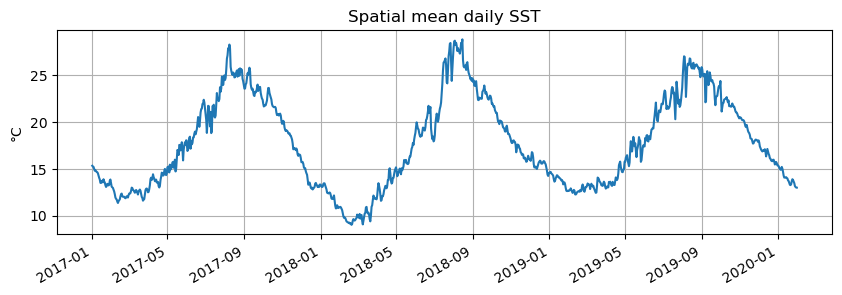

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 이미 이전에 만든 daily 텐서
# tnsr_daily: (nY, nX, nD)
# D: DatetimeIndex 길이 nD
# 없다면 먼저 build_daily_tensor(...) 셀 실행

nY, nX, nD = tnsr_daily.shape
print("tnsr_daily shape:", tnsr_daily.shape)

# 1) 공간 평균 daily SST (NaN 제외)
ref_series = np.nanmean(tnsr_daily, axis=(0, 1))  # shape: (nD,)

# 2) Pandas Series로 변환
ref = pd.Series(ref_series, index=D)
ref.name = "SST_mean"

print(ref.head())
ref.plot(figsize=(10,3))
plt.title("Spatial mean daily SST")
plt.ylabel("°C")
plt.grid(True)
plt.show()


ADF stat (원시계열): -2.5585886711225565
p-value: 0.10186170417505547


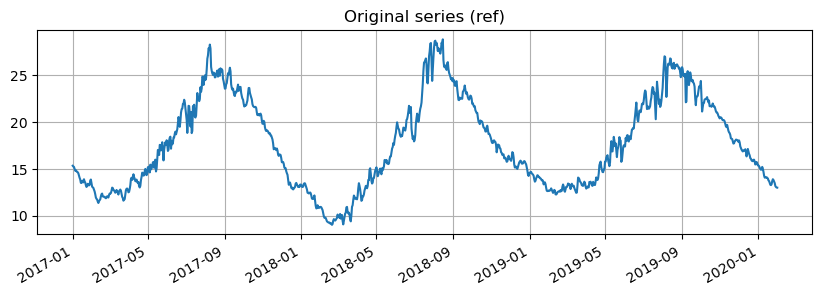

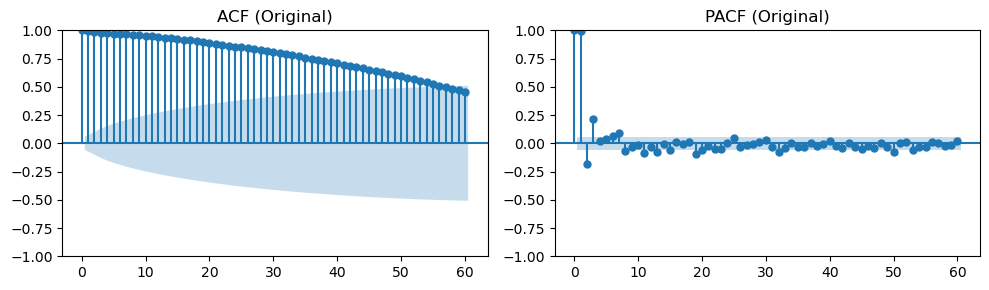

In [16]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# 원시계열 ADF (단위근 검정)
res_adf = adfuller(ref.dropna())
print("ADF stat (원시계열):", res_adf[0])
print("p-value:", res_adf[1])

plt.figure(figsize=(10,3))
ref.plot()
plt.title("Original series (ref)")
plt.grid(True)
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(10,3))
plot_acf(ref.dropna(), lags=60, ax=axes[0])
axes[0].set_title("ACF (Original)")
plot_pacf(ref.dropna(), lags=60, ax=axes[1])
axes[1].set_title("PACF (Original)")
plt.tight_layout()
plt.show()


ADF stat (1차 차분): -4.721397806947712
p-value: 7.669949015632137e-05


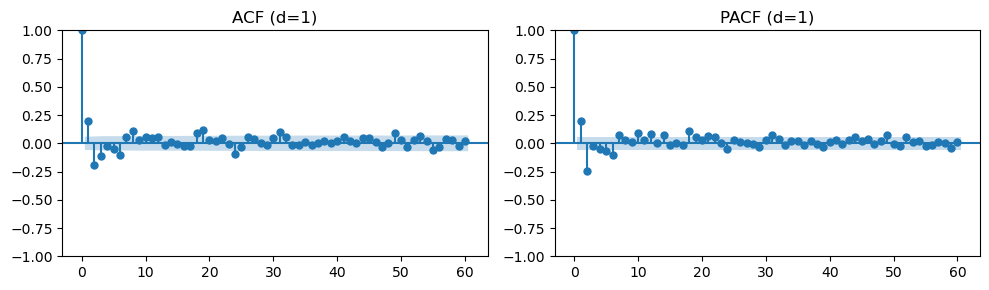

In [17]:
ref_d1 = ref.diff().dropna()

res_adf_d1 = adfuller(ref_d1)
print("ADF stat (1차 차분):", res_adf_d1[0])
print("p-value:", res_adf_d1[1])

fig, axes = plt.subplots(1, 2, figsize=(10,3))
plot_acf(ref_d1, lags=60, ax=axes[0])
axes[0].set_title("ACF (d=1)")
plot_pacf(ref_d1, lags=60, ax=axes[1])
axes[1].set_title("PACF (d=1)")
plt.tight_layout()
plt.show()


In [18]:
from statsmodels.tsa.stattools import acf, pacf

def suggest_arima_order(series, max_p=3, max_q=3, d_max=2, nlags=40):
    """
    한 시계열(series)에 대해 간단히 ARIMA(p,d,q) 추천
    - d: ADF test 기반으로 0..d_max 중 최소
    - p: PACF에서 유의한 lag (1..max_p) 중 가장 큰 것
    - q: ACF 에서 유의한 lag (1..max_q) 중 가장 큰 것
    """
    s = pd.Series(series).dropna()
    
    # --- d 결정 ---
    d = 0
    for dd in range(d_max+1):
        if dd > 0:
            s_d = s.diff(dd).dropna()
        else:
            s_d = s.copy()
        adf_stat, pval, *_ = adfuller(s_d)
        if pval < 0.05:
            d = dd
            s_used = s_d
            print(f"선택된 d={d}, ADF p-value={pval:.4g}")
            break
    else:
        d = d_max
        s_used = s.diff(d).dropna()
        print(f"강제로 d={d_max} 사용 (ADF 유의X)")
    
    # --- ACF/PACF ---
    n = len(s_used)
    lag_acf  = acf(s_used, nlags=nlags, fft=True)
    lag_pacf = pacf(s_used, nlags=nlags, method="ywm")

    # 유의성 기준 (대략 ±1.96/√N)
    thresh = 1.96 / np.sqrt(n)
    
    # p: PACF에서 |pacf(k)| > thresh 인 k (1..max_p) 중 가장 큰 k
    p = 0
    for k in range(1, max_p+1):
        if abs(lag_pacf[k]) > thresh:
            p = k
    # q: ACF에서 |acf(k)| > thresh 인 k (1..max_q) 중 가장 큰 k
    q = 0
    for k in range(1, max_q+1):
        if abs(lag_acf[k]) > thresh:
            q = k
    
    print(f"추천 ARIMA(p,d,q) ≈ ({p},{d},{q})")
    return p, d, q, (lag_acf, lag_pacf, thresh)


In [19]:
p_hat, d_hat, q_hat, _ = suggest_arima_order(ref_series, max_p=3, max_q=3, d_max=2, nlags=40)
print("최종 추천:", (p_hat, d_hat, q_hat))


선택된 d=1, ADF p-value=7.67e-05
추천 ARIMA(p,d,q) ≈ (2,1,3)
최종 추천: (2, 1, 3)


In [20]:
def suggest_sarima_order(
    series,
    m=7,
    max_p=2, max_q=2,
    max_P=1, max_Q=1,
    d_max=2, D_max=1,
    nlags=60
):
    """
    간단 SARIMA 차수 추천:
    - 비계절 d: ADF 기반 0..d_max
    - 계절 D: 0 또는 1 (ADF)
    - 비계절 p,q: ACF/PACF (lag 1..max_p, 1..max_q)
    - 계절 P,Q: ACF/PACF (lag m, 2m.. 중 max_P, max_Q 범위)
    """
    s = pd.Series(series).dropna()

    # --- d 결정 ---
    d = 0
    for dd in range(d_max+1):
        if dd > 0:
            s_d = s.diff(dd).dropna()
        else:
            s_d = s.copy()
        pval = adfuller(s_d)[1]
        if pval < 0.05:
            d = dd
            s_used = s_d
            print(f"[SARIMA] 선택된 d={d}, p-value={pval:.4g}")
            break
    else:
        d = d_max
        s_used = s.diff(d).dropna()
        print(f"[SARIMA] 강제로 d={d_max} 사용")

    # --- D 결정 (0 또는 1) ---
    D = 0
    s_seas_used = s_used.copy()
    pval0 = adfuller(s_seas_used.dropna())[1]
    print(f"[SARIMA] D=0 가정 ADF p-value={pval0:.4g}")

    if D_max >= 1:
        s_seas1 = s_used.diff(m).dropna()
        pval1 = adfuller(s_seas1.dropna())[1]
        print(f"[SARIMA] D=1 가정 ADF p-value={pval1:.4g}")
        if pval1 < pval0:
            D = 1
            s_seas_used = s_seas1
            print(f"[SARIMA] D=1 선택")
        else:
            print(f"[SARIMA] D=0 유지")

    # --- ACF/PACF 계산 ---
    n = len(s_seas_used)
    lag_acf  = acf(s_seas_used, nlags=nlags, fft=True)
    lag_pacf = pacf(s_seas_used, nlags=nlags, method="ywm")
    thresh = 1.96 / np.sqrt(n)

    # 비계절 p,q
    p = 0
    for k in range(1, max_p+1):
        if abs(lag_pacf[k]) > thresh:
            p = k
    q = 0
    for k in range(1, max_q+1):
        if abs(lag_acf[k]) > thresh:
            q = k

    # 계절 P,Q (lag m, 2m, ...)
    P = 0
    Q = 0
    for r in range(1, max_P+1):
        k = r * m
        if k <= nlags and abs(lag_pacf[k]) > thresh:
            P = r
    for r in range(1, max_Q+1):
        k = r * m
        if k <= nlags and abs(lag_acf[k]) > thresh:
            Q = r

    print(f"추천 SARIMA(p,d,q)x(P,D,Q)_m ≈ ({p},{d},{q})x({P},{D},{Q})_{m}")
    return (p, d, q), (P, D, Q)


In [21]:
(p_s, d_s, q_s), (P_s, D_s, Q_s) = suggest_sarima_order(
    ref_series,
    m=7,
    max_p=2, max_q=2,
    max_P=1, max_Q=1,
    d_max=2, D_max=1,
    nlags=60
)
print("최종 추천 SARIMA:", (p_s,d_s,q_s), (P_s,D_s,Q_s,7))


[SARIMA] 선택된 d=1, p-value=7.67e-05
[SARIMA] D=0 가정 ADF p-value=7.67e-05
[SARIMA] D=1 가정 ADF p-value=4.328e-19
[SARIMA] D=1 선택
추천 SARIMA(p,d,q)x(P,D,Q)_m ≈ (2,1,2)x(1,1,1)_7
최종 추천 SARIMA: (2, 1, 2) (1, 1, 1, 7)
